In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
import numpy as np
import math
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.feature as cf
from matplotlib.pyplot import figure
import glob
from numpy.linalg import norm
from skspatial.objects import Line
from pyproj import Proj, transform 
from cartopy.io.img_tiles import Stamen
import warnings
warnings.filterwarnings("ignore")

In [270]:
from sklearn.feature_selection import SelectPercentile
from scipy import stats
from sklearn.metrics import roc_curve
from sklearn.model_selection import cross_validate, KFold, cross_val_predict, train_test_split, cross_val_score
from sklearn import preprocessing, svm
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import mutual_info_regression
import sklearn.metrics as metrics
from pprint import pprint
from tabulate import tabulate

In [3]:
from pprint import pprint
from matplotlib.backends.backend_pdf import PdfPages

In [4]:
# Introducir datos del alumno y del ejercicio.
alumno="Nombre del alumno evaluado"
ejercicio="Entrada diurna en Ferrol"
fecha="10/01/23"

lista_encabezado=[[alumno,ejercicio,fecha]]

encabezado_df=pd.DataFrame(list(lista_encabezado), 
               columns =['Alumno', 'Ejercicio','Fecha']) 

display(encabezado_df)

,Alumno,Ejercicio,Fecha
0,Nombre del alumno evaluado,Entrada diurna en Ferrol,10/01/23


In [5]:
# Cargar los datos resgistrados del barco principal.
datos_sim1=pd.read_csv("barco_propio/FERROL 13 DIC 22F102 JUAN DE BORBON_1.txt", delimiter=',')

In [6]:
# Mostrar el dataset de los datos resgistrados del barco principal.
display(datos_sim1)

,Posicion,Rumbo,Heading,Velocidad,Timon Sol,Timon,RPMBabor,RPMEst,MilisegundosDesdeInicio,DistanciaFondoProa,Unnamed: 10
0,43.43344813 -8.379866314,163.229111,89.943039,0.532111,1.974934,1.974934,23.210497,46.591110,47000,56.061119,NaN
1,43.43344813 -8.379866314,163.229111,89.943039,0.532111,1.974934,1.974934,23.210497,46.591110,47000,56.061119,NaN
2,43.43344674 -8.379865719,162.362823,89.892136,0.529203,1.974934,1.974934,34.827740,46.591110,48000,56.064381,NaN
3,43.43344674 -8.379865719,162.362823,89.892136,0.529203,1.974934,1.974934,34.827740,46.591110,48000,56.064381,NaN
4,43.43344674 -8.379865719,162.362823,89.892136,0.529203,1.974934,1.974934,34.827740,46.591110,48000,56.064381,NaN
...,...,...,...,...,...,...,...,...,...,...,...
4481,43.46807173 -8.237530374,72.231934,68.671127,2.158136,40.000000,35.000000,46.092209,48.074501,2321000,8.875532,NaN
4482,43.46807898 -8.237499006,72.134415,68.435944,2.152582,40.000000,35.000000,46.089283,48.074501,2322000,8.853428,NaN
4483,43.46807898 -8.237499006,72.134415,68.435944,2.152582,40.000000,35.000000,46.089283,48.074501,2322000,8.853428,NaN
4484,43.46808625 -8.237467723,72.031921,68.192619,2.147051,40.000000,35.000000,46.087048,48.074501,2323000,8.838032,NaN


In [7]:
# Ordenar el dataset según la columna que marca el tiempo.
datos_sim1 = datos_sim1.sort_values('MilisegundosDesdeInicio')

In [8]:
# Dividir la posición en latitud y longitud y pasar la velocidad a nudos.
def split_lat(posicion):
    index=0
    if ' ' in posicion:
        index = posicion.index(' ')
        return float(posicion[:index])

def split_lat_c(posicion):
    index=0
    if ' ' in posicion:
        index = posicion.index(' ')
        return round(float(posicion[:index]),6)

def split_lon(posicion):
    index=0
    if ' ' in posicion:
        index = posicion.index(' ')
        return float(posicion[index:])

def split_lon_c(posicion):
    index=0
    if ' ' in posicion:
        index = posicion.index(' ')
        return round(float(posicion[index:]),6)

def veloc_nudos(dato):
    
    speed=dato*1.944
    return speed

# crear nueva columna 'Latitud'.
datos_sim1['Latitud'] = datos_sim1['Posicion'].apply(split_lat)

# crear nueva columna 'Longitud'
datos_sim1['Longitud'] = datos_sim1['Posicion'].apply(split_lon)

# pasar velocidad a nudos.
datos_sim1['Velocidad'] = datos_sim1['Velocidad'].apply(veloc_nudos)

display(datos_sim1.head(2))

,Posicion,Rumbo,Heading,Velocidad,Timon Sol,Timon,RPMBabor,RPMEst,MilisegundosDesdeInicio,DistanciaFondoProa,Unnamed: 10,Latitud,Longitud
0,43.43344813 -8.379866314,163.229111,89.943039,1.034424,1.974934,1.974934,23.210497,46.59111,47000,56.061119,NaN,43.433448,-8.379866
1,43.43344813 -8.379866314,163.229111,89.943039,1.034424,1.974934,1.974934,23.210497,46.59111,47000,56.061119,NaN,43.433448,-8.379866


In [9]:
#Eliminar las columnas no necesarias.
datos_sim1=datos_sim1.drop(['Posicion','Timon Sol','Timon',"RPMBabor","RPMEst",'Unnamed: 10'], axis=1)
display(datos_sim1.head())

,Rumbo,Heading,Velocidad,MilisegundosDesdeInicio,DistanciaFondoProa,Latitud,Longitud
0,163.229111,89.943039,1.034424,47000,56.061119,43.433448,-8.379866
1,163.229111,89.943039,1.034424,47000,56.061119,43.433448,-8.379866
2,162.362823,89.892136,1.028771,48000,56.064381,43.433447,-8.379866
3,162.362823,89.892136,1.028771,48000,56.064381,43.433447,-8.379866
4,162.362823,89.892136,1.028771,48000,56.064381,43.433447,-8.379866


In [10]:
#Eliminar los resgistros duplicados.
print(len(datos_sim1))
datos_sim=datos_sim1.drop_duplicates()
print(len(datos_sim))

4486
2060


In [11]:
# Añadir unos index progresivos tras la eliminación de los resgistros duplicados.
datos_sim.index=[list(range(0,len(datos_sim)))]
display(datos_sim)

,Rumbo,Heading,Velocidad,MilisegundosDesdeInicio,DistanciaFondoProa,Latitud,Longitud
0,163.229111,89.943039,1.034424,47000,56.061119,43.433448,-8.379866
1,162.362823,89.892136,1.028771,48000,56.064381,43.433447,-8.379866
2,161.450989,89.847237,1.023123,49000,55.720085,43.433445,-8.379865
3,161.450989,89.808243,1.016854,50000,55.720085,43.433444,-8.379864
4,159.128754,89.774918,1.009813,51000,55.721714,43.433443,-8.379864
...,...,...,...,...,...,...,...
2055,72.410980,69.113510,4.217156,2319000,8.928340,43.468057,-8.237593
2056,72.324181,68.897301,4.206268,2320000,8.890908,43.468065,-8.237562
2057,72.231934,68.671127,4.195416,2321000,8.875532,43.468072,-8.237530
2058,72.134415,68.435944,4.184619,2322000,8.853428,43.468079,-8.237499


In [12]:
# Calcular la v e l o c i d a d _ e f e c t i v a. 

In [13]:
# Datos de la corriente a utilizar.
rbo_corriente=90
v_corriente=0.5

In [14]:
# crear la nueva collumna de velocidad efectica mediante la suma de las compenentes (x,y) del movimiento del barco sobre el agua
# y la corriente.
datos_sim['Velocidad_efectiva']=[0.0]*len(datos_sim)
velocidades_efectivas=[]
for i in range(0,len(datos_sim)):
    x_corriente=v_corriente*math.sin(rbo_corriente*math.pi/180)
    y_corriente=v_corriente*math.cos(rbo_corriente*math.pi/180)
    x_barco=datos_sim['Velocidad'][i]*math.sin(datos_sim['Heading'][i]*math.pi/180)
    y_barco=datos_sim['Velocidad'][i]*math.cos(datos_sim['Heading'][i]*math.pi/180)
    
    x_v=(x_corriente+x_barco)
    y_v=y_corriente+y_barco
    
    velocidad_efectiva=(x_v**2+y_v**2)**(1/2)
    
    velocidades_efectivas.append(velocidad_efectiva)

datos_sim['Velocidad_efectiva']=velocidades_efectivas

In [15]:
# Comprobar la creación de la columna "Velocidad_efectiva"
display(datos_sim)

,Rumbo,Heading,Velocidad,MilisegundosDesdeInicio,DistanciaFondoProa,Latitud,Longitud,Velocidad_efectiva
0,163.229111,89.943039,1.034424,47000,56.061119,43.433448,-8.379866,1.534424
1,162.362823,89.892136,1.028771,48000,56.064381,43.433447,-8.379866,1.528770
2,161.450989,89.847237,1.023123,49000,55.720085,43.433445,-8.379865,1.523122
3,161.450989,89.808243,1.016854,50000,55.720085,43.433444,-8.379864,1.516852
4,159.128754,89.774918,1.009813,51000,55.721714,43.433443,-8.379864,1.509810
...,...,...,...,...,...,...,...,...
2055,72.410980,69.113510,4.217156,2319000,8.928340,43.468057,-8.237593,4.687691
2056,72.324181,68.897301,4.206268,2320000,8.890908,43.468065,-8.237562,4.676202
2057,72.231934,68.671127,4.195416,2321000,8.875532,43.468072,-8.237530,4.664717
2058,72.134415,68.435944,4.184619,2322000,8.853428,43.468079,-8.237499,4.653253


In [16]:
# Comprobar la indormación del dataframe para ver si hay datos nan o incorrectos.
datos_sim.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 2060 entries, (0,) to (2059,)
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Rumbo                    2060 non-null   float64
 1   Heading                  2060 non-null   float64
 2   Velocidad                2060 non-null   float64
 3   MilisegundosDesdeInicio  2060 non-null   int64  
 4   DistanciaFondoProa       2060 non-null   float64
 5   Latitud                  2060 non-null   float64
 6   Longitud                 2060 non-null   float64
 7   Velocidad_efectiva       2060 non-null   float64
dtypes: float64(7), int64(1)
memory usage: 213.4 KB


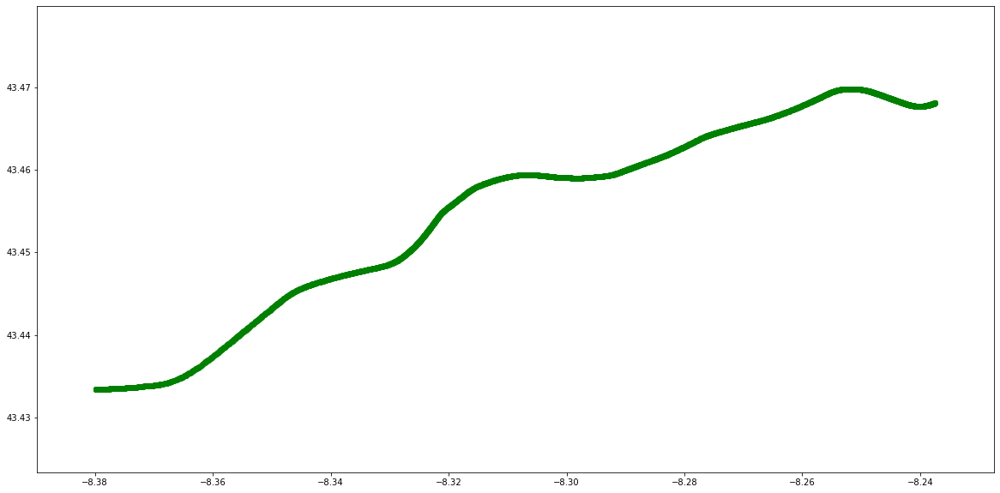

In [17]:
# Previsualizar la derrota en un eje x-y sin usar proyección mercator.
x0=list(datos_sim["Longitud"])
y0=list(datos_sim["Latitud"])

x1=list(datos_sim["Longitud"])
y1=list(datos_sim["Latitud"])

fig,axis = plt.subplots(1,1)
axis.plot(x0, y0,"go")

axis.set_ylim(np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01)
axis.set_xlim(np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01)
fig.set_size_inches(20, 10)
plt.show()

In [18]:
#Introducir datos de la derrota a seguir.

# Indicar por medio de dos waypoints la parte de la derrota que no será evaluada en cuando a la precisón de la navegación,
# Pero si en cuanto a las sondas y CPA.
y_derrota_pre=[43.43344813,43+26.7/60]
x_derrota_pre=[-8.379866314,-8-20.8/60]

# Incluir los waypoints de la derrota de aguas restringidas y/o libres a evaluar.
y_derrota=[43+26.7/60,43+26.891/60, 43+27.446/60,
             43+27.554/60, 43+27.836/60, 43+27.924/60, 43+28.171/60,
             43+28.073/60]
x_derrota=[-8-20.8/60,-8-19.715/60,-8-19.206/60,
             -8-17.439/60,-8-16.613/60, -8-16.155/60, -8-15.378/60,-8-14.304/60]

# Calcular los rumbos de la derrota en base a los waypoints en grados.
r_derrota=[]
for i in range(0,len(y_derrota)-1):
    rumbo=math.atan(((x_derrota[i+1]-x_derrota[i])*math.cos((np.mean(y_derrota))*(math.pi)/180))/
                    ((y_derrota[i+1]-y_derrota[i])+0.0000000000000001))
    r_derrota.append(rumbo*180/math.pi)

# Calcular numero de tramos de la derrota evaluada.
num_tramos_derrota= len(y_derrota)-1

# Calcular los rumbos de la derrota en base a los waypoints en radianes.
r_derrota_rad=[]
for rumbo in r_derrota:
    rumbo_rad=rumbo*(math.pi)/180
    r_derrota_rad.append(rumbo_rad)

# Calcular los rumbos de la derrota no evaluada en base a los waypoints en grados.
r_derrota_pre=[]
for i in range(0,len(y_derrota_pre)-1):
    rumbo=math.atan(((x_derrota_pre[i+1]-x_derrota_pre[i])*math.cos((np.mean(y_derrota_pre))*(math.pi)/180))/
                    ((y_derrota_pre[i+1]-y_derrota_pre[i])+0.0000000000000001))
    r_derrota_pre.append(rumbo*180/math.pi)

# Calcular los rumbos de la derrota no evaluada en base a los waypoints en grados.
r_derrota_pre_rad=[]
for rumbo in r_derrota_pre:
    rumbo_rad=rumbo*(math.pi)/180
    r_derrota_pre_rad.append(rumbo_rad)
    
# Calcular numero de tramos de la derrota no evaluada.
num_tramos_derrota_pre= len(y_derrota_pre)-1

In [19]:
#Comprobar los rumbos calculados en la derrota evaluada y la no evaluada.
print(r_derrota)
print(r_derrota_pre)

[76.36772433236989, 33.651647712069554, 85.186801776336, 64.81030055649465, 75.17349369142552, 66.34905237983803, -82.83494649861964]
[64.39609947807408]


In [20]:
#Corregir los rumbos calculados en caso de haya valores negativos.

#En la derrota evaluada.
rumbos_derrota=[]
for i in range(0,len(r_derrota)):
    if r_derrota[i]>=0:
        rumbos_derrota.append(round(r_derrota[i],6))
    else:
        rumbos_derrota.append(round(r_derrota[i]+360,6))

#En la derrota no evaluada.
rumbos_derrota_pre=[]
for i in range(0,len(r_derrota_pre)):
    if r_derrota_pre[i]>=0:
        rumbos_derrota_pre.append(round(r_derrota_pre[i],6))
    else:
        rumbos_derrota_pre.append(round(r_derrota_pre[i]+360,6))
        
#Comprobar los rumbos calculados en la derrota evaluada y la no evaluada, corregidos en caso necesario.
print(rumbos_derrota)
print(rumbos_derrota_pre)

[76.367724, 33.651648, 85.186802, 64.810301, 75.173494, 66.349052, 277.165054]
[64.396099]


In [21]:
# Comprobar el número de tramos de la derrota evaluada y no valuada.
print(num_tramos_derrota)
print(num_tramos_derrota_pre)

7
1


In [22]:
# Crear un dataframe con los waypoints de la derrota evaluada.
waypoints_df=pd.DataFrame(list(zip(x_derrota, y_derrota)), 
               columns =['Longitud', 'Latitud']) 
display(waypoints_df)

,Longitud,Latitud
0,-8.346667,43.445000
1,-8.328583,43.448183
2,-8.320100,43.457433
3,-8.290650,43.459233
4,-8.276883,43.463933
5,-8.269250,43.465400
6,-8.256300,43.469517
7,-8.238400,43.467883


In [23]:
#Generar la derrota evaluada en forma de puntos consecutivos en base  a los waypoints y rumbos calculados.
#Tiene en cuenta los rumbos en ambos sentidos, si los wp está mas al N/S o al E/W.
x_derrota_gen=[]
y_derrota_gen=[]
tramos=[]
lista_tramos=[0]
for i in range(0,num_tramos_derrota):
    lista_tramos.append([i+1,(x_derrota[i],y_derrota[i]),(x_derrota[i+1],y_derrota[i+1])])
    x_gen=x_derrota[i]
    if x_derrota[i+1] > x_derrota[i]:
        for x in np.arange(x_derrota[i], x_derrota[i+1], 0.0001):
            y_gen=y_derrota[i]
            x_gen=x
            y_gen+=((x-x_derrota[i])/math.tan(r_derrota_rad[i]))*math.cos((np.mean(y_derrota))*(math.pi)/180)
            x_derrota_gen.append(round(x_gen,6))
            y_derrota_gen.append(round(y_gen,6))
            tramos.append(i+1)
        if x_derrota[i] not in x_derrota_gen: 
            x_derrota_gen.append(round(x_derrota[i],6))
            y_derrota_gen.append(round(y_derrota[i],6))
            tramos.append(i+1)
            
    elif x_derrota[i+1] == x_derrota[i]:
        if y_derrota[i+1] > y_derrota[i]:
            for y in np.arange(y_derrota[i], y_derrota[i+1], 0.0001):
                y_gen=y_derrota[i]
                x_gen=x_derrota[i]
                y_gen+=y-y_derrota[i]
                x_derrota_gen.append(round(x_gen,6))
                y_derrota_gen.append(round(y_gen,6))   
                tramos.append(i+1)
            if x_derrota[i] not in x_derrota_gen: 
                x_derrota_gen.append(round(x_derrota[i],6))
                y_derrota_gen.append(round(y_derrota[i],6))
                tramos.append(i+1)
        else:
            for y in np.arange(y_derrota[i+1], y_derrota[i], 0.0001):
                y_gen=y_derrota[i+1]
                x_gen=x_derrota[i]
                y_gen+=y-y_derrota[i+1]
                x_derrota_gen.append(round(x_gen,6))
                y_derrota_gen.append(round(y_gen,6))
                tramos.append(i+1)
            if x_derrota[i] not in x_derrota_gen: 
                x_derrota_gen.append(round(x_derrota[i],6))
                y_derrota_gen.append(round(y_derrota[i],6))
                tramos.append(i+1)
    else: 
        for x in np.arange(x_derrota[i+1], x_derrota[i], 0.0001):
            y_gen=y_derrota[i+1]
            x_gen=x
            y_gen+=((x-x_derrota[i+1])/math.tan(r_derrota_rad[i]))*math.cos((np.mean(y_derrota))*(math.pi)/180)
            x_derrota_gen.append(round(x_gen,6))
            y_derrota_gen.append(round(y_gen,6))     
            tramos.append(i+1)
        if x_derrota[i] not in x_derrota_gen: 
            x_derrota_gen.append(round(x_derrota[i],6))
            y_derrota_gen.append(round(y_derrota[i],6))
            tramos.append(i+1)
    

In [24]:
#Generar la derrota no evaluada en forma de puntos consecutivos en base  a los waypoints y rumbos calculados.
#Tiene en cuenta los rumbos en ambos sentidos, si los wp está mas al N/S o al E/W.
x_derrota_pre_gen=[]
y_derrota_pre_gen=[]
tramos_pre=[]
lista_tramos_pre=[]
if len(y_derrota_pre)>0:  
    for i in range(0,num_tramos_derrota_pre):
        lista_tramos_pre.append([i,(x_derrota_pre[i],y_derrota_pre[i]),(x_derrota_pre[i+1],y_derrota_pre[i+1])])
        x_gen=x_derrota_pre[i]
        if x_derrota_pre[i+1] > x_derrota_pre[i]:
            for x in np.arange(x_derrota_pre[i], x_derrota_pre[i+1], 0.0001):
                y_gen=y_derrota_pre[i]
                x_gen=x
                y_gen+=((x-x_derrota_pre[i])/math.tan(r_derrota_pre_rad[i]))*math.cos((np.mean(y_derrota_pre))*(math.pi)/180)
                x_derrota_pre_gen.append(round(x_gen,6))
                y_derrota_pre_gen.append(round(y_gen,6))
                tramos_pre.append(i)
            if x_derrota_pre[i] not in x_derrota_pre_gen: 
                x_derrota_pre_gen.append(round(x_derrota_pre[i],6))
                y_derrota_pre_gen.append(round(y_derrota_pre[i],6))
                tramos_pre.append(i)

        elif x_derrota_pre[i+1] == x_derrota_pre[i]:
            if y_derrota_pre[i+1] > y_derrota_pre[i]:
                for y in np.arange(y_derrota_pre[i], y_derrota_pre[i+1], 0.0001):
                    y_gen=y_derrota_pre[i]
                    x_gen=x_derrota_pre[i]
                    y_gen+=y-y_derrota_pre[i]
                    x_derrota_pre_gen.append(round(x_gen,6))
                    y_derrota_pre_gen.append(round(y_gen,6))   
                    tramos_pre.append(i)
                if x_derrota_pre[i] not in x_derrota_pre_gen: 
                    x_derrota_pre_gen.append(round(x_derrota_pre[i],6))
                    y_derrota_pre_gen.append(round(y_derrota_pre[i],6))
                    tramos_pre.append(i)
            else:
                for y in np.arange(y_derrota_pre[i+1], y_derrota_pre[i], 0.0001):
                    y_gen=y_derrota_pre[i+1]
                    x_gen=x_derrota_pre[i]
                    y_gen+=y-y_derrota_pre[i+1]
                    x_derrota_pre_gen.append(round(x_gen,6))
                    y_derrota_pre_gen.append(round(y_gen,6))
                    tramos_pre.append(i)
                if x_derrota_pre[i] not in x_derrota_pre_gen: 
                    x_derrota_pre_gen.append(round(x_derrota_pre[i],6))
                    y_derrota_pre_gen.append(round(y_derrota_pre[i],6))
                    tramos_pre.append(i)
        else: 
            for x in np.arange(x_derrota_pre[i+1], x_derrota_pre[i], 0.0001):
                y_gen=y_derrota_pre[i+1]
                x_gen=x
                y_gen+=((x-x_derrota_pre[i+1])/math.tan(r_derrota_pre_rad[i]))*math.cos((np.mean(y_derrota_pre))*(math.pi)/180)
                x_derrota_pre_gen.append(round(x_gen,6))
                y_derrota_pre_gen.append(round(y_gen,6))     
                tramos_pre.append(i)
            if x_derrota_pre[i] not in x_derrota_pre_gen: 
                x_derrota_pre_gen.append(round(x_derrota_pre[i],6))
                y_derrota_pre_gen.append(round(y_derrota_pre[i],6))
                tramos_pre.append(i)

In [25]:
#Comrobar si hay un tramo no evaluado y si está bien.
print(lista_tramos_pre)

[[0, (-8.379866314, 43.43344813), (-8.346666666666668, 43.445)]]


In [26]:
# Reducir el numero de puntos de la rerrota realizada (track) por el alumno para algoritmo posterior DBSCAN.
x_track_gen_1=[]
y_track_gen_1=[]
time_xy_track_gen_1=[]
for index in range(0,len(datos_sim.index),25):
    x_track_gen_1.append(round(datos_sim["Longitud"][index],6))
    y_track_gen_1.append(round(datos_sim["Latitud"][index],6))
    time_xy_track_gen_1.append(datos_sim["MilisegundosDesdeInicio"][index])

track_lab=[1]*len(x_track_gen_1)    

track_gen_df_1 = pd.DataFrame(list(zip(x_track_gen_1, y_track_gen_1,time_xy_track_gen_1,track_lab)), 
               columns =['Longitud', 'Latitud',"MilisegundosDesdeInicio","Label"])

track_gen_df_1=track_gen_df_1.drop_duplicates(subset=["Longitud"])
track_gen_df_1.index=[list(range(0,len(track_gen_df_1)))]
display(track_gen_df_1)
print(len(x_track_gen_1))

,Longitud,Latitud,MilisegundosDesdeInicio,Label
0,-8.379866,43.433448,47000,1
1,-8.379839,43.433418,75000,1
2,-8.379421,43.433403,101000,1
3,-8.377730,43.433482,129000,1
4,-8.375911,43.433514,155000,1
...,...,...,...,...
78,-8.241335,43.467780,2210000,1
79,-8.240381,43.467700,2236000,1
80,-8.239463,43.467720,2262000,1
81,-8.238592,43.467838,2288000,1


83


In [27]:
# Reducir el numero de puntos de la rerrota realizada (track) por el alumno para algoritmo posterior DBSCAN.
#función para la disancia entre dos puntos.
def distancia_c(A, B):
    dis= ((((A[1]-B[1])**2+(((A[0]-B[0]))*(math.cos((np.mean(y_derrota))*(math.pi)/180)))**2))**(1/2))*2000*60
    return dis

x_track_gen_dbi=[]
y_track_gen_dbi=[]
time_xy_track_gen_dbi=[]
for i in range(0,len(datos_sim.index)):
    if i==0:
        x_track_gen_dbi.append(round(datos_sim["Longitud"][i],6))
        y_track_gen_dbi.append(round(datos_sim["Latitud"][i],6))

        time_xy_track_gen_dbi.append(datos_sim["MilisegundosDesdeInicio"][i])
        
    if distancia_c((x_track_gen_dbi[-1],y_track_gen_dbi[-1]),(round(datos_sim["Longitud"][i],6),round(datos_sim["Latitud"][i],6)))>100:
        x_track_gen_dbi.append(round(datos_sim["Longitud"][i],6))
        y_track_gen_dbi.append(round(datos_sim["Latitud"][i],6))

        time_xy_track_gen_dbi.append(datos_sim["MilisegundosDesdeInicio"][i])

track_lab=[1]*len(x_track_gen_dbi)    

track_gen_df_dbi = pd.DataFrame(list(zip(x_track_gen_dbi, y_track_gen_dbi,time_xy_track_gen_dbi,track_lab)), 
               columns =['Longitud', 'Latitud',"MilisegundosDesdeInicio","Label"])

track_gen_df_dbi=track_gen_df_dbi.drop_duplicates(subset=["Longitud"])
track_gen_df_dbi.index=[list(range(0,len(track_gen_df_dbi)))]
display(track_gen_df_dbi)
print(len(x_track_gen_dbi))

,Longitud,Latitud,MilisegundosDesdeInicio,Label
0,-8.379866,43.433448,47000,1
1,-8.378694,43.433402,115000,1
2,-8.377509,43.433494,132000,1
3,-8.376337,43.433514,149000,1
4,-8.375122,43.433568,165000,1
...,...,...,...,...
126,-8.242847,43.468083,2170000,1
127,-8.241746,43.467844,2199000,1
128,-8.240598,43.467710,2230000,1
129,-8.239428,43.467723,2263000,1


131


In [28]:
# Dataframe con la derrota realizada (track) completa, sin reducir los puntos.
x_track_gen=[]
y_track_gen=[]
time_xy_track_gen=[]
for index in range(0,len(datos_sim.index)):
    x_track_gen.append(round(datos_sim["Longitud"][index],6))
    y_track_gen.append(round(datos_sim["Latitud"][index],6))
    time_xy_track_gen.append(datos_sim["MilisegundosDesdeInicio"][index])

track_lab=[1]*len(x_track_gen)    

track_gen_df = pd.DataFrame(list(zip(x_track_gen, y_track_gen,time_xy_track_gen,track_lab)), 
               columns =['Longitud', 'Latitud',"MilisegundosDesdeInicio","Label"])

display(track_gen_df)
print(len(x_track_gen))

,Longitud,Latitud,MilisegundosDesdeInicio,Label
0,-8.379866,43.433448,47000,1
1,-8.379866,43.433447,48000,1
2,-8.379865,43.433445,49000,1
3,-8.379864,43.433444,50000,1
4,-8.379864,43.433443,51000,1
...,...,...,...,...
2055,-8.237593,43.468057,2319000,1
2056,-8.237562,43.468065,2320000,1
2057,-8.237530,43.468072,2321000,1
2058,-8.237499,43.468079,2322000,1


2060


In [29]:
# Lista a modo de base de datos de balizas reales(t) y virtuales(v).
# Rojas si quedan a babor en el sentido de entrada.
# Verdes si quedan a estribor en el sentido de entrada.

#Rojas unidas reales y virtuales.
y_rojas_ferrol=[43+(27.204/60), 43+(27.603/60), 43+(27.598/60), 43+(27.794/60), 43+(27.986/60), 43+(27.981/60),
               43+(28.015/60),43+(28.180/60),43+(28.425/60),43+(28.737/60),43+(28.767/60),43+(28.574/60),
               43+(28.430/60),43+(28.459/60)]
x_rojas_ferrol=[-8-(19.801/60),-8-(17.87/60), -8-(17.56/60), -8-(16.912/60), -8-(16.628/60), -8-(16.228/60),
               -8-(16.031/60),-8-(15.851/60),-8-(15.528/60),-8-(15.339/60),-8-(15.147/60),-8-(14.909/60),
               -8-(14.412/60),-8-(14.3326/60)]
#Rojas solo virtuales.
y_rojas_v_ferrol=[43+(27.918/60), 43+(27.88/60), 43+(27.8762/60)]
x_rojas_v_ferrol=[-8-(19.143/60), -8-(18.279/60), -8-(17.125/60)]

#Verdes unidas reales y virtuales.
y_verdes_ferrol=[43+(26.619/60), 43+(27.413/60), 43+(27.629/60), 43+(27.841/60), 43+(27.891/60),
               43+(27.884/60),43+(28.074/60),43+(27.818/60),43+(27.761/60),43+(28.284/60),43+(28.511/60)]
x_verdes_ferrol=[-8-(19.898/60),-8-(18.802/60), -8-(17.03/60), -8-(16.461/60), -8-(16.159/60),-8-(15.723/60),
                 -8-(15.286/60),-8-(14.600/60),-8-(13.889/60),-8-(13.974/60),-8-(14.166/60)]
#Verdes solo virtuales.
y_verdes_v_ferrol=[43+(26.909/60),43+(27.407/60), 43+(27.377/60), 43+(27.437/60), 43+(27.636/60), 43+(27.776/60)]
x_verdes_v_ferrol=[-8-(19.164/60),-8-(18.356/60), -8-(17.87/60), -8-(17.526/60), -8-(16.751/60),-8-(15.948/60)]

#Rojas solo reales.
y_rojas_t_ferrol=[43+(27.204/60), 43+(27.918/60),43+(27.88/60),43+(27.603/60), 43+(27.598/60),43+(27.8762/60), 43+(27.794/60), 
                  43+(27.986/60), 43+(27.981/60),
               43+(28.015/60),43+(28.180/60),43+(28.425/60),43+(28.737/60),43+(28.767/60),43+(28.574/60),
               43+(28.430/60),43+(28.459/60)]
x_rojas_t_ferrol=[-8-(19.801/60),-8-(19.143/60),-8-(18.279/60),-8-(17.87/60), -8-(17.56/60), -8-(17.125/60),-8-(16.912/60), 
                  -8-(16.628/60), -8-(16.228/60),
               -8-(16.031/60),-8-(15.851/60),-8-(15.528/60),-8-(15.339/60),-8-(15.147/60),-8-(14.909/60),
               -8-(14.412/60),-8-(14.3326/60)]
#Verdes solo reales.
y_verdes_t_ferrol=[43+(26.619/60),43+(26.909/60), 43+(27.413/60),43+(27.407/60),43+(27.377/60),
                   43+(27.437/60),43+(27.629/60),43+(27.636/60), 43+(27.841/60), 43+(27.891/60), 43+(27.776/60),
               43+(27.884/60),43+(28.074/60),43+(27.818/60),43+(27.761/60),43+(28.284/60),43+(28.511/60)]

x_verdes_t_ferrol=[-8-(19.898/60),-8-(19.164/60),-8-(18.802/60),-8-(18.356/60), -8-(17.87/60),
                -8-(17.526/60),-8-(17.03/60),-8-(16.751/60),-8-(16.461/60), -8-(16.159/60),-8-(15.948/60),-8-(15.723/60),
                 -8-(15.286/60),-8-(14.600/60),-8-(13.889/60),-8-(13.974/60),-8-(14.166/60)]

In [30]:
#Crear dataframe con las posiciones de las boyas rojas y verdes reales.
rojas_df=pd.DataFrame(list(zip(x_rojas_t_ferrol, y_rojas_t_ferrol)), 
               columns =['Longitud', 'Latitud']) 
verdes_df=pd.DataFrame(list(zip(x_verdes_t_ferrol, y_verdes_t_ferrol)), 
               columns =['Longitud', 'Latitud']) 
display(rojas_df)
display(verdes_df)

,Longitud,Latitud
0,-8.330017,43.453400
1,-8.319050,43.465300
2,-8.304650,43.464667
3,-8.297833,43.460050
4,-8.292667,43.459967
5,-8.285417,43.464603
6,-8.281867,43.463233
7,-8.277133,43.466433
8,-8.270467,43.466350
9,-8.267183,43.466917


,Longitud,Latitud
0,-8.331633,43.443650
1,-8.319400,43.448483
2,-8.313367,43.456883
3,-8.305933,43.456783
4,-8.297833,43.456283
5,-8.292100,43.457283
6,-8.283833,43.460483
7,-8.279183,43.460600
8,-8.274350,43.464017
9,-8.269317,43.464850


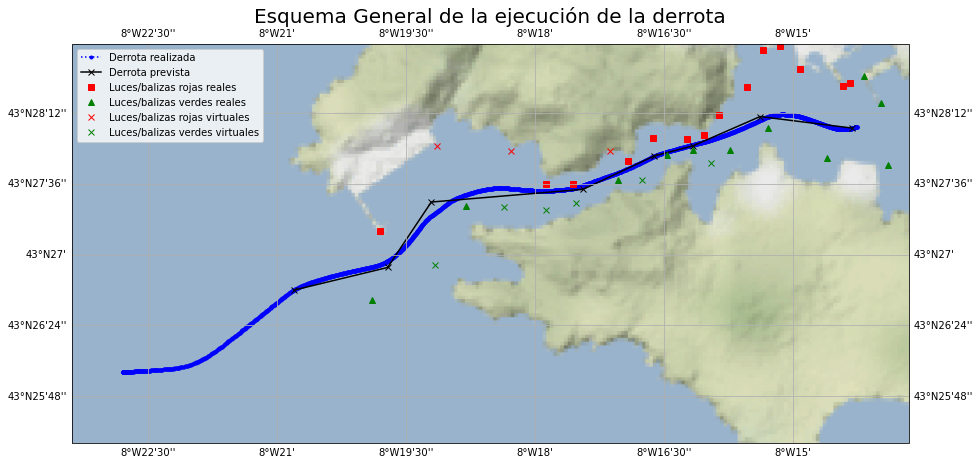

In [31]:
# Visualizar el esquema General con la proyección mercator y fondo pixelado de la zona.
tiler = Stamen('terrain-background')
mercator = tiler.crs
fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Esquema General de la ejecución de la derrota",fontsize=20)

xCoordenadas, yCoordenadas =list(datos_sim["Longitud"]), list(datos_sim["Latitud"])

ax.plot(xCoordenadas, yCoordenadas,'b.:',transform=ccrs.PlateCarree(),label="Derrota realizada")

ax.plot(x_derrota, y_derrota,'kx-',transform=ccrs.PlateCarree(),label="Derrota prevista")
ax.plot(x_rojas_ferrol, y_rojas_ferrol,'rs',transform=ccrs.PlateCarree(),label="Luces/balizas rojas reales")
ax.plot(x_verdes_ferrol, y_verdes_ferrol,'g^',transform=ccrs.PlateCarree(),label="Luces/balizas verdes reales")
ax.plot(x_rojas_v_ferrol, y_rojas_v_ferrol,'rx',transform=ccrs.PlateCarree(),label="Luces/balizas rojas virtuales")
ax.plot(x_verdes_v_ferrol, y_verdes_v_ferrol,'gx',transform=ccrs.PlateCarree(),label="Luces/balizas verdes virtuales")

plt.legend(loc='best',fontsize=10)


plt.show()

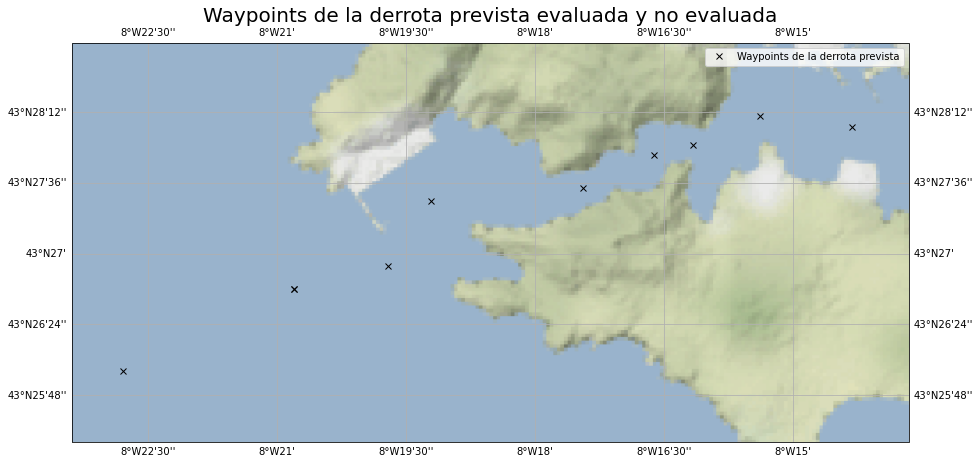

In [32]:
# Borrar
# Visualizar el esquema General con la proyección mercator y fondo pixelado de la zona.
tiler = Stamen('terrain-background')
mercator = tiler.crs
fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Waypoints de la derrota prevista evaluada y no evaluada",fontsize=20)



ax.plot(x_derrota_pre+x_derrota, y_derrota_pre+y_derrota,'kx',transform=ccrs.PlateCarree(),label="Waypoints de la derrota prevista")


plt.legend(loc='best',fontsize=10)


plt.show()

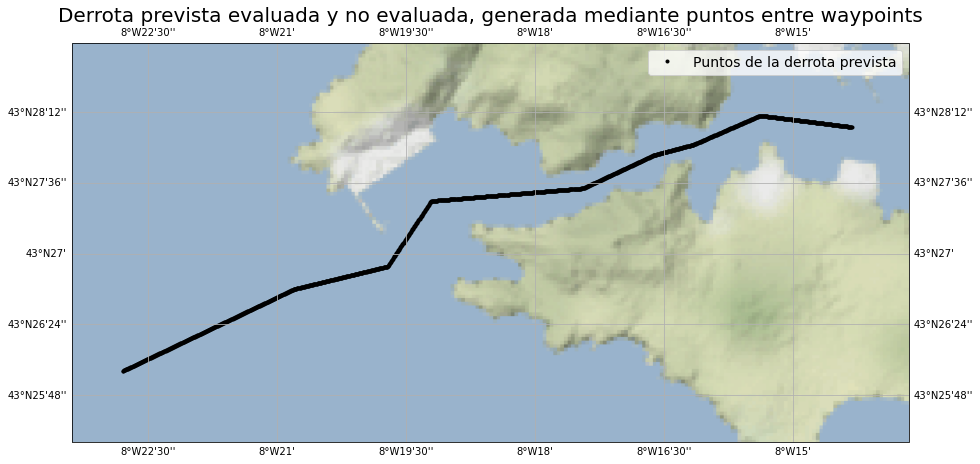

In [33]:
# Borrar
# Visualizar la derrota y el track muestreados en proyección mercator y fondo pixelado de la zona.
tiler = Stamen('terrain-background')
mercator = tiler.crs
fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Derrota prevista evaluada y no evaluada, generada mediante puntos entre waypoints",fontsize=20)

plt.plot(x_derrota_pre_gen+x_derrota_gen,y_derrota_pre_gen+y_derrota_gen,'k.',transform=ccrs.PlateCarree(),label="Puntos de la derrota prevista")

plt.legend(loc='best',fontsize=14)

plt.show()

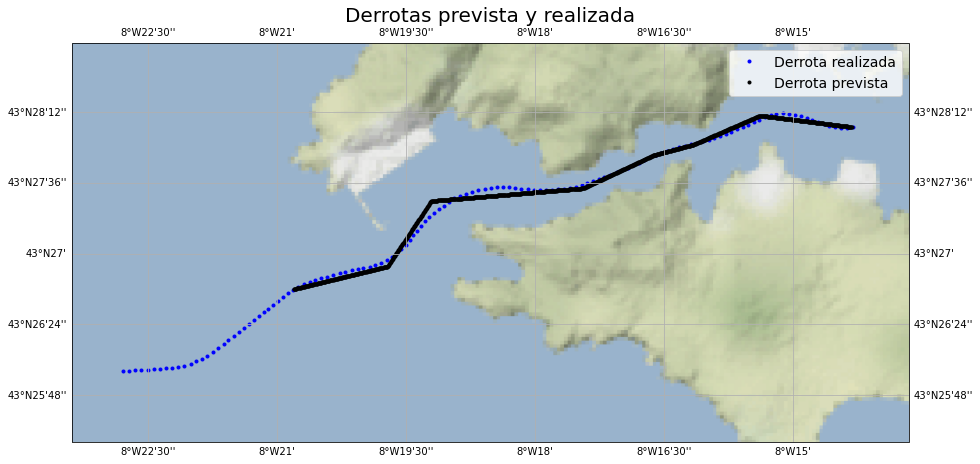

In [34]:
# Visualizar la derrota y el track muestreados en proyección mercator y fondo pixelado de la zona.
tiler = Stamen('terrain-background')
mercator = tiler.crs
fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Derrotas prevista y realizada",fontsize=20)

xCoordenadas, yCoordenadas =list(datos_sim["Longitud"]), list(datos_sim["Latitud"])
plt.plot(x_track_gen_dbi, y_track_gen_dbi,'b.',transform=ccrs.PlateCarree(),label="Derrota realizada")
plt.plot(x_derrota_gen, y_derrota_gen,'k.',transform=ccrs.PlateCarree(),label="Derrota prevista")

plt.legend(loc='best',fontsize=14)

plt.show()

In [35]:
# Unir la derrota realizada (track) y prevista en un mismo dataset. Solo de los tramos evaluados.

# Si no hay tramos sin evaluar.
derrota_gen_df = pd.DataFrame(list(zip(x_derrota_gen, y_derrota_gen, tramos)), 
               columns =['Longitud', 'Latitud', 'Tramo']) 
lista_ceros= [0] * len(derrota_gen_df)
derrota_gen_df["MilisegundosDesdeInicio"]=lista_ceros
derrota_lab=[0]*len(derrota_gen_df)
derrota_gen_df["Label"]=derrota_lab

# Si hay tramos sin evaluar.
if len(y_derrota_pre)>0:
    derrota_pre_gen_df = pd.DataFrame(list(zip(x_derrota_pre_gen, y_derrota_pre_gen, tramos_pre)), 
                   columns =['Longitud', 'Latitud', 'Tramo']) 
    lista_ceros= [0] * len(derrota_pre_gen_df)
    derrota_pre_gen_df["MilisegundosDesdeInicio"]=lista_ceros
    derrota_pre_lab=[0]*len(derrota_pre_gen_df)
    derrota_pre_gen_df["Label"]=derrota_pre_lab
    display(derrota_pre_gen_df)
    print(len(derrota_pre_gen_df))

,Longitud,Latitud,Tramo,MilisegundosDesdeInicio,Label
0,-8.379866,43.433448,0,0,0
1,-8.379766,43.433483,0,0,0
2,-8.379666,43.433518,0,0,0
3,-8.379566,43.433553,0,0,0
4,-8.379466,43.433587,0,0,0
...,...,...,...,...,...
328,-8.347066,43.444861,0,0,0
329,-8.346966,43.444896,0,0,0
330,-8.346866,43.444931,0,0,0
331,-8.346766,43.444965,0,0,0


333


In [36]:
# Eliminar las columnas no necesarias del dataframe fusionado.

if len(y_derrota_pre)>0:

    derrota_pre_gen_df_tramos=derrota_pre_gen_df.drop(["MilisegundosDesdeInicio","Label"],axis=1)

    display(derrota_pre_gen_df_tramos.head(2))
    
    derrota_gen_df_tramos=derrota_gen_df.drop(["MilisegundosDesdeInicio","Label"],axis=1)

    display(derrota_gen_df_tramos.head(2))
    
else:
    derrota_gen_df_tramos=derrota_gen_df.drop(["MilisegundosDesdeInicio","Label"],axis=1)

    display(derrota_gen_df_tramos.head(2))
    
track_gen_df_tramos=track_gen_df.drop(["MilisegundosDesdeInicio","Label"],axis=1)
display(track_gen_df_tramos.head(2))

,Longitud,Latitud,Tramo
0,-8.379866,43.433448,0
1,-8.379766,43.433483,0


,Longitud,Latitud,Tramo
0,-8.346667,43.445000,1
1,-8.346567,43.445018,1


,Longitud,Latitud
0,-8.379866,43.433448
1,-8.379866,43.433447


In [37]:
# Calcular las distancias al eje de la derrota por tramo.

In [38]:
# Separar las etiquetas de tramos y los datos X, para posterior clustering.
if len(y_derrota_pre)>0:
    derrota_gen_df_tramos_x_1=derrota_pre_gen_df_tramos.drop(["Tramo"],axis=1)
    derrota_gen_df_tramos_x_2=derrota_gen_df_tramos.drop(["Tramo"],axis=1)
    derrota_gen_df_tramos_x=pd.concat([derrota_gen_df_tramos_x_1,derrota_gen_df_tramos_x_2], sort=False)
    X=derrota_gen_df_tramos_x
    X.index=[list(range(0,len(X)))]
    print("Tamaño de X: ", np.shape(X))
    display(X)
    y_1=derrota_pre_gen_df_tramos["Tramo"]
    y_2=derrota_gen_df_tramos["Tramo"]
    y=pd.concat([y_1,y_2], sort=False)
    y.index=[list(range(0,len(y)))]
else:
    derrota_gen_df_tramos_x=derrota_gen_df_tramos.drop(["Tramo"],axis=1)
    X=derrota_gen_df_tramos_x
    X.index=[list(range(0,len(X)))]

    print("Tamaño de X: ", np.shape(X))
    display(X)

    y=derrota_gen_df_tramos["Tramo"]
    y.index=[list(range(0,len(y)))]
    
print("\n","Tamaño de y: ", np.shape(y))
display(y)

Tamaño de X:  (1421, 2)


,Longitud,Latitud
0,-8.379866,43.433448
1,-8.379766,43.433483
2,-8.379666,43.433518
3,-8.379566,43.433553
4,-8.379466,43.433587
...,...,...
1416,-8.238900,43.467929
1417,-8.238800,43.467920
1418,-8.238700,43.467911
1419,-8.238600,43.467902



 Tamaño de y:  (1421,)


0       0
1       0
2       0
3       0
4       0
       ..
1416    7
1417    7
1418    7
1419    7
1420    7
Name: Tramo, Length: 1421, dtype: int64

In [39]:
#borrar
puntos_derrota_para_figura=X.copy()
puntos_derrota_para_figura["Tramo"]=y

display(puntos_derrota_para_figura)

,Longitud,Latitud,Tramo
0,-8.379866,43.433448,0
1,-8.379766,43.433483,0
2,-8.379666,43.433518,0
3,-8.379566,43.433553,0
4,-8.379466,43.433587,0
...,...,...,...
1416,-8.238900,43.467929,7
1417,-8.238800,43.467920,7
1418,-8.238700,43.467911,7
1419,-8.238600,43.467902,7


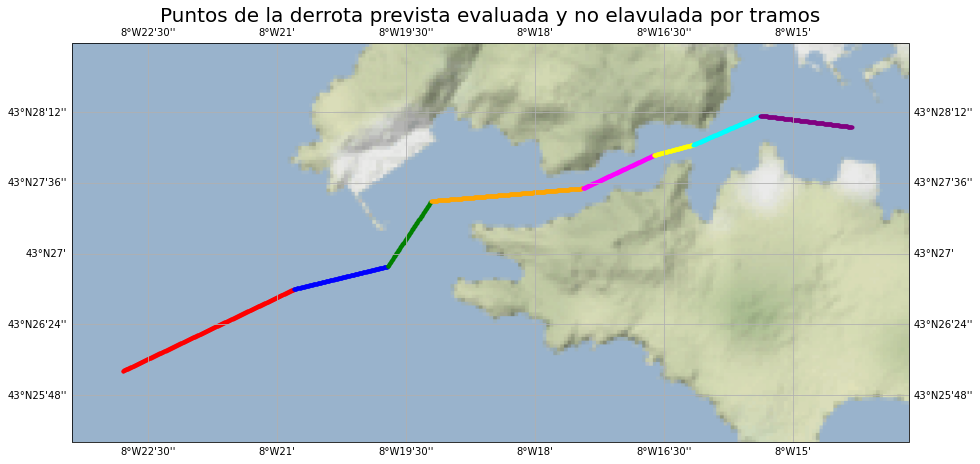

In [40]:
#borrar
#Visualizar la asiganción de números de tramo al track.
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Puntos de la derrota prevista evaluada y no elavulada por tramos",fontsize=20)

colores=['r','b','g',"orange","fuchsia", "yellow","cyan","purple","slategray","orangered","lawngreen","olive"]*len(tramos)

for i in range(0,len(puntos_derrota_para_figura)):
    
    plt.plot(puntos_derrota_para_figura["Longitud"][i], puntos_derrota_para_figura["Latitud"][i],
             '.',c=colores[puntos_derrota_para_figura["Tramo"][i]],transform=ccrs.PlateCarree())


plt.show()

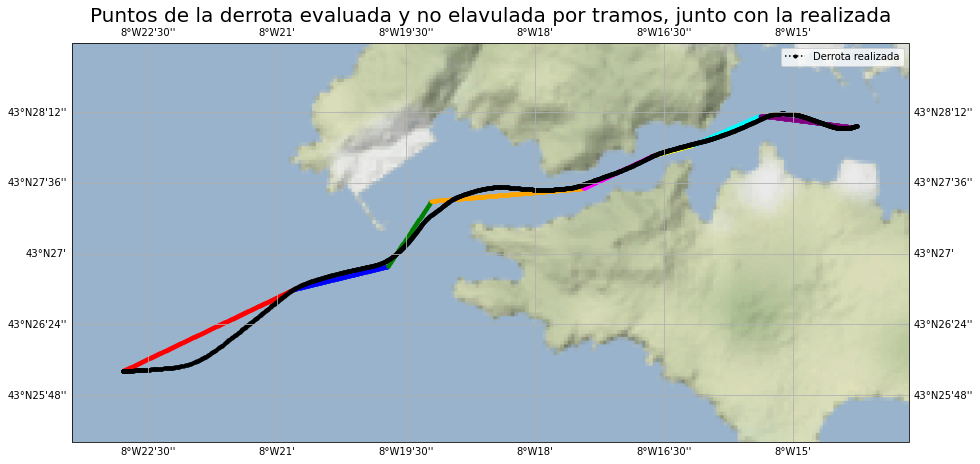

In [41]:
#borrar
#Visualizar la asiganción de números de tramo al track.
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Puntos de la derrota evaluada y no elavulada por tramos, junto con la realizada",fontsize=20)

colores=['r','b','g',"orange","fuchsia", "yellow","cyan","purple","slategray","orangered","lawngreen","olive"]*len(tramos)

for i in range(0,len(puntos_derrota_para_figura)):
    
    plt.plot(puntos_derrota_para_figura["Longitud"][i], puntos_derrota_para_figura["Latitud"][i],
             '.',c=colores[puntos_derrota_para_figura["Tramo"][i]],transform=ccrs.PlateCarree())
xCoordenadas, yCoordenadas =list(datos_sim["Longitud"]), list(datos_sim["Latitud"])

ax.plot(xCoordenadas, yCoordenadas,'k.:',transform=ccrs.PlateCarree(),label="Derrota realizada")
plt.legend(loc='best',fontsize=10) 

plt.show()

In [42]:
#Partición datos train-test.
X_training, X_testing, y_training, y_testing = train_test_split(X, y, test_size=0.2, random_state=42)
print(np.shape(X_training))
print(np.shape(y_training))
print(np.shape(X_testing))
print(np.shape(y_testing))

(1136, 2)
(1136,)
(285, 2)
(285,)


In [43]:
# comprobación del balanceado de los datos
valor_train,count_train=np.unique(y_training, return_counts=True)
valor_test,count_test=np.unique(y_testing, return_counts=True)
print('Training:',valor_train,count_train)
print('Test:',valor_test,count_test)

Training: [0 1 2 3 4 5 6 7] [267 146  69 241 108  59 104 142]
Test: [0 1 2 3 4 5 6 7] [66 36 17 54 30 19 26 37]


In [44]:
#Configurar el algoritmo.
from sklearn.neighbors import KNeighborsClassifier
algoritmos = {"KNNC": KNeighborsClassifier(5,weights='distance',metric='haversine')}

In [45]:
# Validación cruzada interna.    
for nombre, alg in algoritmos.items():
    print(nombre)
    results = cross_val_score(alg,  X_training, y_training, cv = KFold(n_splits=5, shuffle=True, random_state=42))
    print("Accuracy:   %0.4f +/- %0.4f" % (results.mean(), results.std()))

KNNC
Accuracy:   0.9912 +/- 0.0056


In [46]:
# Entrenamiento modelos anteriores utilizando todos los datos de entrenamiento.
models = {}
for nombre, alg in algoritmos.items():
    models[nombre] = alg.fit(X_training, y_training)

In [47]:
# Prediccion datos de test y evaluación del rendimiento.
y_pred = {}
for nombre, alg in models.items():
    y_pred[nombre] = alg.predict(X_testing)
    test_results = alg.score(X_testing, y_testing) 
    print('Exactitud en test: ',nombre, round(test_results*100,4), '%')

Exactitud en test:  KNNC 99.2982 %


In [48]:
#Tabla de resultados.
headers = ['KNN']
P,S,FS,ACC = ['Precision'], ['Recall'], ['F1-score'], ['Accuracy']

for nombre, alg in models.items():
    P.append(np.round(metrics.precision_score(y_testing, y_pred[nombre], average='macro'),4))
    S.append(np.round(metrics.recall_score(y_testing, y_pred[nombre], average='macro'),4))
    FS.append(np.round(metrics.f1_score(y_testing, y_pred[nombre], average='macro'),4))
    ACC.append(np.round(metrics.accuracy_score(y_testing, y_pred[nombre]),4))

my_data = [tuple(P), tuple(S), tuple(FS), tuple(ACC)]
print(tabulate(my_data, headers=headers))

              KNN
---------  ------
Precision  0.9931
Recall     0.9861
F1-score   0.9893
Accuracy   0.993


In [49]:
#Predicción para la asignación de tramos al track.
X_track=track_gen_df_tramos
print(len(track_gen_df_tramos))

track_pred=algoritmos["KNNC"].predict(X_track)
print(track_pred)

track_gen_df_tramos_num=track_gen_df_tramos.copy()
track_gen_df_tramos_num["Tramo"]=track_pred
track_gen_df_tramos_num["MilisegundosDesdeInicio"]=track_gen_df["MilisegundosDesdeInicio"]
track_gen_df_tramos_num["Rumbo_barco"]=list(datos_sim["Rumbo"])
track_gen_df_tramos_num["Heading_barco"]=list(datos_sim["Heading"])
track_gen_df_tramos_num["DistanciaFondoProa"]=list(datos_sim["DistanciaFondoProa"])
track_gen_df_tramos_num["Velocidad"]=list(datos_sim["Velocidad"])
track_gen_df_tramos_num["Velocidad_efectiva"]=list(datos_sim["Velocidad_efectiva"])
display(track_gen_df_tramos_num.head())
display(len(track_gen_df_tramos_num))


2060
[0 0 0 ... 7 7 7]


,Longitud,Latitud,Tramo,MilisegundosDesdeInicio,Rumbo_barco,Heading_barco,DistanciaFondoProa,Velocidad,Velocidad_efectiva
0,-8.379866,43.433448,0,47000,163.229111,89.943039,56.061119,1.034424,1.534424
1,-8.379866,43.433447,0,48000,162.362823,89.892136,56.064381,1.028771,1.528770
2,-8.379865,43.433445,0,49000,161.450989,89.847237,55.720085,1.023123,1.523122
3,-8.379864,43.433444,0,50000,161.450989,89.808243,55.720085,1.016854,1.516852
4,-8.379864,43.433443,0,51000,159.128754,89.774918,55.721714,1.009813,1.509810


2060

In [50]:
#sumar el número de tramos evaluados y no evaluados.
tramos_final=tramos_pre+tramos
print(np.unique(tramos_final))

[0 1 2 3 4 5 6 7]


In [51]:
#Tramos de aguas restringidas, libres y no valuados.
tramos_restringidos=[2,3,4,5,6,7]
tramos_libres=[1]
tramos_evaluados=tramos_libres+tramos_restringidos
tramos_no_evaluados=[0]
print(tramos_evaluados)


[1, 2, 3, 4, 5, 6, 7]


In [52]:
#Crear un diccionario de datasets por tramos evaluados para e cálculo de la separación de la derrota.
track_tramos={}
for t in np.unique(tramos_evaluados):
    track_tramos["T"+str(t)] = track_gen_df_tramos_num[track_gen_df_tramos_num["Tramo"]==t]
    track_tramos["T"+str(t)].index=[list(range(0,len(track_tramos["T"+str(t)])))]

In [53]:
display(track_tramos["T2"])

,Longitud,Latitud,Tramo,MilisegundosDesdeInicio,Rumbo_barco,Heading_barco,DistanciaFondoProa,Velocidad,Velocidad_efectiva
0,-8.328711,43.449033,2,683000,60.469524,52.713535,25.544250,10.400468,10.802524
1,-8.328648,43.449059,2,684000,60.017727,52.202423,25.495632,10.379300,10.778747
2,-8.328648,43.449059,2,684000,60.469524,52.202423,25.544250,10.379300,10.778747
3,-8.328523,43.449112,2,686000,59.563812,51.186832,25.455585,10.339779,10.733952
4,-8.328462,43.449138,2,687000,59.105453,50.688934,25.455814,10.322123,10.713665
...,...,...,...,...,...,...,...,...,...
165,-8.320203,43.455401,2,862000,53.151653,55.884281,16.537733,9.183468,9.601517
166,-8.320152,43.455429,2,863000,53.537460,55.898479,16.479048,9.168516,9.586638
167,-8.320100,43.455457,2,864000,53.871914,55.829479,16.452332,9.147436,9.565244
168,-8.320048,43.455484,2,865000,54.166237,55.680126,16.426222,9.119947,9.537066


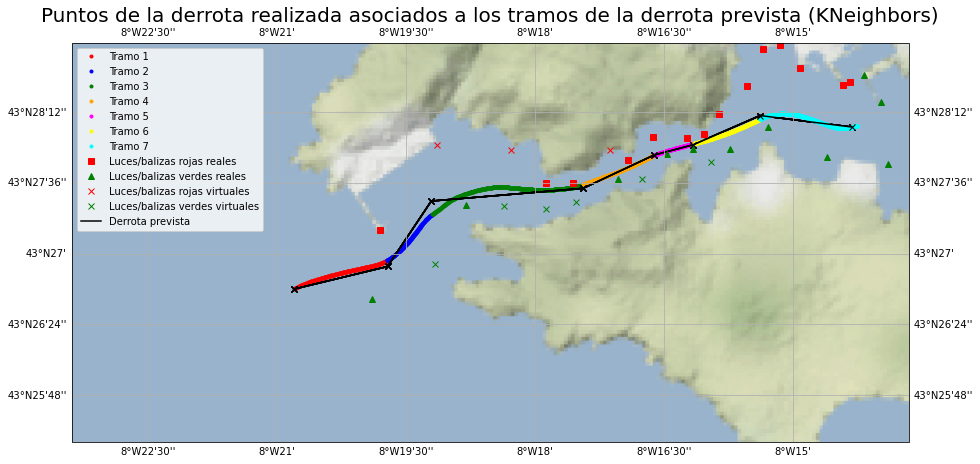

In [54]:
#Visualizar la asiganción de números de tramo al track.
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Puntos de la derrota realizada asociados a los tramos de la derrota prevista (KNeighbors)",fontsize=20)

colores=['r','b','g',"orange","fuchsia", "yellow","cyan","purple","slategray","orangered","lawngreen","olive"]*len(tramos)

for clave in track_tramos:
    xCoordenadas, yCoordenadas =list(track_tramos[clave]["Longitud"]), list(track_tramos[clave]["Latitud"])
    plt.plot(xCoordenadas, yCoordenadas,'.',c=colores[int(clave[1:])-1],transform=ccrs.PlateCarree(),label="Tramo "+str(clave[1:]))
    plt.plot(x_derrota, y_derrota,'kx-',transform=ccrs.PlateCarree())

ax.plot(x_rojas_ferrol, y_rojas_ferrol,'rs',transform=ccrs.PlateCarree(),label="Luces/balizas rojas reales")
ax.plot(x_verdes_ferrol, y_verdes_ferrol,'g^',transform=ccrs.PlateCarree(),label="Luces/balizas verdes reales")
ax.plot(x_rojas_v_ferrol, y_rojas_v_ferrol,'rx',transform=ccrs.PlateCarree(),label="Luces/balizas rojas virtuales")
ax.plot(x_verdes_v_ferrol, y_verdes_v_ferrol,'gx',transform=ccrs.PlateCarree(),label="Luces/balizas verdes virtuales")

plt.plot(0, 0,"k-", markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.legend(loc='best',fontsize=10) 

plt.show()

In [55]:
#preparar un dataframe para la detección  de outliers con dbscan en la derrota de precisión.
track_gen_df_db=track_gen_df_dbi.copy()
track_gen_df_db=track_gen_df_db.drop(["MilisegundosDesdeInicio","Label"],axis=1)
display(track_gen_df_db)

,Longitud,Latitud
0,-8.379866,43.433448
1,-8.378694,43.433402
2,-8.377509,43.433494
3,-8.376337,43.433514
4,-8.375122,43.433568
...,...,...
126,-8.242847,43.468083
127,-8.241746,43.467844
128,-8.240598,43.467710
129,-8.239428,43.467723


In [56]:
#Asignar a los puntos muestreados del track un tramo de la derrota. Así nos quedarmos solo con los de aguas restringidas.
X_track=track_gen_df_db

track_pred_db=algoritmos["KNNC"].predict(X_track)
print(track_pred)

track_gen_df_tramos_num_db=track_gen_df_dbi.copy()
track_gen_df_tramos_num_db["Tramo"]=track_pred_db
track_gen_df_db["Tramo"]=track_pred_db
track_gen_df_tramos_num_db=track_gen_df_tramos_num_db.drop(["Label"],axis=1)
display(track_gen_df_tramos_num_db.head())
display(len(track_gen_df_tramos_num_db))

[0 0 0 ... 7 7 7]


,Longitud,Latitud,MilisegundosDesdeInicio,Tramo
0,-8.379866,43.433448,47000,0
1,-8.378694,43.433402,115000,0
2,-8.377509,43.433494,132000,0
3,-8.376337,43.433514,149000,0
4,-8.375122,43.433568,165000,0


131

In [57]:
#Diccionario de datasets con los puntos muestreados del track por tramo de aguas restringidas.
track_tramos_db={}
for t in np.unique(tramos_restringidos):
    track_tramos_db["T"+str(t)] = track_gen_df_tramos_num_db[track_gen_df_tramos_num_db["Tramo"]==t]
    track_tramos_db["T"+str(t)].index=[list(range(0,len(track_tramos_db["T"+str(t)])))]
    

In [58]:
display(track_tramos_db["T2"])

,Longitud,Latitud,MilisegundosDesdeInicio,Tramo
0,-8.328711,43.449033,683000,2
1,-8.327696,43.449516,700000,2
2,-8.326769,43.450067,717000,2
3,-8.325889,43.450649,734000,2
4,-8.325063,43.451261,751000,2
5,-8.324289,43.451903,768000,2
6,-8.323553,43.452566,785000,2
7,-8.322837,43.453241,802000,2
8,-8.322133,43.453923,819000,2
9,-8.321389,43.454604,837000,2


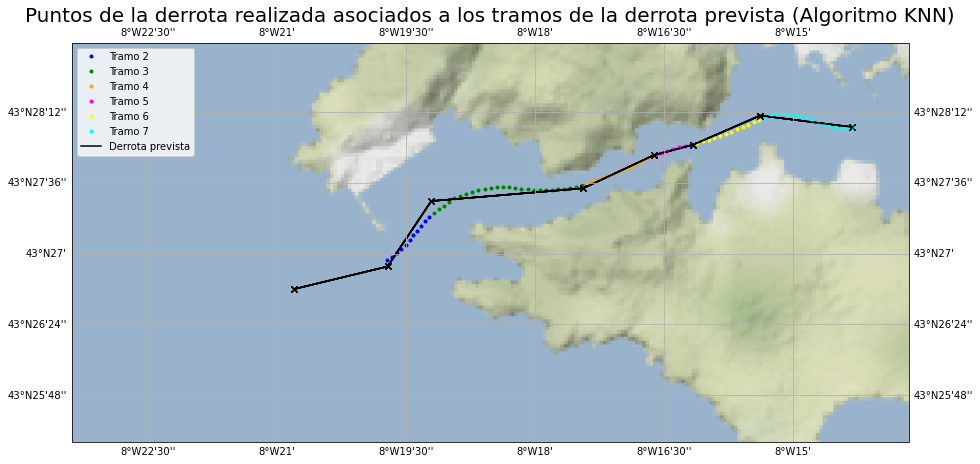

In [59]:
# Visualizar los puntos del track asignados por tramos de aguas restringidas.
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Puntos de la derrota realizada asociados a los tramos de la derrota prevista (Algoritmo KNN)",fontsize=20)

colores=['r','b','g',"orange","fuchsia", "yellow","cyan","purple","slategray","orangered","lawngreen","olive"]*len(tramos)

for clave in track_tramos_db:
    xCoordenadas, yCoordenadas =list(track_tramos_db[clave]["Longitud"]), list(track_tramos_db[clave]["Latitud"])
    plt.plot(xCoordenadas, yCoordenadas,'.',c=colores[int(clave[1:])-1],transform=ccrs.PlateCarree(),label="Tramo "+str(clave[1:]))
    plt.plot(x_derrota, y_derrota,'kx-',transform=ccrs.PlateCarree())

plt.plot(0, 0,"k-", markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.legend(loc='best',fontsize=10) 

plt.show()

In [60]:
derrota_tramos={}
for t in np.unique(tramos_evaluados):
    derrota_tramos["T"+str(t)] = derrota_gen_df[derrota_gen_df["Tramo"]==t]
    derrota_tramos["T"+str(t)].index=[list(range(0,len(derrota_tramos["T"+str(t)])))]


In [61]:
#función para la disancia entre dos puntos.
def distancia_c(A, B):
    dis= ((((A[1]-B[1])**2+(((A[0]-B[0]))*(math.cos((np.mean(y_derrota))*(math.pi)/180)))**2))**(1/2))*2000*60
    return dis

In [62]:
#Calcular el punto de corte de la recta que pasa por cada punto del track y es perpendicular a la derrota prevista.
def corte_rectas(p1,p2,p,rbo):

    #linea 1
    A = (p1[0],p1[1])
    B = (p2[0],p2[1])

    #linea 2
    C = (p[0],p[1])
    D = ((C[0] + 100*math.sin(rbo-math.pi/2))/math.cos(((A[1]+B[1])/2)*(math.pi/180)),
         C[1]+100*math.cos(rbo-math.pi/2))

    # Definir las dos lines.
    line_1 = Line.from_points(A, B)
    line_2 = Line.from_points(C, D)

    # Calcular el punto de intersección
    punto_interseccion = line_1.intersect_line(line_2)
    return punto_interseccion

# Calcular el punto de proyeccion de cada punto del track sobre a derrota previsa evaluada.
def obtener_proyeccion(p1,p2,p,rbo):
    
    #Calculamos el angulo entre AB y AP, si es mayor de 90 grados retornamos la distancia enre A y P
    if np.arccos(np.dot((p-p1)/norm(p-p1), (p2-p1)/norm(p2-p1))) > (np.pi/2)*0.9:
        return tuple(p1)

    #Calculamos el angulo entre AB y BP, si es mayor de 90 grados retornamos la distancia enre B y P.
    if np.arccos(np.dot((p-p2)/norm(p-p2), (p1-p2)/norm(p1-p2))) > (np.pi/2)*0.9:
        return tuple(p2)

    #Como ambos angulos son menores o iguales a 90º sabemos que podemos hacer una proyección ortogonal del punto.
    else:
            punto_proyectado = corte_rectas(p1,p2,p,rbo)
        
    return tuple(punto_proyectado)

#Lista con las proyecciones de cada punto del track sobre la derrota.    
for clave in track_tramos:
    proyecciones=[]
    rumbo=r_derrota_rad[int((str(clave)[1:]))-1]
    for i in range(0,len(track_tramos[clave])):
        p1=np.array(lista_tramos[int((str(clave)[1:]))][1])
        p2=np.array(lista_tramos[int((str(clave)[1:]))][2])
        p=np.array((track_tramos[clave]['Longitud'][i],track_tramos[clave]['Latitud'][i]))
        proy = obtener_proyeccion(p1,p2,p,rumbo)
        
        proyecciones.append(tuple(proy))
        
    track_tramos[clave]["Proyecciones"]=proyecciones
    
#Lista con las distancis de cada punto del track sobre su punto de proyección en la derrota.   
for clave in track_tramos:
    distancias=[]
    for i in range(0,len(track_tramos[clave])):
        A=np.array((track_tramos[clave]["Proyecciones"][i]))
        B=np.array((track_tramos[clave]['Longitud'][i],track_tramos[clave]['Latitud'][i]))
        dist = distancia_c(A,B)
        distancias.append(dist)
    
    track_tramos[clave]["Distancias"]=distancias

In [63]:
#mostrar un tramo a modo de ejemplo.
display(track_tramos["T2"])    

,Longitud,Latitud,Tramo,MilisegundosDesdeInicio,Rumbo_barco,Heading_barco,DistanciaFondoProa,Velocidad,Velocidad_efectiva,Proyecciones,Distancias
0,-8.328711,43.449033,2,683000,60.469524,52.713535,25.544250,10.400468,10.802524,"(-8.328077406289728, 43.44873498266379)",65.762034
1,-8.328648,43.449059,2,684000,60.017727,52.202423,25.495632,10.379300,10.778747,"(-8.328041761101861, 43.44877384922423)",62.922824
2,-8.328648,43.449059,2,684000,60.469524,52.202423,25.544250,10.379300,10.778747,"(-8.328041761101861, 43.44877384922423)",62.922824
3,-8.328523,43.449112,2,686000,59.563812,51.186832,25.455585,10.339779,10.733952,"(-8.327970131362813, 43.44885195237781)",57.383418
4,-8.328462,43.449138,2,687000,59.105453,50.688934,25.455814,10.322123,10.713665,"(-8.32793508890699, 43.448890161735335)",54.689232
...,...,...,...,...,...,...,...,...,...,...,...
165,-8.320203,43.455401,2,862000,53.151653,55.884281,16.537733,9.183468,9.601517,"(-8.321433196566671, 43.455979651418794)",127.685739
166,-8.320152,43.455429,2,863000,53.537460,55.898479,16.479048,9.168516,9.586638,"(-8.32139988614204, 43.45601597221579)",129.521798
167,-8.320100,43.455457,2,864000,53.871914,55.829479,16.452332,9.147436,9.565244,"(-8.321366274337331, 43.45605262162957)",131.430370
168,-8.320048,43.455484,2,865000,54.166237,55.680126,16.426222,9.119947,9.537066,"(-8.321333303249757, 43.456088572422495)",133.405444


In [64]:
# Dividir la posición de los puntos de proyección en latitud y longitud
def split_x_p(posicion):
    index=0
    if ',' in str(posicion):
        index = str(posicion).index(',')
        return float(str(posicion)[1:index])
    
def split_y_p(posicion):
    index=0
    if ',' in str(posicion):
        index = str(posicion).index(',')
        return float(str(posicion)[index+1:-1])
    
for clave in track_tramos:
    
    track_tramos[clave]['x_p'] = track_tramos[clave]['Proyecciones'].apply(split_x_p)
    track_tramos[clave]['y_p'] = track_tramos[clave]['Proyecciones'].apply(split_y_p)


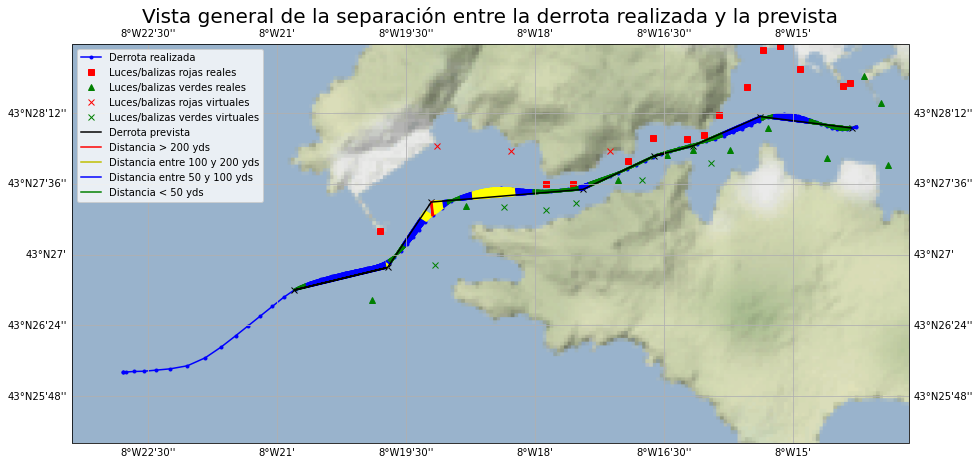

In [65]:
#Mostrar las distancias de los tramos evaluados al eje.
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)

plt.plot(track_gen_df_1["Longitud"], track_gen_df_1["Latitud"],"b.-", markersize=6, transform=ccrs.PlateCarree(),label="Derrota realizada")  
plt.plot(waypoints_df["Longitud"], waypoints_df["Latitud"],"kx",transform=ccrs.PlateCarree())
ax.plot(x_rojas_ferrol, y_rojas_ferrol,'rs',transform=ccrs.PlateCarree(),label="Luces/balizas rojas reales")
ax.plot(x_verdes_ferrol, y_verdes_ferrol,'g^',transform=ccrs.PlateCarree(),label="Luces/balizas verdes reales")
ax.plot(x_rojas_v_ferrol, y_rojas_v_ferrol,'rx',transform=ccrs.PlateCarree(),label="Luces/balizas rojas virtuales")
ax.plot(x_verdes_v_ferrol, y_verdes_v_ferrol,'gx',transform=ccrs.PlateCarree(),label="Luces/balizas verdes virtuales")

plt.title ("Vista general de la separación entre la derrota realizada y la prevista",fontsize=20)

for clave in track_tramos:
    if int(clave[1:]) not in tramos_no_evaluados:
        for i in range(len(track_tramos[clave])):
            colores=["green","blue", "yellow","red"]
            clr=""
            if track_tramos[clave]["Distancias"][i] > 200:
                clr=colores[3]
            elif 100 < track_tramos[clave]["Distancias"][i] <= 200:
                clr=colores[2]
            elif 50 < track_tramos[clave]["Distancias"][i] <= 100:
                clr=colores[1]
            else: clr=colores[0]

            plt.plot([track_tramos[clave]["Longitud"][i], track_tramos[clave]["x_p"][i]], 
                     [track_tramos[clave]["Latitud"][i], track_tramos[clave]["y_p"][i]],
                     color=clr, linestyle=("-"), linewidth=2, marker='', markersize=4,transform=ccrs.PlateCarree())

plt.plot(derrota_gen_df["Longitud"], derrota_gen_df["Latitud"],"k-", markersize=1,transform=ccrs.PlateCarree(),label="Derrota prevista")

plt.plot(0, 0,"r-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia > 200 yds")
plt.plot(0, 0,"y-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia entre 100 y 200 yds")
plt.plot(0, 0,"b-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia entre 50 y 100 yds")
plt.plot(0, 0,"g-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia < 50 yds")

plt.legend(loc='best',fontsize=10) 

plt.show()

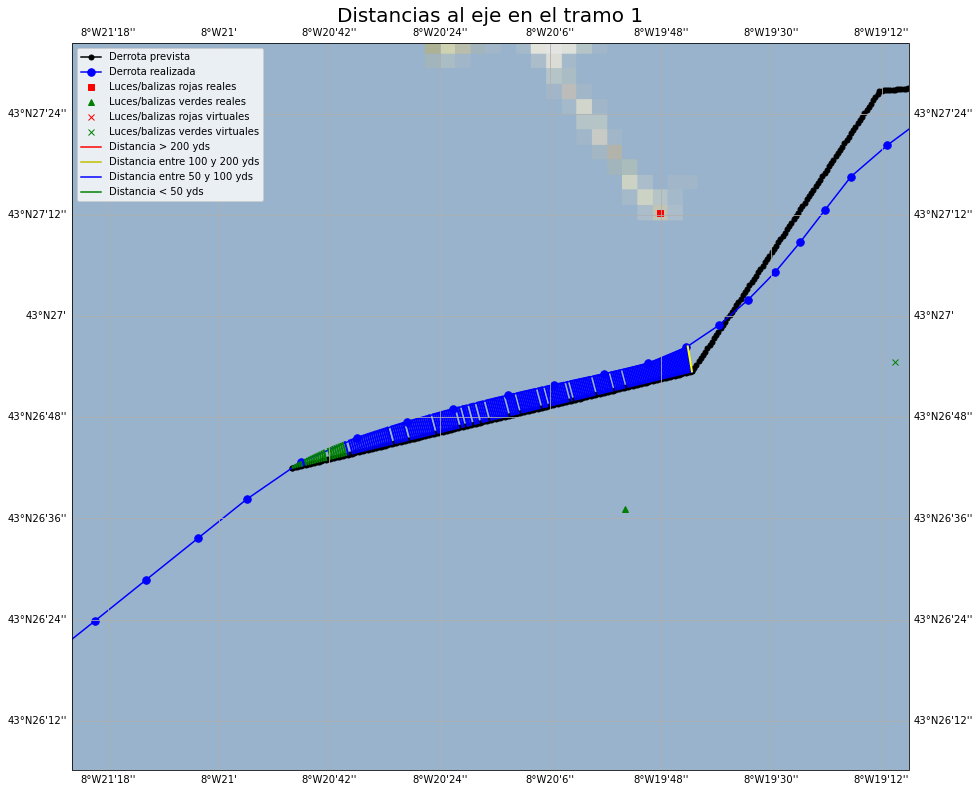

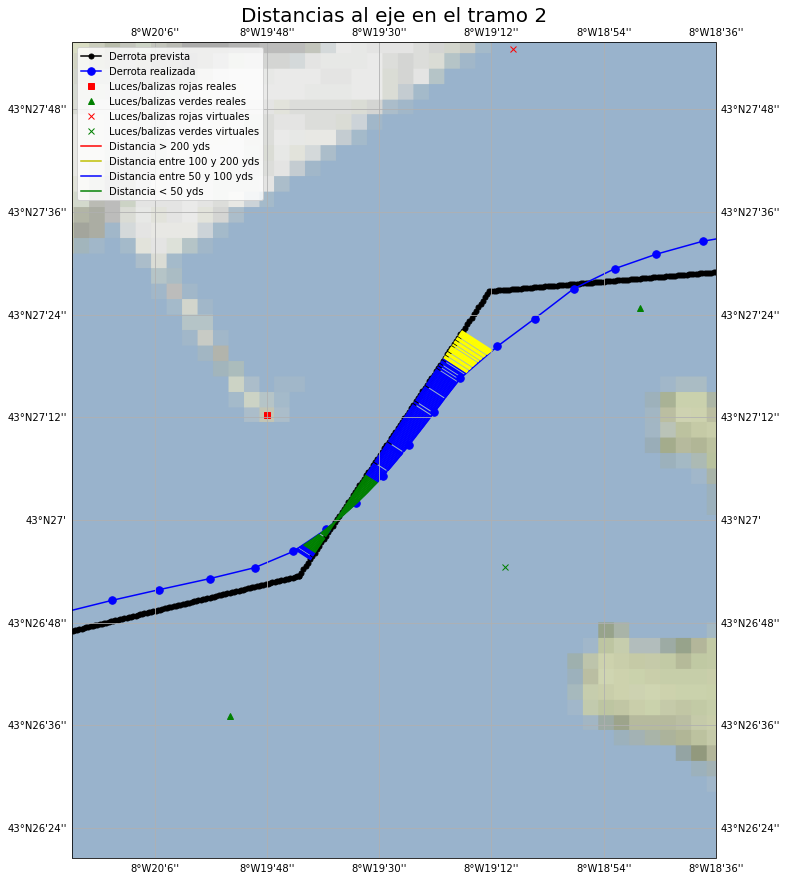

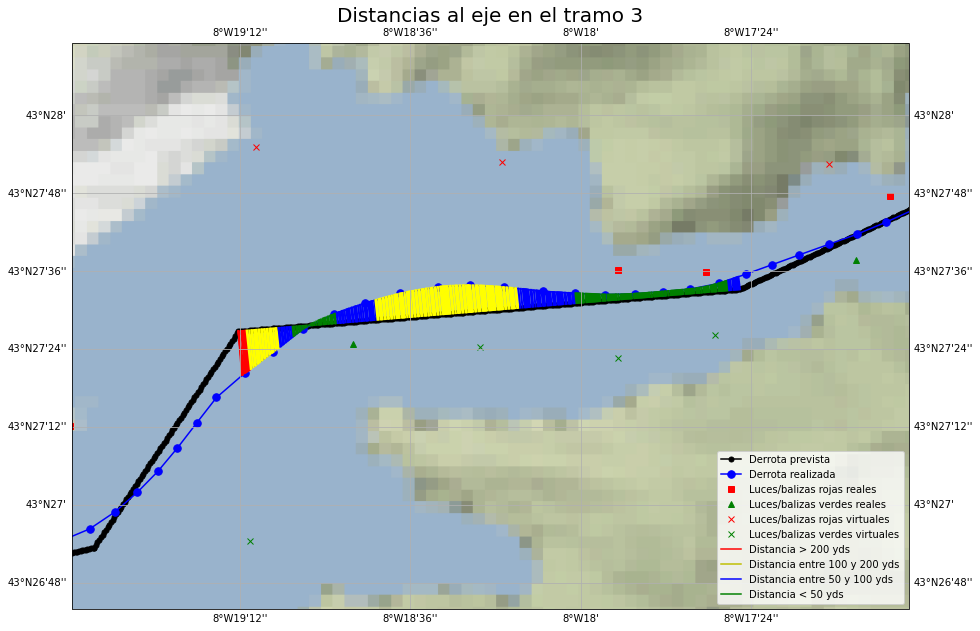

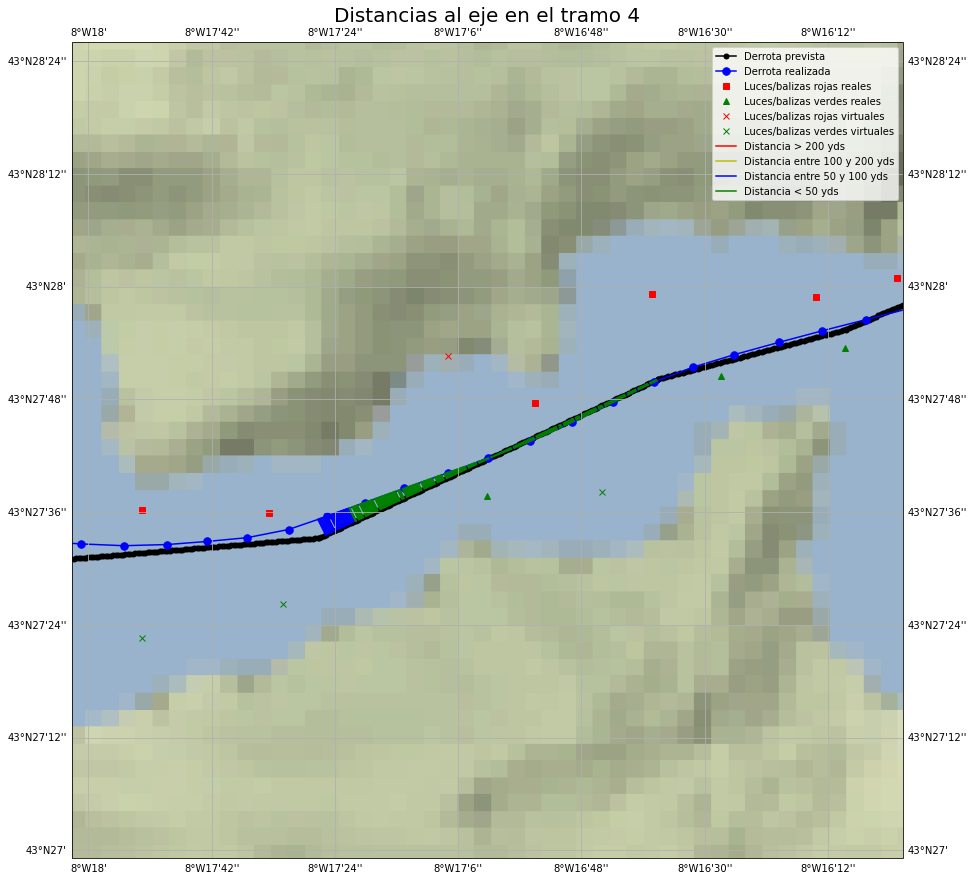

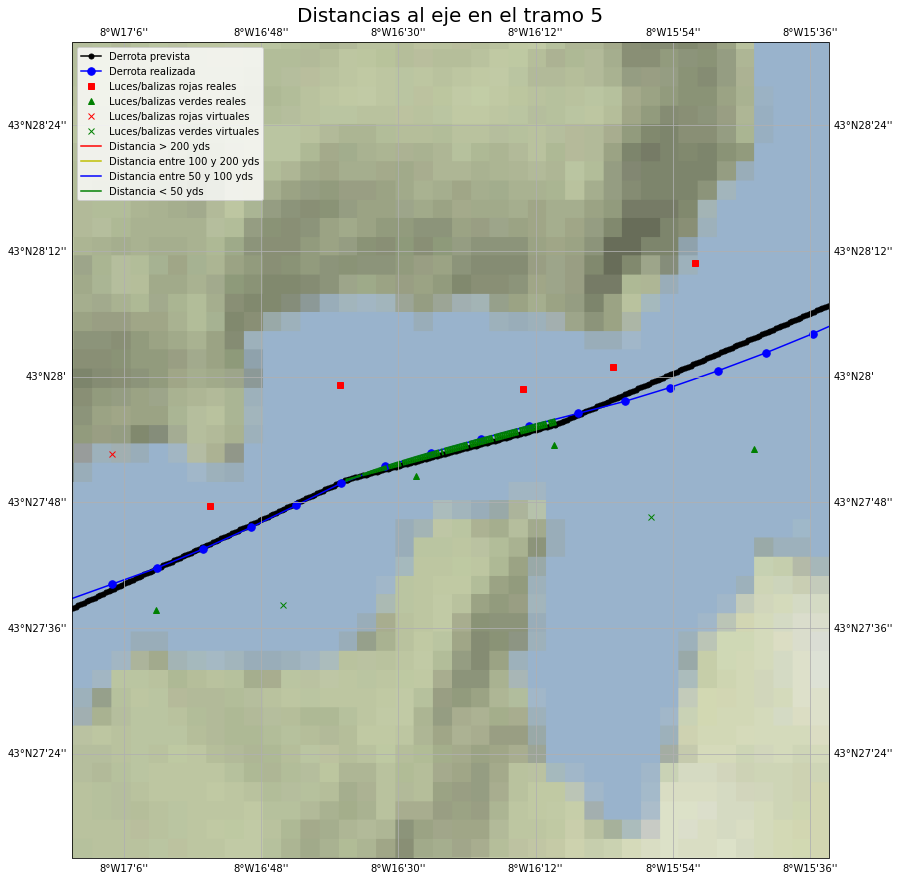

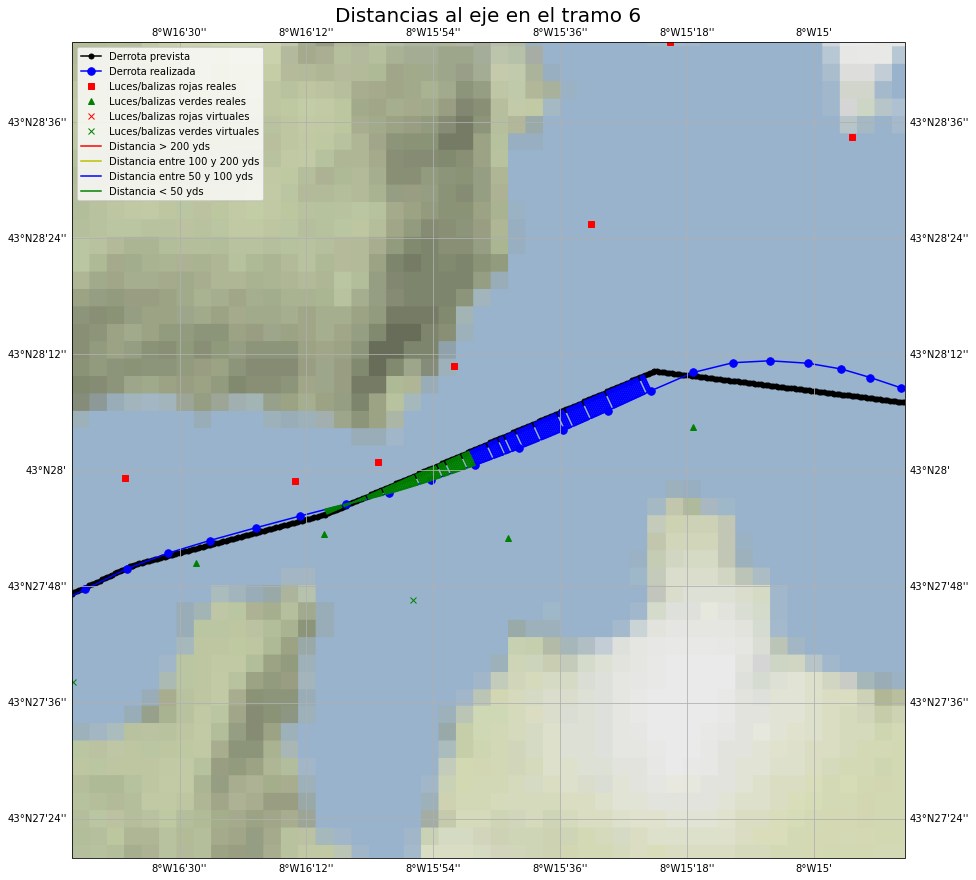

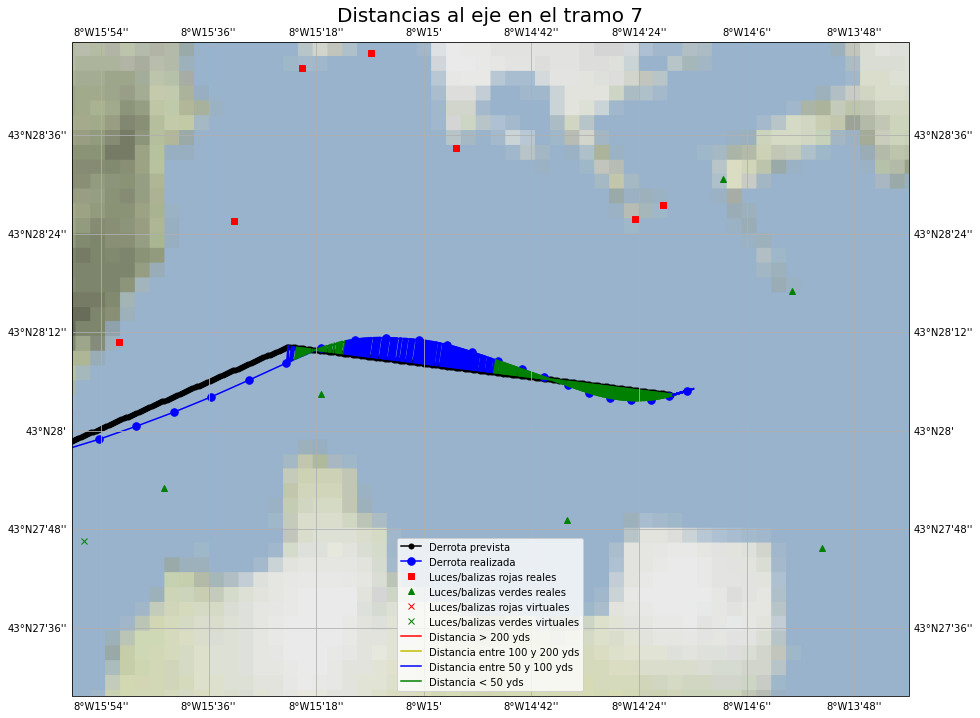

In [66]:
#Mostrar las distancias al eje por cada tramo.

for clave in track_tramos:
    if len(track_tramos[clave])>0:
        tiler = Stamen('terrain-background')
        mercator = tiler.crs
        
        fig = plt.figure(figsize=(15, 15))
        ax = plt.axes(projection=ccrs.Mercator())
        ax.set_extent([track_tramos[clave]["Longitud"].min()-0.01, track_tramos[clave]["Longitud"].max()+0.01, 
                       track_tramos[clave]["Latitud"].min()-0.01, track_tramos[clave]["Latitud"].max()+0.01])
        ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
        ax.add_feature(cf.OCEAN)
        ax.add_image(tiler, 11)
        plt.plot(derrota_gen_df["Longitud"], derrota_gen_df["Latitud"],"k.-", markersize=10,transform=ccrs.PlateCarree(),label="Derrota prevista")
        plt.plot(track_gen_df_1["Longitud"], track_gen_df_1["Latitud"],"b.-", markersize=15,transform=ccrs.PlateCarree(),label="Derrota realizada")
        ax.plot(x_rojas_ferrol, y_rojas_ferrol,'rs',transform=ccrs.PlateCarree(),label="Luces/balizas rojas reales")
        ax.plot(x_verdes_ferrol, y_verdes_ferrol,'g^',transform=ccrs.PlateCarree(),label="Luces/balizas verdes reales")
        ax.plot(x_rojas_v_ferrol, y_rojas_v_ferrol,'rx',transform=ccrs.PlateCarree(),label="Luces/balizas rojas virtuales")
        ax.plot(x_verdes_v_ferrol, y_verdes_v_ferrol,'gx',transform=ccrs.PlateCarree(),label="Luces/balizas verdes virtuales")
        ax.add_feature(cf.OCEAN)
            
        for i in range(len(track_tramos[clave])):

            colores=["green","blue", "yellow","red"]
            clr=""
            if track_tramos[clave]["Distancias"][i] >= 200:
                clr=colores[3]
            elif 100 < track_tramos[clave]["Distancias"][i] < 200:
                clr=colores[2]
            elif 50 < track_tramos[clave]["Distancias"][i] <= 100:
                clr=colores[1]
            else: clr=colores[0]
            plt.title ("Distancias al eje en el tramo "+str(clave[1:]),fontsize=20)
            plt.plot([track_tramos[clave]["Longitud"][i], track_tramos[clave]["x_p"][i]], 
                        [track_tramos[clave]["Latitud"][i], track_tramos[clave]["y_p"][i]],
                        color=clr, linestyle=("-"), linewidth=2, marker='', markersize=4,transform=ccrs.PlateCarree())
        plt.plot(0, 0,"r-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia > 200 yds")
        plt.plot(0, 0,"y-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia entre 100 y 200 yds")
        plt.plot(0, 0,"b-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia entre 50 y 100 yds")
        plt.plot(0, 0,"g-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia < 50 yds")

        plt.legend(loc='best',fontsize=10) 
        plt.show()

In [67]:
# Aplicar d b s c a n a los tramos de aguas restringidas para obener % de ourliers en el track respecto a la derrota.

In [68]:
#Quedarse con los tramos restringidos únicamente en el track.
tramos_eliminar=tramos_no_evaluados+tramos_libres
track_gen_df_db_1=track_gen_df_db.copy()
for i in tramos_eliminar:
    track_gen_df_db_1=track_gen_df_db_1.drop(track_gen_df_db[track_gen_df_db["Tramo"]==i].index)

display(track_gen_df_db_1)

,Longitud,Latitud,Tramo
47,-8.328711,43.449033,2
48,-8.327696,43.449516,2
49,-8.326769,43.450067,2
50,-8.325889,43.450649,2
51,-8.325063,43.451261,2
...,...,...,...
126,-8.242847,43.468083,7
127,-8.241746,43.467844,7
128,-8.240598,43.467710,7
129,-8.239428,43.467723,7


In [69]:
#Quedarse con los tramos restringidos únicamente en la derrota prevista.
tramos_eliminar=tramos_libres
derrota_gen_df_1=derrota_gen_df.copy()
for i in tramos_eliminar:
    derrota_gen_df_1=derrota_gen_df_1.drop(derrota_gen_df_1[derrota_gen_df_1["Tramo"]==i].index)

display(derrota_gen_df_1)

,Longitud,Latitud,Tramo,MilisegundosDesdeInicio,Label
182,-8.328583,43.448183,2,0,0
183,-8.328483,43.448292,2,0,0
184,-8.328383,43.448401,2,0,0
185,-8.328283,43.448510,2,0,0
186,-8.328183,43.448619,2,0,0
...,...,...,...,...,...
1083,-8.238900,43.467929,7,0,0
1084,-8.238800,43.467920,7,0,0
1085,-8.238700,43.467911,7,0,0
1086,-8.238600,43.467902,7,0,0


In [70]:
#juntar los puntos del track y le la derrota evaluada en un solo conjunto de dados a separar por DCSCAN.
derrota_fusionada_df = pd.merge(track_gen_df_db_1,
                                derrota_gen_df_1, on=["Longitud","Latitud"],
                                how="outer", indicator=False)

display(derrota_fusionada_df.head())
display(derrota_fusionada_df.tail())
print(len(derrota_fusionada_df))

derrota_fusionada_df_posic = derrota_fusionada_df.drop(["MilisegundosDesdeInicio","Label","Tramo_x","Tramo_y"], axis=1)
display(derrota_fusionada_df_posic.head())
display(derrota_fusionada_df_posic.tail())
print(len(derrota_fusionada_df_posic))

,Longitud,Latitud,Tramo_x,Tramo_y,MilisegundosDesdeInicio,Label
0,-8.328711,43.449033,2.0,NaN,NaN,NaN
1,-8.327696,43.449516,2.0,NaN,NaN,NaN
2,-8.326769,43.450067,2.0,NaN,NaN,NaN
3,-8.325889,43.450649,2.0,NaN,NaN,NaN
4,-8.325063,43.451261,2.0,NaN,NaN,NaN


,Longitud,Latitud,Tramo_x,Tramo_y,MilisegundosDesdeInicio,Label
985,-8.2389,43.467929,NaN,7.0,0.0,0.0
986,-8.2388,43.467920,NaN,7.0,0.0,0.0
987,-8.2387,43.467911,NaN,7.0,0.0,0.0
988,-8.2386,43.467902,NaN,7.0,0.0,0.0
989,-8.2385,43.467892,NaN,7.0,0.0,0.0


990


,Longitud,Latitud
0,-8.328711,43.449033
1,-8.327696,43.449516
2,-8.326769,43.450067
3,-8.325889,43.450649
4,-8.325063,43.451261


,Longitud,Latitud
985,-8.2389,43.467929
986,-8.2388,43.467920
987,-8.2387,43.467911
988,-8.2386,43.467902
989,-8.2385,43.467892


990


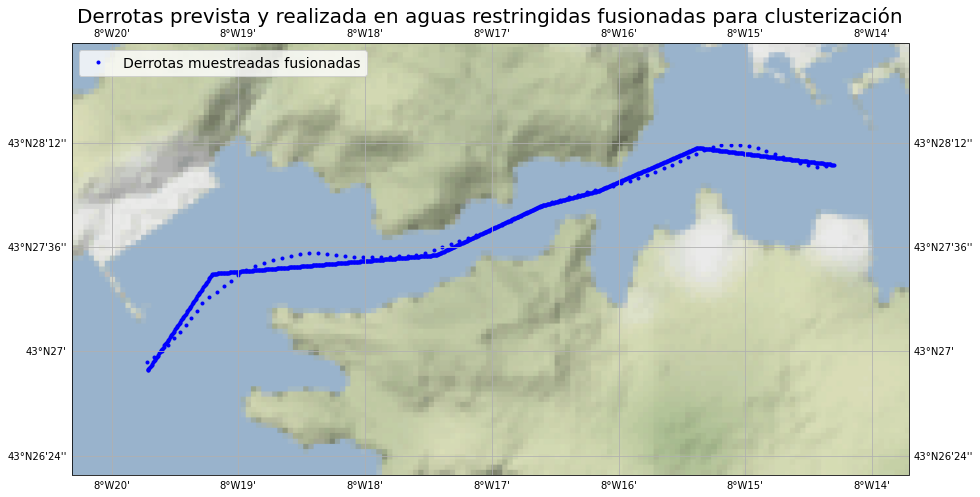

In [71]:
#Mostrar la derrota evaluada de aguas resringidas y los puntos del track asociados como un solo conjunto.
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(derrota_gen_df_1["Longitud"])-0.01, np.max(derrota_gen_df_1["Longitud"])+0.01, 
               np.min(derrota_gen_df_1["Latitud"])-0.01, np.max(derrota_gen_df_1["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)

plt.title ("Derrotas prevista y realizada en aguas restringidas fusionadas para clusterización",fontsize=20)

x_fus, y_fus = derrota_fusionada_df_posic['Longitud'], derrota_fusionada_df_posic['Latitud']
plt.plot(x_fus, y_fus,'b.',transform=ccrs.PlateCarree(),label="Derrotas muestreadas fusionadas")

plt.legend(loc='upper left',fontsize=14)

plt.show()

In [72]:
#Aplicar DBSCAN
from sklearn.cluster import DBSCAN
X=derrota_fusionada_df_posic

# Estandarización de los datos de entrenamiento
standardizer = preprocessing.StandardScaler()
stdr_trained = standardizer.fit(X)
X_stdr = stdr_trained.transform(X)


dbscan=DBSCAN(eps=0.04, metric='euclidean', min_samples=2)
clusters=dbscan.fit_predict(X_stdr)

derrota_fusionada_df_posic["Cluster"]=clusters

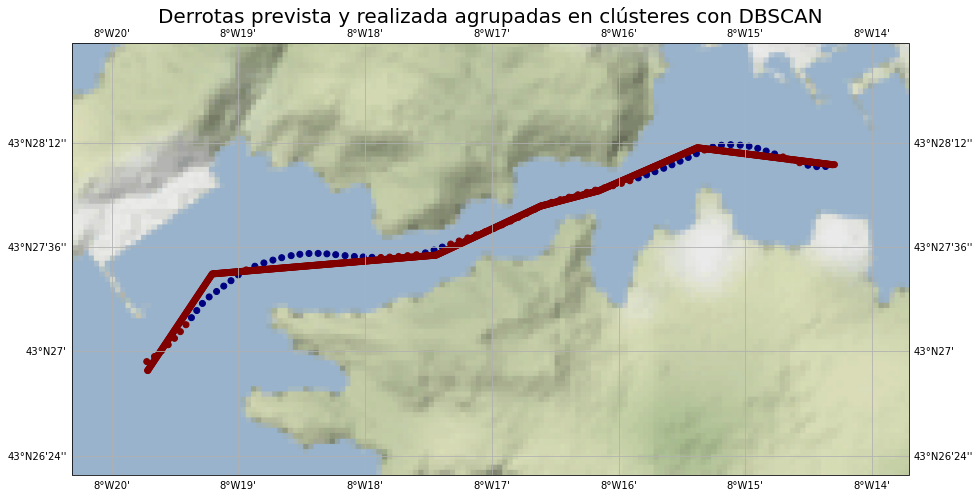

In [73]:
#Mostrar resultados de la clusterizacion con DBSCAN.
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(derrota_gen_df_1["Longitud"])-0.01, np.max(derrota_gen_df_1["Longitud"])+0.01, 
               np.min(derrota_gen_df_1["Latitud"])-0.01, np.max(derrota_gen_df_1["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Derrotas prevista y realizada agrupadas en clústeres con DBSCAN",fontsize=20)

plt.scatter(X["Longitud"], X["Latitud"], c=X["Cluster"], 
            cmap='jet',transform=ccrs.PlateCarree())

# plt.legend(loc='upper left',fontsize=14)

plt.show()

In [74]:
# Obtener el % de puntos detectados como outliers en la derrota de precisión en aguas restringidas.
num_clusters=[]
for i in np.unique(clusters):
    num_clusters.append(np.sum(clusters==i))
num_clusters.sort()

print(num_clusters)

if len (num_clusters)==2:
    total_puntos=len(track_gen_df_db_1)

    pct_outliers=round(np.sum(num_clusters[:-1])*100/total_puntos,2)
else:
    total_puntos=len(track_gen_df_db_1)
    pct_outliers=round(np.sum(num_clusters[:-1])*100/total_puntos,2)
    
print("Porcentaje de puntos de la derrota ejecutada considerados outliers respecto a la derrota planeada: ", pct_outliers, "%")

[44, 946]
Porcentaje de puntos de la derrota ejecutada considerados outliers respecto a la derrota planeada:  52.38 %


In [75]:
#añadir los vlusters a la derrota fusionada.
derrota_fusionada_df_posic["Cluster"]=clusters

In [76]:
#Hacer un dataframe con los outliers detectados para su posterior represenación grafica.
outliers_df=derrota_fusionada_df_posic[derrota_fusionada_df_posic["Cluster"]!=derrota_fusionada_df_posic["Cluster"][np.max(derrota_fusionada_df_posic.index)]]
display(outliers_df.head())
print(len(outliers_df))

,Longitud,Latitud,Cluster
7,-8.322837,43.453241,-1
8,-8.322133,43.453923,-1
9,-8.321389,43.454604,-1
10,-8.320506,43.455228,-1
11,-8.319531,43.455747,-1


44


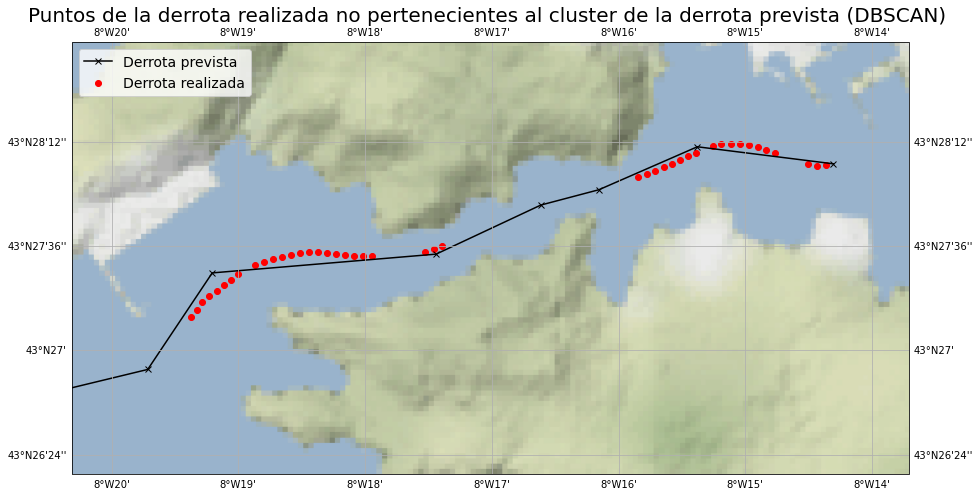

In [77]:
#Mostrar los outliers detectados con DBSCAN.
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(derrota_gen_df_1["Longitud"])-0.01, np.max(derrota_gen_df_1["Longitud"])+0.01, 
               np.min(derrota_gen_df_1["Latitud"])-0.01, np.max(derrota_gen_df_1["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)

plt.title ("Puntos de la derrota realizada no pertenecientes al cluster de la derrota prevista (DBSCAN) ",fontsize=20)

ax.plot(x_derrota, y_derrota,'kx-',transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.scatter(outliers_df["Longitud"], outliers_df["Latitud"], cmap='jet',c="r",transform=ccrs.PlateCarree(),
            label="Derrota realizada")

plt.legend(loc='upper left',fontsize=14)

plt.show()

In [78]:
# Valorar la actitud del alumno mediante los r u m b o s en los tramos evaluados... ¿Hace por acercarse a la derrota?

In [79]:
#Añadir al diccionario de dataframes de los puntos del track asignados aun tramo, el rumbo del tramo de la derrota prevista.
#Añadir tambien el rumbo_efectivo y la velocidad efectiva.
for clave in track_tramos:
    track_tramos[clave]['Rumbo_tramo']=[rumbos_derrota[int(clave[1:])-1]]*len(track_tramos[clave])
    lista_re_ve=[]
    for i in range(0,len(track_tramos[clave])):
        lista_re_ve.append([track_tramos[clave]["Rumbo_barco"][i],track_tramos[clave]["Velocidad_efectiva"][i]])
        
    track_tramos[clave]['Re-Ve']=lista_re_ve
    

display(track_tramos["T1"])

,Longitud,Latitud,Tramo,MilisegundosDesdeInicio,Rumbo_barco,Heading_barco,DistanciaFondoProa,Velocidad,Velocidad_efectiva,Proyecciones,Distancias,x_p,y_p,Rumbo_tramo,Re-Ve
0,-8.346655,43.445045,1,465000,59.553005,63.080444,40.537552,15.638952,16.086366,"(-8.346640215794068, 43.44500465632873)",5.009582,-8.346640,43.445005,76.367724,"[59.55300521850586, 16.086366133292334]"
1,-8.346564,43.445083,1,466000,59.553005,63.592754,40.537552,15.625068,16.074434,"(-8.346541648995647, 43.44502200771905)",7.573575,-8.346542,43.445022,76.367724,"[59.55300521850586, 16.0744335982762]"
2,-8.346472,43.445122,1,467000,60.472275,64.104393,40.334900,15.611280,16.062560,"(-8.346441798563127, 43.445039585076294)",10.233681,-8.346442,43.445040,76.367724,"[60.47227478027344, 16.0625598432044]"
3,-8.346380,43.445159,1,468000,60.934574,64.615540,40.223637,15.597633,16.050790,"(-8.346342636641428, 43.44505704123025)",12.660492,-8.346343,43.445057,76.367724,"[60.93457412719727, 16.050790011285567]"
4,-8.346288,43.445196,1,469000,61.400307,65.124802,40.128078,15.584529,16.039521,"(-8.346243474732843, 43.4450744973819)",15.087303,-8.346243,43.445074,76.367724,"[61.40030670166016, 16.039521375219735]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201,-8.329031,43.448908,1,678000,63.166840,55.271851,26.151606,10.510259,10.924905,"(-8.32875445378974, 43.44815320982442)",93.723170,-8.328754,43.448153,76.367724,"[63.16683959960938, 10.924904960850593]"
202,-8.328966,43.448932,1,679000,62.719086,54.759964,26.053841,10.487800,10.899990,"(-8.328685131785381, 43.448165413052834)",95.187985,-8.328685,43.448165,76.367724,"[62.71908569335938, 10.899989906280984]"
203,-8.328902,43.448957,1,680000,62.270535,54.248146,25.964396,10.465596,10.875298,"(-8.32861640500562, 43.44817751149978)",96.789981,-8.328616,43.448178,76.367724,"[62.27053451538086, 10.875297597869865]"
204,-8.328838,43.448982,1,681000,61.821236,53.736443,25.879601,10.443642,10.850826,"(-8.328583333333333, 43.44818333333333)",98.373569,-8.328583,43.448183,76.367724,"[61.82123565673828, 10.850825672149588]"


In [80]:
#Funcones para obtener los puntos proyectados futuros en cada punto del track en función del rumbo efectivo.
# Primero los incrementos
def seno_long(dato):
    return (dato[1]/60)*math.sin(dato[0]*math.pi/180)/math.cos(np.mean(y_derrota)*math.pi/180)
def cos_lat(dato):
    return (dato[1]/60)*math.cos(dato[0]*math.pi/180)
def seno_long_2(dato):
    return (dato[1]*0.016*5/60)*math.sin(dato[0]*math.pi/180)/math.cos(np.mean(y_derrota)*math.pi/180)
def cos_lat_2(dato):
    return (dato[1]*0.016*5/60)*math.cos(dato[0]*math.pi/180)
def seno_long_3(dato):
    return (30/3600)*math.sin(dato*math.pi/180)/math.cos(np.mean(y_derrota)*math.pi/180)
def cos_lat_3(dato):
    return (30/3600)*math.cos(dato*math.pi/180)
for clave in track_tramos:   
    track_tramos[clave]['inc_lon'] = track_tramos[clave]["Re-Ve"].apply(seno_long)
    track_tramos[clave]['inc_lat'] = track_tramos[clave]["Re-Ve"].apply(cos_lat)
    track_tramos[clave]['inc_lon_2'] = track_tramos[clave]["Re-Ve"].apply(seno_long_2)
    track_tramos[clave]['inc_lat_2'] = track_tramos[clave]["Re-Ve"].apply(cos_lat_2)
    track_tramos[clave]['inc_lon_3'] = track_tramos[clave]["Heading_barco"].apply(seno_long_3)
    track_tramos[clave]['inc_lat_3'] = track_tramos[clave]["Heading_barco"].apply(cos_lat_3)
display(track_tramos["T1"])

,Longitud,Latitud,Tramo,MilisegundosDesdeInicio,Rumbo_barco,Heading_barco,DistanciaFondoProa,Velocidad,Velocidad_efectiva,Proyecciones,...,x_p,y_p,Rumbo_tramo,Re-Ve,inc_lon,inc_lat,inc_lon_2,inc_lat_2,inc_lon_3,inc_lat_3
0,-8.346655,43.445045,1,465000,59.553005,63.080444,40.537552,15.638952,16.086366,"(-8.346640215794068, 43.44500465632873)",...,-8.346640,43.445005,76.367724,"[59.55300521850586, 16.086366133292334]",0.318428,0.135860,0.025474,0.010869,0.010237,0.003773
1,-8.346564,43.445083,1,466000,59.553005,63.592754,40.537552,15.625068,16.074434,"(-8.346541648995647, 43.44502200771905)",...,-8.346542,43.445022,76.367724,"[59.55300521850586, 16.0744335982762]",0.318191,0.135760,0.025455,0.010861,0.010283,0.003706
2,-8.346472,43.445122,1,467000,60.472275,64.104393,40.334900,15.611280,16.062560,"(-8.346441798563127, 43.445039585076294)",...,-8.346442,43.445040,76.367724,"[60.47227478027344, 16.0625598432044]",0.320914,0.131939,0.025673,0.010555,0.010328,0.003639
3,-8.346380,43.445159,1,468000,60.934574,64.615540,40.223637,15.597633,16.050790,"(-8.346342636641428, 43.44505704123025)",...,-8.346343,43.445057,76.367724,"[60.93457412719727, 16.050790011285567]",0.322134,0.129960,0.025771,0.010397,0.010372,0.003572
4,-8.346288,43.445196,1,469000,61.400307,65.124802,40.128078,15.584529,16.039521,"(-8.346243474732843, 43.4450744973819)",...,-8.346243,43.445074,76.367724,"[61.40030670166016, 16.039521375219735]",0.323351,0.127965,0.025868,0.010237,0.010416,0.003505
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201,-8.329031,43.448908,1,678000,63.166840,55.271851,26.151606,10.510259,10.924905,"(-8.32875445378974, 43.44815320982442)",...,-8.328754,43.448153,76.367724,"[63.16683959960938, 10.924904960850593]",0.223839,0.082191,0.017907,0.006575,0.009436,0.004747
202,-8.328966,43.448932,1,679000,62.719086,54.759964,26.053841,10.487800,10.899990,"(-8.328685131785381, 43.448165413052834)",...,-8.328685,43.448165,76.367724,"[62.71908569335938, 10.899989906280984]",0.222439,0.083267,0.017795,0.006661,0.009377,0.004808
203,-8.328902,43.448957,1,680000,62.270535,54.248146,25.964396,10.465596,10.875298,"(-8.32861640500562, 43.44817751149978)",...,-8.328616,43.448178,76.367724,"[62.27053451538086, 10.875297597869865]",0.221033,0.084337,0.017683,0.006747,0.009317,0.004869
204,-8.328838,43.448982,1,681000,61.821236,53.736443,25.879601,10.443642,10.850826,"(-8.328583333333333, 43.44818333333333)",...,-8.328583,43.448183,76.367724,"[61.82123565673828, 10.850825672149588]",0.219619,0.085400,0.017570,0.006832,0.009257,0.004929


In [81]:
#Aplicar los incrementos calculados para obtener los puntos proyectados.
for clave in track_tramos:
    track_tramos[clave]["Longitud_1"]=track_tramos[clave]["Longitud"]+track_tramos[clave]["inc_lon"]
    track_tramos[clave]["Latitud_1"]=track_tramos[clave]["Latitud"]+track_tramos[clave]["inc_lat"]
    track_tramos[clave]["Longitud_2"]=track_tramos[clave]["Longitud"]+track_tramos[clave]["inc_lon_2"]
    track_tramos[clave]["Latitud_2"]=track_tramos[clave]["Latitud"]+track_tramos[clave]["inc_lat_2"]
    track_tramos[clave]["Longitud_3"]=track_tramos[clave]["Longitud"]+track_tramos[clave]["inc_lon_3"]
    track_tramos[clave]["Latitud_3"]=track_tramos[clave]["Latitud"]+track_tramos[clave]["inc_lat_3"]

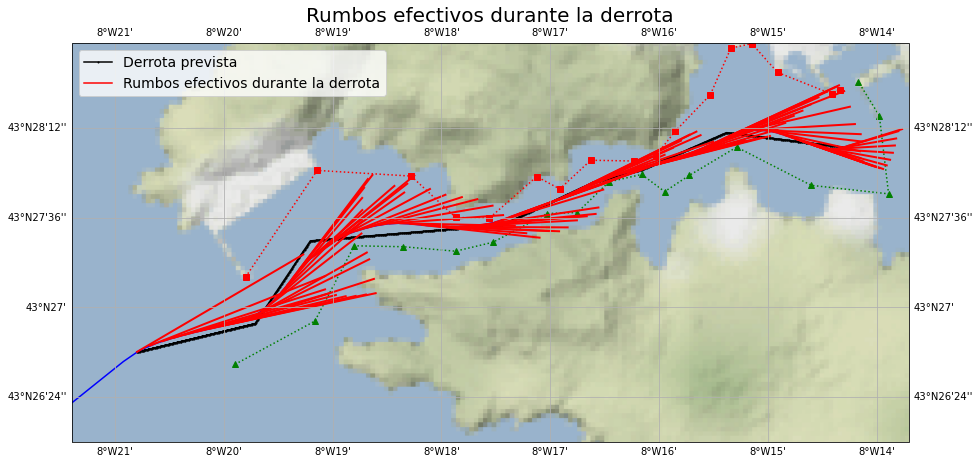

In [82]:
#Mosrar los rumbos sobre el fondo en los puntos del track uniendo los puntos y su priyeccion (solo una muestra)
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(waypoints_df["Longitud"])-0.01, np.max(waypoints_df["Longitud"])+0.01, 
               np.min(waypoints_df["Latitud"])-0.01, np.max(waypoints_df["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Rumbos efectivos durante la derrota",fontsize=20)

plt.plot(derrota_gen_df["Longitud"], derrota_gen_df["Latitud"],"k.-", markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.plot(track_gen_df_1["Longitud"], track_gen_df_1["Latitud"],"b-", markersize=5, transform=ccrs.PlateCarree())
plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs:',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^:',transform=ccrs.PlateCarree())
for clave in track_tramos:
    for i in range(0,len(track_tramos[clave]),20):
        plt.plot([track_tramos[clave]["Longitud"][i], track_tramos[clave]["Longitud_2"][i]],
                 [track_tramos[clave]["Latitud"][i], track_tramos[clave]["Latitud_2"][i]],
                 color="r", linestyle=("-"), linewidth=2, marker='', markersize=4,transform=ccrs.PlateCarree())
    
plt.plot(0, 0,"r-", markersize=2,transform=ccrs.PlateCarree(),label="Rumbos efectivos durante la derrota")
plt.legend(loc='best',fontsize=14) 
        
plt.show()

In [83]:
#Definir los puntos que estan a 20 yardas a cada banda del eje, para no ener en cuenta los rumbos en estos puntos.
track_tramos_c=track_tramos.copy()
for clave in track_tramos_c:
    
    track_tramos_c[clave] = track_tramos_c[clave][track_tramos_c[clave]['Distancias']>20]

In [84]:
#Ver la diferencia de tenerlos en cuenta o no.
print(len(track_tramos["T4"]))
print(len(track_tramos_c["T4"]))

209
74


In [85]:
#Cacular si hay intersección de las lineas definidas por los puntos y su proyeccion con los ejes, para ver si.
#conseguiría llegar al eje durante el tramo.
from shapely.geometry import LineString
for clave in track_tramos_c:
    intersecciones=[]
    for i in track_tramos_c[clave].index:
        line = LineString([(track_tramos_c[clave]['Longitud'][i],track_tramos[clave]['Latitud'][i]),
                           (track_tramos_c[clave]['Longitud_1'][i],track_tramos[clave]['Latitud_1'][i])])
        other = LineString([(x_derrota[int(str(clave)[1:])-1], y_derrota[int(str(clave)[1:])-1]), 
                            (x_derrota[int(str(clave)[1:])], y_derrota[int(str(clave)[1:])])])
        intersecciones.append(line.intersects(other))
    track_tramos_c[clave]['Interseccion']=intersecciones

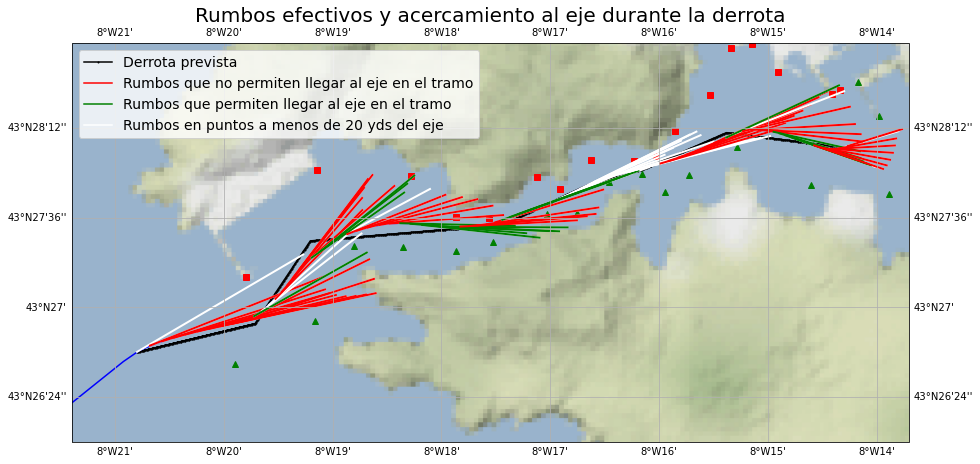

In [86]:
#Mostrar por colores los rumbos que acercan o alejan del eje y los que se está a menos de 20 yds del eje.
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(waypoints_df["Longitud"])-0.01, np.max(waypoints_df["Longitud"])+0.01, 
               np.min(waypoints_df["Latitud"])-0.01, np.max(waypoints_df["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.plot(derrota_gen_df["Longitud"], derrota_gen_df["Latitud"],"k.-", markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.plot(track_gen_df_1["Longitud"], track_gen_df_1["Latitud"],"b-", markersize=5, transform=ccrs.PlateCarree())
plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())
plt.title ("Rumbos efectivos y acercamiento al eje durante la derrota",fontsize=20)

for clave in track_tramos:
    if len(track_tramos[clave])>0:

        for i in range(0,len(track_tramos[clave]),20):

            plt.plot([track_tramos[clave]["Longitud"][i], track_tramos[clave]["Longitud_2"][i]], 
                        [track_tramos[clave]["Latitud"][i], track_tramos[clave]["Latitud_2"][i]],
                        color="w", linestyle=("-"), linewidth=2, marker='', markersize=4,transform=ccrs.PlateCarree())

        for i in track_tramos_c[clave].index:
            clr=""
            if track_tramos_c[clave]["Interseccion"][i]==True:
                clr="g"
            else: clr="r"
                
            if i[0]%20==0:

                plt.plot([track_tramos_c[clave]["Longitud"][i], track_tramos_c[clave]["Longitud_2"][i]], 
                            [track_tramos_c[clave]["Latitud"][i], track_tramos_c[clave]["Latitud_2"][i]],
                            color=clr, linestyle=("-"), linewidth=2, marker='', markersize=4,transform=ccrs.PlateCarree())

plt.plot(0, 0,"r-", markersize=2,transform=ccrs.PlateCarree(),label="Rumbos que no permiten llegar al eje en el tramo")
plt.plot(0, 0,"g-", markersize=2,transform=ccrs.PlateCarree(),label="Rumbos que permiten llegar al eje en el tramo")
plt.plot(0, 0,"-",color="w", markersize=2,transform=ccrs.PlateCarree(),label="Rumbos en puntos a menos de 20 yds del eje")
plt.legend(loc='best',fontsize=14) 

plt.show()

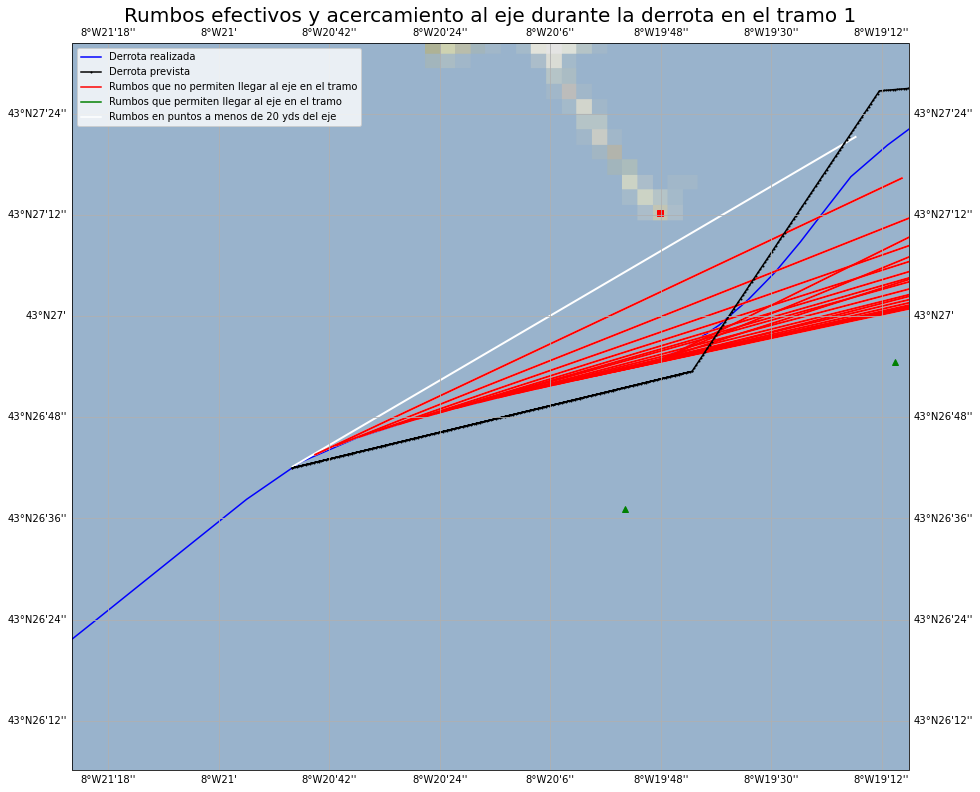

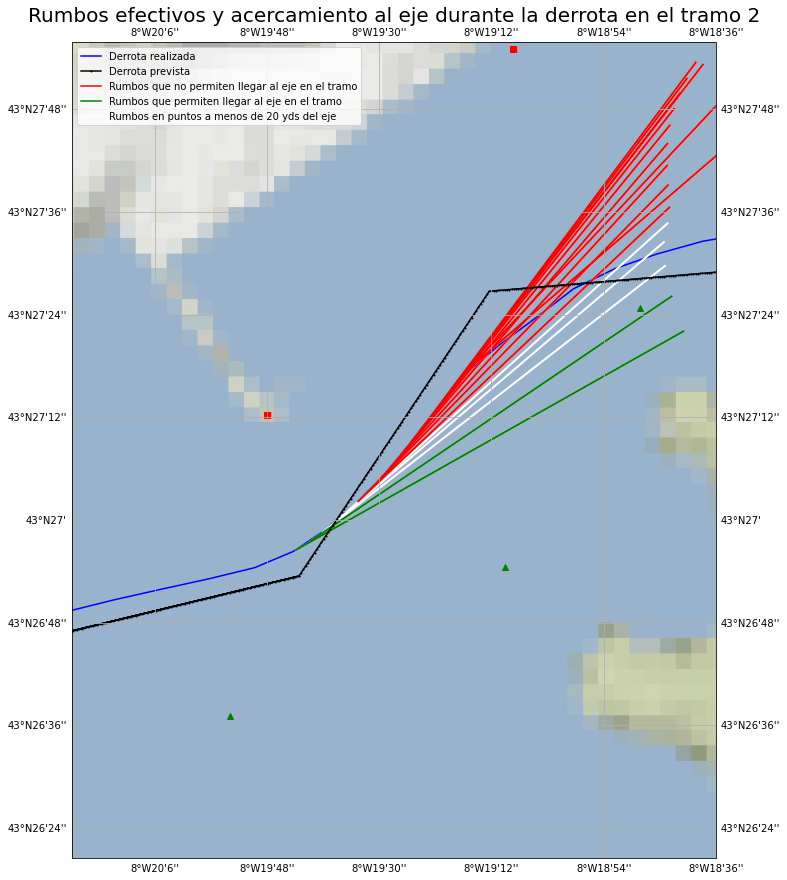

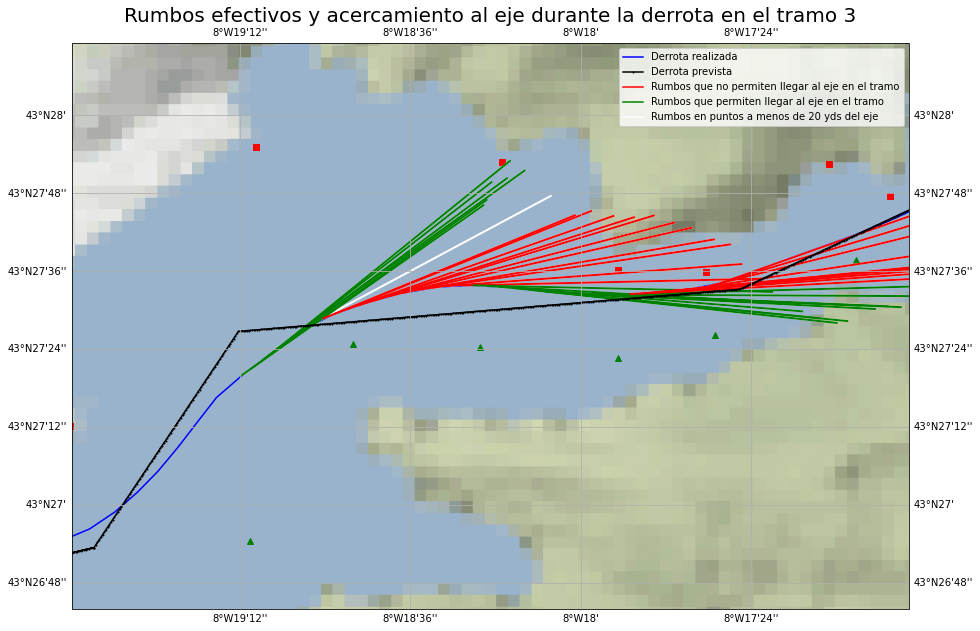

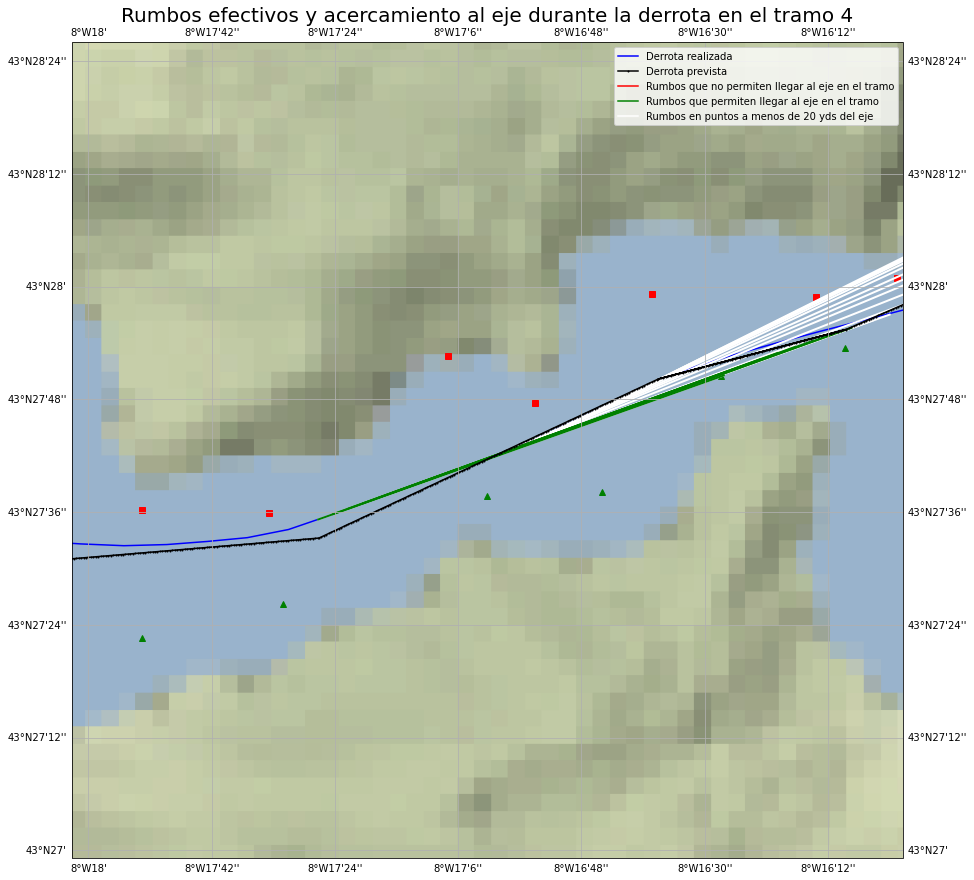

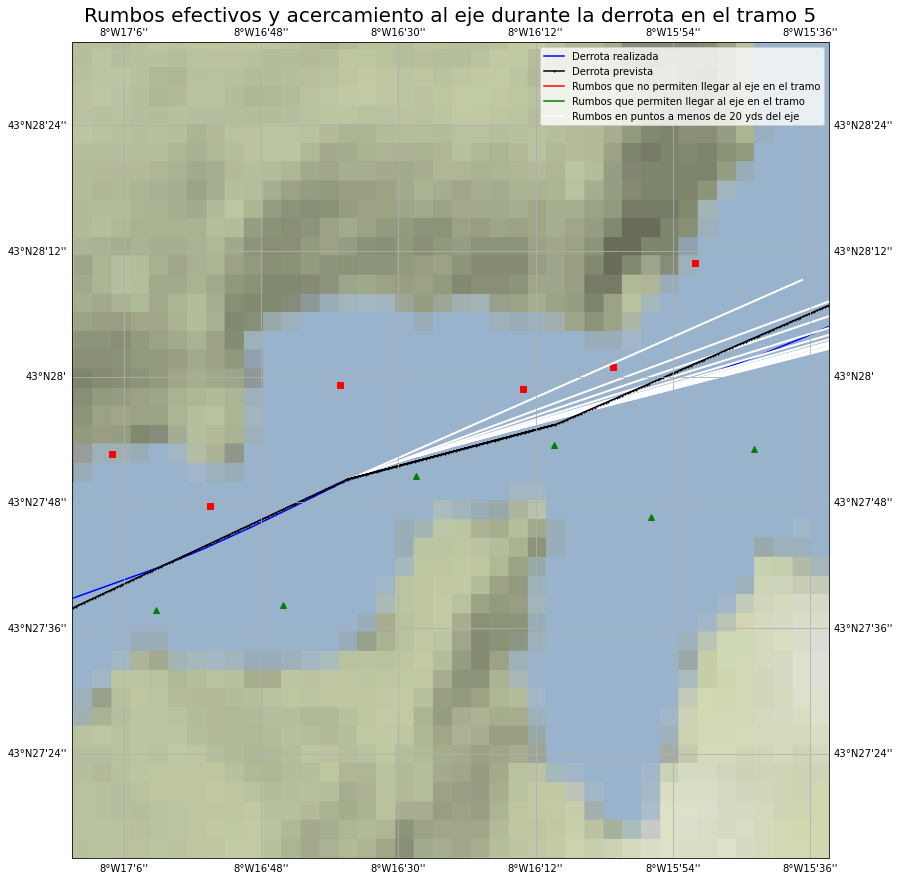

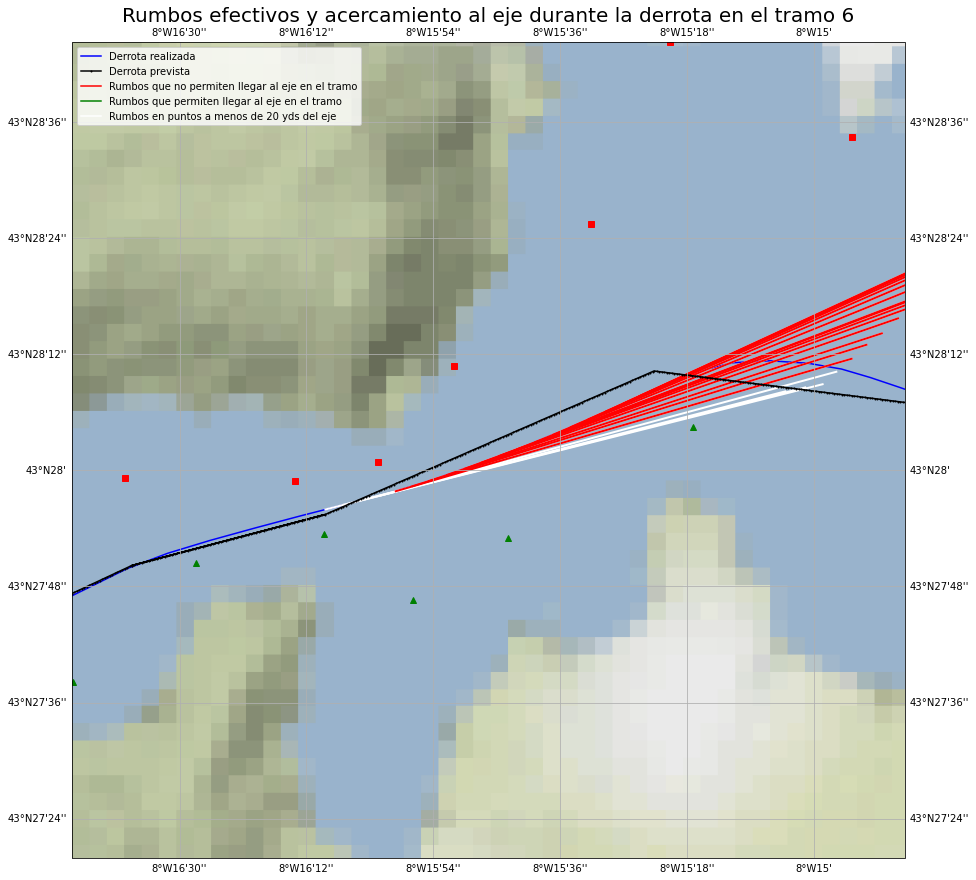

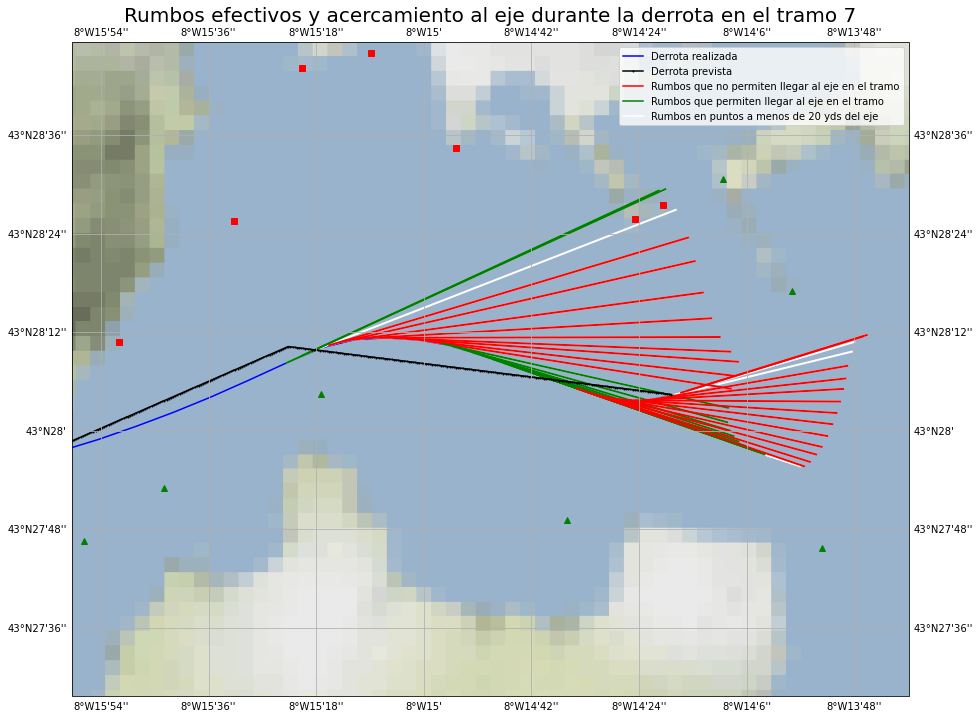

In [87]:
#Mostrarlos ahora por tramos.

for clave in track_tramos:
    if len(track_tramos[clave])>0:
        tiler = Stamen('terrain-background')
        mercator = tiler.crs
        
        fig = plt.figure(figsize=(15, 15))
        ax = plt.axes(projection=ccrs.Mercator())
        ax.set_extent([track_tramos[clave]["Longitud"].min()-0.01, track_tramos[clave]["Longitud"].max()+0.01, 
                       track_tramos[clave]["Latitud"].min()-0.01, track_tramos[clave]["Latitud"].max()+0.01])
        ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
        ax.add_feature(cf.OCEAN)
        ax.add_image(tiler, 11)
        
        plt.plot(track_gen_df_1["Longitud"], track_gen_df_1["Latitud"],"b-", markersize=5, transform=ccrs.PlateCarree(),label="Derrota realizada")
        plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
        plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())
        
        plt.title ("Rumbos efectivos y acercamiento al eje durante la derrota en el tramo "+str(clave[1:]),fontsize=20)

        for i in range(0,len(track_tramos[clave]),10):

            plt.plot([track_tramos[clave]["Longitud"][i], track_tramos[clave]["Longitud_2"][i]], 
                     [track_tramos[clave]["Latitud"][i], track_tramos[clave]["Latitud_2"][i]],
                     color="w", linestyle=("-"), linewidth=2, marker='', markersize=4,transform=ccrs.PlateCarree())
            
        for i in track_tramos_c[clave].index:
            clr=""
            if track_tramos_c[clave]["Interseccion"][i]==True:
                clr="g"
            else: clr="r"
                
            if i[0]%10==0:

                plt.plot([track_tramos_c[clave]["Longitud"][i], track_tramos_c[clave]["Longitud_2"][i]], 
                         [track_tramos_c[clave]["Latitud"][i], track_tramos_c[clave]["Latitud_2"][i]],
                         color=clr, linestyle=("-"), linewidth=2, marker='', markersize=4,transform=ccrs.PlateCarree())
                
        plt.plot(derrota_gen_df["Longitud"], derrota_gen_df["Latitud"],"k.-", markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")
        plt.plot(0, 0,"r-", markersize=2,transform=ccrs.PlateCarree(),label="Rumbos que no permiten llegar al eje en el tramo")
        plt.plot(0, 0,"g-", markersize=2,transform=ccrs.PlateCarree(),label="Rumbos que permiten llegar al eje en el tramo")
        plt.plot(0, 0,"-",color="w", markersize=2,transform=ccrs.PlateCarree(),label="Rumbos en puntos a menos de 20 yds del eje")
        plt.legend(loc='best',fontsize=10) 

plt.show()

In [88]:
#Tabla para mostrar los datos de rumbos.
rumbos_tramos_alej=[]
for clave in track_tramos_c:
    tramo=clave
    total=len(track_tramos[clave])
    total_20=len(track_tramos_c[clave])
    aleja=len(track_tramos_c[clave][track_tramos_c[clave]["Interseccion"]==False])
    acerca=len(track_tramos_c[clave][track_tramos_c[clave]["Interseccion"]==True])
    rumbos_tramos_alej.append([tramo,total,total_20,acerca,aleja])
tramos_alej_df=pd.DataFrame(list(rumbos_tramos_alej), 
               columns =['Tramo','Total_Puntos','Total_>20yds','Hacia_eje>20yds','No_Hacia_eje_>20yds'])
tramos_alej_df['Porcentaje_Rumbos_no_hacia_eje']=tramos_alej_df['No_Hacia_eje_>20yds']*100/tramos_alej_df['Total_Puntos']
display(tramos_alej_df)

,Tramo,Total_Puntos,Total_>20yds,Hacia_eje>20yds,No_Hacia_eje_>20yds,Porcentaje_Rumbos_no_hacia_eje
0,T1,206,200,0,200,97.087379
1,T2,170,147,20,127,74.705882
2,T3,397,385,171,214,53.904282
3,T4,209,74,74,0,0.000000
4,T5,111,0,0,0,0.000000
5,T6,187,151,0,151,80.748663
6,T7,409,324,101,223,54.523227


In [89]:
# Reducir el numero de puntos de la rerrota realizada por el alumno para algoritmo, para calcular distancia de paso a los wp.
x_track_gen_2=[]
y_track_gen_2=[]
time_xy_track_gen_2=[]
for index in range(0,len(datos_sim.index),5):
    x_track_gen_2.append(round(datos_sim["Longitud"][index],10))
    y_track_gen_2.append(round(datos_sim["Latitud"][index],10))
    time_xy_track_gen_2.append(datos_sim["MilisegundosDesdeInicio"][index])
    
track_gen_df_2 = pd.DataFrame(list(zip(x_track_gen_2, y_track_gen_2,time_xy_track_gen_2)), 
               columns =['Longitud', 'Latitud',"MilisegundosDesdeInicio"]) 

track_gen_df_2=track_gen_df_2.drop_duplicates(subset=["Longitud"])
track_gen_df_2.index=[list(range(0,len(track_gen_df_2)))]
print("Número de muestras: ",len(track_gen_df_2))

Número de muestras:  412


In [90]:
# Distancia de paso a los waypoints.

In [91]:
#calcular punto a punto las distancias mínimas a los wp.
parejas_wp=[]
parejas_coord_wp=[]
dist_mins_wp=[]
print("Calculando....")
for i in range(len(waypoints_df)):
    diferencias_wp=[]
    for j in range(len(track_gen_df_2)):
        dis= (((waypoints_df["Latitud"][i]-track_gen_df_2["Latitud"][j])**2+
        (((waypoints_df["Longitud"][i]-track_gen_df_2["Longitud"][j]))*
         (math.cos((np.mean(y_derrota))*(math.pi)/180)))**2))**(1/2)

        diferencias_wp.append(dis)
    parejas_wp.append([i,diferencias_wp.index(np.min(diferencias_wp)),round(np.min(diferencias_wp)*2000*60,2),
                    track_gen_df_2 ['MilisegundosDesdeInicio'][i]])
    if i>0 and i<len(waypoints_df)-1:
        parejas_coord_wp.append([[waypoints_df["Longitud"][i],waypoints_df["Latitud"][i]],
                             [track_gen_df_2["Longitud"][diferencias_wp.index(np.min(diferencias_wp))],
                              track_gen_df_2["Latitud"][diferencias_wp.index(np.min(diferencias_wp))]],
                                 [track_gen_df_2["Longitud"][diferencias_wp.index(np.min(diferencias_wp))-10],
                              track_gen_df_2["Latitud"][diferencias_wp.index(np.min(diferencias_wp))-10]],
                                 [track_gen_df_2["Longitud"][diferencias_wp.index(np.min(diferencias_wp))+10],
                              track_gen_df_2["Latitud"][diferencias_wp.index(np.min(diferencias_wp))+10]],
                                 [track_gen_df_2["Longitud"][diferencias_wp.index(np.min(diferencias_wp))+15],
                              track_gen_df_2["Latitud"][diferencias_wp.index(np.min(diferencias_wp))+15]],
                                 [track_gen_df_2["Longitud"][diferencias_wp.index(np.min(diferencias_wp))+20],
                              track_gen_df_2["Latitud"][diferencias_wp.index(np.min(diferencias_wp))+20]],
                                 
                             round(np.min(diferencias_wp)*2000*60,2)])
    else: 
        parejas_coord_wp.append([[waypoints_df["Longitud"][i],waypoints_df["Latitud"][i]],
                             [track_gen_df_2["Longitud"][diferencias_wp.index(np.min(diferencias_wp))],
                              track_gen_df_2["Latitud"][diferencias_wp.index(np.min(diferencias_wp))]],
                             round(np.min(diferencias_wp)*2000*60,2)])
    dist_mins_wp.append(round(np.min(diferencias_wp)*2000*60,2))
print("Finalizado")


Calculando....
Finalizado


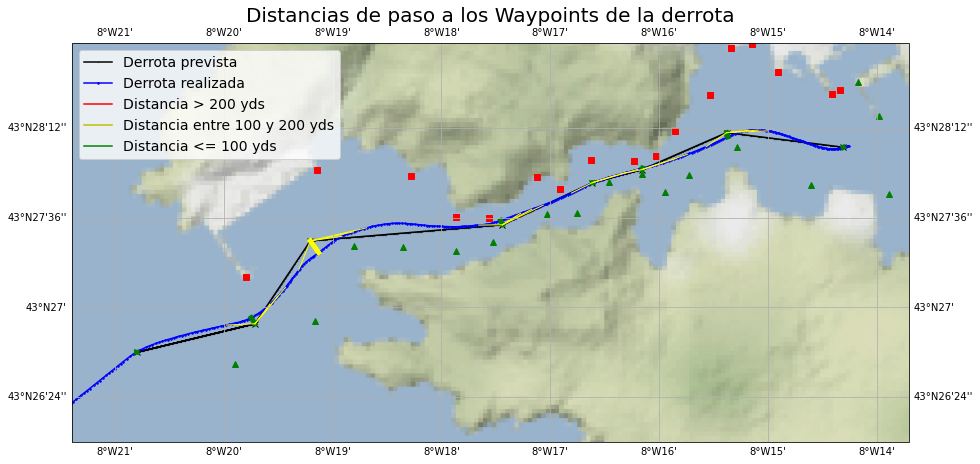

In [92]:
#Mostrar las distancias de paso a waypoints con codigos de colores.
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(waypoints_df["Longitud"])-0.01, np.max(waypoints_df["Longitud"])+0.01, 
               np.min(waypoints_df["Latitud"])-0.01, np.max(waypoints_df["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Distancias de paso a los Waypoints de la derrota",fontsize=20)

plt.plot(derrota_gen_df["Longitud"], derrota_gen_df["Latitud"],"k.-", markersize=0.4,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.plot(waypoints_df["Longitud"], waypoints_df["Latitud"],"kx",transform=ccrs.PlateCarree())
plt.plot(track_gen_df_2["Longitud"], track_gen_df_2["Latitud"],"b.-", markersize=3, transform=ccrs.PlateCarree(),label="Derrota realizada")
plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())

for i in range(len(parejas_wp)):
    colores=["red","green", "yellow" ]
    clr=""
    if dist_mins_wp[i] > 200:
        clr=colores[0]
    elif 100 < dist_mins_wp[i] <= 200:
        clr=colores[2]
    else: clr=colores[1]
    plt.plot([waypoints_df["Longitud"][parejas_wp[i][0]], track_gen_df_2["Longitud"][parejas_wp[i][1]]], 
             [waypoints_df["Latitud"][parejas_wp[i][0]], track_gen_df_2["Latitud"][parejas_wp[i][1]]],
          color=clr, linestyle=("-"), linewidth=5, marker='', markersize=4,transform=ccrs.PlateCarree())
    if i>0 and i<len(parejas_wp)-1:
        plt.plot([waypoints_df["Longitud"][parejas_wp[i][0]], parejas_coord_wp[i][2][0]], 
                 [waypoints_df["Latitud"][parejas_wp[i][0]], parejas_coord_wp[i][2][1]],
              color="yellow", linestyle=("-"), linewidth=1, marker='', markersize=2,transform=ccrs.PlateCarree())
        plt.plot([waypoints_df["Longitud"][parejas_wp[i][0]], parejas_coord_wp[i][3][0]], 
                 [waypoints_df["Latitud"][parejas_wp[i][0]], parejas_coord_wp[i][3][1]],
              color="yellow", linestyle=("-"), linewidth=1, marker='', markersize=2,transform=ccrs.PlateCarree())
        plt.plot([waypoints_df["Longitud"][parejas_wp[i][0]], parejas_coord_wp[i][4][0]], 
                 [waypoints_df["Latitud"][parejas_wp[i][0]], parejas_coord_wp[i][4][1]],
              color="yellow", linestyle=("-"), linewidth=1, marker='', markersize=2,transform=ccrs.PlateCarree())
        plt.plot([waypoints_df["Longitud"][parejas_wp[i][0]], parejas_coord_wp[i][5][0]], 
                 [waypoints_df["Latitud"][parejas_wp[i][0]], parejas_coord_wp[i][5][1]],
              color="yellow", linestyle=("-"), linewidth=1, marker='', markersize=2,transform=ccrs.PlateCarree())

plt.plot(0, 0,"r-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia > 200 yds")
plt.plot(0, 0,"y-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia entre 100 y 200 yds")
plt.plot(0, 0,"g-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia <= 100 yds")

plt.legend(loc='best',fontsize=14)     
plt.show()

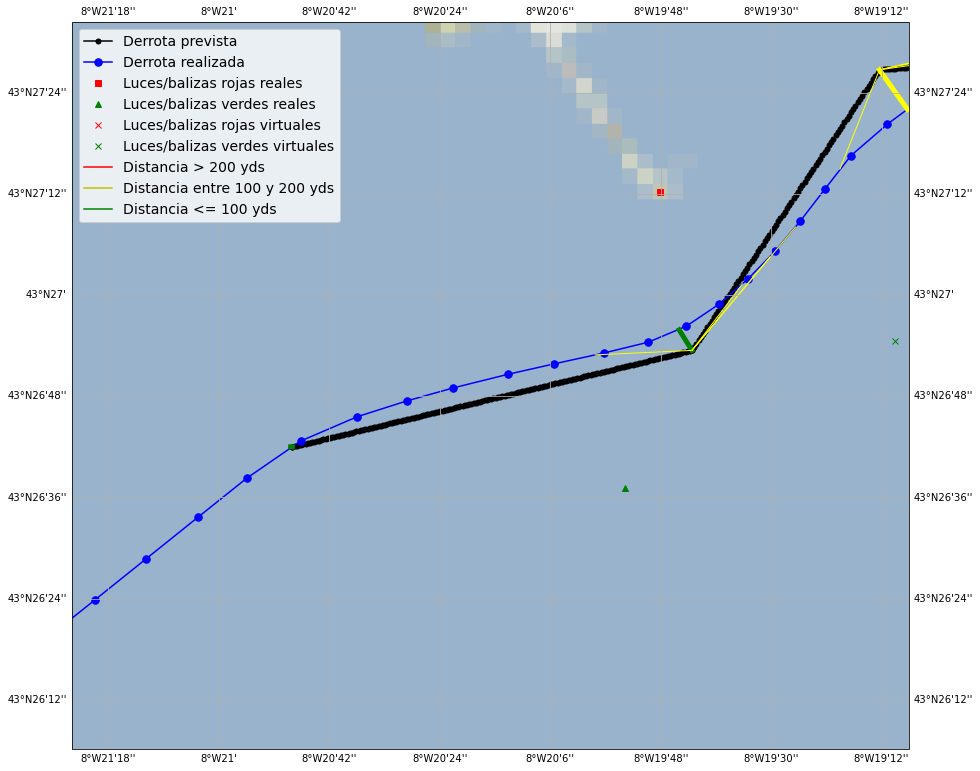

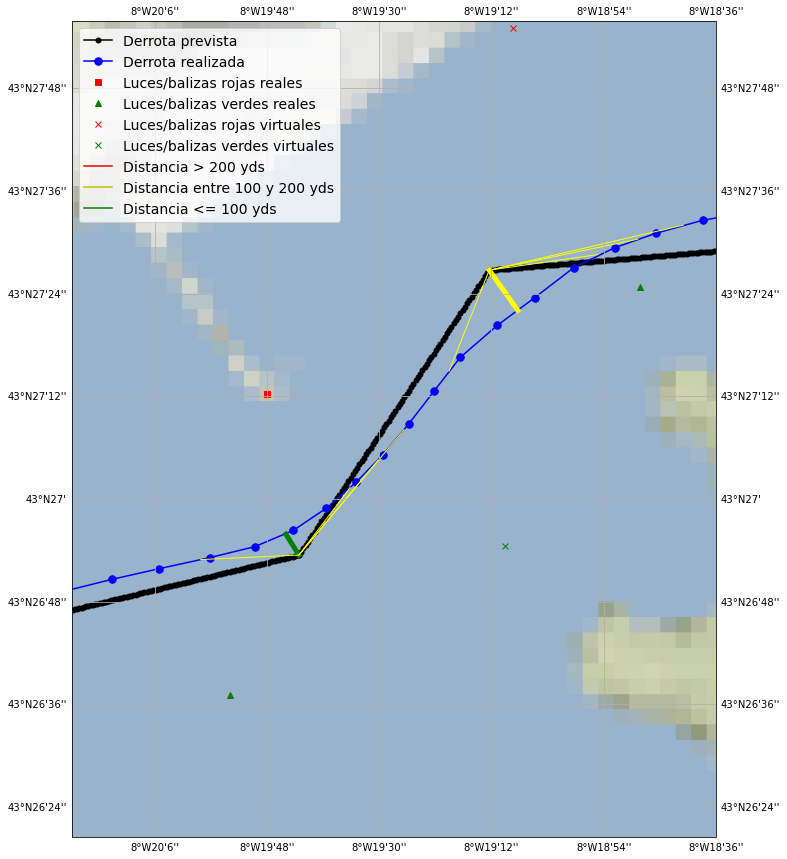

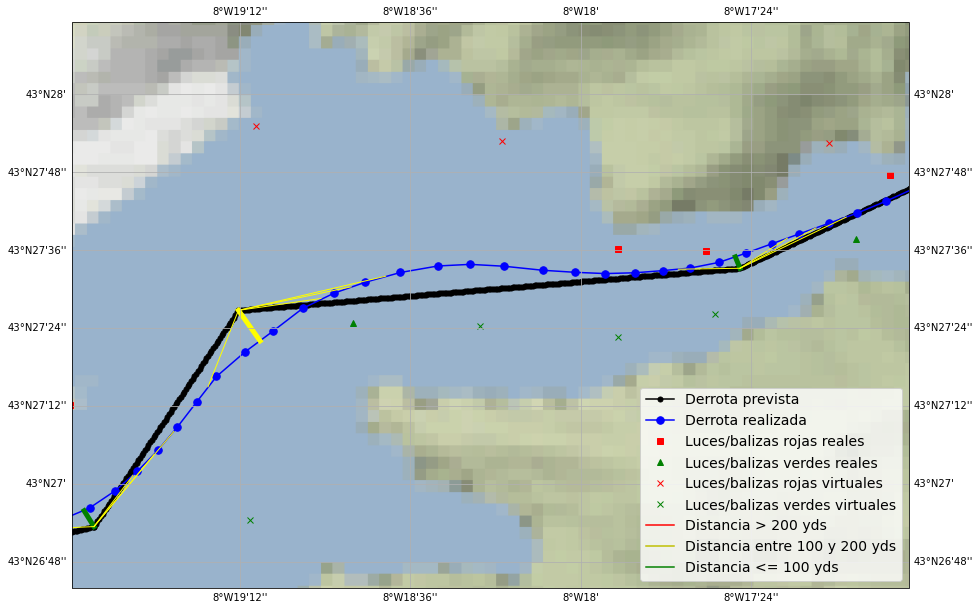

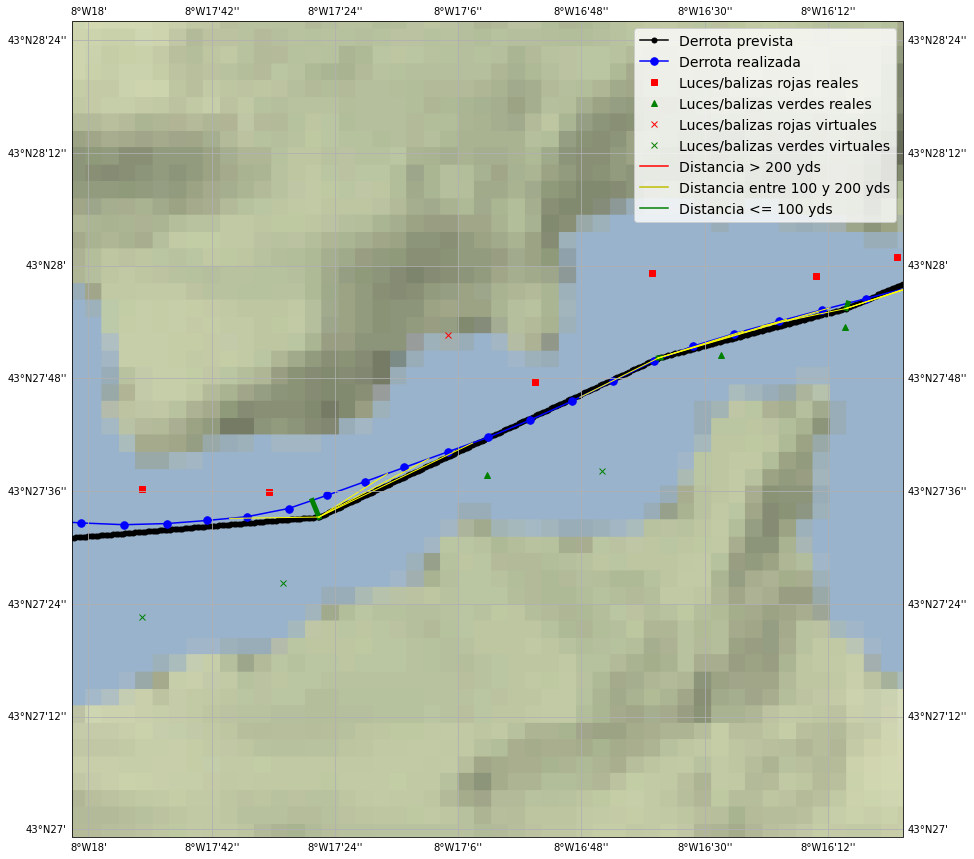

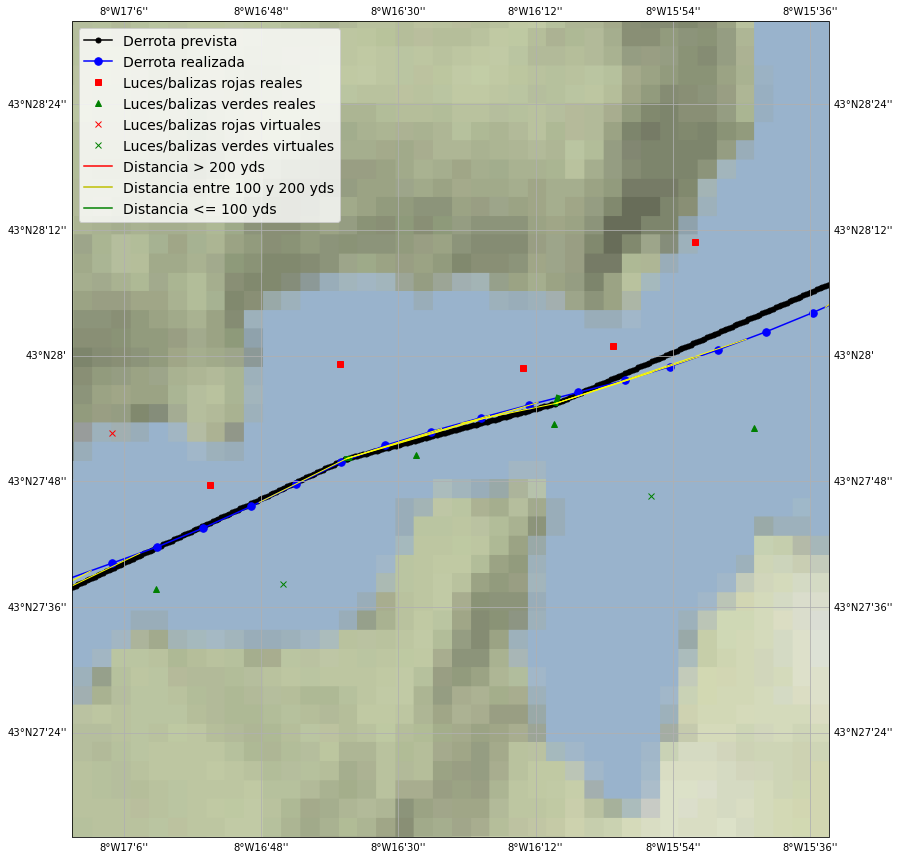

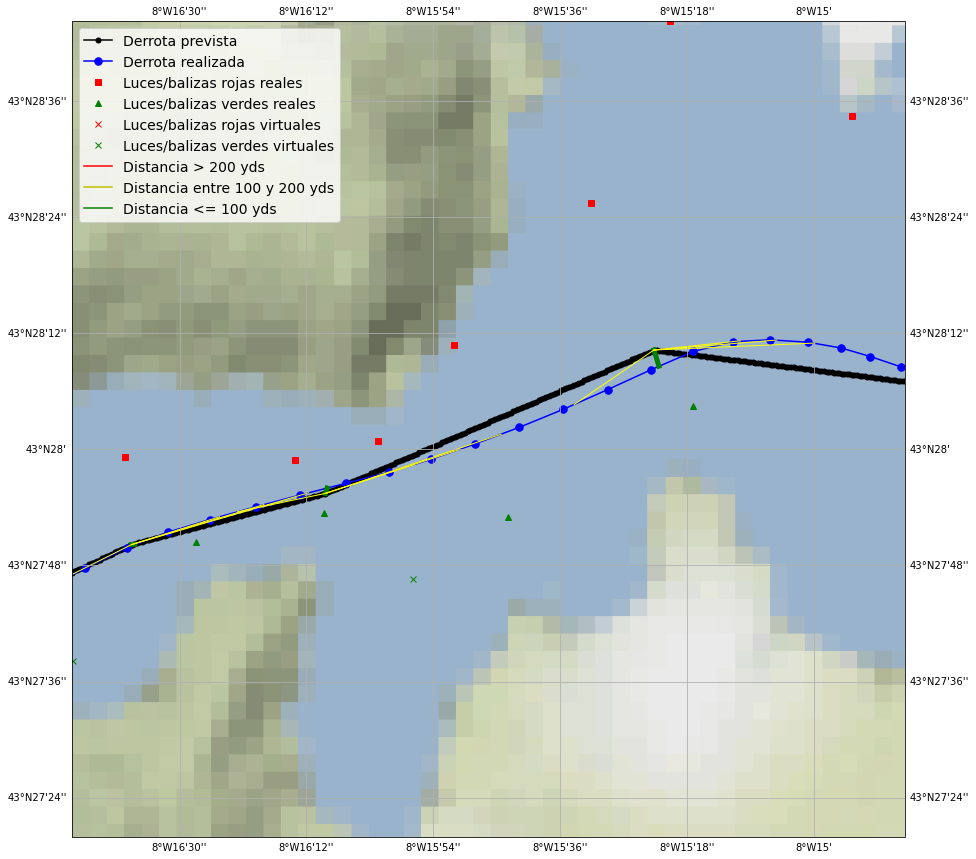

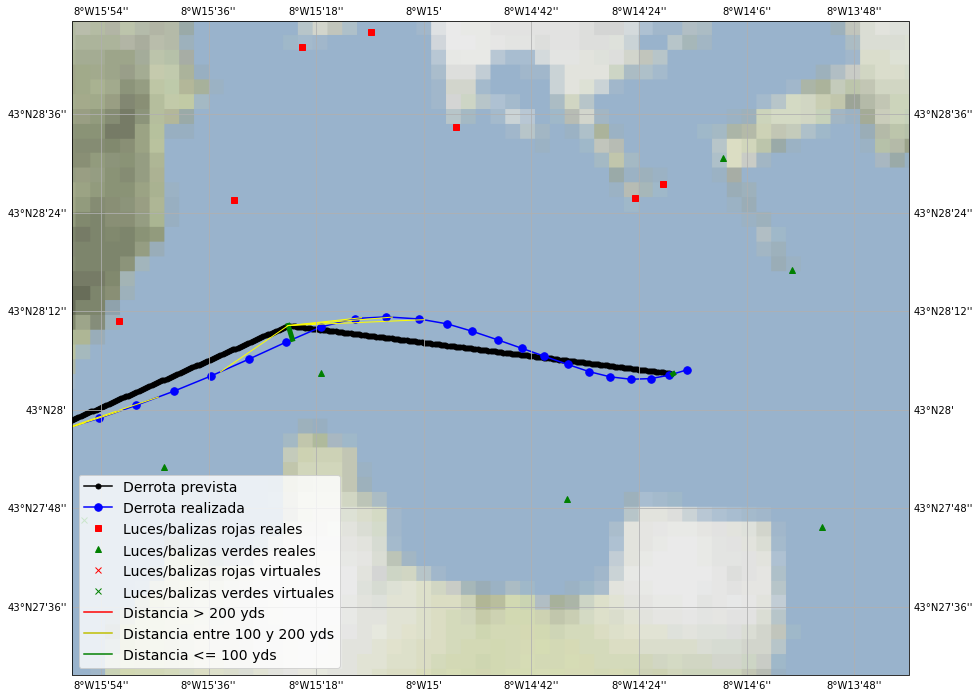

In [93]:
#Mostrar las distancias de paso a waypoints con codigos de colores.
for clave in track_tramos:
    if len(track_tramos[clave])>0:
        tiler = Stamen('terrain-background')
        mercator = tiler.crs
        
        fig = plt.figure(figsize=(15, 15))
        ax = plt.axes(projection=ccrs.Mercator())
        ax.set_extent([track_tramos[clave]["Longitud"].min()-0.01, track_tramos[clave]["Longitud"].max()+0.01, 
                       track_tramos[clave]["Latitud"].min()-0.01, track_tramos[clave]["Latitud"].max()+0.01])
        ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
        ax.add_feature(cf.OCEAN)
        ax.add_image(tiler, 11)
        plt.plot(derrota_gen_df["Longitud"], derrota_gen_df["Latitud"],"k.-", markersize=10,transform=ccrs.PlateCarree(),label="Derrota prevista")
        plt.plot(track_gen_df_1["Longitud"], track_gen_df_1["Latitud"],"b.-", markersize=15,transform=ccrs.PlateCarree(),label="Derrota realizada")
        ax.plot(x_rojas_ferrol, y_rojas_ferrol,'rs',transform=ccrs.PlateCarree(),label="Luces/balizas rojas reales")
        ax.plot(x_verdes_ferrol, y_verdes_ferrol,'g^',transform=ccrs.PlateCarree(),label="Luces/balizas verdes reales")
        ax.plot(x_rojas_v_ferrol, y_rojas_v_ferrol,'rx',transform=ccrs.PlateCarree(),label="Luces/balizas rojas virtuales")
        ax.plot(x_verdes_v_ferrol, y_verdes_v_ferrol,'gx',transform=ccrs.PlateCarree(),label="Luces/balizas verdes virtuales")
        ax.add_feature(cf.OCEAN)

        for i in range(len(parejas_wp)):
            colores=["red","green", "yellow" ]
            clr=""
            if dist_mins_wp[i] > 200:
                clr=colores[0]
            elif 100 < dist_mins_wp[i] <= 200:
                clr=colores[2]
            else: clr=colores[1]
            plt.plot([waypoints_df["Longitud"][parejas_wp[i][0]], track_gen_df_2["Longitud"][parejas_wp[i][1]]], 
                     [waypoints_df["Latitud"][parejas_wp[i][0]], track_gen_df_2["Latitud"][parejas_wp[i][1]]],
                  color=clr, linestyle=("-"), linewidth=5, marker='', markersize=4,transform=ccrs.PlateCarree())
            if i>0 and i<len(parejas_wp)-1:
                plt.plot([waypoints_df["Longitud"][parejas_wp[i][0]], parejas_coord_wp[i][2][0]], 
                         [waypoints_df["Latitud"][parejas_wp[i][0]], parejas_coord_wp[i][2][1]],
                      color="yellow", linestyle=("-"), linewidth=1, marker='', markersize=2,transform=ccrs.PlateCarree())
                plt.plot([waypoints_df["Longitud"][parejas_wp[i][0]], parejas_coord_wp[i][3][0]], 
                         [waypoints_df["Latitud"][parejas_wp[i][0]], parejas_coord_wp[i][3][1]],
                      color="yellow", linestyle=("-"), linewidth=1, marker='', markersize=2,transform=ccrs.PlateCarree())
                plt.plot([waypoints_df["Longitud"][parejas_wp[i][0]], parejas_coord_wp[i][4][0]], 
                         [waypoints_df["Latitud"][parejas_wp[i][0]], parejas_coord_wp[i][4][1]],
                      color="yellow", linestyle=("-"), linewidth=1, marker='', markersize=2,transform=ccrs.PlateCarree())
                plt.plot([waypoints_df["Longitud"][parejas_wp[i][0]], parejas_coord_wp[i][5][0]], 
                         [waypoints_df["Latitud"][parejas_wp[i][0]], parejas_coord_wp[i][5][1]],
                      color="yellow", linestyle=("-"), linewidth=1, marker='', markersize=2,transform=ccrs.PlateCarree())

        plt.plot(0, 0,"r-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia > 200 yds")
        plt.plot(0, 0,"y-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia entre 100 y 200 yds")
        plt.plot(0, 0,"g-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia <= 100 yds")

        plt.legend(loc='best',fontsize=14)     
        plt.show()

In [94]:
#Juntar todos los tramos en un dataframe para calcular los datos de interes. Empezar por el primer tramo evaluado.
track_tramos_df=track_tramos["T1"].copy()
for clave in track_tramos:
    if clave!="T1":
        track_tramos_df= pd.merge(track_tramos_df,
                                  track_tramos[clave], how="outer",on=["Longitud","Latitud",
                                                           "Tramo","MilisegundosDesdeInicio","Proyecciones",
                                                                       "Distancias","x_p","y_p"],
                                  indicator=False)

display(track_tramos_df)

,Longitud,Latitud,Tramo,MilisegundosDesdeInicio,Rumbo_barco_x,Heading_barco_x,DistanciaFondoProa_x,Velocidad_x,Velocidad_efectiva_x,Proyecciones,...,inc_lon_2,inc_lat_2,inc_lon_3,inc_lat_3,Longitud_1,Latitud_1,Longitud_2,Latitud_2,Longitud_3,Latitud_3
0,-8.346655,43.445045,1,465000,59.553005,63.080444,40.537552,15.638952,16.086366,"(-8.346640215794068, 43.44500465632873)",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-8.346564,43.445083,1,466000,59.553005,63.592754,40.537552,15.625068,16.074434,"(-8.346541648995647, 43.44502200771905)",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-8.346472,43.445122,1,467000,60.472275,64.104393,40.334900,15.611280,16.062560,"(-8.346441798563127, 43.445039585076294)",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-8.346380,43.445159,1,468000,60.934574,64.615540,40.223637,15.597633,16.050790,"(-8.346342636641428, 43.44505704123025)",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-8.346288,43.445196,1,469000,61.400307,65.124802,40.128078,15.584529,16.039521,"(-8.346243474732843, 43.4450744973819)",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1684,-8.237593,43.468057,7,2319000,NaN,NaN,NaN,NaN,NaN,"(-8.2384, 43.46788333333333)",...,0.008208,0.001889,0.010726,0.002971,-8.134990,43.491666,-8.229385,43.469946,-8.226867,43.471028
1685,-8.237562,43.468065,7,2320000,NaN,NaN,NaN,NaN,NaN,"(-8.2384, 43.46788333333333)",...,0.008184,0.001893,0.010711,0.003000,-8.135259,43.491729,-8.229378,43.469958,-8.226851,43.471065
1686,-8.237530,43.468072,7,2321000,NaN,NaN,NaN,NaN,NaN,"(-8.2384, 43.46788333333333)",...,0.008160,0.001898,0.010694,0.003031,-8.135531,43.491797,-8.229370,43.469970,-8.226836,43.471103
1687,-8.237499,43.468079,7,2322000,NaN,NaN,NaN,NaN,NaN,"(-8.2384, 43.46788333333333)",...,0.008135,0.001903,0.010677,0.003063,-8.135807,43.491871,-8.229364,43.469982,-8.226822,43.471142


In [95]:
#En total, no se va  autilizar.
distancia_maxima=track_tramos_df["Distancias"].max()
distancia_minima=track_tramos_df["Distancias"].min()
distancia_media=track_tramos_df["Distancias"].mean()

num_dist_menor_50=track_tramos_df["Distancias"][track_tramos_df["Distancias"]<50].count()
pct_dist_men_50=round(num_dist_menor_50*100/len(track_tramos_df),3)

num_dist_50_100=track_tramos_df["Distancias"][track_tramos_df["Distancias"]<=100].count()
pct_dist_50_100=round((num_dist_50_100-num_dist_menor_50)*100/len(track_tramos_df),3)

num_dist_100_150=track_tramos_df["Distancias"][track_tramos_df["Distancias"]<=150].count()
pct_dist_100_150=round((num_dist_100_150-num_dist_50_100)*100/len(track_tramos_df),3)

num_dist_150_200=track_tramos_df["Distancias"][track_tramos_df["Distancias"]<=200].count()
pct_dist_150_200=round((num_dist_150_200-num_dist_100_150)*100/len(track_tramos_df),3)

num_dist_may_200=track_tramos_df["Distancias"][track_tramos_df["Distancias"]>200].count()
pct_dist_may_200=round((num_dist_may_200)*100/len(track_tramos_df),3)

print("Distancia de separación máxima: ", distancia_maxima)
print("Distancia de separación mínima: ", distancia_minima)
print("Distancia de separación media: ", distancia_media)
print("% distancias menores a 50 yardas: ", pct_dist_men_50)
print("% distancias entre 50 y 100 yardas: ", pct_dist_50_100)
print("% distancias entre 100 y 150 yardas: ", pct_dist_100_150)
print("% distancias entre 150 y 200 yardas: ", pct_dist_150_200)
print("% distancias mayores a 200 yardas: ", pct_dist_may_200)


Distancia de separación máxima:  225.0504495760273
Distancia de separación mínima:  0.0041034495944082625
Distancia de separación media:  51.346551483683456
% distancias menores a 50 yardas:  53.464
% distancias entre 50 y 100 yardas:  37.419
% distancias entre 100 y 150 yardas:  7.815
% distancias entre 150 y 200 yardas:  0.71
% distancias mayores a 200 yardas:  0.592


In [96]:
lista_tabla_d_total=[[round(distancia_maxima,3), round(distancia_minima,3),round(distancia_media,3)
                      ,round(pct_dist_men_50,3), round(pct_dist_50_100,3),
                      round(pct_dist_100_150,3), round(pct_dist_150_200,3),round(pct_dist_may_200,3)]]

tabla_d_total=pd.DataFrame(list(lista_tabla_d_total), columns =['D_max', 'D_min', 'D_med','%D<50','%D_50-100','%D_100-150',
                                                                '%D_150-200',"%D>200"])

display(tabla_d_total)

,D_max,D_min,D_med,%D<50,%D_50-100,%D_100-150,%D_150-200,%D>200
0,225.05,0.004,51.347,53.464,37.419,7.815,0.71,0.592


In [97]:
#Tramo a tramo, si se va a utilizar.
distancias_por_tramo=[]

for clave in track_tramos:
    distancia_max_t=(round(track_tramos[clave]['Distancias'].max(),3))
    distancia_min_t=(round(track_tramos[clave]['Distancias'].min(),3))
    distancia_media_t=(round(track_tramos[clave]['Distancias'].mean(),3))
    
    
    num_dist_menor_50_t=track_tramos[clave]["Distancias"][track_tramos[clave]["Distancias"]<50].count()
    pct_dist_men_50_t=round(num_dist_menor_50_t*100/len(track_tramos[clave]),3)

    num_dist_50_100_t=track_tramos[clave]["Distancias"][track_tramos[clave]["Distancias"]<=100].count()
    pct_dist_50_100_t=round((num_dist_50_100_t-num_dist_menor_50_t)*100/len(track_tramos[clave]),3)

    num_dist_100_150_t=track_tramos[clave]["Distancias"][track_tramos[clave]["Distancias"]<=150].count()
    pct_dist_100_150_t=round((num_dist_100_150_t-num_dist_50_100_t)*100/len(track_tramos[clave]),3)

    num_dist_150_200_t=track_tramos[clave]["Distancias"][track_tramos[clave]["Distancias"]<=200].count()
    pct_dist_150_200_t=round((num_dist_150_200_t-num_dist_100_150_t)*100/len(track_tramos[clave]),3)

    num_dist_may_200_t=track_tramos[clave]["Distancias"][track_tramos[clave]["Distancias"]>200].count()
    pct_dist_may_200_t=round((num_dist_may_200_t)*100/len(track_tramos[clave]),3)
    
    aguas_restringidas=False
    if int(clave[1:]) in tramos_restringidos:
        aguas_restringidas=True
    
    distancias_por_tramo.append([clave,distancia_max_t,distancia_min_t,distancia_media_t,pct_dist_men_50_t,
                    pct_dist_50_100_t,pct_dist_100_150_t,pct_dist_150_200_t,pct_dist_may_200_t,aguas_restringidas])

In [98]:
columnas = ['Tramo', 'D_max', 'D_min', 'D_med','%D<50','%D_50-100','%D_100-150','%D_150-200',"%D>200","Aguas_restringidas"]

distancias_por_tramo_df=pd.DataFrame(distancias_por_tramo, columns=columnas)

tabla_d_tramo=distancias_por_tramo_df.copy()

display(tabla_d_tramo)

,Tramo,D_max,D_min,D_med,%D<50,%D_50-100,%D_100-150,%D_150-200,%D>200,Aguas_restringidas
0,T1,100.226,5.010,69.201,11.650,87.864,0.485,0.000,0.000,False
1,T2,135.381,0.240,61.283,36.471,52.941,10.588,0.000,0.000,True
2,T3,225.050,1.156,75.421,42.821,23.174,28.463,3.023,2.519,True
3,T4,60.741,0.081,19.078,89.952,10.048,0.000,0.000,0.000,True
4,T5,17.134,0.156,13.154,100.000,0.000,0.000,0.000,0.000,True
5,T6,62.371,0.004,43.611,46.524,53.476,0.000,0.000,0.000,True
6,T7,92.699,0.107,45.247,63.814,36.186,0.000,0.000,0.000,True


In [99]:
display(derrota_gen_df)

,Longitud,Latitud,Tramo,MilisegundosDesdeInicio,Label
0,-8.346667,43.445000,1,0,0
1,-8.346567,43.445018,1,0,0
2,-8.346467,43.445035,1,0,0
3,-8.346367,43.445053,1,0,0
4,-8.346267,43.445070,1,0,0
...,...,...,...,...,...
1083,-8.238900,43.467929,7,0,0
1084,-8.238800,43.467920,7,0,0
1085,-8.238700,43.467911,7,0,0
1086,-8.238600,43.467902,7,0,0


In [100]:
# Distancia paso a cada WP.
dist_wp_finales_time_df=pd.DataFrame(list(parejas_wp),
columns =['Waypoint', 'ID_derrota',"d","MilisegundosDesdeInicio"])


tabla_d_wp=dist_wp_finales_time_df.copy()
tabla_d_wp=tabla_d_wp.drop(['ID_derrota'],axis=1)
tabla_d_wp=tabla_d_wp.drop(["MilisegundosDesdeInicio"],axis=1)


tabla_d_wp["Aguas_restringidas"]=[False]*len(tabla_d_wp)

for i in range(0,len(tabla_d_wp)):
    
    if i in tramos_restringidos:
        tabla_d_wp["Aguas_restringidas"][i]=True

tabla_d_wp["d1"]=[0.0]*len(parejas_wp)
tabla_d_wp["d2"]=[0.0]*len(parejas_wp)

d1_lista=[]
d2_lista=[]
d3_lista=[]
d4_lista=[]
for i in range(0,len(parejas_coord_wp)):
    if i>0 and i <len(parejas_coord_wp)-1:
        distancia_d1_calculo=[]
        for j in range(0,len(derrota_gen_df)):
            distancia_d1_calculo.append(distancia_c((derrota_gen_df['Longitud'][j],derrota_gen_df['Latitud'][j]),
                                                   (parejas_coord_wp[i][2][0],parejas_coord_wp[i][2][1])))
        d1_lista.append(np.min(distancia_d1_calculo))
        
        distancia_d2_calculo=[]
        for j in range(0,len(derrota_gen_df)):
            distancia_d2_calculo.append(distancia_c((derrota_gen_df['Longitud'][j],derrota_gen_df['Latitud'][j]),
                                                   (parejas_coord_wp[i][3][0],parejas_coord_wp[i][3][1])))
        d2_lista.append(np.min(distancia_d2_calculo))
        
        distancia_d3_calculo=[]
        for j in range(0,len(derrota_gen_df)):
            distancia_d3_calculo.append(distancia_c((derrota_gen_df['Longitud'][j],derrota_gen_df['Latitud'][j]),
                                                   (parejas_coord_wp[i][4][0],parejas_coord_wp[i][4][1])))
        d3_lista.append(np.min(distancia_d3_calculo))
        
        distancia_d4_calculo=[]
        for j in range(0,len(derrota_gen_df)):
            distancia_d4_calculo.append(distancia_c((derrota_gen_df['Longitud'][j],derrota_gen_df['Latitud'][j]),
                                                   (parejas_coord_wp[i][5][0],parejas_coord_wp[i][5][1])))
        d4_lista.append(np.min(distancia_d4_calculo))
        
    else:
        d1_lista.append(0.0)  
        d2_lista.append(0.0)  
        d3_lista.append(0.0)  
        d4_lista.append(0.0) 


tabla_d_wp["d1"]=d1_lista
tabla_d_wp["d2"]=d2_lista
tabla_d_wp["d3"]=d3_lista
tabla_d_wp["d4"]=d4_lista   
tabla_d_wp["d1+d"]= tabla_d_wp["d"]+tabla_d_wp["d1"]
tabla_d_wp["d1+d_med"]= tabla_d_wp["d1+d"]/2

tabla_d_wp["d2f"]=[0.0]*len(tabla_d_wp)
tabla_d_wp["d2f1"]= tabla_d_wp[['d2','d3','d4']].mean(axis=1)

for i in range(0,len(tabla_d_wp)):
    if tabla_d_wp["d4"][i]>tabla_d_wp["d2"][i] and tabla_d_wp["d4"][i]>tabla_d_wp["d3"][i]:
        tabla_d_wp["d2f"][i]=tabla_d_wp["d4"][i]
    else:
        tabla_d_wp["d2f"][i]=np.mean([tabla_d_wp["d2"][i],tabla_d_wp["d3"][i],tabla_d_wp["d4"][i]])
        
display(tabla_d_wp)


,Waypoint,d,Aguas_restringidas,d1,d2,d3,d4,d1+d,d1+d_med,d2f,d2f1
0,0,6.97,False,0.000000,0.000000,0.000000,0.000000,6.970000,3.485000,0.000000,0.000000
1,1,95.59,False,72.700075,20.012372,50.899055,69.411479,168.290075,84.145037,69.411479,46.774302
2,2,191.96,True,88.304475,25.464491,72.026288,111.692481,280.264475,140.132237,111.692481,69.727754
3,3,63.03,True,22.224500,36.838194,22.178892,7.107952,85.254500,42.627250,22.041679,22.041679
4,4,9.99,True,9.303311,15.302102,17.215289,17.050705,19.293311,9.646656,16.522699,16.522699
5,5,19.43,True,16.246561,31.763108,46.050562,55.293313,35.676561,17.838280,55.293313,44.368995
6,6,57.97,True,62.351294,68.375680,86.805565,92.599152,120.321294,60.160647,92.599152,82.593466
7,7,2.94,True,0.000000,0.000000,0.000000,0.000000,2.940000,1.470000,0.000000,0.000000


In [101]:
#dataframe con las posiciones de las boyas rojas.
boyas_rojas_df=pd.DataFrame(list(zip(x_rojas_ferrol, y_rojas_ferrol)), 
               columns =['Longitud', 'Latitud']) 
display(boyas_rojas_df)

,Longitud,Latitud
0,-8.330017,43.453400
1,-8.297833,43.460050
2,-8.292667,43.459967
3,-8.281867,43.463233
4,-8.277133,43.466433
5,-8.270467,43.466350
6,-8.267183,43.466917
7,-8.264183,43.469667
8,-8.258800,43.473750
9,-8.255650,43.478950


In [102]:
#dataframe con las posiciones de las boyas verdes.
boyas_verdes_df=pd.DataFrame(list(zip(x_verdes_ferrol, y_verdes_ferrol)), 
               columns =['Longitud', 'Latitud']) 
display(boyas_verdes_df)

,Longitud,Latitud
0,-8.331633,43.443650
1,-8.313367,43.456883
2,-8.283833,43.460483
3,-8.274350,43.464017
4,-8.269317,43.464850
5,-8.262050,43.464733
6,-8.254767,43.467900
7,-8.243333,43.463633
8,-8.231483,43.462683
9,-8.232900,43.471400


In [103]:
# Cálculo de la distancia paso a Boyas Rojas.
parejas_br=[]
parejas_coord_br=[]
dist_mins_br=[]
print("Calculando....")
for i in range(len(boyas_rojas_df)):
    diferencias_br=[]
    for j in range(len(track_gen_df_2)):
        dis= (((boyas_rojas_df["Latitud"][i]-track_gen_df_2["Latitud"][j])**2+
        (((boyas_rojas_df["Longitud"][i]-track_gen_df_2["Longitud"][j]))*
         (math.cos((np.mean(y_derrota))*(math.pi)/180)))**2))**(1/2)

        diferencias_br.append(dis)
    parejas_br.append([str(i)+"r",diferencias_br.index(np.min(diferencias_br)),round(np.min(diferencias_br)*2000*60,2),
                       track_gen_df_2['MilisegundosDesdeInicio'][diferencias_br.index(np.min(diferencias_br))]])
    parejas_coord_br.append([[boyas_rojas_df["Longitud"][i],boyas_rojas_df["Latitud"][i]],
                         [track_gen_df_2["Longitud"][diferencias_br.index(np.min(diferencias_br))],
                          track_gen_df_2["Latitud"][diferencias_br.index(np.min(diferencias_br))]]
                         ,round(np.min(diferencias_br)*2000*60,2)])
    dist_mins_br.append(round(np.min(diferencias_br)*2000*60,2))
print("Finalizado")

Calculando....
Finalizado


In [104]:
# Distancia paso a Boyas Rojas.
dist_br_finales_time_df=pd.DataFrame(list(parejas_br),
columns =['ID_boya', 'ID_derrota',"Distancia","MilisegundosDesdeInicio"])
display(dist_br_finales_time_df)

,ID_boya,ID_derrota,Distancia,MilisegundosDesdeInicio
0,0r,124,486.61,726000
1,1r,207,125.22,1239000
2,2r,223,73.58,1322000
3,3r,257,117.24,1502000
4,4r,273,291.29,1589000
5,5r,290,120.84,1680000
6,6r,300,115.33,1733000
7,7r,312,345.46,1795000
8,8r,332,609.86,1905000
9,9r,339,1123.62,1942000


In [105]:
#dataframe con a distncia mínima a las boyas y en que tramo sucede.
tramos_rojas=[]
for i in range(0,len(dist_br_finales_time_df)):
    ind_tr=track_gen_df_tramos_num[track_gen_df_tramos_num["MilisegundosDesdeInicio"]==dist_br_finales_time_df["MilisegundosDesdeInicio"][i]].index
    tramos_rojas.append(track_gen_df_tramos_num["Tramo"][ind_tr[0]])
dist_br_finales_time_df["Tramo"]=tramos_rojas

tabla_d_br=dist_br_finales_time_df.copy()
tabla_d_br=tabla_d_br.drop(['ID_derrota'],axis=1)
tabla_d_br=tabla_d_br.drop(["MilisegundosDesdeInicio"],axis=1)

display(tabla_d_br)

,ID_boya,Distancia,Tramo
0,0r,486.61,2
1,1r,125.22,3
2,2r,73.58,3
3,3r,117.24,4
4,4r,291.29,5
5,5r,120.84,5
6,6r,115.33,6
7,7r,345.46,6
8,8r,609.86,7
9,9r,1123.62,7


In [106]:
#Resumen datos boyas rojas
distancia_maxima_br=dist_br_finales_time_df["Distancia"].max()
distancia_minima_br=  dist_br_finales_time_df["Distancia"].min()
distancia_media_br= dist_br_finales_time_df["Distancia"].mean()

print("Distancia de separación máxima a una boya roja: ", distancia_maxima_br)
print("Distancia de separación mínima a una boya roja: ", distancia_minima_br)
print("Distancia de separación media a una boya roja: ", distancia_media_br)

Distancia de separación máxima a una boya roja:  1157.0
Distancia de separación mínima a una boya roja:  73.58
Distancia de separación media a una boya roja:  488.9614285714284


In [107]:
#Tabla resumen datos boyas rojas
lista_tabla_d_br_2=[[distancia_maxima_br,distancia_minima_br,distancia_media_br]]

tabla_d_br_2=pd.DataFrame(list(lista_tabla_d_br_2), columns =['D_max_br','D_min_br', 'D_med_br'])

display(tabla_d_br_2)
          

,D_max_br,D_min_br,D_med_br
0,1157.0,73.58,488.961429


In [108]:
#Dataframe distancias a boyas rojas por tramo.
dist_br_finales_time_df_tramo=dist_br_finales_time_df.groupby('Tramo').min()

tabla_d_br_tramo=dist_br_finales_time_df_tramo.copy()
tabla_d_br_tramo=tabla_d_br_tramo.drop(['ID_derrota'],axis=1)
tabla_d_br_tramo=tabla_d_br_tramo.drop(["MilisegundosDesdeInicio"],axis=1)

display(tabla_d_br_tramo)

,ID_boya,Distancia
Tramo,,
2,0r,486.61
3,1r,73.58
4,3r,117.24
5,4r,120.84
6,6r,115.33
7,10r,609.86


In [109]:
#Cálculo istancias a boyas verdes.
parejas_bv=[]
parejas_coord_bv=[]
dist_mins_bv=[]
print("Calculando....")
for i in range(len(boyas_verdes_df)):
    diferencias_bv=[]
    for j in range(len(track_gen_df_2)):
        dis= (((boyas_verdes_df["Latitud"][i]-track_gen_df_2["Latitud"][j])**2+
        (((boyas_verdes_df["Longitud"][i]-track_gen_df_2["Longitud"][j]))*
         (math.cos((np.mean(y_derrota))*(math.pi)/180)))**2))**(1/2)

        diferencias_bv.append(dis)
    parejas_bv.append([str(i)+'v',diferencias_bv.index(np.min(diferencias_bv)),round(np.min(diferencias_bv)*2000*60,2),
                    track_gen_df_2['MilisegundosDesdeInicio'][diferencias_bv.index(np.min(diferencias_bv))]])
    parejas_coord_bv.append([[boyas_verdes_df["Longitud"][i],boyas_verdes_df["Latitud"][i]],
                         [track_gen_df_2["Longitud"][diferencias_bv.index(np.min(diferencias_bv))],
                          track_gen_df_2["Latitud"][diferencias_bv.index(np.min(diferencias_bv))]]
                         ,round(np.min(diferencias_bv)*2000*60,2)])
    dist_mins_bv.append(round(np.min(diferencias_bv)*2000*60,2))
print("Finalizado")

Calculando....
Finalizado


In [110]:
# Distancia paso a Boyas verdes.
dist_bv_finales_time_df=pd.DataFrame(list(parejas_bv),
columns =['ID_boya', 'ID_derrota',"Distancia","MilisegundosDesdeInicio"])
display(dist_bv_finales_time_df)

,ID_boya,ID_derrota,Distancia,MilisegundosDesdeInicio
0,0v,104,538.90,625000
1,1v,166,179.42,981000
2,2v,248,123.34,1454000
3,3v,278,60.42,1615000
4,4v,292,79.02,1691000
5,5v,311,274.45,1790000
6,6v,332,175.31,1905000
7,7v,387,523.68,2195000
8,8v,411,836.13,2319000
9,9v,411,572.73,2319000


In [111]:
#Dataframe con distancias a boyas verdes y en que tramo
tramos_verdes=[]
for i in range(0,len(dist_bv_finales_time_df)):
    ind_tr=track_gen_df_tramos_num[track_gen_df_tramos_num["MilisegundosDesdeInicio"]==dist_bv_finales_time_df["MilisegundosDesdeInicio"][i]].index
    tramos_verdes.append(track_gen_df_tramos_num["Tramo"][ind_tr[0]])
dist_bv_finales_time_df["Tramo"]=tramos_verdes
tabla_d_bv=dist_bv_finales_time_df.copy()
tabla_d_bv=tabla_d_bv.drop(['ID_derrota'],axis=1)
tabla_d_bv=tabla_d_bv.drop(["MilisegundosDesdeInicio"],axis=1)

display(tabla_d_bv)

,ID_boya,Distancia,Tramo
0,0v,538.90,1
1,1v,179.42,3
2,2v,123.34,4
3,3v,60.42,5
4,4v,79.02,5
5,5v,274.45,6
6,6v,175.31,7
7,7v,523.68,7
8,8v,836.13,7
9,9v,572.73,7


In [112]:
#Resumen distancias boyas verdes
distancia_maxima_bv=dist_bv_finales_time_df["Distancia"].max()
distancia_minima_bv=  dist_bv_finales_time_df["Distancia"].min()
distancia_media_bv= dist_bv_finales_time_df["Distancia"].mean()

print("Distancia de separación máxima a una boya verde: ", distancia_maxima_bv)
print("Distancia de separación mínima a una boya verde: ", distancia_minima_bv)
print("Distancia de separación media a una boya verde: ", distancia_media_bv)

Distancia de separación máxima a una boya verde:  864.96
Distancia de separación mínima a una boya verde:  60.42
Distancia de separación media a una boya verde:  384.3963636363637


In [113]:
#Tabla resumen distancias boyas verdes
lista_tabla_d_bv_2=[[distancia_maxima_bv,distancia_minima_bv,distancia_media_bv]]

tabla_d_bv_2=pd.DataFrame(list(lista_tabla_d_bv_2), columns =['D_max_bv','D_min_bv', 'D_med_bv'])

display(tabla_d_bv_2)
          

,D_max_bv,D_min_bv,D_med_bv
0,864.96,60.42,384.396364


In [114]:
#Distancia mínima a boya verde por tramo.
dist_bv_finales_time_df_tramo=dist_bv_finales_time_df.groupby('Tramo').min()
tabla_d_bv_tramo=dist_bv_finales_time_df_tramo.copy()
tabla_d_bv_tramo=tabla_d_bv_tramo.drop(['ID_derrota'],axis=1)
tabla_d_bv_tramo=tabla_d_bv_tramo.drop(["MilisegundosDesdeInicio"],axis=1)

display(tabla_d_bv_tramo)


,ID_boya,Distancia
Tramo,,
1,0v,538.90
3,1v,179.42
4,2v,123.34
5,3v,60.42
6,5v,274.45
7,10v,175.31


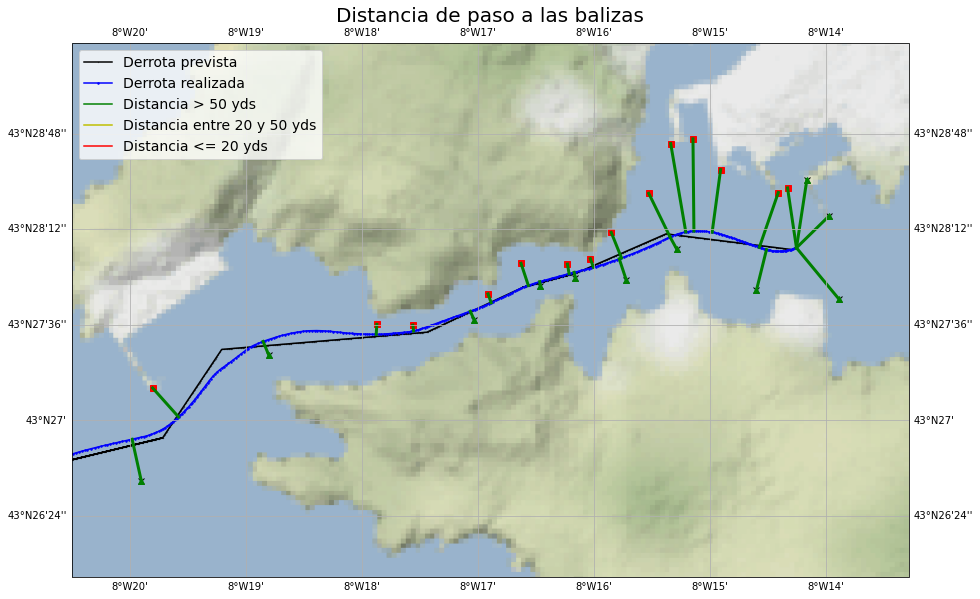

In [115]:
#Mostrar distancia de paso a las boyas con códigos de colores.
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min([np.min(boyas_verdes_df["Longitud"]),np.min(boyas_rojas_df["Longitud"])])-0.01, 
               np.max([np.max(boyas_verdes_df["Longitud"]),np.max(boyas_rojas_df["Longitud"])])+0.01, 
               np.min([np.min(boyas_verdes_df["Latitud"]),np.min(boyas_rojas_df["Latitud"])])-0.01, 
               np.max([np.max(boyas_verdes_df["Latitud"]),np.max(boyas_rojas_df["Latitud"])])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)

plt.title ("Distancia de paso a las balizas",fontsize=20)

plt.plot(derrota_gen_df["Longitud"], derrota_gen_df["Latitud"],"k.-", markersize=0.4,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.plot(boyas_verdes_df["Longitud"], boyas_verdes_df["Latitud"],"kx",transform=ccrs.PlateCarree())
plt.plot(track_gen_df_2["Longitud"], track_gen_df_2["Latitud"],"b.-", markersize=3, transform=ccrs.PlateCarree(),label="Derrota realizada")
plt.plot(x_rojas_ferrol, y_rojas_ferrol,'rs',transform=ccrs.PlateCarree())
plt.plot(x_verdes_ferrol, y_verdes_ferrol,'g^',transform=ccrs.PlateCarree())

for i in range(len(parejas_bv)):
    colores=["red","green", "orange" ]
    clr=""
    if dist_mins_bv[i] > 50:
        clr=colores[1]
    elif 20 < dist_mins_bv[i] <= 50:
        clr=colores[2]
    else: clr=colores[0]
    plt.plot([boyas_verdes_df["Longitud"][int(parejas_bv[i][0][:-1])], track_gen_df_2["Longitud"][parejas_bv[i][1]]], 
             [boyas_verdes_df["Latitud"][int(parejas_bv[i][0][:-1])], track_gen_df_2["Latitud"][parejas_bv[i][1]]],
          color=clr, linestyle=("-"), linewidth=3, marker='', markersize=4,transform=ccrs.PlateCarree())
    
for i in range(len(parejas_br)):
    colores=["red","green", "orange" ]
    clr=""
    if dist_mins_br[i] > 50:
        clr=colores[1]
    elif 20 < dist_mins_br[i] <= 50:
        clr=colores[2]
    else: clr=colores[0]
    plt.plot([boyas_rojas_df["Longitud"][int(parejas_br[i][0][:-1])], track_gen_df_2["Longitud"][parejas_br[i][1]]], 
             [boyas_rojas_df["Latitud"][int(parejas_br[i][0][:-1])], track_gen_df_2["Latitud"][parejas_br[i][1]]],
          color=clr, linestyle=("-"), linewidth=3, marker='', markersize=4,transform=ccrs.PlateCarree())

plt.plot(0, 0,"g-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia > 50 yds")
plt.plot(0, 0,"y-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia entre 20 y 50 yds")
plt.plot(0, 0,"r-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia <= 20 yds")

plt.legend(loc='best',fontsize=14)  
    
plt.show()

In [116]:
# Cálculos referentes a las S O N D A S

In [117]:
#sonda_n
veril_seguridad=10 # veril de profundidad a no cruzar.
profundidad_seguridad=8.3 # Profundidad que permite el margen de seguridad adecuado con el fondo.
calado=7.6

In [118]:
sondas_df=datos_sim.copy()
sondas_df=sondas_df.drop(['Rumbo','Heading','Velocidad'], axis=1)
sondas_df['Sonda']=sondas_df['DistanciaFondoProa']+calado

In [119]:
display(sondas_df)

,MilisegundosDesdeInicio,DistanciaFondoProa,Latitud,Longitud,Velocidad_efectiva,Sonda
0,47000,56.061119,43.433448,-8.379866,1.534424,63.661119
1,48000,56.064381,43.433447,-8.379866,1.528770,63.664381
2,49000,55.720085,43.433445,-8.379865,1.523122,63.320085
3,50000,55.720085,43.433444,-8.379864,1.516852,63.320085
4,51000,55.721714,43.433443,-8.379864,1.509810,63.321714
...,...,...,...,...,...,...
2055,2319000,8.928340,43.468057,-8.237593,4.687691,16.528340
2056,2320000,8.890908,43.468065,-8.237562,4.676202,16.490908
2057,2321000,8.875532,43.468072,-8.237530,4.664717,16.475532
2058,2322000,8.853428,43.468079,-8.237499,4.653253,16.453428


In [120]:
sondas_df["dif_sonda_veril"]=sondas_df["Sonda"]-veril_seguridad
sondas_df["dif_sonda_ps"]=sondas_df["Sonda"]-profundidad_seguridad
sondas_df["dif_sonda_veril_25%"]=sondas_df["Sonda"]-veril_seguridad*1.25
sondas_df["dif_sonda_ps_25%"]=sondas_df["Sonda"]-profundidad_seguridad*1.25
sondas_df["Tramo"]=list(track_gen_df_tramos_num["Tramo"])

# Detección de la varada.

varada=False

if sondas_df["Sonda"].any()==calado:
    varada=true
    
print(varada)

False


In [121]:
display(sondas_df)

,MilisegundosDesdeInicio,DistanciaFondoProa,Latitud,Longitud,Velocidad_efectiva,Sonda,dif_sonda_veril,dif_sonda_ps,dif_sonda_veril_25%,dif_sonda_ps_25%,Tramo
0,47000,56.061119,43.433448,-8.379866,1.534424,63.661119,53.661119,55.361119,51.161119,53.286119,0
1,48000,56.064381,43.433447,-8.379866,1.528770,63.664381,53.664381,55.364381,51.164381,53.289381,0
2,49000,55.720085,43.433445,-8.379865,1.523122,63.320085,53.320085,55.020085,50.820085,52.945085,0
3,50000,55.720085,43.433444,-8.379864,1.516852,63.320085,53.320085,55.020085,50.820085,52.945085,0
4,51000,55.721714,43.433443,-8.379864,1.509810,63.321714,53.321714,55.021714,50.821714,52.946714,0
...,...,...,...,...,...,...,...,...,...,...,...
2055,2319000,8.928340,43.468057,-8.237593,4.687691,16.528340,6.528340,8.228340,4.028340,6.153340,7
2056,2320000,8.890908,43.468065,-8.237562,4.676202,16.490908,6.490908,8.190908,3.990908,6.115908,7
2057,2321000,8.875532,43.468072,-8.237530,4.664717,16.475532,6.475532,8.175532,3.975532,6.100532,7
2058,2322000,8.853428,43.468079,-8.237499,4.653253,16.453428,6.453428,8.153428,3.953428,6.078428,7


In [122]:
def color_sonda(dato):
    if dato>0:
        color="green"
    elif dato<=0:
        color="red"
    return color
        
def color_sonda_25_vs(dato):
    if dato<=0 and abs(dato)+veril_seguridad<1.15*veril_seguridad:
        color="yellow"
    else: color="#FF000000"#Transparente para no pintar sobre lo verde.
    return color

def color_sonda_25_ps(dato):
    if dato<=0 and abs(dato)+profundidad_seguridad<1.15*profundidad_seguridad:
        color="yellow"
    else: color="#FF000000"#Transparente para no pintar sobre lo verde.
    return color


# crear nueva columna 'Longitud'
sondas_df['color_veril'] = sondas_df['dif_sonda_veril'].apply(color_sonda)
sondas_df['color_ps'] = sondas_df['dif_sonda_ps'].apply(color_sonda)
sondas_df['color_veril_25'] = sondas_df['dif_sonda_veril_25%'].apply(color_sonda_25_vs)
sondas_df['color_ps_25'] = sondas_df['dif_sonda_ps_25%'].apply(color_sonda_25_ps)

display(sondas_df)

,MilisegundosDesdeInicio,DistanciaFondoProa,Latitud,Longitud,Velocidad_efectiva,Sonda,dif_sonda_veril,dif_sonda_ps,dif_sonda_veril_25%,dif_sonda_ps_25%,Tramo,color_veril,color_ps,color_veril_25,color_ps_25
0,47000,56.061119,43.433448,-8.379866,1.534424,63.661119,53.661119,55.361119,51.161119,53.286119,0,green,green,#FF000000,#FF000000
1,48000,56.064381,43.433447,-8.379866,1.528770,63.664381,53.664381,55.364381,51.164381,53.289381,0,green,green,#FF000000,#FF000000
2,49000,55.720085,43.433445,-8.379865,1.523122,63.320085,53.320085,55.020085,50.820085,52.945085,0,green,green,#FF000000,#FF000000
3,50000,55.720085,43.433444,-8.379864,1.516852,63.320085,53.320085,55.020085,50.820085,52.945085,0,green,green,#FF000000,#FF000000
4,51000,55.721714,43.433443,-8.379864,1.509810,63.321714,53.321714,55.021714,50.821714,52.946714,0,green,green,#FF000000,#FF000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2055,2319000,8.928340,43.468057,-8.237593,4.687691,16.528340,6.528340,8.228340,4.028340,6.153340,7,green,green,#FF000000,#FF000000
2056,2320000,8.890908,43.468065,-8.237562,4.676202,16.490908,6.490908,8.190908,3.990908,6.115908,7,green,green,#FF000000,#FF000000
2057,2321000,8.875532,43.468072,-8.237530,4.664717,16.475532,6.475532,8.175532,3.975532,6.100532,7,green,green,#FF000000,#FF000000
2058,2322000,8.853428,43.468079,-8.237499,4.653253,16.453428,6.453428,8.153428,3.953428,6.078428,7,green,green,#FF000000,#FF000000


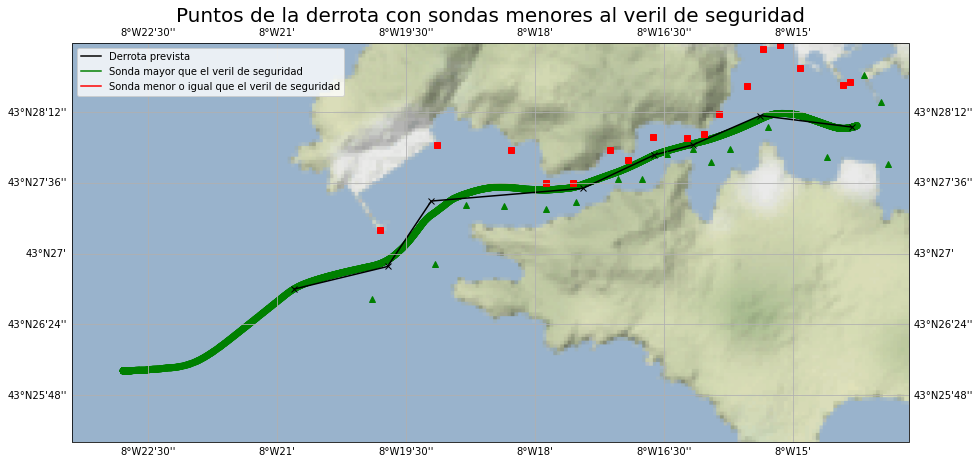

In [123]:
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Puntos de la derrota con sondas menores al veril de seguridad",fontsize=20)


plt.scatter(sondas_df["Longitud"], sondas_df["Latitud"],c=sondas_df["color_veril"],transform=ccrs.PlateCarree())
plt.plot(x_derrota, y_derrota,'kx-',transform=ccrs.PlateCarree())
plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())

plt.plot(0, 0,"k-", markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.plot(0, 0,"g", markersize=2,transform=ccrs.PlateCarree(),label="Sonda mayor que el veril de seguridad")
plt.plot(0, 0,"r", markersize=2,transform=ccrs.PlateCarree(),label="Sonda menor o igual que el veril de seguridad")
plt.legend(loc='best',fontsize=10) 

plt.show()

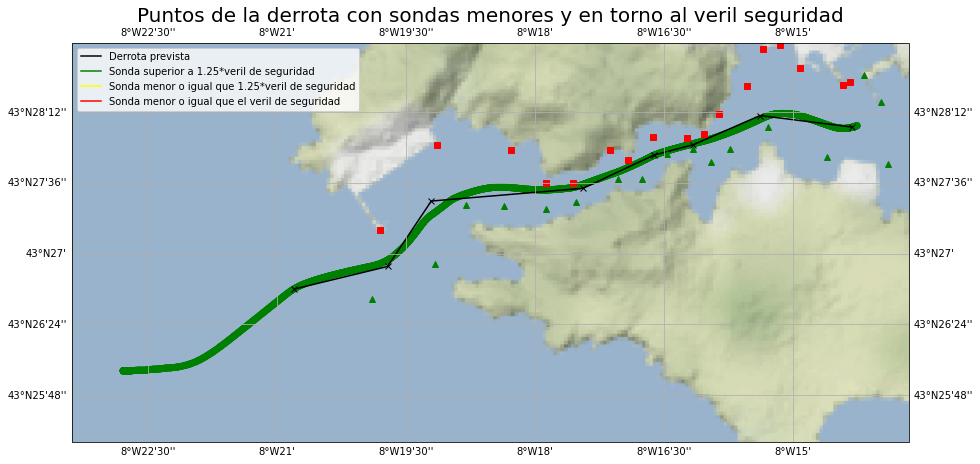

In [124]:
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Puntos de la derrota con sondas menores y en torno al veril seguridad",fontsize=20)


plt.scatter(sondas_df["Longitud"], sondas_df["Latitud"],c=sondas_df["color_veril"],transform=ccrs.PlateCarree())
plt.scatter(sondas_df["Longitud"], sondas_df["Latitud"],c=sondas_df["color_veril_25"],transform=ccrs.PlateCarree())

plt.plot(x_derrota, y_derrota,'kx-',transform=ccrs.PlateCarree())
plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())

plt.plot(0, 0,"k-", markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.plot(0, 0,"g", markersize=2,transform=ccrs.PlateCarree(),label="Sonda superior a 1.25*veril de seguridad")
plt.plot(0, 0,"yellow", markersize=2,transform=ccrs.PlateCarree(),label="Sonda menor o igual que 1.25*veril de seguridad")
plt.plot(0, 0,"r", markersize=2,transform=ccrs.PlateCarree(),label="Sonda menor o igual que el veril de seguridad")
plt.legend(loc='best',fontsize=10) 

plt.show()

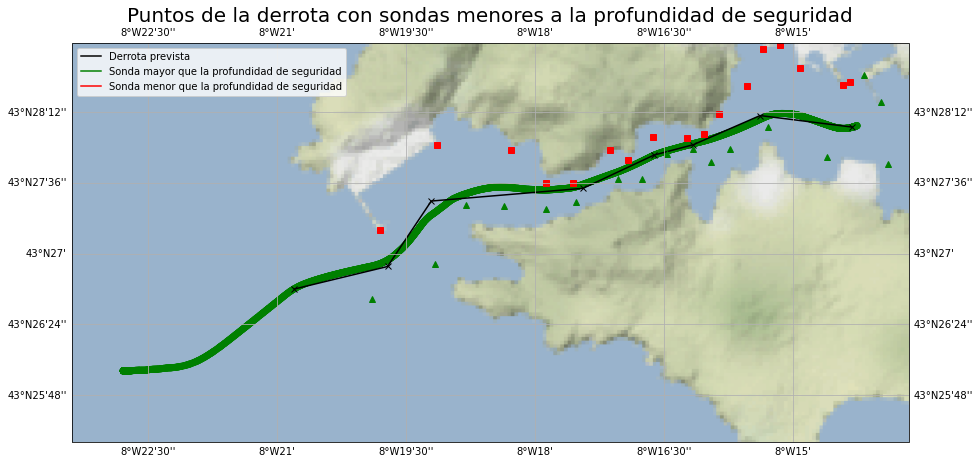

In [125]:
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Puntos de la derrota con sondas menores a la profundidad de seguridad",fontsize=20)


plt.scatter(sondas_df["Longitud"], sondas_df["Latitud"],c=sondas_df["color_ps"],transform=ccrs.PlateCarree())
plt.plot(x_derrota, y_derrota,'kx-',transform=ccrs.PlateCarree())
plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())

plt.plot(0, 0,"k-", markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.plot(0, 0,"g", markersize=2,transform=ccrs.PlateCarree(),label="Sonda mayor que la profundidad de seguridad")
plt.plot(0, 0,"r", markersize=2,transform=ccrs.PlateCarree(),label="Sonda menor que la profundidad de seguridad")
plt.legend(loc='best',fontsize=10) 

plt.show()

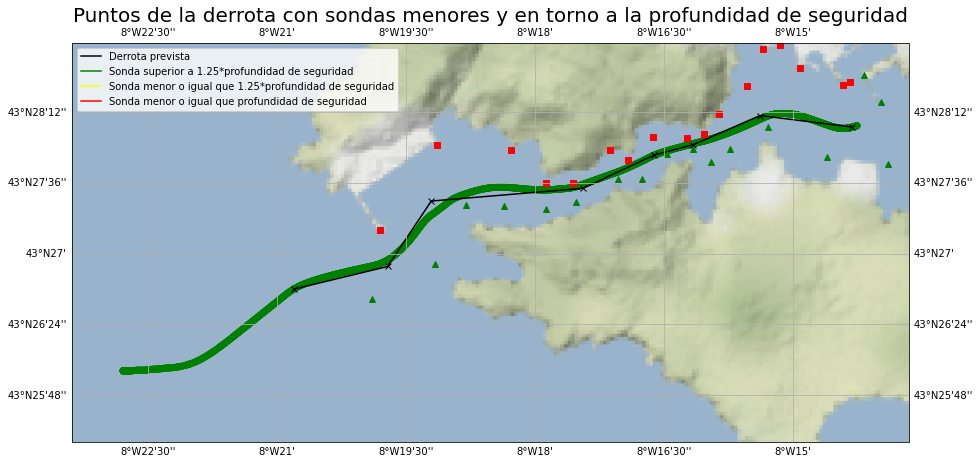

In [126]:
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Puntos de la derrota con sondas menores y en torno a la profundidad de seguridad",fontsize=20)


plt.scatter(sondas_df["Longitud"], sondas_df["Latitud"],c=sondas_df["color_ps"],transform=ccrs.PlateCarree())
plt.scatter(sondas_df["Longitud"], sondas_df["Latitud"],c=sondas_df["color_ps_25"],transform=ccrs.PlateCarree())

plt.plot(x_derrota, y_derrota,'kx-',transform=ccrs.PlateCarree())
plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())

plt.plot(0, 0,"k-", markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.plot(0, 0,"g", markersize=2,transform=ccrs.PlateCarree(),label="Sonda superior a 1.25*profundidad de seguridad")
plt.plot(0, 0,"yellow", markersize=2,transform=ccrs.PlateCarree(),label="Sonda menor o igual que 1.25*profundidad de seguridad")
plt.plot(0, 0,"r", markersize=2,transform=ccrs.PlateCarree(),label="Sonda menor o igual que profundidad de seguridad")
plt.legend(loc='best',fontsize=10) 

plt.show()

In [127]:
# % sondas para la nota (tabla)

In [128]:
lista_tabla_sondas=[]

#%sondas por debajo del veril de seguridad.
sondas_menores_vs=round(((len(sondas_df[sondas_df["dif_sonda_veril"]<=0]))/len(sondas_df))*100,2)
lista_tabla_sondas.append(sondas_menores_vs)

#%sondas por debajo de 1.25*veril de seguridad.
sondas_menores_vs_25=round(((len(sondas_df[sondas_df["dif_sonda_veril_25%"]<=0]))/len(sondas_df))*100,2)
lista_tabla_sondas.append(sondas_menores_vs_25)

#%sondas por debajo de la profundidad de seguridad.
sondas_menores_ps=round(((len(sondas_df[sondas_df["dif_sonda_ps"]<=0]))/len(sondas_df))*100,2)
lista_tabla_sondas.append(sondas_menores_ps)

#%sondas por debajo de 1.25*profundidad de seguridad.
sondas_menores_ps_25=round(((len(sondas_df[sondas_df["dif_sonda_ps_25%"]<=0]))/len(sondas_df))*100,2)
lista_tabla_sondas.append(sondas_menores_ps_25)

print(lista_tabla_sondas)

lista_tabla_sondas_tramos_evaluados=[]

sondas_df_tramos_evaluados=sondas_df.copy()
sondas_df_tramos_evaluados=sondas_df_tramos_evaluados.drop(sondas_df_tramos_evaluados[sondas_df_tramos_evaluados["Tramo"]==0].index)

#%sondas por debajo del veril de seguridad.
sondas_menores_vs=round(((len(sondas_df_tramos_evaluados[sondas_df_tramos_evaluados["dif_sonda_veril"]<=0]))/len(sondas_df_tramos_evaluados))*100,2)
lista_tabla_sondas_tramos_evaluados.append(sondas_menores_vs)

#%sondas por debajo de 1.25*veril de seguridad.
sondas_menores_vs_25_tramos_evaluados=round(((len(sondas_df_tramos_evaluados[sondas_df_tramos_evaluados["dif_sonda_veril_25%"]<=0]))/len(sondas_df_tramos_evaluados))*100,2)
lista_tabla_sondas_tramos_evaluados.append(sondas_menores_vs_25)

#%sondas por debajo de la profundidad de seguridad.
sondas_menores_ps=round(((len(sondas_df_tramos_evaluados[sondas_df_tramos_evaluados["dif_sonda_ps"]<=0]))/len(sondas_df_tramos_evaluados))*100,2)
lista_tabla_sondas_tramos_evaluados.append(sondas_menores_ps)

#%sondas por debajo de 1.25*profundidad de seguridad.
sondas_menores_ps_25=round(((len(sondas_df_tramos_evaluados[sondas_df_tramos_evaluados["dif_sonda_ps_25%"]<=0]))/len(sondas_df_tramos_evaluados))*100,2)
lista_tabla_sondas_tramos_evaluados.append(sondas_menores_ps_25)

print(lista_tabla_sondas_tramos_evaluados)

[0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0]


In [129]:
tabla_sondas=pd.DataFrame(list([lista_tabla_sondas]), columns =['% Sondas <= Veril Seguridad','% Sondas <= 1.25*Veril Seguridad', 
                                                              '% Sondas <= Profundidad Seguridad','% <= 1.25*Profundidad Seguridad'])

display(tabla_sondas)

,% Sondas <= Veril Seguridad,% Sondas <= 1.25*Veril Seguridad,% Sondas <= Profundidad Seguridad,% <= 1.25*Profundidad Seguridad
0,0.0,0.0,0.0,0.0


In [130]:
# C P A

In [131]:
dataframes = {}
def leer_ins(path):
    filenames = glob.glob(path + "/*.txt")
    i=1
    for file in filenames:
        dataframes["contacto"+str(i)] = pd.read_csv(file)
        i+=1
    return dataframes

leer_ins("contactos")

{'contacto1':                      Posicion  Rumbo  Heading  Velocidad  Timon Sol  Timon  \
 0     43.43288333 -8.46303333    150      150          0          0      0   
 1     43.43288333 -8.46303333    150      150          0          0      0   
 2     43.43288333 -8.46303333    150      150          0          0      0   
 3     43.43288333 -8.46303333    150      150          0          0      0   
 4     43.43288333 -8.46303333    150      150          0          0      0   
 ...                       ...    ...      ...        ...        ...    ...   
 5977  43.43288333 -8.46303333    150      150          0          0      0   
 5978  43.43288333 -8.46303333    150      150          0          0      0   
 5979  43.43288333 -8.46303333    150      150          0          0      0   
 5980  43.43288333 -8.46303333    150      150          0          0      0   
 5981  43.43288333 -8.46303333    150      150          0          0      0   
 
       RPMBabor  RPMEst  Milisegundos

In [132]:
for clave in dataframes:
    dataframes[clave]['Latitud'] = dataframes[clave]['Posicion'].apply(split_lat_c)
    dataframes[clave]['Longitud'] = dataframes[clave]['Posicion'].apply(split_lon_c)
    dataframes[clave] = dataframes[clave].sort_values('MilisegundosDesdeInicio')
    dataframes[clave]['MilisegundosDesdeInicio'] = datos_sim1['MilisegundosDesdeInicio'] 
    dataframes[clave]['Latitud_barco'] = datos_sim1['Latitud']   
    dataframes[clave]['Longitud_barco'] = datos_sim1['Longitud']   
    dataframes[clave]["incremento_lat"] = dataframes[clave]["Latitud_barco"] - dataframes[clave]["Latitud"]
    dataframes[clave]["incremento_long"] = dataframes[clave]["Longitud_barco"] - dataframes[clave]["Longitud"]
    lat_media1=dataframes[clave]["Latitud_barco"] .mean()
    lat_media2=dataframes[clave]["Latitud"].mean()
    lat_media=(lat_media1+lat_media2)/2
    dataframes[clave]["apartamiento"] = dataframes[clave]["incremento_long"] * math.cos(lat_media*np.pi/180)
    dataframes[clave]["distancia_mn"] = ((dataframes[clave]["incremento_lat"]**2 + dataframes[clave]["apartamiento"]**2)**(1/2))*60
    dataframes[clave]["distancia_yds"] = dataframes[clave]["distancia_mn"]*2000

    dataframes[clave]=dataframes[clave].drop(["Timon Sol","Timon","RPMBabor","RPMEst","DistanciaFondoProa","Unnamed: 10"],axis=1)
    dataframes[clave]=dataframes[clave].drop_duplicates()
    dataframes[clave] = dataframes[clave].dropna(subset=["MilisegundosDesdeInicio"])
    dataframes[clave] = dataframes[clave].sort_values('MilisegundosDesdeInicio')
    dataframes[clave].index=[list(range(0,len(dataframes[clave])))]

In [133]:
num_contactos=len(dataframes)
print(num_contactos)
display(dataframes['contacto3'])

12


,Posicion,Rumbo,Heading,Velocidad,MilisegundosDesdeInicio,Latitud,Longitud,Latitud_barco,Longitud_barco,incremento_lat,incremento_long,apartamiento,distancia_mn,distancia_yds
0,43.4408038 -8.349582662,258,258,0.514444,47000.0,43.440804,-8.349583,43.433448,-8.379866,-0.007356,-0.030283,-0.021986,1.391018,2782.035502
1,43.43788664 -8.368483796,258,258,0.514444,47000.0,43.437887,-8.368484,43.433448,-8.379866,-0.004439,-0.011382,-0.008264,0.562819,1125.637069
2,43.44080188 -8.349595135,258,258,0.514444,48000.0,43.440802,-8.349595,43.433447,-8.379866,-0.007355,-0.030271,-0.021977,1.390486,2780.971709
3,43.44080284 -8.349588899,258,258,0.514444,48000.0,43.440803,-8.349589,43.433447,-8.379866,-0.007356,-0.030277,-0.021981,1.390753,2781.505490
4,43.44080188 -8.349595135,258,258,0.514444,49000.0,43.440802,-8.349595,43.433445,-8.379865,-0.007357,-0.030270,-0.021976,1.390487,2780.973299
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2559,43.43861714 -8.363750803,258,258,0.514444,2319000.0,43.438617,-8.363751,43.468057,-8.237593,0.029440,0.126158,0.091591,5.772351,11544.702162
2560,43.43861617 -8.363757039,258,258,0.514444,2320000.0,43.438616,-8.363757,43.468065,-8.237562,0.029449,0.126195,0.091618,5.774058,11548.116993
2561,43.43861521 -8.363763275,258,258,0.514444,2321000.0,43.438615,-8.363763,43.468072,-8.237530,0.029457,0.126233,0.091645,5.775763,11551.525224
2562,43.43861425 -8.363769511,258,258,0.514444,2322000.0,43.438614,-8.363770,43.468079,-8.237499,0.029465,0.126271,0.091673,5.777505,11555.010449


In [134]:
for clave in dataframes:   
    dataframes[clave]['inc_lon_3'] = dataframes[clave]["Heading"].apply(seno_long_3)
    dataframes[clave]['inc_lat_3'] = dataframes[clave]["Heading"].apply(cos_lat_3)
for clave in dataframes:
    dataframes[clave]["Longitud_3"]=dataframes[clave]["Longitud"]+dataframes[clave]["inc_lon_3"]
    dataframes[clave]["Latitud_3"]=dataframes[clave]["Latitud"]+dataframes[clave]["inc_lat_3"]
display(dataframes['contacto3'].head())

,Posicion,Rumbo,Heading,Velocidad,MilisegundosDesdeInicio,Latitud,Longitud,Latitud_barco,Longitud_barco,incremento_lat,incremento_long,apartamiento,distancia_mn,distancia_yds,inc_lon_3,inc_lat_3,Longitud_3,Latitud_3
0,43.4408038 -8.349582662,258,258,0.514444,47000.0,43.440804,-8.349583,43.433448,-8.379866,-0.007356,-0.030283,-0.021986,1.391018,2782.035502,-0.01123,-0.001733,-8.360813,43.439071
1,43.43788664 -8.368483796,258,258,0.514444,47000.0,43.437887,-8.368484,43.433448,-8.379866,-0.004439,-0.011382,-0.008264,0.562819,1125.637069,-0.01123,-0.001733,-8.379714,43.436154
2,43.44080188 -8.349595135,258,258,0.514444,48000.0,43.440802,-8.349595,43.433447,-8.379866,-0.007355,-0.030271,-0.021977,1.390486,2780.971709,-0.01123,-0.001733,-8.360825,43.439069
3,43.44080284 -8.349588899,258,258,0.514444,48000.0,43.440803,-8.349589,43.433447,-8.379866,-0.007356,-0.030277,-0.021981,1.390753,2781.505490,-0.01123,-0.001733,-8.360819,43.439070
4,43.44080188 -8.349595135,258,258,0.514444,49000.0,43.440802,-8.349595,43.433445,-8.379865,-0.007357,-0.030270,-0.021976,1.390487,2780.973299,-0.01123,-0.001733,-8.360825,43.439069


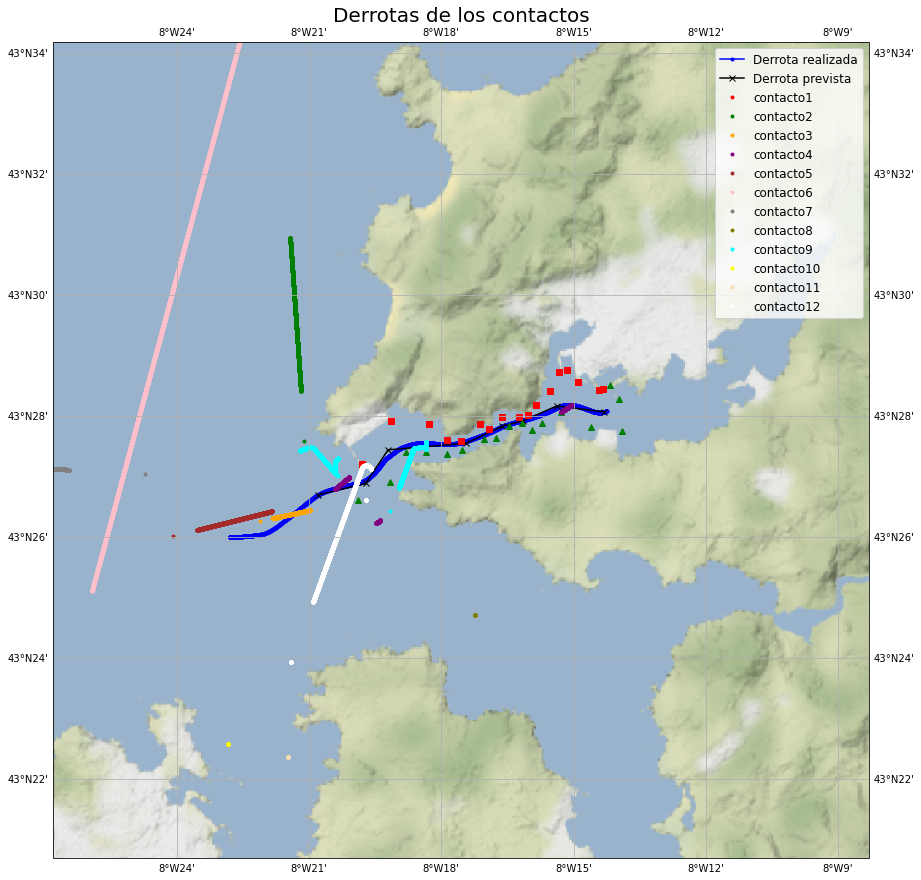

In [135]:
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(x_derrota)-0.1, np.max(x_derrota)+0.1, 
               np.min(y_derrota)-0.1, np.max(y_derrota)+0.1])

ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Derrotas de los contactos",fontsize=20)

xCoordenadas, yCoordenadas =list(datos_sim["Longitud"]), list(datos_sim["Latitud"])
plt.plot(xCoordenadas, yCoordenadas,'b.-',transform=ccrs.PlateCarree(),label="Derrota realizada")
plt.plot(x_derrota, y_derrota,'kx-',transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())
i=0
for clave in dataframes:
    colores=["red","green","orange","purple","brown","pink","gray","olive","cyan","yellow","wheat","white"]*len(dataframes)
    num_contactos=len(dataframes)
    plt.plot(list(dataframes[clave]['Longitud']),list(dataframes[clave]['Latitud']),'.', color=colores[i],
             transform=ccrs.PlateCarree(),label=str(clave))
    i+=1
plt.legend(loc='best',fontsize=12)  
plt.show()

In [136]:
cpa=[]
for clave in dataframes:
    cpa_cto=dataframes[clave]["distancia_yds"].min()
    indice=(dataframes[clave][dataframes[clave]["distancia_yds"]==cpa_cto].index.min())[0]   
    cpa.append([clave,cpa_cto,indice,dataframes[clave]['MilisegundosDesdeInicio'][indice],dataframes[clave]["Latitud"][indice],dataframes[clave]["Longitud"][indice],
               dataframes[clave]["Latitud_barco"][indice],dataframes[clave]["Longitud_barco"][indice]])
print(cpa)

[['contacto1', 7246.196763457897, 0, 47000.0, 43.432883, -8.463033, 43.43344813, -8.379866314], ['contacto2', 3996.6155240772337, 1, 47000.0, 43.459744, -8.351702, 43.43344813, -8.379866314], ['contacto3', 163.26966288630558, 382, 393000.0, 43.44047, -8.351747, 43.44159462, -8.352801783], ['contacto4', 116.68479077575749, 2161, 1951000.0, 43.468818, -8.252727, 43.46977618, -8.25295504], ['contacto5', 601.3481252963047, 255, 278000.0, 43.439975, -8.366918, 43.43564146, -8.363451781], ['contacto6', 4655.226348764257, 69, 108000.0, 43.422711, -8.430495, 43.43339812, -8.379093645], ['contacto7', 3471.835979171948, 1, 47000.0, 43.450709, -8.411852, 43.43344813, -8.379866314], ['contacto8', 5705.342127643077, 1035, 1303000.0, 43.411917, -8.2873, 43.45923029, -8.293749422], ['contacto9', 141.7799975969454, 1138, 1045000.0, 43.457937, -8.310012, 43.45909344, -8.310345437], ['contacto10', 6839.400496690171, 55, 108000.0, 43.376412, -8.380479, 43.43339812, -8.379093645], ['contacto11', 7395.8207

In [137]:
cpa_df=waypoints_df=pd.DataFrame(list(cpa), 
               columns =['Contacto', 'CPA', 'Indice',"TCPA","Latitud","Longitud","Latitud_barco","Longitud_barco"]) 

In [138]:
display(cpa_df)

,Contacto,CPA,Indice,TCPA,Latitud,Longitud,Latitud_barco,Longitud_barco
0,contacto1,7246.196763,0,47000.0,43.432883,-8.463033,43.433448,-8.379866
1,contacto2,3996.615524,1,47000.0,43.459744,-8.351702,43.433448,-8.379866
2,contacto3,163.269663,382,393000.0,43.440470,-8.351747,43.441595,-8.352802
3,contacto4,116.684791,2161,1951000.0,43.468818,-8.252727,43.469776,-8.252955
4,contacto5,601.348125,255,278000.0,43.439975,-8.366918,43.435641,-8.363452
5,contacto6,4655.226349,69,108000.0,43.422711,-8.430495,43.433398,-8.379094
6,contacto7,3471.835979,1,47000.0,43.450709,-8.411852,43.433448,-8.379866
7,contacto8,5705.342128,1035,1303000.0,43.411917,-8.287300,43.459230,-8.293749
8,contacto9,141.779998,1138,1045000.0,43.457937,-8.310012,43.459093,-8.310345
9,contacto10,6839.400497,55,108000.0,43.376412,-8.380479,43.433398,-8.379094


In [139]:
tramos_cpa=[]
aguas_restringidas=[]
for i in range(0,len(cpa_df)):
#     if cpa_df["TCPA"][i] < track_gen_df_tramos_num["MilisegundosDesdeInicio"].min():
#         tramos_cpa.append(1)
#         if 1 in tramos_restringidos:
#             aguas_restringidas.append(True)
#         else:
#             aguas_restringidas.append(False)
#     else:
    indice_cpa=(track_gen_df_tramos_num[track_gen_df_tramos_num["MilisegundosDesdeInicio"]==cpa_df["TCPA"][i]].index)[0]
    tramos_cpa.append(track_gen_df_tramos_num["Tramo"][indice_cpa])
    
    if len(tramos_restringidos)>0:
        
        if track_gen_df_tramos_num["Tramo"][indice_cpa] in tramos_restringidos:
            aguas_restringidas.append(True)
        else:
            aguas_restringidas.append(False)
    else:
        aguas_restringidas.append(False)
print(tramos_cpa)
print(aguas_restringidas)
print(len(tramos_cpa))
print(len(aguas_restringidas))
display(cpa_df)

[0, 0, 0, 7, 0, 0, 0, 3, 3, 0, 0, 2]
[False, False, False, True, False, False, False, True, True, False, False, True]
12
12


,Contacto,CPA,Indice,TCPA,Latitud,Longitud,Latitud_barco,Longitud_barco
0,contacto1,7246.196763,0,47000.0,43.432883,-8.463033,43.433448,-8.379866
1,contacto2,3996.615524,1,47000.0,43.459744,-8.351702,43.433448,-8.379866
2,contacto3,163.269663,382,393000.0,43.440470,-8.351747,43.441595,-8.352802
3,contacto4,116.684791,2161,1951000.0,43.468818,-8.252727,43.469776,-8.252955
4,contacto5,601.348125,255,278000.0,43.439975,-8.366918,43.435641,-8.363452
5,contacto6,4655.226349,69,108000.0,43.422711,-8.430495,43.433398,-8.379094
6,contacto7,3471.835979,1,47000.0,43.450709,-8.411852,43.433448,-8.379866
7,contacto8,5705.342128,1035,1303000.0,43.411917,-8.287300,43.459230,-8.293749
8,contacto9,141.779998,1138,1045000.0,43.457937,-8.310012,43.459093,-8.310345
9,contacto10,6839.400497,55,108000.0,43.376412,-8.380479,43.433398,-8.379094


In [140]:
cpa_df["Tramo_CPA"]=tramos_cpa
cpa_df["Aguas_restringidas"]=aguas_restringidas

In [141]:
parejas_bra=[]
parejas_lon_bra=[]
parejas_lat_bra=[]
dist_bra=[]
dist_mins_bra=[]
print("Calculando....")
tramo_bra=[]
for i in range(0,len(rojas_df)):
    diferencias_bra=[]
    dif_bra_ind=[]
    for clave in derrota_tramos:
        diferencias_bra_tramo=[]
        for j in range(0,len(derrota_tramos[clave])):
            dis= (((rojas_df["Latitud"][i]-derrota_tramos[clave]["Latitud"][j])**2+
                   (((rojas_df["Longitud"][i]-derrota_tramos[clave]["Longitud"][j]))*
                    (math.cos((np.mean(y_derrota))*(math.pi)/180)))**2))**(1/2)
            diferencias_bra_tramo.append(dis)
        dif_bra_ind.append(diferencias_bra_tramo.index(np.min(diferencias_bra_tramo)))
        diferencias_bra.append([round(np.min(diferencias_bra_tramo)*2000*60,2)])
    tramo_bra.append(diferencias_bra.index((np.min(diferencias_bra)))+1)  
    dist_bra.append(np.min(diferencias_bra))

    parejas_lon_bra.append(derrota_tramos["T"+str(diferencias_bra.index((np.min(diferencias_bra)))+1)]["Longitud"][dif_bra_ind[diferencias_bra.index((np.min(diferencias_bra)))]])
    parejas_lat_bra.append(derrota_tramos["T"+str(diferencias_bra.index((np.min(diferencias_bra)))+1)]["Latitud"][dif_bra_ind[diferencias_bra.index((np.min(diferencias_bra)))]])

print(len(rojas_df))   
print(len(tramo_bra))
print(tramo_bra)

Calculando....
17
17
[2, 3, 3, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 7, 7, 7, 7]


In [142]:
rojas_df["Tramo"]=tramo_bra
rojas_df["Lon_tramo"]=parejas_lon_bra
rojas_df["Lat_tramo"]=parejas_lat_bra
rojas_df["dist_tramo"]=dist_bra
display(rojas_df)

,Longitud,Latitud,Tramo,Lon_tramo,Lat_tramo,dist_tramo
0,-8.330017,43.453400,2,-8.325683,43.451345,450.89
1,-8.319050,43.465300,3,-8.318100,43.457556,932.96
2,-8.304650,43.464667,3,-8.303800,43.458430,752.05
3,-8.297833,43.460050,3,-8.297700,43.458802,150.21
4,-8.292667,43.459967,3,-8.292600,43.459114,102.48
5,-8.285417,43.464603,4,-8.283550,43.461657,389.15
6,-8.281867,43.463233,4,-8.281350,43.462408,108.79
7,-8.277133,43.466433,5,-8.276283,43.464049,295.55
8,-8.270467,43.466350,5,-8.270083,43.465240,137.33
9,-8.267183,43.466917,6,-8.266750,43.466195,94.47


In [143]:
parejas_c=[]
parejas_lon_bva=[]
parejas_lat_bva=[]
dist_bva=[]
dist_mins_bva=[]
print("Calculando....")
tramo_bva=[]
for i in range(0,len(verdes_df)):
    diferencias_bva=[]
    dif_bva_ind=[]
    for clave in derrota_tramos:
        diferencias_bva_tramo=[]
        for j in range(0,len(derrota_tramos[clave])):
            dis= (((verdes_df["Latitud"][i]-derrota_tramos[clave]["Latitud"][j])**2+
                   (((verdes_df["Longitud"][i]-derrota_tramos[clave]["Longitud"][j]))*
                    (math.cos((np.mean(y_derrota))*(math.pi)/180)))**2))**(1/2)
            diferencias_bva_tramo.append(dis)
        dif_bva_ind.append(diferencias_bva_tramo.index(np.min(diferencias_bva_tramo)))
        diferencias_bva.append([round(np.min(diferencias_bva_tramo)*2000*60,2)])
    tramo_bva.append(diferencias_bva.index((np.min(diferencias_bva)))+1)   
    dist_bva.append(np.min(diferencias_bva))

    parejas_lon_bva.append(derrota_tramos["T"+str(diferencias_bva.index((np.min(diferencias_bva)))+1)]["Longitud"][dif_bva_ind[diferencias_bva.index((np.min(diferencias_bva)))]])
    parejas_lat_bva.append(derrota_tramos["T"+str(diferencias_bva.index((np.min(diferencias_bva)))+1)]["Latitud"][dif_bva_ind[diferencias_bva.index((np.min(diferencias_bva)))]])            

print(len(verdes_df))   
print(len(tramo_bva))
print(tramo_bva)    

Calculando....
17
17
[1, 2, 3, 3, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 7, 7, 7]


In [144]:
verdes_df["Tramo"]=tramo_bva
verdes_df["Lon_tramo"]=parejas_lon_bva
verdes_df["Lat_tramo"]=parejas_lat_bva
verdes_df["dist_tramo"]=dist_bva
display(verdes_df)

,Longitud,Latitud,Tramo,Lon_tramo,Lat_tramo,dist_tramo
0,-8.331633,43.443650,1,-8.332867,43.447429,466.04
1,-8.319400,43.448483,2,-8.325583,43.451454,645.85
2,-8.313367,43.456883,3,-8.313500,43.457837,115.03
3,-8.305933,43.456783,3,-8.306100,43.458289,181.26
4,-8.297833,43.456283,3,-8.298100,43.458778,300.26
5,-8.292100,43.457283,3,-8.292300,43.459132,222.52
6,-8.283833,43.460483,4,-8.284450,43.461350,117.05
7,-8.279183,43.460600,4,-8.280550,43.462682,276.75
8,-8.274350,43.464017,5,-8.274483,43.464394,46.74
9,-8.269317,43.464850,5,-8.269483,43.465355,62.31


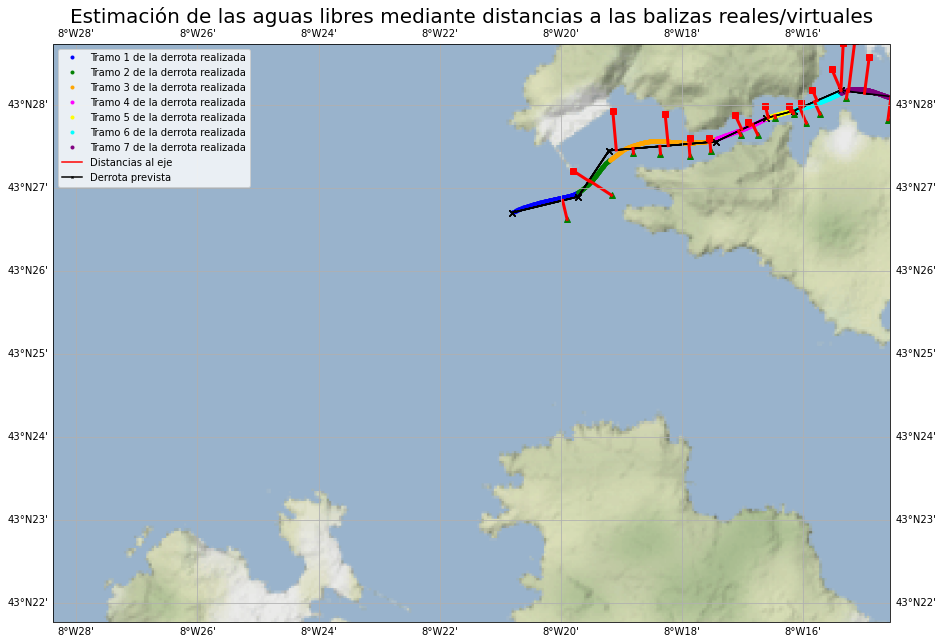

In [145]:
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(waypoints_df["Longitud"])-0.01, np.max(waypoints_df["Longitud"])+0.01, 
               np.min(waypoints_df["Latitud"])-0.01, np.max(waypoints_df["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Estimación de las aguas libres mediante distancias a las balizas reales/virtuales",fontsize=20)
colores=['r','b','g',"orange","fuchsia", "yellow","cyan","purple","slategray","orangered","lawngreen","olive"]*len(tramos)

for clave in track_tramos:
    
    xCoordenadas, yCoordenadas =list(track_tramos[clave]["Longitud"]), list(track_tramos[clave]["Latitud"])
    plt.plot(xCoordenadas, yCoordenadas,'.',c=colores[int(clave[1:])],transform=ccrs.PlateCarree(),label="Tramo "+str(clave[1:])+" de la derrota realizada")
    
    plt.plot(x_derrota, y_derrota,'kx-',transform=ccrs.PlateCarree())

for i in range(0,len(rojas_df)):
    
    plt.plot(rojas_df["Longitud"][i], rojas_df["Latitud"][i],'rs',
             transform=ccrs.PlateCarree())

    
for i in range(0,len(verdes_df)):
    
    plt.plot(verdes_df["Longitud"][i], verdes_df["Latitud"][i],'g^',
             transform=ccrs.PlateCarree())


for i in range(0,len(rojas_df)):
    plt.plot([rojas_df["Longitud"][i], rojas_df["Lon_tramo"][i]], 
             [rojas_df["Latitud"][i], rojas_df["Lat_tramo"][i]],
             color="r", linestyle=("-"), linewidth=3, marker='', markersize=4,transform=ccrs.PlateCarree())
    
for i in range(0,len(verdes_df)):
    plt.plot([verdes_df["Longitud"][i], verdes_df["Lon_tramo"][i]], 
             [verdes_df["Latitud"][i], verdes_df["Lat_tramo"][i]],
             color="r", linestyle=("-"), linewidth=3, marker='', markersize=4,transform=ccrs.PlateCarree())
plt.plot(0, 0,"r-", markersize=2,transform=ccrs.PlateCarree(),label="Distancias al eje")
plt.plot(0, 0,'kx-', markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")

plt.legend(loc='best',fontsize=10)  
plt.show()

In [146]:
verdes_df[verdes_df["Tramo"]==cpa_df["Tramo_CPA"][0]].index

Int64Index([], dtype='int64')

In [147]:
#NUEVA
cpa_df["Aguas_libres"]=[0]*len(cpa_df)
Aguas_libres_CPA_br=[]
Aguas_libres_CPA_er=[]
Aguas_libres_CPA=[]
for i in range (0,len(cpa_df)):
    aguas_libres_cpa_verdes=[]
    aguas_libres_cpa_rojas=[]
    indices_verdes=[]
    indices_rojos=[]
    indices_v=list(verdes_df[verdes_df["Tramo"]==cpa_df["Tramo_CPA"][i]].index)
    indices_r=list(rojas_df[rojas_df["Tramo"]==cpa_df["Tramo_CPA"][i]].index)                 
    indices_verdes.append(indices_v)
    indices_rojos.append(indices_r)
    if len(indices_verdes[0])>0:
        for j in indices_verdes[0]:
            aguas_libres_cpa_verdes.append(verdes_df["dist_tramo"][j])
    else: aguas_libres_cpa_verdes.append(0)
    if len(indices_rojos[0])>0:
        for j in indices_rojos[0]:
            aguas_libres_cpa_rojas.append(rojas_df["dist_tramo"][j])
    else:aguas_libres_cpa_rojas.append(0)
    Aguas_libres_CPA_br.append(np.mean(aguas_libres_cpa_rojas))
    Aguas_libres_CPA_er.append(np.mean(aguas_libres_cpa_verdes))
    Aguas_libres_CPA.append(np.mean(aguas_libres_cpa_rojas + np.mean(aguas_libres_cpa_verdes)))
print(Aguas_libres_CPA,len(Aguas_libres_CPA))

[0.0, 0.0, 0.0, 1504.8296666666668, 0.0, 0.0, 0.0, 689.1925, 689.1925, 0.0, 0.0, 1096.74] 12


In [148]:
cpa_df["Aguas_libres"]=Aguas_libres_CPA
cpa_df["Aguas_libres_br"]=Aguas_libres_CPA_br
cpa_df["Aguas_libres_er"]=Aguas_libres_CPA_er
display(cpa_df)

,Contacto,CPA,Indice,TCPA,Latitud,Longitud,Latitud_barco,Longitud_barco,Tramo_CPA,Aguas_restringidas,Aguas_libres,Aguas_libres_br,Aguas_libres_er
0,contacto1,7246.196763,0,47000.0,43.432883,-8.463033,43.433448,-8.379866,0,False,0.000000,0.000000,0.0000
1,contacto2,3996.615524,1,47000.0,43.459744,-8.351702,43.433448,-8.379866,0,False,0.000000,0.000000,0.0000
2,contacto3,163.269663,382,393000.0,43.440470,-8.351747,43.441595,-8.352802,0,False,0.000000,0.000000,0.0000
3,contacto4,116.684791,2161,1951000.0,43.468818,-8.252727,43.469776,-8.252955,7,True,1504.829667,874.141667,630.6880
4,contacto5,601.348125,255,278000.0,43.439975,-8.366918,43.435641,-8.363452,0,False,0.000000,0.000000,0.0000
5,contacto6,4655.226349,69,108000.0,43.422711,-8.430495,43.433398,-8.379094,0,False,0.000000,0.000000,0.0000
6,contacto7,3471.835979,1,47000.0,43.450709,-8.411852,43.433448,-8.379866,0,False,0.000000,0.000000,0.0000
7,contacto8,5705.342128,1035,1303000.0,43.411917,-8.287300,43.459230,-8.293749,3,True,689.192500,484.425000,204.7675
8,contacto9,141.779998,1138,1045000.0,43.457937,-8.310012,43.459093,-8.310345,3,True,689.192500,484.425000,204.7675
9,contacto10,6839.400497,55,108000.0,43.376412,-8.380479,43.433398,-8.379094,0,False,0.000000,0.000000,0.0000


In [149]:
#Obtener % CPA aguas libres menores a 1000 yds.
cpa_df_aguas_libres=cpa_df.copy()

cpa_df_aguas_libres=cpa_df_aguas_libres[cpa_df_aguas_libres["Aguas_restringidas"]==False]
display(cpa_df_aguas_libres)
cpa_df_aguas_libres_1000=cpa_df_aguas_libres[cpa_df_aguas_libres["CPA"]<1000]
display(cpa_df_aguas_libres_1000)
pct_cpa_al_1000=100*len(cpa_df_aguas_libres_1000)/len(cpa_df_aguas_libres)
print(pct_cpa_al_1000)

,Contacto,CPA,Indice,TCPA,Latitud,Longitud,Latitud_barco,Longitud_barco,Tramo_CPA,Aguas_restringidas,Aguas_libres,Aguas_libres_br,Aguas_libres_er
0,contacto1,7246.196763,0,47000.0,43.432883,-8.463033,43.433448,-8.379866,0,False,0.0,0.0,0.0
1,contacto2,3996.615524,1,47000.0,43.459744,-8.351702,43.433448,-8.379866,0,False,0.0,0.0,0.0
2,contacto3,163.269663,382,393000.0,43.440470,-8.351747,43.441595,-8.352802,0,False,0.0,0.0,0.0
4,contacto5,601.348125,255,278000.0,43.439975,-8.366918,43.435641,-8.363452,0,False,0.0,0.0,0.0
5,contacto6,4655.226349,69,108000.0,43.422711,-8.430495,43.433398,-8.379094,0,False,0.0,0.0,0.0
6,contacto7,3471.835979,1,47000.0,43.450709,-8.411852,43.433448,-8.379866,0,False,0.0,0.0,0.0
9,contacto10,6839.400497,55,108000.0,43.376412,-8.380479,43.433398,-8.379094,0,False,0.0,0.0,0.0
10,contacto11,7395.820797,153,222000.0,43.372906,-8.357869,43.433953,-8.369527,0,False,0.0,0.0,0.0


,Contacto,CPA,Indice,TCPA,Latitud,Longitud,Latitud_barco,Longitud_barco,Tramo_CPA,Aguas_restringidas,Aguas_libres,Aguas_libres_br,Aguas_libres_er
2,contacto3,163.269663,382,393000.0,43.440470,-8.351747,43.441595,-8.352802,0,False,0.0,0.0,0.0
4,contacto5,601.348125,255,278000.0,43.439975,-8.366918,43.435641,-8.363452,0,False,0.0,0.0,0.0


25.0


In [150]:
tabla_cpa_df=cpa_df.copy()
tabla_cpa_df=tabla_cpa_df.drop(['TCPA','Latitud','Longitud','Latitud_barco','Longitud_barco',
                                       'Aguas_libres','Aguas_libres_br','Aguas_libres_er'],axis=1)
display(tabla_cpa_df)

,Contacto,CPA,Indice,Tramo_CPA,Aguas_restringidas
0,contacto1,7246.196763,0,0,False
1,contacto2,3996.615524,1,0,False
2,contacto3,163.269663,382,0,False
3,contacto4,116.684791,2161,7,True
4,contacto5,601.348125,255,0,False
5,contacto6,4655.226349,69,0,False
6,contacto7,3471.835979,1,0,False
7,contacto8,5705.342128,1035,3,True
8,contacto9,141.779998,1138,3,True
9,contacto10,6839.400497,55,0,False


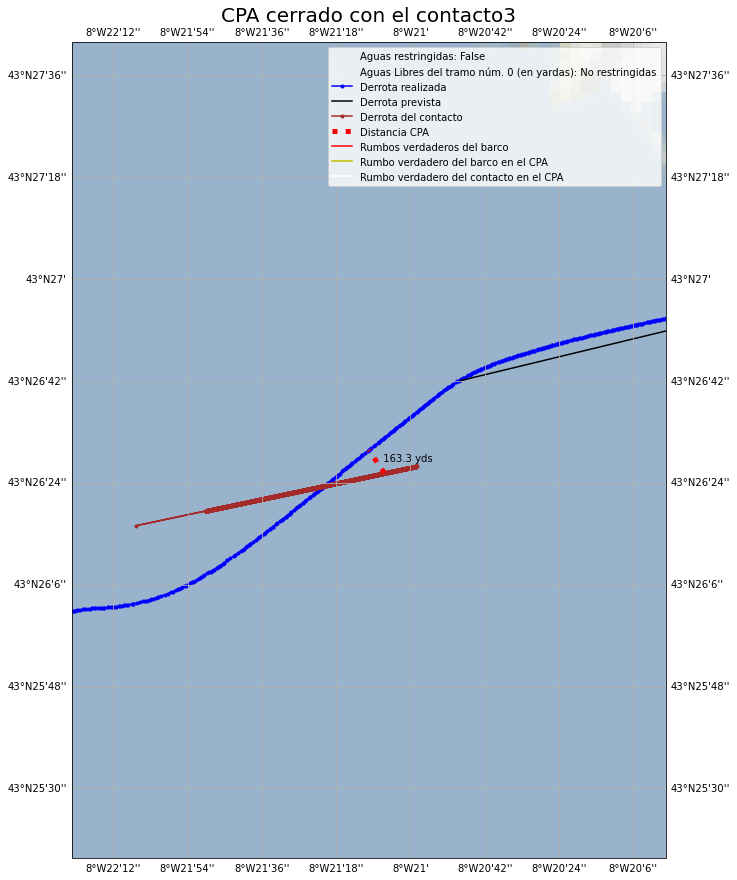

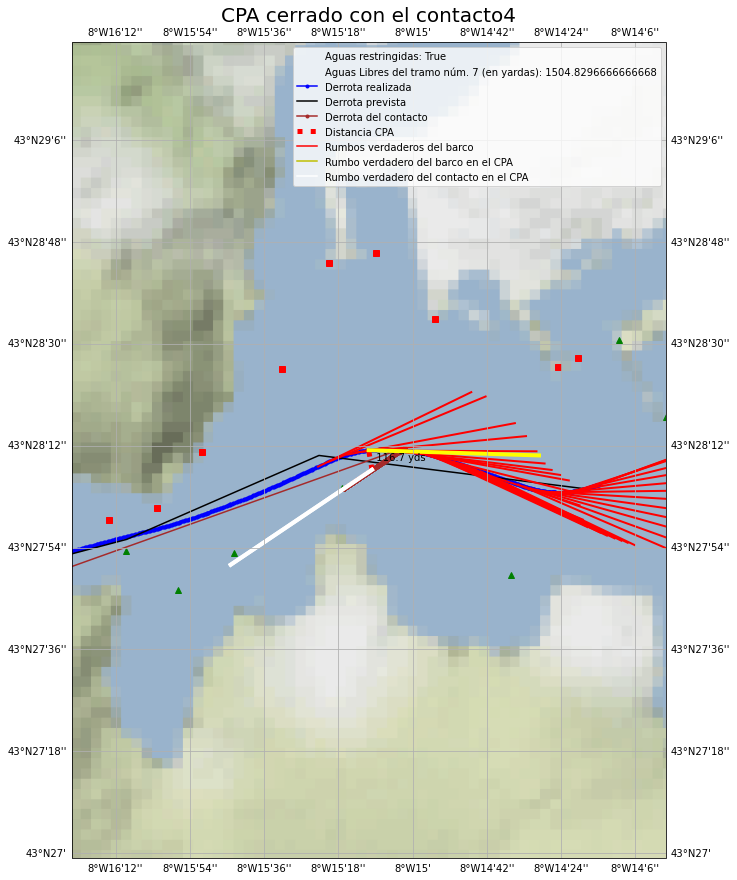

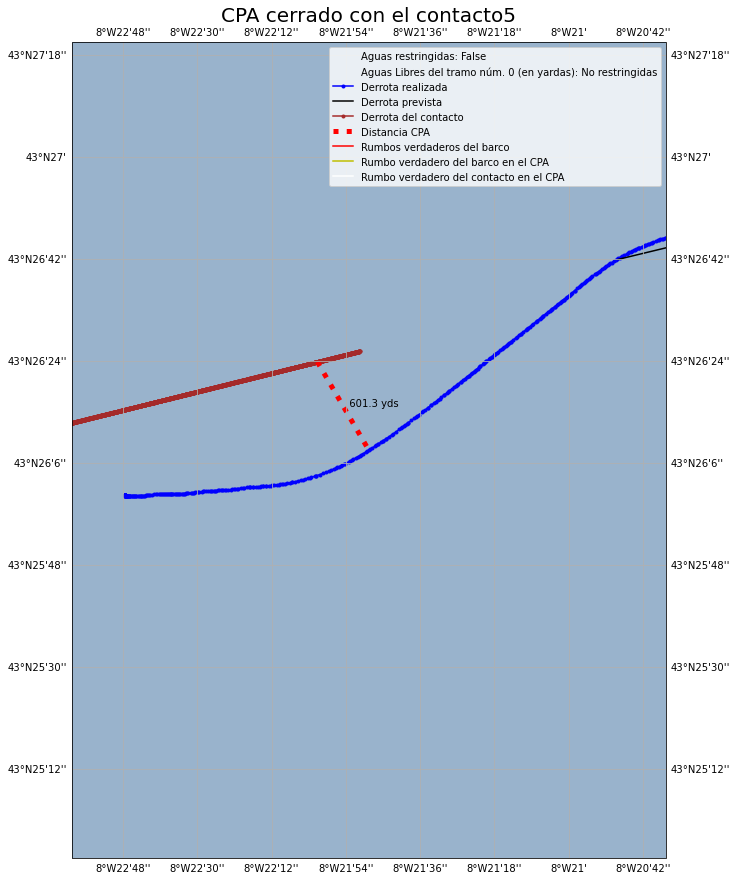

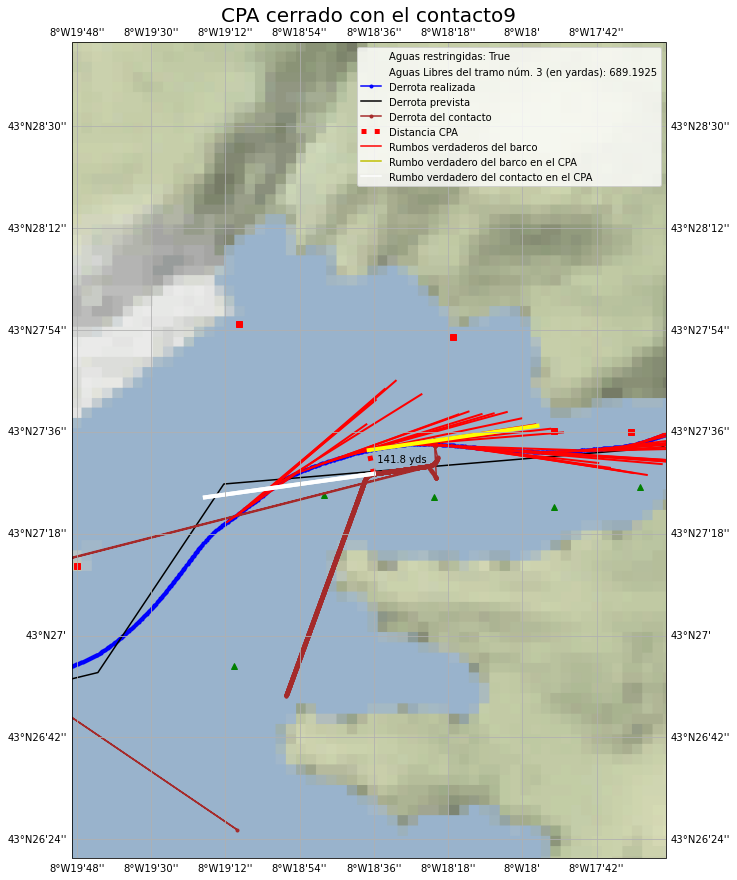

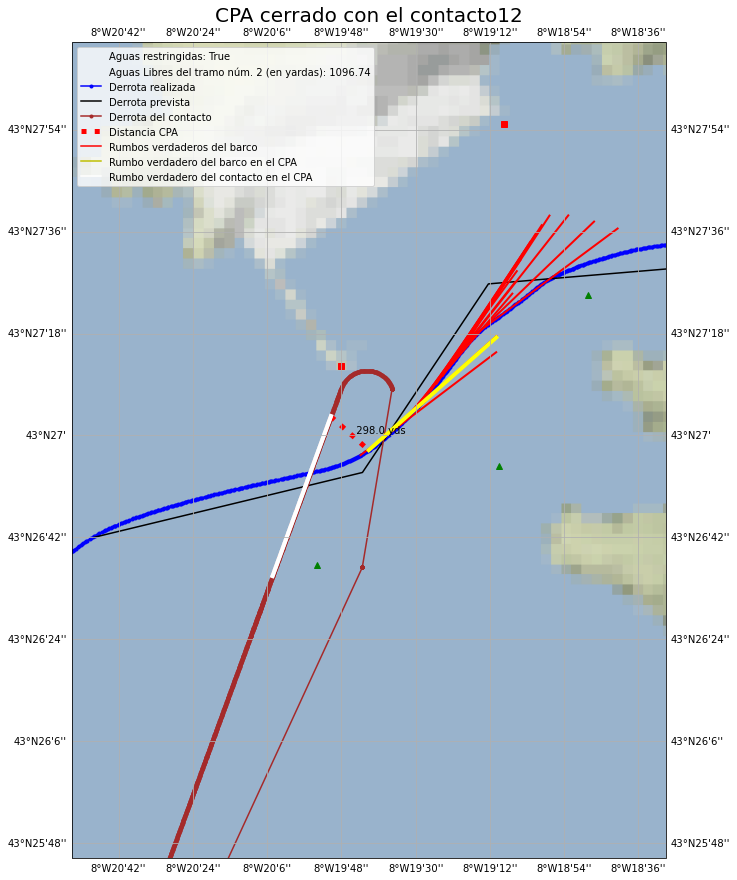

In [151]:
for i in range(0,len(cpa_df)):
    
    if cpa_df["CPA"][i]<2001 and cpa_df["Indice"][i]>0:
        tiler = Stamen('terrain-background')
        mercator = tiler.crs
        
        fig = plt.figure(figsize=(15, 15))
        ax = plt.axes(projection=ccrs.Mercator())
        ax.set_extent([cpa_df["Longitud_barco"][i]-0.02, cpa_df["Longitud_barco"][i]+0.02, 
                       cpa_df["Latitud_barco"][i]-0.02, cpa_df["Latitud_barco"][i]+0.02])
        ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
        ax.add_feature(cf.OCEAN)
        ax.add_image(tiler, 11)
        plt.title ("CPA cerrado con el "+str(cpa_df["Contacto"][i]),fontsize=20)
        aguas=0
        if cpa_df["Aguas_restringidas"][i]==True:
            aguas=cpa_df["Aguas_libres"][i]
        else: 
            aguas="No restringidas"
        plt.plot(0, 0," ", markersize=0,transform=ccrs.PlateCarree(),label="Aguas restringidas: "+str(cpa_df["Aguas_restringidas"][i]))
        plt.plot(0, 0," ", markersize=0,transform=ccrs.PlateCarree(),label="Aguas Libres del tramo núm. "+str(cpa_df["Tramo_CPA"][i])+" (en yardas): "+str(aguas))
        xCoordenadas, yCoordenadas =list(datos_sim["Longitud"]), list(datos_sim["Latitud"])
        plt.plot(xCoordenadas, yCoordenadas,'b.-',transform=ccrs.PlateCarree(),label="Derrota realizada")
        plt.plot(x_derrota, y_derrota,'k-',transform=ccrs.PlateCarree(),label="Derrota prevista")
        plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
        plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())

        plt.plot(list(dataframes[cpa[i][0]]['Longitud']),list(dataframes[cpa[i][0]]['Latitud']),'.-', color='brown', transform=ccrs.PlateCarree(),label="Derrota del contacto")
        
        plt.plot([cpa_df["Longitud"][i], cpa_df["Longitud_barco"][i]], 
                 [cpa_df["Latitud"][i], cpa_df["Latitud_barco"][i]],
                  color="r", linestyle=(":"), linewidth=5, marker='', markersize=4,transform=ccrs.PlateCarree(),label="Distancia CPA")
        
        if "T"+str(cpa_df["Tramo_CPA"][i]) != "T0":
            for j in track_tramos_c["T"+str(cpa_df["Tramo_CPA"][i])].index:

                if j[0]%10==0:

                    plt.plot([track_tramos_c["T"+str(cpa_df["Tramo_CPA"][i])]["Longitud"][j], track_tramos_c["T"+str(cpa_df["Tramo_CPA"][i])]["Longitud_3"][j]], 
                             [track_tramos_c["T"+str(cpa_df["Tramo_CPA"][i])]["Latitud"][j], track_tramos_c["T"+str(cpa_df["Tramo_CPA"][i])]["Latitud_3"][j]],
                             color='r', linestyle=("-"), linewidth=2, marker='', markersize=4,transform=ccrs.PlateCarree())

            for j in track_tramos_c["T"+str(cpa_df["Tramo_CPA"][i])].index:   
                if track_tramos_c["T"+str(cpa_df["Tramo_CPA"][i])]["MilisegundosDesdeInicio"][j]==cpa_df["TCPA"][i]:

                    plt.plot([track_tramos_c["T"+str(cpa_df["Tramo_CPA"][i])]["Longitud"][j], track_tramos_c["T"+str(cpa_df["Tramo_CPA"][i])]["Longitud_3"][j]], 
                             [track_tramos_c["T"+str(cpa_df["Tramo_CPA"][i])]["Latitud"][j], track_tramos_c["T"+str(cpa_df["Tramo_CPA"][i])]["Latitud_3"][j]],
                             color='yellow', linestyle=("-"), linewidth=4, marker='', markersize=4,transform=ccrs.PlateCarree())

            for j in range(0,len(dataframes[str(cpa_df["Contacto"][i])])):

                if dataframes[str(cpa_df["Contacto"][i])]["MilisegundosDesdeInicio"][j]==cpa_df["TCPA"][i]:

                    plt.plot([dataframes[str(cpa_df["Contacto"][i])]["Longitud"][j], dataframes[str(cpa_df["Contacto"][i])]["Longitud_3"][j]], 
                             [dataframes[str(cpa_df["Contacto"][i])]["Latitud"][j], dataframes[str(cpa_df["Contacto"][i])]["Latitud_3"][j]],
                             color="w", linestyle=("-"), linewidth=4, marker='', markersize=4,transform=ccrs.PlateCarree())
        
        plt.plot(0, 0,'r-', markersize=2,transform=ccrs.PlateCarree(),label="Rumbos verdaderos del barco")
        plt.plot(0, 0,'y-', markersize=4,transform=ccrs.PlateCarree(),label="Rumbo verdadero del barco en el CPA")
        plt.plot(0, 0,'w-', markersize=4,transform=ccrs.PlateCarree(),label="Rumbo verdadero del contacto en el CPA")
        plt.text((cpa_df["Longitud"][i]+cpa_df["Longitud_barco"][i])/2, (cpa_df["Latitud"][i]+cpa_df["Latitud_barco"][i])/2,"  "+str(round(cpa_df["CPA"][i],1))+ " yds",transform=ccrs.PlateCarree())

        plt.legend(loc='best',fontsize=10)  
        plt.show()

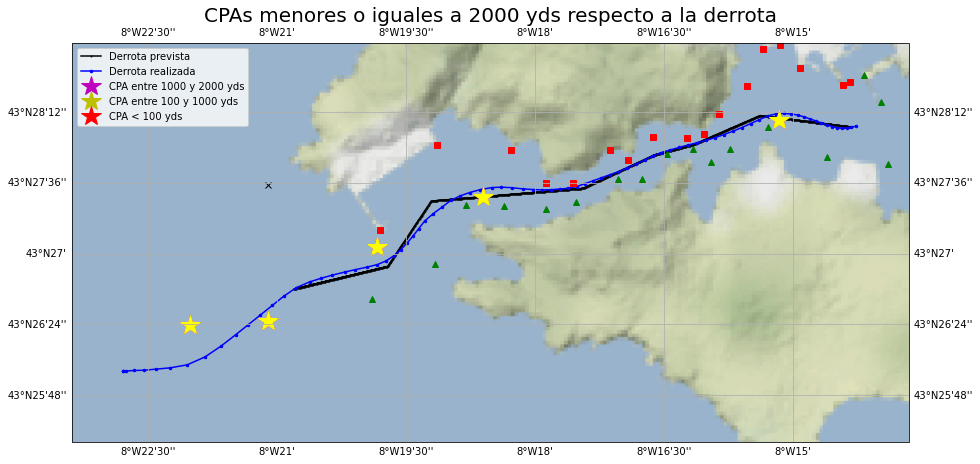

In [152]:
#NUEV
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)

plt.title ("CPAs menores o iguales a 2000 yds respecto a la derrota",fontsize=20)

plt.plot(derrota_gen_df["Longitud"], derrota_gen_df["Latitud"],"k.-", markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.plot(track_gen_df_1["Longitud"], track_gen_df_1["Latitud"],"b.-", markersize=5, transform=ccrs.PlateCarree(),label="Derrota realizada")
plt.plot(waypoints_df["Longitud"], waypoints_df["Latitud"],"kx",transform=ccrs.PlateCarree())
plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())

for i in range(0,len(cpa_df)):
    if cpa_df["CPA"][i]<=2000 and cpa_df["Indice"][i]>0:
        plt.plot(cpa_df["Longitud"][i], cpa_df["Latitud"][i], cpa_df["Latitud_barco"][i],
                color="m", linestyle=(""), linewidth=3, marker='*', markersize=20,transform=ccrs.PlateCarree())
        
for i in range(0,len(cpa_df)):
    if cpa_df["CPA"][i]<1000 and cpa_df["Indice"][i]>0:
        plt.plot(cpa_df["Longitud"][i], cpa_df["Latitud"][i], cpa_df["Latitud_barco"][i],
                color="yellow", linestyle=(""), linewidth=3, marker='*', markersize=20,transform=ccrs.PlateCarree())
        
for i in range(0,len(cpa_df)):
    if cpa_df["CPA"][i]<100 and cpa_df["Indice"][i]>0:
        plt.plot(cpa_df["Longitud"][i], cpa_df["Latitud"][i], cpa_df["Latitud_barco"][i],
                color="r", linestyle=(""), linewidth=3, marker='*', markersize=20,transform=ccrs.PlateCarree())

plt.plot(0, 0,'m*', markersize=20,transform=ccrs.PlateCarree(),label="CPA entre 1000 y 2000 yds")
plt.plot(0, 0,'y*', markersize=20,transform=ccrs.PlateCarree(),label="CPA entre 100 y 1000 yds")
plt.plot(0, 0,'r*', markersize=20,transform=ccrs.PlateCarree(),label="CPA < 100 yds")

plt.legend(loc='best',fontsize=10) 
plt.show()

In [153]:
display(cpa_df)

,Contacto,CPA,Indice,TCPA,Latitud,Longitud,Latitud_barco,Longitud_barco,Tramo_CPA,Aguas_restringidas,Aguas_libres,Aguas_libres_br,Aguas_libres_er
0,contacto1,7246.196763,0,47000.0,43.432883,-8.463033,43.433448,-8.379866,0,False,0.000000,0.000000,0.0000
1,contacto2,3996.615524,1,47000.0,43.459744,-8.351702,43.433448,-8.379866,0,False,0.000000,0.000000,0.0000
2,contacto3,163.269663,382,393000.0,43.440470,-8.351747,43.441595,-8.352802,0,False,0.000000,0.000000,0.0000
3,contacto4,116.684791,2161,1951000.0,43.468818,-8.252727,43.469776,-8.252955,7,True,1504.829667,874.141667,630.6880
4,contacto5,601.348125,255,278000.0,43.439975,-8.366918,43.435641,-8.363452,0,False,0.000000,0.000000,0.0000
5,contacto6,4655.226349,69,108000.0,43.422711,-8.430495,43.433398,-8.379094,0,False,0.000000,0.000000,0.0000
6,contacto7,3471.835979,1,47000.0,43.450709,-8.411852,43.433448,-8.379866,0,False,0.000000,0.000000,0.0000
7,contacto8,5705.342128,1035,1303000.0,43.411917,-8.287300,43.459230,-8.293749,3,True,689.192500,484.425000,204.7675
8,contacto9,141.779998,1138,1045000.0,43.457937,-8.310012,43.459093,-8.310345,3,True,689.192500,484.425000,204.7675
9,contacto10,6839.400497,55,108000.0,43.376412,-8.380479,43.433398,-8.379094,0,False,0.000000,0.000000,0.0000


In [154]:
#NUEV
cpa_df_reducidos=cpa_df[cpa_df["CPA"]<=2000]
display(cpa_df_reducidos)

,Contacto,CPA,Indice,TCPA,Latitud,Longitud,Latitud_barco,Longitud_barco,Tramo_CPA,Aguas_restringidas,Aguas_libres,Aguas_libres_br,Aguas_libres_er
2,contacto3,163.269663,382,393000.0,43.440470,-8.351747,43.441595,-8.352802,0,False,0.000000,0.000000,0.0000
3,contacto4,116.684791,2161,1951000.0,43.468818,-8.252727,43.469776,-8.252955,7,True,1504.829667,874.141667,630.6880
4,contacto5,601.348125,255,278000.0,43.439975,-8.366918,43.435641,-8.363452,0,False,0.000000,0.000000,0.0000
8,contacto9,141.779998,1138,1045000.0,43.457937,-8.310012,43.459093,-8.310345,3,True,689.192500,484.425000,204.7675
11,contacto12,297.959453,583,692000.0,43.450930,-8.330712,43.449278,-8.328160,2,True,1096.740000,450.890000,645.8500


In [155]:
#NUEV
distancias_CPA_derrota=[]

for i in cpa_df_reducidos.index:
    distancias_CPA_derrota_parcial=[]
    if "T"+str(cpa_df_reducidos["Tramo_CPA"][i]) != "T0":
        print(i)

        for j in range(0,len(derrota_tramos["T"+str(cpa_df_reducidos["Tramo_CPA"][i])])):

            distancias_CPA_derrota_parcial.append(distancia_c((cpa_df_reducidos["Longitud"][i],cpa_df_reducidos["Latitud"][i]),
                                                            (derrota_tramos["T"+str(cpa_df_reducidos["Tramo_CPA"][i])]["Longitud"][j],
                                                             derrota_tramos["T"+str(cpa_df_reducidos["Tramo_CPA"][i])]["Latitud"][j])))
        print(np.min(distancias_CPA_derrota_parcial))
        distancias_CPA_derrota.append(np.min(distancias_CPA_derrota_parcial))
    else:
        distancias_CPA_derrota.append(100000)

cpa_df_reducidos["D_CPA_derrota"]=distancias_CPA_derrota

display(cpa_df_reducidos)

3
44.462241256334465
8
13.719873284781595
11
336.9974075708869


,Contacto,CPA,Indice,TCPA,Latitud,Longitud,Latitud_barco,Longitud_barco,Tramo_CPA,Aguas_restringidas,Aguas_libres,Aguas_libres_br,Aguas_libres_er,D_CPA_derrota
2,contacto3,163.269663,382,393000.0,43.440470,-8.351747,43.441595,-8.352802,0,False,0.000000,0.000000,0.0000,100000.000000
3,contacto4,116.684791,2161,1951000.0,43.468818,-8.252727,43.469776,-8.252955,7,True,1504.829667,874.141667,630.6880,44.462241
4,contacto5,601.348125,255,278000.0,43.439975,-8.366918,43.435641,-8.363452,0,False,0.000000,0.000000,0.0000,100000.000000
8,contacto9,141.779998,1138,1045000.0,43.457937,-8.310012,43.459093,-8.310345,3,True,689.192500,484.425000,204.7675,13.719873
11,contacto12,297.959453,583,692000.0,43.450930,-8.330712,43.449278,-8.328160,2,True,1096.740000,450.890000,645.8500,336.997408


In [156]:
#NUEV
cpa_df_derrota=cpa_df_reducidos[cpa_df_reducidos["D_CPA_derrota"]<=200]
display(cpa_df_derrota)

,Contacto,CPA,Indice,TCPA,Latitud,Longitud,Latitud_barco,Longitud_barco,Tramo_CPA,Aguas_restringidas,Aguas_libres,Aguas_libres_br,Aguas_libres_er,D_CPA_derrota
3,contacto4,116.684791,2161,1951000.0,43.468818,-8.252727,43.469776,-8.252955,7,True,1504.829667,874.141667,630.6880,44.462241
8,contacto9,141.779998,1138,1045000.0,43.457937,-8.310012,43.459093,-8.310345,3,True,689.192500,484.425000,204.7675,13.719873


In [157]:
#NUEV
tramos_derrota_contacto=[]
for i in cpa_df_derrota.index:
    tramos_derrota_contacto.append(cpa_df_derrota['Tramo_CPA'][i])
print(tramos_derrota_contacto)

[7, 3]


In [158]:
display(distancias_por_tramo_df)

,Tramo,D_max,D_min,D_med,%D<50,%D_50-100,%D_100-150,%D_150-200,%D>200,Aguas_restringidas
0,T1,100.226,5.010,69.201,11.650,87.864,0.485,0.000,0.000,False
1,T2,135.381,0.240,61.283,36.471,52.941,10.588,0.000,0.000,True
2,T3,225.050,1.156,75.421,42.821,23.174,28.463,3.023,2.519,True
3,T4,60.741,0.081,19.078,89.952,10.048,0.000,0.000,0.000,True
4,T5,17.134,0.156,13.154,100.000,0.000,0.000,0.000,0.000,True
5,T6,62.371,0.004,43.611,46.524,53.476,0.000,0.000,0.000,True
6,T7,92.699,0.107,45.247,63.814,36.186,0.000,0.000,0.000,True


In [159]:
# T R A M O S   C P A

In [160]:
#NUEV
distancias_por_tramo_df["Contacto"]=False
for i in tramos_derrota_contacto:
    distancias_por_tramo_df["Contacto"][i-1]=True
display(distancias_por_tramo_df)

,Tramo,D_max,D_min,D_med,%D<50,%D_50-100,%D_100-150,%D_150-200,%D>200,Aguas_restringidas,Contacto
0,T1,100.226,5.010,69.201,11.650,87.864,0.485,0.000,0.000,False,False
1,T2,135.381,0.240,61.283,36.471,52.941,10.588,0.000,0.000,True,False
2,T3,225.050,1.156,75.421,42.821,23.174,28.463,3.023,2.519,True,True
3,T4,60.741,0.081,19.078,89.952,10.048,0.000,0.000,0.000,True,False
4,T5,17.134,0.156,13.154,100.000,0.000,0.000,0.000,0.000,True,False
5,T6,62.371,0.004,43.611,46.524,53.476,0.000,0.000,0.000,True,False
6,T7,92.699,0.107,45.247,63.814,36.186,0.000,0.000,0.000,True,True


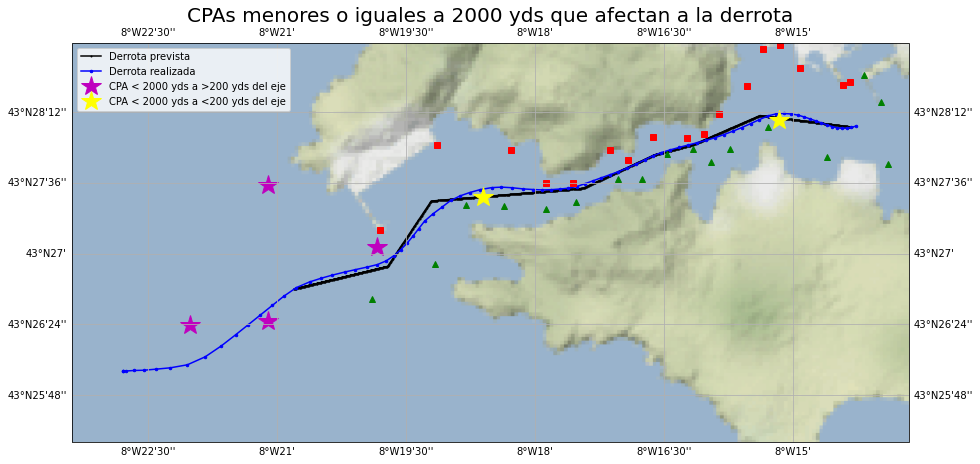

In [161]:
#NUEV
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("CPAs menores o iguales a 2000 yds que afectan a la derrota",fontsize=20)

plt.plot(derrota_gen_df["Longitud"], derrota_gen_df["Latitud"],"k.-", markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.plot(track_gen_df_1["Longitud"], track_gen_df_1["Latitud"],"b.-", markersize=5, transform=ccrs.PlateCarree(),label="Derrota realizada")
plt.plot(waypoints_df["Longitud"], waypoints_df["Latitud"],"kx",transform=ccrs.PlateCarree())
plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())

for i in range(0,len(cpa_df)):
    colores=["m","yellow"]
    clr=""
    if i in cpa_df_derrota.index:
        clr=colores[1]
    else:
        clr=colores[0]
            
    plt.plot(cpa_df["Longitud"][i], cpa_df["Latitud"][i], cpa_df["Latitud_barco"][i],
            color=clr, linestyle=(""), linewidth=3, marker='*', markersize=20,transform=ccrs.PlateCarree())

plt.plot(0, 0,'m*', markersize=20,transform=ccrs.PlateCarree(),label="CPA < 2000 yds a >200 yds del eje")
plt.plot(0, 0,'*',color="yellow", markersize=20,transform=ccrs.PlateCarree(),label="CPA < 2000 yds a <200 yds del eje")
plt.legend(loc='best',fontsize=10) 
plt.show()

    

In [162]:
# Añadir aguas y contato a tabla rumbos.
tramos_alej_df["Aguas_restringidas"]=distancias_por_tramo_df["Aguas_restringidas"]
tramos_alej_df["Contacto"]=distancias_por_tramo_df["Contacto"]

display(tramos_alej_df)

,Tramo,Total_Puntos,Total_>20yds,Hacia_eje>20yds,No_Hacia_eje_>20yds,Porcentaje_Rumbos_no_hacia_eje,Aguas_restringidas,Contacto
0,T1,206,200,0,200,97.087379,False,False
1,T2,170,147,20,127,74.705882,True,False
2,T3,397,385,171,214,53.904282,True,True
3,T4,209,74,74,0,0.000000,True,False
4,T5,111,0,0,0,0.000000,True,False
5,T6,187,151,0,151,80.748663,True,False
6,T7,409,324,101,223,54.523227,True,True


In [163]:
#linea de balizas.

In [164]:
y_rojas_ferrol=[43+(27.204/60), 43+(27.918/60),43+(27.88/60),43+(27.603/60), 43+(27.598/60),43+(27.8762/60), 43+(27.794/60), 
                  43+(27.986/60), 43+(27.981/60),
               43+(28.015/60),43+(28.180/60),43+(28.425/60),43+(28.737/60),43+(28.767/60),43+(28.574/60),
               43+(28.430/60),43+(28.459/60),43+(28.511/60),43+(28.284/60)]
x_rojas_ferrol=[-8-(19.801/60),-8-(19.143/60),-8-(18.279/60),-8-(17.87/60), -8-(17.56/60), -8-(17.125/60),-8-(16.912/60), 
                  -8-(16.628/60), -8-(16.228/60),
               -8-(16.031/60),-8-(15.851/60),-8-(15.528/60),-8-(15.339/60),-8-(15.147/60),-8-(14.909/60),
               -8-(14.412/60),-8-(14.3326/60),-8-(14.166/60),-8-(13.974/60)]

num_tramos_baliza= len(y_rojas_ferrol)-1

# Calcular los rumbos de la derrota en base a los waypoints en grados.
r_derrota_baliza=[]
for i in range(0,len(y_rojas_ferrol)-1):
    rumbo=math.atan(((x_rojas_ferrol[i+1]-x_rojas_ferrol[i])*math.cos((np.mean(y_rojas_ferrol))*(math.pi)/180))/
                    ((y_rojas_ferrol[i+1]-y_rojas_ferrol[i])+0.0000000000000001))
    r_derrota_baliza.append(rumbo*180/math.pi)

# Calcular los rumbos de la derrota en base a los waypoints en radianes.
r_baliza_rad=[]
for rumbo in r_derrota_baliza:
    rumbo_rad=rumbo*(math.pi)/180
    r_baliza_rad.append(rumbo_rad)


x_baliza_r_gen=[]
y_baliza_r_gen=[]
tramos=[]
lista_tramos=[0]
for i in range(0,num_tramos_baliza):
    lista_tramos.append([i+1,(x_rojas_ferrol[i],y_rojas_ferrol[i]),(x_rojas_ferrol[i+1],y_rojas_ferrol[i+1])])
    x_gen=x_rojas_ferrol[i]
    if x_rojas_ferrol[i+1] > x_rojas_ferrol[i]:
        for x in np.arange(x_rojas_ferrol[i], x_rojas_ferrol[i+1], 0.00001):
            y_gen=y_rojas_ferrol[i]
            x_gen=x
            y_gen+=((x-x_rojas_ferrol[i])/math.tan(r_baliza_rad[i]))*math.cos((np.mean(y_rojas_ferrol))*(math.pi)/180)
            x_baliza_r_gen.append(round(x_gen,6))
            y_baliza_r_gen.append(round(y_gen,6))
            tramos.append(i+1)
        if x_rojas_ferrol[i] not in x_baliza_r_gen: 
            x_baliza_r_gen.append(round(x_rojas_ferrol[i],6))
            y_baliza_r_gen.append(round(y_rojas_ferrol[i],6))
            tramos.append(i+1)
            
    elif x_rojas_ferrol[i+1] == x_rojas_ferrol[i]:
        if y_rojas_ferrol[i+1] > y_rojas_ferrol[i]:
            for y in np.arange(y_rojas_ferrol[i], y_rojas_ferrol[i+1], 0.00001):
                y_gen=y_rojas_ferrol[i]
                x_gen=x_rojas_ferrol[i]
                y_gen+=y-y_rojas_ferrol[i]
                x_baliza_r_gen.append(round(x_gen,6))
                y_baliza_r_gen.append(round(y_gen,6))   
                tramos.append(i+1)
            if x_rojas_ferrol[i] not in x_baliza_r_gen: 
                x_baliza_r_gen.append(round(x_rojas_ferrol[i],6))
                y_baliza_r_gen.append(round(y_rojas_ferrol[i],6))
                tramos.append(i+1)
        else:
            for y in np.arange(y_rojas_ferrol[i+1], y_rojas_ferrol[i], 0.00001):
                y_gen=y_rojas_ferrol[i+1]
                x_gen=x_rojas_ferrol[i]
                y_gen+=y-y_rojas_ferrol[i+1]
                x_baliza_r_gen.append(round(x_gen,6))
                y_baliza_r_gen.append(round(y_gen,6))
                tramos.append(i+1)
            if x_rojas_ferrol[i] not in x_baliza_r_gen: 
                x_baliza_r_gen.append(round(x_rojas_ferrol[i],6))
                y_baliza_r_gen.append(round(y_rojas_ferrol[i],6))
                tramos.append(i+1)
    else: 
        for x in np.arange(x_rojas_ferrol[i+1], x_rojas_ferrol[i], 0.00001):
            y_gen=y_rojas_ferrol[i+1]
            x_gen=x
            y_gen+=((x-x_rojas_ferrol[i+1])/math.tan(r_baliza_rad[i]))*math.cos((np.mean(y_rojas_ferrol))*(math.pi)/180)
            x_baliza_r_gen.append(round(x_gen,6))
            y_baliza_r_gen.append(round(y_gen,6))     
            tramos.append(i+1)
        if x_rojas_ferrol[i] not in x_baliza_r_gen: 
            x_baliza_r_gen.append(round(x_rojas_ferrol[i],6))
            y_baliza_r_gen.append(round(y_rojas_ferrol[i],6))
            tramos.append(i+1)

In [165]:
baliza_r_gen_df = pd.DataFrame(list(zip(x_baliza_r_gen, y_baliza_r_gen)), 
               columns =['Longitud', 'Latitud']) 
display(baliza_r_gen_df)

,Longitud,Latitud
0,-8.330017,43.453400
1,-8.330007,43.453411
2,-8.329997,43.453422
3,-8.329987,43.453433
4,-8.329977,43.453443
...,...,...
9728,-8.232950,43.471459
9729,-8.232940,43.471447
9730,-8.232930,43.471435
9731,-8.232920,43.471424


In [166]:
y_verdes_ferrol=[43+(26.619/60),43+(26.909/60), 43+(27.413/60),43+(27.407/60),43+(27.377/60),
                   43+(27.437/60),43+(27.629/60),43+(27.636/60), 43+(27.841/60), 43+(27.891/60), 43+(27.776/60),
               43+(27.884/60),43+(28.074/60),43+(27.818/60),43+(27.761/60)]

x_verdes_ferrol=[-8-(19.898/60),-8-(19.164/60),-8-(18.802/60),-8-(18.356/60), -8-(17.87/60),
                -8-(17.526/60),-8-(17.03/60),-8-(16.751/60),-8-(16.461/60), -8-(16.159/60),-8-(15.948/60),-8-(15.723/60),
                 -8-(15.286/60),-8-(14.600/60),-8-(13.889/60)]

num_tramos_baliza= len(y_verdes_ferrol)-1

# Calcular los rumbos de la derrota en base a los waypoints en grados.
r_derrota_baliza_v=[]
for i in range(0,len(y_verdes_ferrol)-1):
    rumbo=math.atan(((x_verdes_ferrol[i+1]-x_verdes_ferrol[i])*math.cos((np.mean(y_verdes_ferrol))*(math.pi)/180))/
                    ((y_verdes_ferrol[i+1]-y_verdes_ferrol[i])+0.0000000000000001))
    r_derrota_baliza_v.append(rumbo*180/math.pi)

# Calcular los rumbos de la derrota en base a los waypoints en radianes.
r_baliza_rad_v=[]
for rumbo in r_derrota_baliza_v:
    rumbo_rad=rumbo*(math.pi)/180
    r_baliza_rad_v.append(rumbo_rad)


x_baliza_v_gen=[]
y_baliza_v_gen=[]
tramos=[]
lista_tramos=[0]
for i in range(0,num_tramos_baliza):
    lista_tramos.append([i+1,(x_verdes_ferrol[i],y_verdes_ferrol[i]),(x_verdes_ferrol[i+1],y_verdes_ferrol[i+1])])
    x_gen=x_verdes_ferrol[i]
    if x_verdes_ferrol[i+1] > x_verdes_ferrol[i]:
        for x in np.arange(x_verdes_ferrol[i], x_verdes_ferrol[i+1], 0.00001):
            y_gen=y_verdes_ferrol[i]
            x_gen=x
            y_gen+=((x-x_verdes_ferrol[i])/math.tan(r_baliza_rad_v[i]))*math.cos((np.mean(y_verdes_ferrol))*(math.pi)/180)
            x_baliza_v_gen.append(round(x_gen,6))
            y_baliza_v_gen.append(round(y_gen,6))
            tramos.append(i+1)
        if x_verdes_ferrol[i] not in x_baliza_v_gen: 
            x_baliza_v_gen.append(round(x_verdes_ferrol[i],6))
            y_baliza_v_gen.append(round(y_verdes_ferrol[i],6))
            tramos.append(i+1)
            
    elif x_verdes_ferrol[i+1] == x_verdes_ferrol[i]:
        if y_verdes_ferrol[i+1] > y_verdes_ferrol[i]:
            for y in np.arange(y_verdes_ferrol[i], y_verdes_ferrol[i+1], 0.00001):
                y_gen=y_verdes_ferrol[i]
                x_gen=x_verdes_ferrol[i]
                y_gen+=y-y_verdes_ferrol[i]
                x_baliza_v_gen.append(round(x_gen,6))
                y_baliza_v_gen.append(round(y_gen,6))   
                tramos.append(i+1)
            if x_verdes_ferrol[i] not in x_baliza_v_gen: 
                x_baliza_v_gen.append(round(x_verdes_ferrol[i],6))
                y_baliza_v_gen.append(round(y_verdes_ferrol[i],6))
                tramos.append(i+1)
        else:
            for y in np.arange(y_verdes_ferrol[i+1], y_verdes_ferrol[i], 0.00001):
                y_gen=y_verdes_ferrol[i+1]
                x_gen=x_verdes_ferrol[i]
                y_gen+=y-y_verdes_ferrol[i+1]
                x_baliza_v_gen.append(round(x_gen,6))
                y_baliza_v_gen.append(round(y_gen,6))
                tramos.append(i+1)
            if x_verdes_ferrol[i] not in x_baliza_v_gen: 
                x_baliza_v_gen.append(round(x_verdes_ferrol[i],6))
                y_baliza_vgen.append(round(y_verdes_ferrol[i],6))
                tramos.append(i+1)
    else: 
        for x in np.arange(x_verdes_ferrol[i+1], x_verdes_ferrol[i], 0.00001):
            y_gen=y_verdes_ferrol[i+1]
            x_gen=x
            y_gen+=((x-x_verdes_ferrol[i+1])/math.tan(r_baliza_rad_v[i]))*math.cos((np.mean(y_verdes_ferrol))*(math.pi)/180)
            x_baliza_v_gen.append(round(x_gen,6))
            y_baliza_v_gen.append(round(y_gen,6))     
            tramos.append(i+1)
        if x_verdes_ferrol[i] not in x_baliza_v_gen: 
            x_baliza_v_gen.append(round(x_verdes_ferrol[i],6))
            y_baliza_v_gen.append(round(y_verdes_ferrol[i],6))
            tramos.append(i+1)

In [167]:
baliza_v_gen_df = pd.DataFrame(list(zip(x_baliza_v_gen, y_baliza_v_gen)), 
               columns =['Longitud', 'Latitud']) 
display(baliza_v_gen_df)

,Longitud,Latitud
0,-8.331633,43.443650
1,-8.331623,43.443654
2,-8.331613,43.443658
3,-8.331603,43.443662
4,-8.331593,43.443666
...,...,...
10028,-8.231513,43.462686
10029,-8.231503,43.462685
10030,-8.231493,43.462684
10031,-8.231483,43.462683


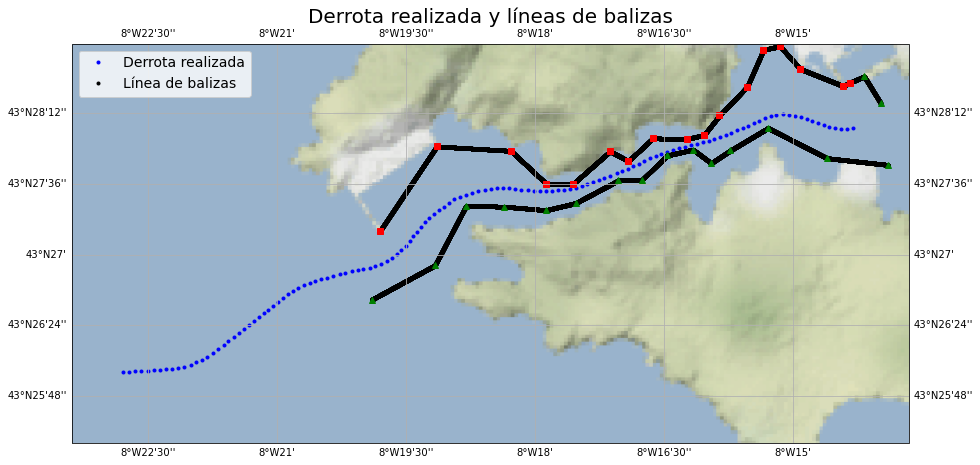

In [168]:
# Visualizar la derrota y el track muestreados en proyección mercator y fondo pixelado de la zona.
tiler = Stamen('terrain-background')
mercator = tiler.crs
fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Derrota realizada y líneas de balizas",fontsize=20)

plt.plot(x_track_gen_dbi, y_track_gen_dbi,'b.',transform=ccrs.PlateCarree(),label="Derrota realizada")
plt.plot(baliza_r_gen_df["Longitud"], baliza_r_gen_df["Latitud"],'k.',transform=ccrs.PlateCarree(),label="Línea de balizas")
plt.plot(baliza_v_gen_df["Longitud"], baliza_v_gen_df["Latitud"],'k.',transform=ccrs.PlateCarree())

plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())

plt.legend(loc='best',fontsize=14)

plt.show()

In [169]:
#juntar los puntos del track y le la derrota evaluada en un solo conjunto de dados a separar por DCSCAN.
baliza_fusionada_df_r = pd.merge(track_gen_df_db_1,
                                baliza_r_gen_df, on=["Longitud","Latitud"],
                                how="outer", indicator=False)
baliza_fusionada_df_v = pd.merge(track_gen_df_db_1,baliza_v_gen_df, on=["Longitud","Latitud"],
                                how="outer", indicator=False)

baliza_fusionada_df_r=baliza_fusionada_df_r.drop(["Tramo"],axis=1)
baliza_fusionada_df_v=baliza_fusionada_df_v.drop(["Tramo"],axis=1)

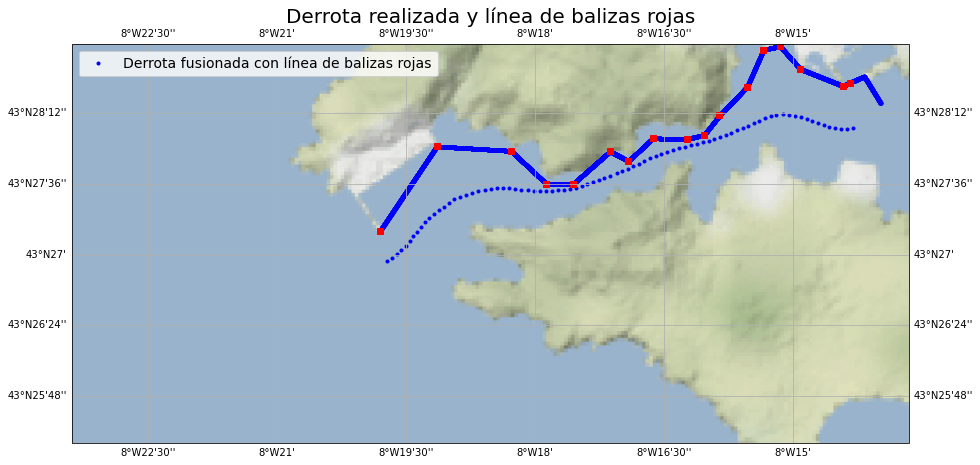

In [170]:
# Visualizar la derrota y el track muestreados en proyección mercator y fondo pixelado de la zona.
tiler = Stamen('terrain-background')
mercator = tiler.crs
fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Derrota realizada y línea de balizas rojas",fontsize=20)

plt.plot(baliza_fusionada_df_r["Longitud"],baliza_fusionada_df_r["Latitud"],'b.',transform=ccrs.PlateCarree(),label="Derrota fusionada con línea de balizas rojas")

plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())

plt.legend(loc='best',fontsize=14)

plt.show()

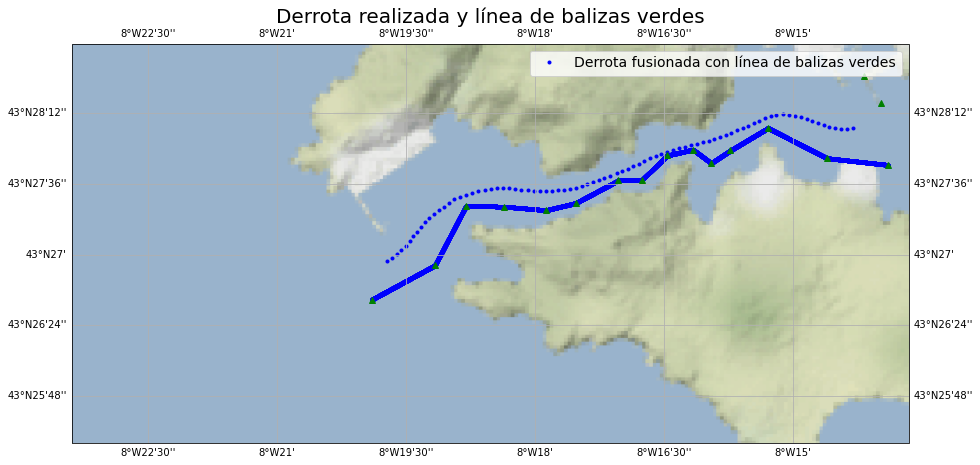

In [171]:
# Visualizar la derrota y el track muestreados en proyección mercator y fondo pixelado de la zona.
tiler = Stamen('terrain-background')
mercator = tiler.crs
fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Derrota realizada y línea de balizas verdes",fontsize=20)

plt.plot(baliza_fusionada_df_v["Longitud"],baliza_fusionada_df_v["Latitud"],'b.',transform=ccrs.PlateCarree(),label="Derrota fusionada con línea de balizas verdes")

plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())

plt.legend(loc='best',fontsize=14)

plt.show()

In [172]:
Xbr=baliza_fusionada_df_r
Xbv=baliza_fusionada_df_v

# Estandarización de los datos de entrenamiento
standardizer = preprocessing.StandardScaler()
stdr_trained_r = standardizer.fit(Xbr)
stdr_trained_v = standardizer.fit(Xbv)
X_stdr_r = stdr_trained_r.transform(Xbr)
X_stdr_v = stdr_trained_v.transform(Xbv)

dbscan=DBSCAN(eps=0.04, metric='euclidean', min_samples=2)
clusters_baliza_r=dbscan.fit_predict(X_stdr_r)
clusters_baliza_v=dbscan.fit_predict(X_stdr_v)

baliza_fusionada_df_r["Cluster"]=clusters_baliza_r
baliza_fusionada_df_v["Cluster"]=clusters_baliza_v

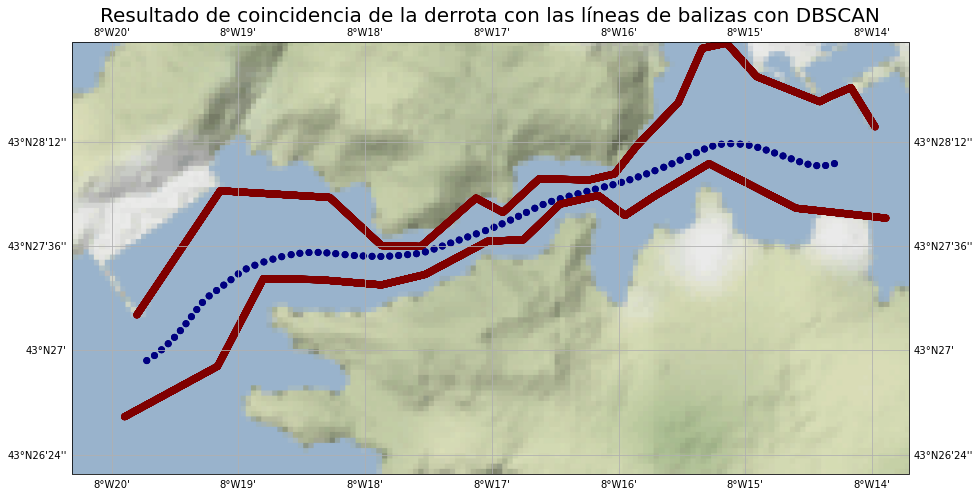

In [173]:
#Mostrar resultados de la clusterizacion con DBSCAN.
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(derrota_gen_df_1["Longitud"])-0.01, np.max(derrota_gen_df_1["Longitud"])+0.01, 
               np.min(derrota_gen_df_1["Latitud"])-0.01, np.max(derrota_gen_df_1["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Resultado de coincidencia de la derrota con las líneas de balizas con DBSCAN",fontsize=20)

plt.scatter(Xbr["Longitud"], Xbr["Latitud"], c=Xbr["Cluster"], 
            cmap='jet',transform=ccrs.PlateCarree())
plt.scatter(Xbv["Longitud"], Xbv["Latitud"], c=Xbv["Cluster"], 
            cmap='jet',transform=ccrs.PlateCarree())
# plt.legend(loc='upper left',fontsize=14)

plt.show()

In [174]:
# Obtener el % de puntos detectados como outliers en la derrota de precisión en aguas restringidas.
num_clusters=[]
for i in np.unique(clusters_baliza_v):
    num_clusters.append(np.sum(clusters_baliza_v==i))
num_clusters.sort()

print(num_clusters)
total_puntos=len(track_gen_df_db_1)
print(total_puntos)

pct_outliers_v=round(np.sum(num_clusters[:-1])*100/total_puntos,2)
outliers_v=round(100-pct_outliers_v,2)
    
print("Porcentaje de puntos de la derrota ejecutada excesivamente cercanos o que han cruzado la línea de balizas: ", outliers_v, "%")

[84, 10033]
84
Porcentaje de puntos de la derrota ejecutada excesivamente cercanos o que han cruzado la línea de balizas:  0.0 %


In [175]:
# Obtener el % de puntos detectados como outliers en la derrota de precisión en aguas restringidas.
num_clusters=[]
for i in np.unique(clusters_baliza_r):
    num_clusters.append(np.sum(clusters_baliza_r==i))
num_clusters.sort()

print(num_clusters)
total_puntos=len(track_gen_df_db_1)
print(total_puntos)


pct_outliers_r=round(np.sum(num_clusters[:-1])*100/total_puntos,2)

outliers_r=round(100-pct_outliers_r,2)
    
print("Porcentaje de puntos de la derrota ejecutada excesivamente cercanos o que han cruzado la línea de balizas: ", outliers_r, "%")

[84, 9733]
84
Porcentaje de puntos de la derrota ejecutada excesivamente cercanos o que han cruzado la línea de balizas:  0.0 %


In [176]:
# Generación de los datos a evaluar.

In [177]:
xtrack_datos_tramos_restringidos=[]
xtrack_datos_tramos_restringidos_contacto=[]
xtrack_datos_tramos_libres=[]
#xtrack_tramo
for i in range(0,len(tramos_alej_df)):
    if distancias_por_tramo_df['Aguas_restringidas'][i]==True:
        if distancias_por_tramo_df['Contacto'][i]==True:
            xtrack_datos_tramos_restringidos_contacto.append([distancias_por_tramo_df['Tramo'][i],
                                                              distancias_por_tramo_df['D_max'][i]])
        else: xtrack_datos_tramos_restringidos.append([distancias_por_tramo_df['Tramo'][i],
                                                       distancias_por_tramo_df['D_max'][i]])
    else: xtrack_datos_tramos_libres.append([distancias_por_tramo_df['Tramo'][i],
                                             distancias_por_tramo_df['D_max'][i]])

print(xtrack_datos_tramos_restringidos)
print(xtrack_datos_tramos_restringidos_contacto)
print(xtrack_datos_tramos_libres)
        

[['T2', 135.381], ['T4', 60.741], ['T5', 17.134], ['T6', 62.371]]
[['T3', 225.05], ['T7', 92.699]]
[['T1', 100.226]]


In [178]:
rumbo_datos_tramos_restringidos=[]
rumbo_datos_tramos_restringidos_contacto=[]
rumbo_datos_tramos_libres=[]
#rumbo_tramo
for i in range(0,len(distancias_por_tramo_df)):
    if tramos_alej_df['Aguas_restringidas'][i]==True:
        if tramos_alej_df['Contacto'][i]==True:
            rumbo_datos_tramos_restringidos_contacto.append([distancias_por_tramo_df['Tramo'][i],
                                                             tramos_alej_df['Porcentaje_Rumbos_no_hacia_eje'][i]])
        else: rumbo_datos_tramos_restringidos.append([distancias_por_tramo_df['Tramo'][i],
                                                      tramos_alej_df['Porcentaje_Rumbos_no_hacia_eje'][i]])
    else: rumbo_datos_tramos_libres.append([distancias_por_tramo_df['Tramo'][i],
                                            tramos_alej_df['Porcentaje_Rumbos_no_hacia_eje'][i]])

print(rumbo_datos_tramos_restringidos)
print(rumbo_datos_tramos_restringidos_contacto)
print(rumbo_datos_tramos_libres)

[['T2', 74.70588235294117], ['T4', 0.0], ['T5', 0.0], ['T6', 80.74866310160428]]
[['T3', 53.904282115869016], ['T7', 54.52322738386308]]
[['T1', 97.0873786407767]]


In [179]:
#d_wp
d_wp_tramos=[]

for i in range(1,len(tabla_d_wp)):
    d_wp_tramos.append([tabla_d_wp["d2f"][i],tabla_d_wp["d1+d_med"][i],tabla_d_wp["d1"][i],tabla_d_wp["d"][i]])


d_wp_tramos_libres=[]
d_wp_tramos_restringidos=[]
d_wp_tramos_restringidos_libres=[]
d_wp_tramos_libres_restringidos=[]

for i in range(0,len(d_wp_tramos)-1):
    if tabla_d_wp["Aguas_restringidas"][i+1]==True and tabla_d_wp["Aguas_restringidas"][i+2]==True:
        d_wp_tramos_restringidos.append(["T"+str(i+1),d_wp_tramos[i]])
    elif tabla_d_wp["Aguas_restringidas"][i+1]==False and tabla_d_wp["Aguas_restringidas"][i+2]==False:
        d_wp_tramos_libres.append(["T"+str(i+1),d_wp_tramos[i]])
    elif tabla_d_wp["Aguas_restringidas"][i+1]==False and tabla_d_wp["Aguas_restringidas"][i+2]==True:
        d_wp_tramos_libres_restringidos.append(["T"+str(i+1),d_wp_tramos[i]])
    elif tabla_d_wp["Aguas_restringidas"][i+1]==True and tabla_d_wp["Aguas_restringidas"][i+2]==False:
        d_wp_tramos_restringidos_libres.append(["T"+str(i+1),d_wp_tramos[i]])
    
print("Libres",d_wp_tramos_libres)    
print("Restringidos",d_wp_tramos_restringidos)
print("R-L",d_wp_tramos_restringidos_libres)
print("L-R",d_wp_tramos_libres_restringidos)

Libres []
Restringidos [['T2', [111.69248063437766, 140.13223746612474, 88.30447493224948, 191.96]], ['T3', [22.04167915590097, 42.627249826030344, 22.224499652060686, 63.03]], ['T4', [16.52269856676792, 9.646655647169936, 9.303311294339874, 9.99]], ['T5', [55.29331312193516, 17.838280307938174, 16.246560615876348, 19.43]], ['T6', [92.59915174647455, 60.160647065771535, 62.35129413154307, 57.97]]]
R-L []
L-R [['T1', [69.41147853374395, 84.14503744951745, 72.70007489903489, 95.59]]]


In [180]:
# s_vs
s_vs=lista_tabla_sondas[0]
# s_ps
s_ps=lista_tabla_sondas[2]
# s_25vs
s_25vs=lista_tabla_sondas[1]
#outliers
if pct_outliers == np.inf:
    outliers_dato=np.nan
      
else:
    outliers_dato=pct_outliers

print(s_vs,s_ps,s_25vs,outliers_dato)


0.0 0.0 0.0 52.38


In [181]:
display(tabla_cpa_df)

,Contacto,CPA,Indice,Tramo_CPA,Aguas_restringidas
0,contacto1,7246.196763,0,0,False
1,contacto2,3996.615524,1,0,False
2,contacto3,163.269663,382,0,False
3,contacto4,116.684791,2161,7,True
4,contacto5,601.348125,255,0,False
5,contacto6,4655.226349,69,0,False
6,contacto7,3471.835979,1,0,False
7,contacto8,5705.342128,1035,3,True
8,contacto9,141.779998,1138,3,True
9,contacto10,6839.400497,55,0,False


In [182]:
#CPA
cpa_tramos_restringidos=[]
cpa_tramos_libres=[]

for i in range(0,len(tabla_cpa_df)):
    if tabla_cpa_df["Aguas_restringidas"][i]==True:
        cpa_tramos_restringidos.append(["T"+str(tabla_cpa_df["Tramo_CPA"][i]),tabla_cpa_df["CPA"][i],tabla_cpa_df["Indice"][i]])
    else:
        cpa_tramos_libres.append(["T"+str(tabla_cpa_df["Tramo_CPA"][i]),tabla_cpa_df["CPA"][i],tabla_cpa_df["Indice"][i]])

print(cpa_tramos_restringidos)
print(cpa_tramos_libres)

[['T7', 116.68479077575749, 2161], ['T3', 5705.342127643077, 1035], ['T3', 141.7799975969454, 1138], ['T2', 297.95945265771564, 583]]
[['T0', 7246.196763457897, 0], ['T0', 3996.6155240772337, 1], ['T0', 163.26966288630558, 382], ['T0', 601.3481252963047, 255], ['T0', 4655.226348764257, 69], ['T0', 3471.835979171948, 1], ['T0', 6839.400496690171, 55], ['T0', 7395.8207974410725, 153]]


In [183]:
# s_vs_t_cpa
s_vs_tramo = sondas_df.groupby('Tramo')
s_vs_tramo_dato=[]

print(len(list(s_vs_tramo)))

for i in range (0,len(list(s_vs_tramo))):
    sondas_menores_vs_tramo=round(((len(list(s_vs_tramo)[i][1][list(s_vs_tramo)[i][1]["dif_sonda_veril"]<=0]))/len(list(s_vs_tramo)[i][1]))*100,2)
    s_vs_tramo_dato.append(sondas_menores_vs_tramo)
    
print(s_vs_tramo_dato)

s_vs_t_cpa=[]

for i in range(0,len(tabla_cpa_df)):
    for j in range(0,len(s_vs_tramo_dato)):
        if len(y_derrota_pre)>0:
            a=j
        else: a=j+1
        if tabla_cpa_df["Tramo_CPA"][i]==a:
            s_vs_t_cpa.append(s_vs_tramo_dato[j])
print(s_vs_t_cpa)

s_vs_t_cpa_ar=[]
s_vs_t_cpa_al=[]

for i in range(0,len(tabla_cpa_df)):
    if tabla_cpa_df["Aguas_restringidas"][i]==True:
        s_vs_t_cpa_ar.append(["T"+str(tabla_cpa_df["Tramo_CPA"][i]),s_vs_t_cpa[i]])
    else:
        s_vs_t_cpa_al.append(["T"+str(tabla_cpa_df["Tramo_CPA"][i]),s_vs_t_cpa[i]])
        
print(s_vs_t_cpa_ar)
print(s_vs_t_cpa_al)

8
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[['T7', 0.0], ['T3', 0.0], ['T3', 0.0], ['T2', 0.0]]
[['T0', 0.0], ['T0', 0.0], ['T0', 0.0], ['T0', 0.0], ['T0', 0.0], ['T0', 0.0], ['T0', 0.0], ['T0', 0.0]]


In [184]:
display(tabla_d_bv_tramo)
display(tabla_d_br_tramo)

,ID_boya,Distancia
Tramo,,
1,0v,538.90
3,1v,179.42
4,2v,123.34
5,3v,60.42
6,5v,274.45
7,10v,175.31


,ID_boya,Distancia
Tramo,,
2,0r,486.61
3,1r,73.58
4,3r,117.24
5,4r,120.84
6,6r,115.33
7,10r,609.86


In [185]:
Lista_tramo_d_boya=[]
Lista_de_boya=[]

for tramo in tabla_d_bv_tramo.index:
    Lista_tramo_d_boya.append(tramo)
    Lista_de_boya.append(tabla_d_bv_tramo["Distancia"][tramo])

for tramo in tabla_d_br_tramo.index:
    Lista_tramo_d_boya.append(tramo)
    Lista_de_boya.append(tabla_d_br_tramo["Distancia"][tramo])  
    
print(Lista_tramo_d_boya)
print(Lista_de_boya)

tabla_d_balizas_1=pd.DataFrame(list(zip(Lista_tramo_d_boya,Lista_de_boya)),
                             columns=["Tramo","Distancia"])
display(tabla_d_balizas_1)

tabla_d_balizas=tabla_d_balizas_1.groupby("Tramo").agg({'Distancia' : 'min'})
display(tabla_d_balizas)


[1, 3, 4, 5, 6, 7, 2, 3, 4, 5, 6, 7]
[538.9, 179.42, 123.34, 60.42, 274.45, 175.31, 486.61, 73.58, 117.24, 120.84, 115.33, 609.86]


,Tramo,Distancia
0,1,538.90
1,3,179.42
2,4,123.34
3,5,60.42
4,6,274.45
5,7,175.31
6,2,486.61
7,3,73.58
8,4,117.24
9,5,120.84


,Distancia
Tramo,
1,538.90
2,486.61
3,73.58
4,117.24
5,60.42
6,115.33
7,175.31


In [186]:
#d_baliza_Tar


display(tabla_d_balizas)

print(tramos_restringidos)

d_baliza_Tar=[]
for i in tabla_d_balizas.index:
    if i in tramos_restringidos:
        d_baliza_Tar.append(tabla_d_balizas["Distancia"][i])

print(d_baliza_Tar)

,Distancia
Tramo,
1,538.90
2,486.61
3,73.58
4,117.24
5,60.42
6,115.33
7,175.31


[2, 3, 4, 5, 6, 7]
[486.61, 73.58, 117.24, 60.42, 115.33, 175.31]


In [187]:
# s_vs_tar
s_vs_tar=[]

for i in tramos_restringidos:
    for j in range(0,len(s_vs_tramo_dato)):
        if j+1==i:
            s_vs_tar.append(s_vs_tramo_dato[j])
print(s_vs_tar)

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


In [451]:
import skfuzzy as fuzz
from skfuzzy import control as ctrl

In [452]:
#term sets

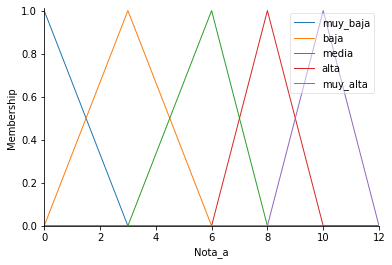

In [453]:
nota_a = ctrl.Consequent(np.arange(0, 13, 1), 'Nota_a')
nota_a['muy_baja'] = fuzz.trimf(nota_a.universe, [0, 0, 3])
nota_a['baja'] = fuzz.trimf(nota_a.universe, [0, 3, 6])
nota_a['media'] = fuzz.trimf(nota_a.universe, [3, 6, 8])
nota_a['alta'] = fuzz.trimf(nota_a.universe, [6, 8, 10])
nota_a['muy_alta'] = fuzz.trimf(nota_a.universe, [8, 10, 12])
nota_a.view()

In [538]:
nota_b = ctrl.Consequent(np.arange(0, 13, 1), 'Nota_b')

nota_b['muy_baja'] = fuzz.trimf(nota_b.universe, [0, 0, 3])
nota_b['baja'] = fuzz.trimf(nota_b.universe, [0, 3, 6])
nota_b['media'] = fuzz.trimf(nota_b.universe, [3, 6, 8])
nota_b['alta'] = fuzz.trimf(nota_b.universe, [6, 8, 10])
nota_b['muy_alta'] = fuzz.trimf(nota_b.universe, [8, 10, 12])

In [605]:
nota_dl = ctrl.Consequent(np.arange(0, 13, 1), 'Nota_dl')

nota_dl['muy_baja'] = fuzz.trimf(nota_dl.universe, [0, 0, 3])
nota_dl['baja'] = fuzz.trimf(nota_dl.universe, [0, 3, 6])
nota_dl['media'] = fuzz.trimf(nota_dl.universe, [3, 6, 8])
nota_dl['alta'] = fuzz.trimf(nota_dl.universe, [6, 8, 10])
nota_dl['muy_alta'] = fuzz.trimf(nota_dl.universe, [8, 10, 12])

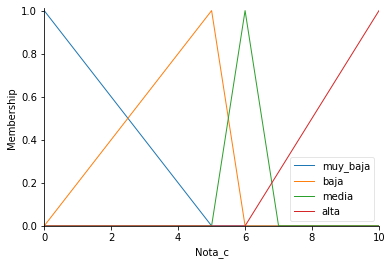

In [579]:
#sonda_n
nota_c = ctrl.Consequent(np.arange(0, 11, 1), 'Nota_c')
nota_c['muy_baja'] = fuzz.trimf(nota_c.universe, [0, 0, 5])
nota_c['baja'] = fuzz.trimf(nota_c.universe, [0, 5, 6])
nota_c['media'] = fuzz.trimf(nota_c.universe, [5, 6, 7])
nota_c['alta'] = fuzz.trimf(nota_c.universe, [6, 10, 10])
nota_c.view()

In [457]:
#sonda_n


In [458]:
nota_d = ctrl.Consequent(np.arange(0, 13, 1), 'Nota_d')

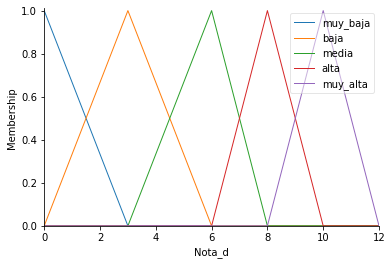

In [459]:
nota_d['muy_baja'] = fuzz.trimf(nota_d.universe, [0, 0, 3])
nota_d['baja'] = fuzz.trimf(nota_d.universe, [0, 3, 6])
nota_d['media'] = fuzz.trimf(nota_d.universe, [3, 6, 8])
nota_d['alta'] = fuzz.trimf(nota_d.universe, [6, 8, 10])
nota_d['muy_alta'] = fuzz.trimf(nota_d.universe, [8, 10, 12])
nota_d.view()

In [460]:
NOTA_DT = ctrl.Antecedent(np.arange(0, 13, 1), 'NOTA_DT')

In [461]:
NOTA_DT['muy_baja'] = fuzz.trimf(NOTA_DT.universe, [0, 0, 3])
NOTA_DT['baja'] = fuzz.trimf(NOTA_DT.universe, [0, 3, 6])
NOTA_DT['media'] = fuzz.trimf(NOTA_DT.universe, [3, 6, 8])
NOTA_DT['alta'] = fuzz.trimf(NOTA_DT.universe, [6, 8, 10])
NOTA_DT['muy_alta'] = fuzz.trimf(NOTA_DT.universe, [8, 10, 12])

In [462]:
nota_e = ctrl.Consequent(np.arange(0, 13, 1), 'Nota_e')

nota_e['muy_baja'] = fuzz.trimf(nota_e.universe, [0, 0, 3])
nota_e['baja'] = fuzz.trimf(nota_e.universe, [0, 3, 6])
nota_e['media'] = fuzz.trimf(nota_e.universe, [3, 6, 8])
nota_e['alta'] = fuzz.trimf(nota_e.universe, [6, 8, 10])
nota_e['muy_alta'] = fuzz.trimf(nota_e.universe, [8, 10, 12])

In [463]:
nota_f = ctrl.Consequent(np.arange(0, 13, 1), 'Nota_f')

nota_f['muy_baja'] = fuzz.trimf(nota_f.universe, [0, 0, 3])
nota_f['baja'] = fuzz.trimf(nota_f.universe, [0, 3, 6])
nota_f['media'] = fuzz.trimf(nota_f.universe, [3, 6, 8])
nota_f['alta'] = fuzz.trimf(nota_f.universe, [6, 8, 10])
nota_f['muy_alta'] = fuzz.trimf(nota_f.universe, [8, 10, 12])

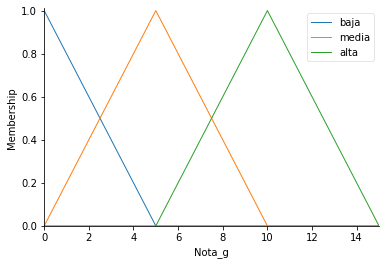

In [661]:
nota_g = ctrl.Consequent(np.arange(0, 16, 1), 'Nota_g')

nota_g['baja'] = fuzz.trimf(nota_g.universe, [0, 0, 5])
nota_g['media'] = fuzz.trimf(nota_g.universe, [0, 5, 10])
nota_g['alta'] = fuzz.trimf(nota_g.universe, [5, 10,15])
nota_g.view()

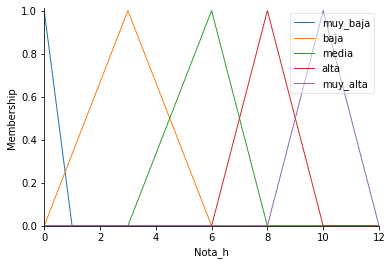

In [635]:
nota_h = ctrl.Consequent(np.arange(0, 13, 1), 'Nota_h')

nota_h['muy_baja'] = fuzz.trimf(nota_h.universe, [0, 0, 1])
nota_h['baja'] = fuzz.trimf(nota_h.universe, [0, 3, 6])
nota_h['media'] = fuzz.trimf(nota_h.universe, [3, 6, 8])
nota_h['alta'] = fuzz.trimf(nota_h.universe, [6, 8, 10])
nota_h['muy_alta'] = fuzz.trimf(nota_h.universe, [8, 10, 12])
nota_h.view()

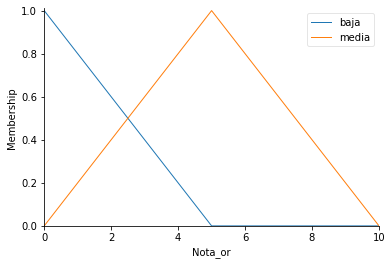

In [466]:
nota_or = ctrl.Consequent(np.arange(0, 11, 1), 'Nota_or')

nota_or['baja'] = fuzz.trimf(nota_or.universe, [0, 0, 5])
nota_or['media'] = fuzz.trimf(nota_or.universe, [0, 5, 10])
nota_or.view()

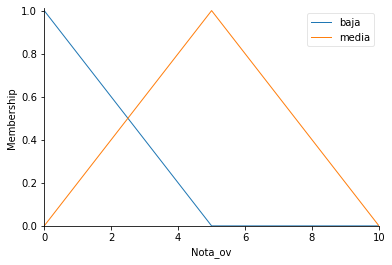

In [467]:
nota_ov = ctrl.Consequent(np.arange(0, 11, 1), 'Nota_ov')
nota_ov['baja'] = fuzz.trimf(nota_ov.universe, [0, 0, 5])
nota_ov['media'] = fuzz.trimf(nota_ov.universe, [0, 5, 10])

nota_ov.view()

In [468]:
xtrack_ar = ctrl.Antecedent(np.arange(0, 1000, 10), 'Separación Derrota en Aguas Restringidas')

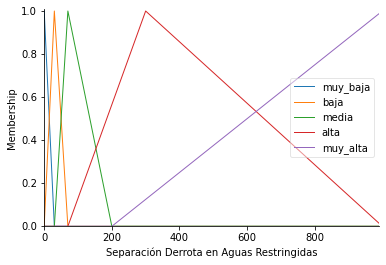

In [469]:
xtrack_ar['muy_baja'] = fuzz.trimf(xtrack_ar.universe, [0, 0, 30])
xtrack_ar['baja'] = fuzz.trimf(xtrack_ar.universe, [0, 30, 70])
xtrack_ar['media'] = fuzz.trimf(xtrack_ar.universe, [30, 70, 200])
xtrack_ar['alta'] = fuzz.trimf(xtrack_ar.universe, [70, 300, 1000])
xtrack_ar['muy_alta'] = fuzz.trimf(xtrack_ar.universe, [200, 1000, 1000])
xtrack_ar.view()

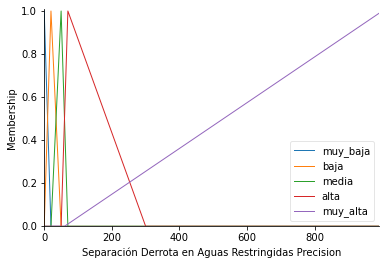

In [470]:
xtrack_ar_pr = ctrl.Antecedent(np.arange(0, 1000, 10), 'Separación Derrota en Aguas Restringidas Precision')
xtrack_ar_pr['muy_baja'] = fuzz.trimf(xtrack_ar.universe, [0, 0, 20])
xtrack_ar_pr['baja'] = fuzz.trimf(xtrack_ar.universe, [0, 20, 50])
xtrack_ar_pr['media'] = fuzz.trimf(xtrack_ar.universe, [20, 50, 70])
xtrack_ar_pr['alta'] = fuzz.trimf(xtrack_ar.universe, [50, 70, 300])
xtrack_ar_pr['muy_alta'] = fuzz.trimf(xtrack_ar.universe, [60, 1000, 1000])
xtrack_ar_pr.view()

In [471]:
xtrack_ar_contacto = ctrl.Antecedent(np.arange(0, 1000, 10), 'Separación Derrota en Aguas Restringidas y CPA cerrado')

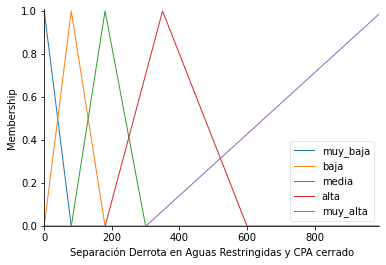

In [681]:
xtrack_ar_contacto['muy_baja'] = fuzz.trimf(xtrack_ar_contacto.universe, [0, 0, 80])
xtrack_ar_contacto['baja'] = fuzz.trimf(xtrack_ar_contacto.universe, [0, 80, 180])
xtrack_ar_contacto['media'] = fuzz.trimf(xtrack_ar_contacto.universe, [80, 180, 300])
xtrack_ar_contacto['alta'] = fuzz.trimf(xtrack_ar_contacto.universe, [180, 350, 600])
xtrack_ar_contacto['muy_alta'] = fuzz.trimf(xtrack_ar_contacto.universe, [300, 1000, 1000])
xtrack_ar_contacto.view()


In [473]:
xtrack_al = ctrl.Antecedent(np.arange(0, 4000, 10), 'Separación Derrota en Aguas Libres')

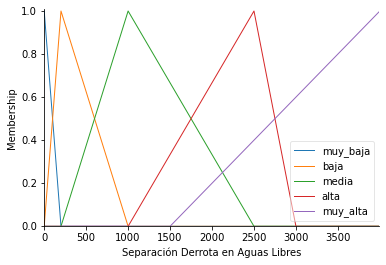

In [474]:
xtrack_al['muy_baja'] = fuzz.trimf(xtrack_al.universe, [0, 0, 200])
xtrack_al['baja'] = fuzz.trimf(xtrack_al.universe, [0, 200, 1000])
xtrack_al['media'] = fuzz.trimf(xtrack_al.universe, [200, 1000, 2500])
xtrack_al['alta'] = fuzz.trimf(xtrack_al.universe, [1000, 2500, 3000])
xtrack_al['muy_alta'] = fuzz.trimf(xtrack_al.universe, [1500, 4000, 4000])
xtrack_al.view()


In [475]:
rumbo_al = ctrl.Antecedent(np.arange(0, 100, 1), 'Rumbos que no acercan a la derrota en Aguas Libres')

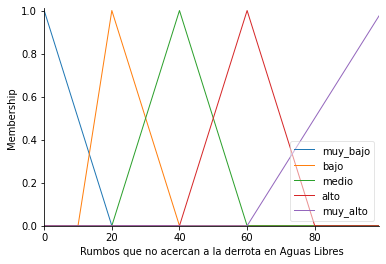

In [476]:
rumbo_al['muy_bajo'] = fuzz.trimf(rumbo_al.universe, [0, 0, 20])
rumbo_al['bajo'] = fuzz.trimf(rumbo_al.universe, [10, 20, 40])
rumbo_al['medio'] = fuzz.trimf(rumbo_al.universe, [20, 40, 60])
rumbo_al['alto'] = fuzz.trimf(rumbo_al.universe, [40, 60, 80])
rumbo_al['muy_alto'] = fuzz.trimf(rumbo_al.universe, [60, 100,100])
rumbo_al.view()

In [477]:
rumbo_ar = ctrl.Antecedent(np.arange(0, 100, 1), 'Rumbos que no acercan a la derrota en Aguas Restringidas')

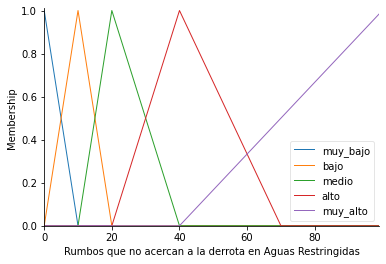

In [478]:
rumbo_ar['muy_bajo'] = fuzz.trimf(rumbo_ar.universe, [0, 0, 10])
rumbo_ar['bajo'] = fuzz.trimf(rumbo_ar.universe, [0, 10, 20])
rumbo_ar['medio'] = fuzz.trimf(rumbo_ar.universe, [10, 20, 40])
rumbo_ar['alto'] = fuzz.trimf(rumbo_ar.universe, [20, 40, 70])
rumbo_ar['muy_alto'] = fuzz.trimf(rumbo_ar.universe, [40, 100,100])
rumbo_ar.view()

In [479]:
rumbo_ar_contacto = ctrl.Antecedent(np.arange(0, 100, 1), 'Rumbos que no acercan a la derrota en Aguas Restringidas y CPA Cerrado')

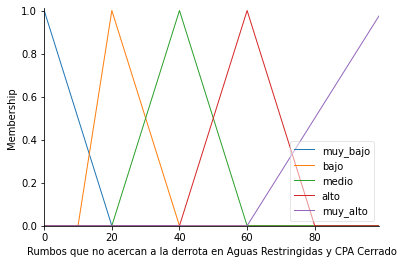

In [480]:
rumbo_ar_contacto['muy_bajo'] = fuzz.trimf(rumbo_ar_contacto.universe, [0, 0, 20])
rumbo_ar_contacto['bajo'] = fuzz.trimf(rumbo_ar_contacto.universe, [10, 20, 40])
rumbo_ar_contacto['medio'] = fuzz.trimf(rumbo_ar_contacto.universe, [20, 40, 60])
rumbo_ar_contacto['alto'] = fuzz.trimf(rumbo_ar_contacto.universe, [40, 60, 80])
rumbo_ar_contacto['muy_alto'] = fuzz.trimf(rumbo_ar_contacto.universe, [60, 100,100])
rumbo_ar_contacto.view()

In [481]:
cpa_ar = ctrl.Antecedent(np.arange(0, 1000, 10), 'CPA en Aguas Restringidas')

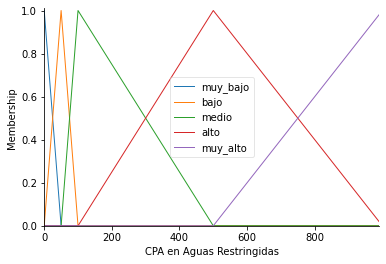

In [482]:
cpa_ar['muy_bajo'] = fuzz.trimf(cpa_ar.universe, [0, 0, 50])
cpa_ar['bajo'] = fuzz.trimf(cpa_ar.universe, [0, 50, 100])
cpa_ar['medio'] = fuzz.trimf(cpa_ar.universe, [50, 100, 500])
cpa_ar['alto'] = fuzz.trimf(cpa_ar.universe, [100, 500, 1000])
cpa_ar['muy_alto'] = fuzz.trimf(cpa_ar.universe, [500, 1000, 1000])
cpa_ar.view()

In [483]:
cpa_al = ctrl.Antecedent(np.arange(0, 10000, 100), 'CPA en Aguas Libres')

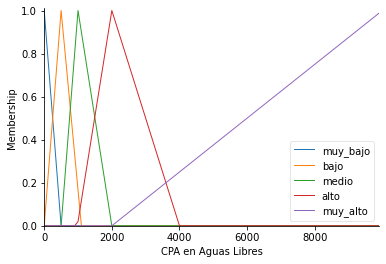

In [484]:
cpa_al['muy_bajo'] = fuzz.trimf(cpa_al.universe, [0, 0, 500])
cpa_al['bajo'] = fuzz.trimf(cpa_al.universe, [0, 500, 1100])
cpa_al['medio'] = fuzz.trimf(cpa_al.universe, [500, 1000, 2000])
cpa_al['alto'] = fuzz.trimf(cpa_al.universe, [980, 2000, 4000])
cpa_al['muy_alto'] = fuzz.trimf(cpa_al.universe, [2000, 10000,10000])
cpa_al.view()

In [485]:
pct_cpa_al = ctrl.Antecedent(np.arange(0, 100, 1), '% CPA menores a 1000 yardas en aguas libres')

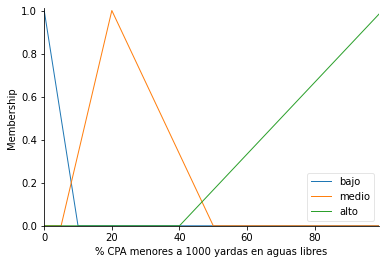

In [486]:
pct_cpa_al['bajo'] = fuzz.trimf(pct_cpa_al.universe, [0, 0, 10])
pct_cpa_al['medio'] = fuzz.trimf(pct_cpa_al.universe, [5, 20, 50])
pct_cpa_al['alto'] = fuzz.trimf(pct_cpa_al.universe, [40, 100, 100])
pct_cpa_al.view()

In [487]:
sondas_vs = ctrl.Antecedent(np.arange(0, 100, 1), '% Sondas menores al Veril de Seguridad')

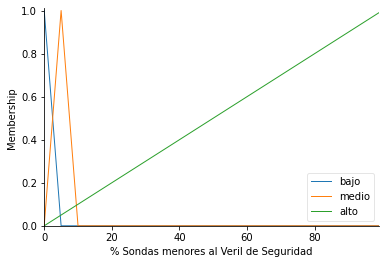

In [488]:
#sonda_n
sondas_vs['bajo'] = fuzz.trimf(sondas_vs.universe, [0, 0, 5])
sondas_vs['medio'] = fuzz.trimf(sondas_vs.universe, [0, 5, 10])
sondas_vs['alto'] = fuzz.trimf(sondas_vs.universe, [0,100,100])
sondas_vs.view()

In [489]:
sondas_vs_25 = ctrl.Antecedent(np.arange(0, 100, 1), '% Sondas menores al 1.25*Veril de Seguridad')

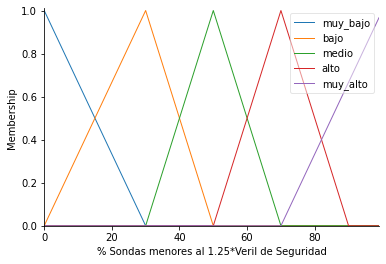

In [490]:
sondas_vs_25['muy_bajo'] = fuzz.trimf(sondas_vs_25.universe, [0, 0, 30])
sondas_vs_25['bajo'] = fuzz.trimf(sondas_vs_25.universe, [0, 30, 50])
sondas_vs_25['medio'] = fuzz.trimf(sondas_vs_25.universe, [30, 50, 70])
sondas_vs_25['alto'] = fuzz.trimf(sondas_vs_25.universe, [50, 70, 90])
sondas_vs_25['muy_alto'] = fuzz.trimf(sondas_vs_25.universe, [70, 100,100])
sondas_vs_25.view()

In [491]:
sondas_ps = ctrl.Antecedent(np.arange(0, 100, 1), '% Sondas menores a la Profundidad de Seguridad')

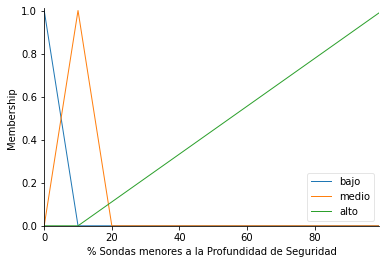

In [492]:
#sonda_n
sondas_ps['bajo'] = fuzz.trimf(sondas_ps.universe, [0, 0, 10])
sondas_ps['medio'] = fuzz.trimf(sondas_ps.universe, [0, 10, 20])
sondas_ps['alto'] = fuzz.trimf(sondas_ps.universe, [10, 100, 100])
sondas_ps.view()

In [493]:
outliers = ctrl.Antecedent(np.arange(0, 100, 1), '% Outliers DBSCAN respecto a la Derrota')

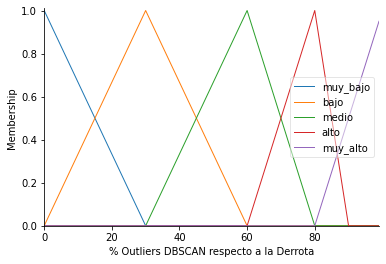

In [494]:
outliers['muy_bajo'] = fuzz.trimf(outliers.universe, [0, 0, 30])
outliers['bajo'] = fuzz.trimf(outliers.universe, [0, 30, 60])
outliers['medio'] = fuzz.trimf(outliers.universe, [30, 60, 80])
outliers['alto'] = fuzz.trimf(outliers.universe, [60, 80, 90])
outliers['muy_alto'] = fuzz.trimf(outliers.universe, [80, 100,100])
outliers.view()

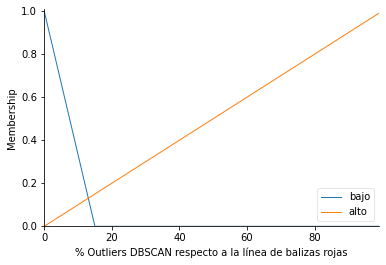

In [495]:
outliers_or = ctrl.Antecedent(np.arange(0, 100, 1), '% Outliers DBSCAN respecto a la línea de balizas rojas')

outliers_or['bajo'] = fuzz.trimf(outliers_or.universe, [0, 0, 15])
outliers_or['alto'] = fuzz.trimf(outliers_or.universe, [0, 100,100])
outliers_or.view()

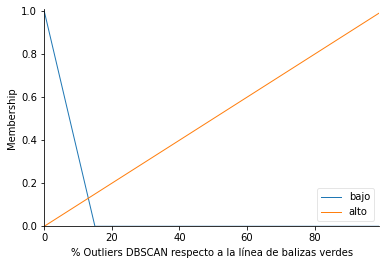

In [496]:
outliers_ov = ctrl.Antecedent(np.arange(0, 100, 1), '% Outliers DBSCAN respecto a la línea de balizas verdes')

outliers_ov['bajo'] = fuzz.trimf(outliers_ov.universe, [0, 0, 15])
outliers_ov['alto'] = fuzz.trimf(outliers_ov.universe, [0, 100,100])
outliers_ov.view()

In [497]:
D_baliza= ctrl.Antecedent(np.arange(0, 2000, 10), 'Distancia de paso a una Baliza')

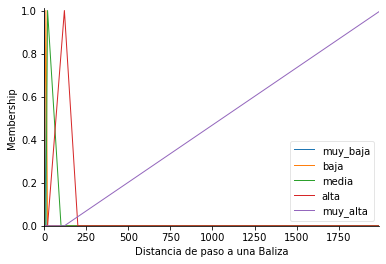

In [498]:
D_baliza['muy_baja'] = fuzz.trimf(D_baliza.universe, [0, 0, 10])
D_baliza['baja'] = fuzz.trimf(D_baliza.universe, [0, 10, 20])
D_baliza['media'] = fuzz.trimf(D_baliza.universe, [10, 20, 100])
D_baliza['alta'] = fuzz.trimf(D_baliza.universe, [20, 120, 200])
D_baliza['muy_alta'] = fuzz.trimf(D_baliza.universe, [120, 2000, 2000])
D_baliza.view()

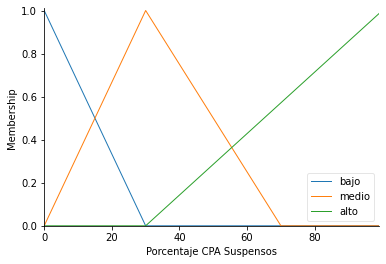

In [499]:
cpa_sus = ctrl.Antecedent(np.arange(0, 100, 1), 'Porcentaje CPA Suspensos')

cpa_sus['bajo'] = fuzz.trimf(cpa_sus.universe, [0, 0, 30])
cpa_sus['medio'] = fuzz.trimf(cpa_sus.universe, [0, 30, 70])
cpa_sus['alto'] = fuzz.trimf(cpa_sus.universe, [30, 100, 100])
cpa_sus.view()

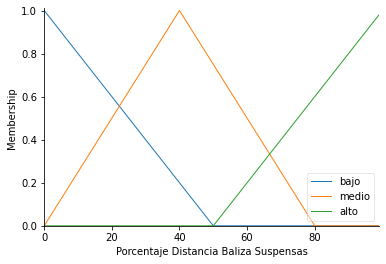

In [500]:
baliz_sus = ctrl.Antecedent(np.arange(0, 100, 1), 'Porcentaje Distancia Baliza Suspensas')

baliz_sus['bajo'] = fuzz.trimf(baliz_sus.universe, [0, 0, 50])
baliz_sus['medio'] = fuzz.trimf(baliz_sus.universe, [0, 40, 80])
baliz_sus['alto'] = fuzz.trimf(baliz_sus.universe, [50, 100, 100])
baliz_sus.view()

In [501]:
D2_wp_ar= ctrl.Antecedent(np.arange(0, 1000, 10), 'Distancia d2')

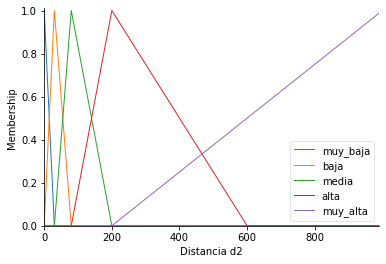

In [502]:
D2_wp_ar['muy_baja'] = fuzz.trimf(D2_wp_ar.universe, [0, 0, 30])
D2_wp_ar['baja'] = fuzz.trimf(D2_wp_ar.universe, [0, 30, 80])
D2_wp_ar['media'] = fuzz.trimf(D2_wp_ar.universe, [30, 80, 200])
D2_wp_ar['alta'] = fuzz.trimf(D2_wp_ar.universe, [80, 200, 600])
D2_wp_ar['muy_alta'] = fuzz.trimf(D2_wp_ar.universe, [200, 1000, 1000])
D2_wp_ar.view()

In [503]:
D1D_wp_ar= ctrl.Antecedent(np.arange(0, 1000, 10), 'Media d1 y d')

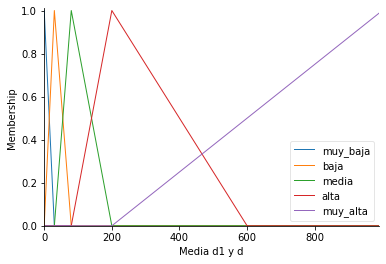

In [504]:
D1D_wp_ar['muy_baja'] = fuzz.trimf(D1D_wp_ar.universe, [0, 0, 30])
D1D_wp_ar['baja'] = fuzz.trimf(D1D_wp_ar.universe, [0, 30, 80])
D1D_wp_ar['media'] = fuzz.trimf(D1D_wp_ar.universe, [30, 80, 200])
D1D_wp_ar['alta'] = fuzz.trimf(D1D_wp_ar.universe, [80, 200, 600])
D1D_wp_ar['muy_alta'] = fuzz.trimf(D1D_wp_ar.universe, [200, 1000, 1000])
D1D_wp_ar.view()

In [505]:
D2_wp_al= ctrl.Antecedent(np.arange(0, 4000, 10), 'Distancia d2 Aguas Libres')

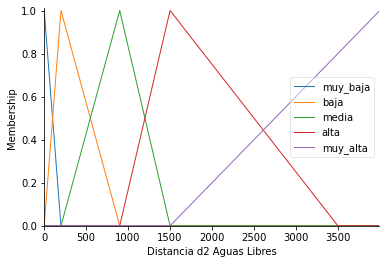

In [506]:
D2_wp_al['muy_baja'] = fuzz.trimf(D2_wp_al.universe, [0, 0, 200])
D2_wp_al['baja'] = fuzz.trimf(D2_wp_al.universe, [0, 200, 900])
D2_wp_al['media'] = fuzz.trimf(D2_wp_al.universe, [200, 900, 1500])
D2_wp_al['alta'] = fuzz.trimf(D2_wp_al.universe, [900, 1500, 3500])
D2_wp_al['muy_alta'] = fuzz.trimf(D2_wp_al.universe, [1500, 4000, 4000])
D2_wp_al.view()

In [507]:
D1D_wp_al= ctrl.Antecedent(np.arange(0, 4000, 10), 'Media d1 y d Aguas Libres')

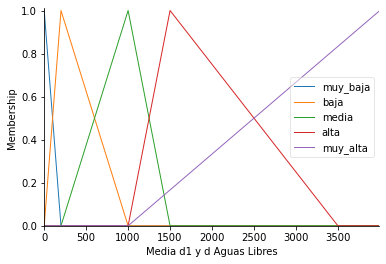

In [508]:
D1D_wp_al['muy_baja'] = fuzz.trimf(D1D_wp_al.universe, [0, 0, 200])
D1D_wp_al['baja'] = fuzz.trimf(D1D_wp_al.universe, [0, 200, 1000])
D1D_wp_al['media'] = fuzz.trimf(D1D_wp_al.universe, [200, 1000, 1500])
D1D_wp_al['alta'] = fuzz.trimf(D1D_wp_al.universe, [1000, 1500, 3500])
D1D_wp_al['muy_alta'] = fuzz.trimf(D1D_wp_al.universe, [1000, 4000, 4000])
D1D_wp_al.view()


In [509]:
NOTA_A = np.arange(0, 11, 1)
NOTA_B = np.arange(0, 11, 1)

nota_a_baja = fuzz.trimf(NOTA_A, [0, 0, 3.5])
nota_a_media = fuzz.trimf(NOTA_A, [3, 5, 10])
nota_a_alta = fuzz.trimf(NOTA_A, [5, 10, 10])

nota_b_baja = fuzz.trimf(NOTA_B, [0, 0, 3.5])
nota_b_media = fuzz.trimf(NOTA_B, [3, 5, 10])
nota_b_alta = fuzz.trimf(NOTA_B, [5, 10, 10])

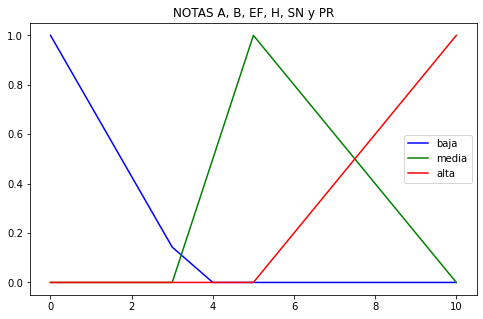

In [510]:
fig, ax = plt.subplots(figsize=(8,5))
ax.plot(NOTA_A, nota_a_baja, 'b', label = 'baja')
ax.plot(NOTA_A, nota_b_media, 'g', label = 'media')
ax.plot(NOTA_A, nota_b_alta, 'r', label = 'alta')
ax.set_title('NOTAS A, B, EF, H, SN y PR')
ax.legend();

In [511]:
NOTA_EF = np.arange(0, 11, 1)
NOTA_H = np.arange(0, 11, 1)

nota_ef_baja = fuzz.trimf(NOTA_EF, [0, 0, 3.5])
nota_ef_media = fuzz.trimf(NOTA_EF, [3, 5, 10])
nota_ef_alta = fuzz.trimf(NOTA_EF, [5, 10, 10])

nota_h_baja = fuzz.trimf(NOTA_H, [0, 0, 3.5])
nota_h_media = fuzz.trimf(NOTA_H, [3, 5, 10])
nota_h_alta = fuzz.trimf(NOTA_H, [5, 10, 10])

In [512]:
NOTA_SN = np.arange(0, 11, 1)
NOTA_PR = np.arange(0, 11, 1)

nota_sn_baja = fuzz.trimf(NOTA_SN, [0, 0, 3.5])
nota_sn_media = fuzz.trimf(NOTA_SN, [3, 5, 10])
nota_sn_alta = fuzz.trimf(NOTA_SN, [5, 10, 10])

nota_pr_baja = fuzz.trimf(NOTA_PR, [0, 0,3.5])
nota_pr_media = fuzz.trimf(NOTA_PR, [3, 5, 10])
nota_pr_alta = fuzz.trimf(NOTA_PR, [5, 10, 10])

In [513]:
# r e g l a s

In [514]:
#reglas Nota_a_ar.
# xtrack_datos_aguas_restringidos
# rumbos_aguas_restringidos

rule1a_ar = ctrl.Rule(xtrack_ar['muy_baja'], nota_a['muy_alta'])
rule2a_ar = ctrl.Rule(xtrack_ar['muy_baja'] & rumbo_ar['muy_alto'], nota_a['alta'])

rule3a_ar = ctrl.Rule(xtrack_ar['baja'], nota_a['alta'])
rule4a_ar = ctrl.Rule(xtrack_ar['baja'] & rumbo_ar['muy_alto'], nota_a['media'])

rule5a_ar = ctrl.Rule(xtrack_ar['media'], nota_a['media'])
rule6a_ar = ctrl.Rule(xtrack_ar['media']& rumbo_ar['muy_alto'], nota_a['baja'])

rule7a_ar = ctrl.Rule(xtrack_ar['alta'], nota_a['baja'])
rule8a_ar = ctrl.Rule(xtrack_ar['alta'] & rumbo_ar['muy_alto'], nota_a['muy_baja'])

rule9a_ar = ctrl.Rule(xtrack_ar['muy_alta'], nota_a['muy_baja'])

control_system_nota_a_ar = ctrl.ControlSystem([rule1a_ar, rule2a_ar, rule3a_ar,rule4a_ar,rule5a_ar,
                                               rule6a_ar, rule7a_ar, rule8a_ar, rule9a_ar])

fuzzy_system_nota_a_ar = ctrl.ControlSystemSimulation(control_system_nota_a_ar)

In [515]:
notas_test=[]
i=0
j=0
while i<=400:
    for j in range(0,110,10):
        fuzzy_system_nota_a_ar.input['Separación Derrota en Aguas Restringidas'] = i
        fuzzy_system_nota_a_ar.input['Rumbos que no acercan a la derrota en Aguas Restringidas'] = j
        fuzzy_system_nota_a_ar.compute()
        notas_test.append([i,j,fuzzy_system_nota_a_ar.output['Nota_a']])
    
        print(i,j,round(fuzzy_system_nota_a_ar.output['Nota_a'],2))
#         if j%100==0:
#             print("")
    i+=25

0 0 10.0
0 10 10.0
0 20 10.0
0 30 10.0
0 40 10.0
0 50 9.57
0 60 9.32
0 70 9.17
0 80 9.07
0 90 9.02
0 100 9.0
25 0 8.44
25 10 8.44
25 20 8.44
25 30 8.44
25 40 8.44
25 50 7.77
25 60 7.41
25 70 7.2
25 80 7.08
25 90 7.02
25 100 7.02
50 0 6.62
50 10 6.62
50 20 6.62
50 30 6.62
50 40 6.62
50 50 5.87
50 60 5.42
50 70 5.12
50 80 5.12
50 90 5.12
50 100 5.12
75 0 5.55
75 10 5.55
75 20 5.55
75 30 5.55
75 40 5.55
75 50 4.98
75 60 4.6
75 70 4.37
75 80 4.25
75 90 4.18
75 100 4.16
100 0 5.07
100 10 5.07
100 20 5.07
100 30 5.07
100 40 5.07
100 50 4.9
100 60 4.49
100 70 4.27
100 80 4.15
100 90 4.11
100 100 4.11
125 0 4.64
125 10 4.64
125 20 4.64
125 30 4.64
125 40 4.64
125 50 4.54
125 60 4.28
125 70 4.07
125 80 4.02
125 90 4.02
125 100 4.02
150 0 4.16
150 10 4.16
150 20 4.16
150 30 4.16
150 40 4.16
150 50 4.04
150 60 3.92
150 70 3.86
150 80 3.86
150 90 3.86
150 100 3.86
175 0 3.63
175 10 3.63
175 20 3.63
175 30 3.63
175 40 3.63
175 50 3.53
175 60 3.43
175 70 3.29
175 80 3.29
175 90 3.29
175 100 3.29
200

In [516]:
nota_a_ar_resultado=0.0
nota_a_ar_parciales=[]
print("**** NOTA A de los tramos de aguas restringidas sin contactos en las inmediaciones de la derrota: ****")
print("")
if len(xtrack_datos_tramos_restringidos)>0:
    for xtrack,rumbo in zip(xtrack_datos_tramos_restringidos,rumbo_datos_tramos_restringidos):
        print("Tramo con aguas restringidas número ",xtrack[0],", separación máxima: ",xtrack[1],", % de rumbos no acercan al eje: ",round(rumbo[1],2))
        fuzzy_system_nota_a_ar.input['Separación Derrota en Aguas Restringidas'] = xtrack[1]
        fuzzy_system_nota_a_ar.input['Rumbos que no acercan a la derrota en Aguas Restringidas'] = rumbo[1]
        fuzzy_system_nota_a_ar.compute()
        nota_a_ar_parciales.append(round(fuzzy_system_nota_a_ar.output['Nota_a'],2))
        print("NOTA A del tramo ",xtrack[0],": ",round(fuzzy_system_nota_a_ar.output['Nota_a'],2))
        print("")
print("Resumen de notas de cada tramo: ",nota_a_ar_parciales)  
nota_a_ar_resultado=round(np.mean(nota_a_ar_parciales),2)
print("")
print("NOTA A de los tramos con aguas restringidas, sin contactos en derrota: ",nota_a_ar_resultado)

**** NOTA A de los tramos de aguas restringidas sin contactos en las inmediaciones de la derrota: ****

Tramo con aguas restringidas número  T2 , separación máxima:  135.381 , % de rumbos no acercan al eje:  74.71
NOTA A del tramo  T2 :  3.96

Tramo con aguas restringidas número  T4 , separación máxima:  60.741 , % de rumbos no acercan al eje:  0.0
NOTA A del tramo  T4 :  6.19

Tramo con aguas restringidas número  T5 , separación máxima:  17.134 , % de rumbos no acercan al eje:  0.0
NOTA A del tramo  T5 :  8.89

Tramo con aguas restringidas número  T6 , separación máxima:  62.371 , % de rumbos no acercan al eje:  80.75
NOTA A del tramo  T6 :  4.62

Resumen de notas de cada tramo:  [3.96, 6.19, 8.89, 4.62]

NOTA A de los tramos con aguas restringidas, sin contactos en derrota:  5.92


In [517]:
#reglas Nota_a_ar_contacto.
# xtrack_datos_tramos_restringidos_contacto
# rumbos_tramos_restringidos_contacto

rule1a_ar_contacto = ctrl.Rule(xtrack_ar_contacto['muy_baja'], nota_a['muy_alta'])
rule2a_ar_contacto = ctrl.Rule(xtrack_ar_contacto['muy_baja'] & rumbo_ar_contacto['muy_alto'], nota_a['alta'])

rule3a_ar_contacto = ctrl.Rule(xtrack_ar_contacto['baja'], nota_a['alta'])
rule4a_ar_contacto = ctrl.Rule(xtrack_ar_contacto['baja'] & rumbo_ar_contacto['muy_alto'], nota_a['media'])

rule5a_ar_contacto = ctrl.Rule(xtrack_ar_contacto['media'], nota_a['media'])
rule6a_ar_contacto = ctrl.Rule(xtrack_ar_contacto['media']& rumbo_ar_contacto['muy_alto'], nota_a['baja'])

rule7a_ar_contacto = ctrl.Rule(xtrack_ar_contacto['alta'], nota_a['baja'])
rule8a_ar_contacto = ctrl.Rule(xtrack_ar_contacto['alta'] & rumbo_ar_contacto['muy_alto'], nota_a['muy_baja'])

rule9a_ar_contacto = ctrl.Rule(xtrack_ar_contacto['muy_alta'], nota_a['muy_baja'])
rule10a_ar_contacto = ctrl.Rule(xtrack_ar_contacto['muy_alta']& rumbo_ar_contacto['muy_bajo'], nota_a['baja'])

In [518]:
control_system_nota_a_ar_contacto = ctrl.ControlSystem([rule1a_ar_contacto, rule2a_ar_contacto, rule3a_ar_contacto,rule4a_ar_contacto,rule5a_ar_contacto,
                                            rule6a_ar_contacto, rule7a_ar_contacto,rule9a_ar_contacto,rule10a_ar_contacto])

In [519]:
fuzzy_system_nota_a_ar_contacto= ctrl.ControlSystemSimulation(control_system_nota_a_ar_contacto)

In [522]:
notas_test=[]
i=0
j=0
while i<=400:
    for j in range(0,110,10):
        fuzzy_system_nota_a_ar_contacto.input['Separación Derrota en Aguas Restringidas y CPA cerrado'] = i
        fuzzy_system_nota_a_ar_contacto.input['Rumbos que no acercan a la derrota en Aguas Restringidas y CPA Cerrado'] = j
        fuzzy_system_nota_a_ar_contacto.compute()
        notas_test.append([i,j,fuzzy_system_nota_a_ar_contacto.output['Nota_a']])
    
        print(i,j,round(fuzzy_system_nota_a_ar_contacto.output['Nota_a'],2))
#         if j%100==0:
#             print("")
    i+=50

0 0 10.0
0 10 10.0
0 20 10.0
0 30 10.0
0 40 10.0
0 50 10.0
0 60 10.0
0 70 9.43
0 80 9.17
0 90 9.04
0 100 9.0
50 0 8.81
50 10 8.81
50 20 8.81
50 30 8.81
50 40 8.81
50 50 8.81
50 60 8.81
50 70 7.89
50 80 7.5
50 90 7.39
50 100 7.39
100 0 7.23
100 10 7.23
100 20 7.23
100 30 7.23
100 40 7.23
100 50 7.23
100 60 7.23
100 70 6.14
100 80 6.0
100 90 5.98
100 100 5.98
150 0 6.31
150 10 6.31
150 20 6.31
150 30 6.31
150 40 6.31
150 50 6.31
150 60 6.31
150 70 5.39
150 80 4.93
150 90 4.74
150 100 4.74
200 0 5.13
200 10 5.13
200 20 5.13
200 30 5.13
200 40 5.13
200 50 5.13
200 60 5.13
200 70 4.75
200 80 4.36
200 90 4.19
200 100 4.17
250 0 4.11
250 10 4.11
250 20 4.11
250 30 4.11
250 40 4.11
250 50 4.11
250 60 4.11
250 70 4.11
250 80 4.1
250 90 4.1
250 100 4.1
300 0 3.0
300 10 3.0
300 20 3.0
300 30 3.0
300 40 3.0
300 50 3.0
300 60 3.0
300 70 3.0
300 80 3.0
300 90 3.0
300 100 3.0
350 0 2.97
350 10 2.97
350 20 2.97
350 30 2.97
350 40 2.97
350 50 2.97
350 60 2.97
350 70 2.97
350 80 2.97
350 90 2.97
350 100

In [523]:
nota_a_ar_contacto_resultado=0.0
nota_a_ar_contacto_parciales=[]
print("**** NOTA A de los tramos de aguas restringidas con contactos en las inmediaciones de la derrota: ****")
print("")
if len(xtrack_datos_tramos_restringidos_contacto)>0:
    for xtrack,rumbo in zip(xtrack_datos_tramos_restringidos_contacto,rumbo_datos_tramos_restringidos_contacto):
        print("Tramo con aguas restringidas número ",xtrack[0],", separación máxima: ",xtrack[1],", % de rumbos no acercan al eje: ",round(rumbo[1],2))
        fuzzy_system_nota_a_ar_contacto.input['Separación Derrota en Aguas Restringidas y CPA cerrado'] = xtrack[1]
        fuzzy_system_nota_a_ar_contacto.input['Rumbos que no acercan a la derrota en Aguas Restringidas y CPA Cerrado'] = rumbo[1]
        fuzzy_system_nota_a_ar_contacto.compute()
        nota_a_ar_contacto_parciales.append(round(fuzzy_system_nota_a_ar_contacto.output['Nota_a'],2))
        print("NOTA A del tramo ",xtrack[0],": ",round(fuzzy_system_nota_a_ar_contacto.output['Nota_a'],2))
        print("")
print("Resumen de notas de cada tramo: ",nota_a_ar_contacto_parciales)  
nota_a_ar_contacto_resultado=round(np.mean(nota_a_ar_contacto_parciales),2)
print("NOTA A de los tramos con aguas restringidas, con contactos en derrota: ",nota_a_ar_contacto_resultado)

**** NOTA A de los tramos de aguas restringidas con contactos en las inmediaciones de la derrota: ****

Tramo con aguas restringidas número  T3 , separación máxima:  225.05 , % de rumbos no acercan al eje:  53.9
NOTA A del tramo  T3 :  4.61

Tramo con aguas restringidas número  T7 , separación máxima:  92.699 , % de rumbos no acercan al eje:  54.52
NOTA A del tramo  T7 :  7.45

Resumen de notas de cada tramo:  [4.61, 7.45]
NOTA A de los tramos con aguas restringidas, con contactos en derrota:  6.03


In [524]:
#reglas Nota_a_al.
# xtrack_datos_tramos_libres
# rumbo_datos_tramos_libres

rule1a_al = ctrl.Rule(xtrack_al['muy_baja'], nota_a['muy_alta'])
rule2a_al = ctrl.Rule(xtrack_al['muy_baja'] & rumbo_al['muy_alto'], nota_a['alta'])

rule3a_al = ctrl.Rule(xtrack_al['baja'], nota_a['alta'])
rule4a_al = ctrl.Rule(xtrack_al['baja'] & rumbo_al['muy_alto'], nota_a['media'])

rule5a_al= ctrl.Rule(xtrack_al['media'], nota_a['media'])
rule6a_al = ctrl.Rule(xtrack_al['media']& rumbo_al['muy_alto'], nota_a['baja'])

rule7a_al= ctrl.Rule(xtrack_al['alta'], nota_a['baja'])
rule8a_al = ctrl.Rule(xtrack_al['alta'] & rumbo_al['muy_alto'], nota_a['muy_baja'])

rule9a_al = ctrl.Rule(xtrack_al['muy_alta'], nota_a['muy_baja'])

In [525]:
control_system_nota_a_al = ctrl.ControlSystem([rule1a_al, rule2a_al, rule3a_al,rule4a_al,rule5a_al,
                                            rule6a_al, rule7a_al, rule8a_al,rule9a_al])

In [526]:
fuzzy_system_nota_a_al = ctrl.ControlSystemSimulation(control_system_nota_a_al)

In [527]:
notas_test=[]
i=0
j=0
while i<=2000:
    for j in range(0,110,10):
        fuzzy_system_nota_a_al.input['Separación Derrota en Aguas Libres'] = i
        fuzzy_system_nota_a_al.input['Rumbos que no acercan a la derrota en Aguas Libres'] = j
        fuzzy_system_nota_a_al.compute()
        notas_test.append([i,j,fuzzy_system_nota_a_al.output['Nota_a']])
    
        print(i,j,round(fuzzy_system_nota_a_al.output['Nota_a'],2))
#         if j%100==0:
#             print("")
    i+=200

0 0 10.0
0 10 10.0
0 20 10.0
0 30 10.0
0 40 10.0
0 50 10.0
0 60 10.0
0 70 9.43
0 80 9.17
0 90 9.04
0 100 9.0
200 0 8.0
200 10 8.0
200 20 8.0
200 30 8.0
200 40 8.0
200 50 8.0
200 60 8.0
200 70 7.14
200 80 6.82
200 90 6.7
200 100 6.67
400 0 7.1
400 10 7.1
400 20 7.1
400 30 7.1
400 40 7.1
400 50 7.1
400 60 7.1
400 70 5.95
400 80 5.84
400 90 5.84
400 100 5.84
600 0 6.62
600 10 6.62
600 20 6.62
600 30 6.62
600 40 6.62
600 50 6.62
600 60 6.62
600 70 5.62
600 80 5.12
600 90 5.12
600 100 5.12
800 0 6.22
800 10 6.22
800 20 6.22
800 30 6.22
800 40 6.22
800 50 6.22
800 60 6.22
800 70 5.32
800 80 4.87
800 90 4.66
800 100 4.66
1000 0 5.67
1000 10 5.67
1000 20 5.67
1000 30 5.67
1000 40 5.67
1000 50 5.67
1000 60 5.67
1000 70 4.78
1000 80 4.39
1000 90 4.22
1000 100 4.17
1200 0 5.08
1200 10 5.08
1200 20 5.08
1200 30 5.08
1200 40 5.08
1200 50 5.08
1200 60 5.08
1200 70 4.7
1200 80 4.3
1200 90 4.15
1200 100 4.12
1400 0 4.68
1400 10 4.68
1400 20 4.68
1400 30 4.68
1400 40 4.68
1400 50 4.68
1400 60 4.68
1400

In [543]:
nota_a_al_resultado=0.0
nota_a_al_parciales=[]

print("**** NOTA A de los tramos de aguas libres: ****")
print("")

if len(xtrack_datos_tramos_libres)>0:
    for xtrack,rumbo in zip(xtrack_datos_tramos_libres,rumbo_datos_tramos_libres):
        print("Tramo con aguas libres número ",xtrack[0],", separación máxima: ",xtrack[1],", % de rumbos no acercan al eje: ",round(rumbo[1],2))
        fuzzy_system_nota_a_al.input['Separación Derrota en Aguas Libres'] = xtrack[1]
        fuzzy_system_nota_a_al.input['Rumbos que no acercan a la derrota en Aguas Libres'] = rumbo[1]
        fuzzy_system_nota_a_al.compute()
        nota_a_al_parciales.append(round(fuzzy_system_nota_a_al.output['Nota_a'],2))
        print("NOTA A del tramo ",xtrack[0],": ",round(fuzzy_system_nota_a_al.output['Nota_a'],2))
        print("")
print("Resumen de notas de cada tramo: ",nota_a_al_parciales)  
nota_a_al_resultado=round(np.mean(nota_a_al_parciales),2)
print("NOTA A de los tramos con aguas libres: ",nota_a_al_resultado)

**** NOTA A de los tramos de aguas libres: ****

Tramo con aguas libres número  T1 , separación máxima:  100.226 , % de rumbos no acercan al eje:  97.09
NOTA A del tramo  T1 :  7.62

Resumen de notas de cada tramo:  [7.62]
NOTA A de los tramos con aguas libres:  7.62


In [544]:
#NOTA A
nota_a_resultados=[nota_a_ar_resultado,nota_a_ar_contacto_resultado,nota_a_al_resultado]
nota_a_resultados = [x for x in nota_a_resultados if np.isnan(x) == False]
nota_a_resultado=round(np.mean([nota_a_resultados]),2)

nota_a_resultados_ponderada=[nota_a_ar_resultado,nota_a_ar_resultado,nota_a_ar_contacto_resultado,nota_a_ar_contacto_resultado,nota_a_al_resultado]
nota_a_resultados_ponderada = [x for x in nota_a_resultados_ponderada if np.isnan(x) == False]
nota_a_resultado_ponderada=round(np.mean(nota_a_resultados_ponderada),2)

print("**** Cálculo final de la NOTA A: ****")
print("")

print(" Resumen de notas de los tres tipos de tramos evaluados: ",nota_a_resultados)
print("")

print("************")
print("Nota A: ",nota_a_resultado_ponderada)
print("************")

**** Cálculo final de la NOTA A: ****

 Resumen de notas de los tres tipos de tramos evaluados:  [5.92, 6.03, 7.62]

************
Nota A:  6.3
************


In [545]:
#dif_v_tramos
#aguas_restringidas
################d_wp_tramos
rule1b_wp_ar = ctrl.Rule(D2_wp_ar['muy_baja'], nota_b['muy_alta'])
rule2b_wp_ar = ctrl.Rule(D2_wp_ar['muy_baja'] & D1D_wp_ar['muy_alta'], nota_b['media'])

rule3b_wp_ar = ctrl.Rule(D2_wp_ar['baja'], nota_b['alta'])
rule4b_wp_ar = ctrl.Rule(D2_wp_ar['baja'] & D1D_wp_ar['muy_alta'], nota_b['baja'])

rule5b_wp_ar = ctrl.Rule(D2_wp_ar['media'], nota_b['media'])
rule6b_wp_ar = ctrl.Rule(D2_wp_ar['media'] & D1D_wp_ar['muy_alta'], nota_b['baja'])

rule7b_wp_ar = ctrl.Rule(D2_wp_ar['alta'], nota_b['baja'])
rule8b_wp_ar = ctrl.Rule(D2_wp_ar['alta'] & D1D_wp_ar['muy_alta'], nota_b['muy_baja'])

rule9b_wp_ar = ctrl.Rule(D2_wp_ar['muy_alta'], nota_b['muy_baja'])

control_system_nota_b_wp_ar = ctrl.ControlSystem([rule1b_wp_ar, rule2b_wp_ar, rule3b_wp_ar,rule4b_wp_ar,rule5b_wp_ar,
                                            rule6b_wp_ar, rule7b_wp_ar, rule8b_wp_ar,rule9b_wp_ar])

fuzzy_system_nota_b_wp_ar = ctrl.ControlSystemSimulation(control_system_nota_b_wp_ar)

In [546]:
notas_test=[]
i=0
j=0
while i<=400:
    for j in range(0,550,50):
        fuzzy_system_nota_b_wp_ar.input['Distancia d2'] = i
        fuzzy_system_nota_b_wp_ar.input['Media d1 y d'] = j
        fuzzy_system_nota_b_wp_ar.compute()
        notas_test.append([i,j,fuzzy_system_nota_b_wp_ar.output['Nota_b']])
        
#         if j%50==0:
#             print("")
        print(i,j,round(fuzzy_system_nota_b_wp_ar.output['Nota_b'],2))

        
    i+=25

0 0 10.0
0 50 10.0
0 100 10.0
0 150 10.0
0 200 10.0
0 250 9.41
0 300 8.99
0 350 8.67
0 400 8.43
0 450 8.24
0 500 8.09
25 0 8.44
25 50 8.44
25 100 8.44
25 150 8.44
25 200 8.44
25 250 7.69
25 300 7.15
25 350 6.76
25 400 6.47
25 450 6.23
25 500 6.05
50 0 6.79
50 50 6.79
50 100 6.79
50 150 6.79
50 200 6.79
50 250 6.44
50 300 6.16
50 350 5.93
50 400 5.75
50 450 5.59
50 500 5.45
75 0 5.93
75 50 5.93
75 100 5.93
75 150 5.93
75 200 5.93
75 250 5.63
75 300 5.39
75 350 5.2
75 400 5.04
75 450 4.91
75 500 4.8
100 0 4.97
100 50 4.97
100 100 4.97
100 150 4.97
100 200 4.97
100 250 4.95
100 300 4.92
100 350 4.84
100 400 4.67
100 450 4.53
100 500 4.42
125 0 4.41
125 50 4.41
125 100 4.41
125 150 4.41
125 200 4.41
125 250 4.37
125 300 4.33
125 350 4.29
125 400 4.26
125 450 4.22
125 500 4.16
150 0 3.94
150 50 3.94
150 100 3.94
150 150 3.94
150 200 3.94
150 250 3.91
150 300 3.88
150 350 3.85
150 400 3.81
150 450 3.78
150 500 3.73
175 0 3.52
175 50 3.52
175 100 3.52
175 150 3.52
175 200 3.52
175 250 3.49
17

In [547]:
#b_al
################d_wp_tramos
rule1b_wp_al = ctrl.Rule(D2_wp_al['muy_baja'], nota_b['muy_alta'])
rule2b_wp_al = ctrl.Rule(D2_wp_al['muy_baja'] & D1D_wp_al['muy_alta'], nota_b['media'])

rule3b_wp_al = ctrl.Rule(D2_wp_al['baja'], nota_b['alta'])
rule4b_wp_al = ctrl.Rule(D2_wp_al['baja'] & D1D_wp_al['muy_alta'], nota_b['baja'])

rule5b_wp_al = ctrl.Rule(D2_wp_al['media'], nota_b['media'])
rule6b_wp_al = ctrl.Rule(D2_wp_al['media'] & D1D_wp_al['muy_alta'], nota_b['baja'])

rule7b_wp_al = ctrl.Rule(D2_wp_al['alta'], nota_b['baja'])
rule8b_wp_al = ctrl.Rule(D2_wp_al['alta'] & D1D_wp_al['muy_alta'], nota_b['muy_baja'])

rule9b_wp_al = ctrl.Rule(D2_wp_al['muy_alta'], nota_b['muy_baja'])

control_system_nota_b_wp_al = ctrl.ControlSystem([rule1b_wp_al, rule2b_wp_al, rule3b_wp_al,rule4b_wp_al,rule5b_wp_al,
                                            rule6b_wp_al, rule7b_wp_al, rule8b_wp_al,rule9b_wp_al])

fuzzy_system_nota_b_wp_al = ctrl.ControlSystemSimulation(control_system_nota_b_wp_al)


In [548]:
notas_test=[]
i=0
j=0
while i<=2000:
    for j in range(0,2200,200):
        fuzzy_system_nota_b_wp_al.input['Distancia d2 Aguas Libres'] = i
        fuzzy_system_nota_b_wp_al.input['Media d1 y d Aguas Libres'] = j
        fuzzy_system_nota_b_wp_al.compute()
        notas_test.append([i,j,fuzzy_system_nota_b_wp_al.output['Nota_b']])
        
        print(i,j,round(fuzzy_system_nota_b_wp_al.output['Nota_b'],2))
    i+=200

0 0 10.0
0 200 10.0
0 400 10.0
0 600 10.0
0 800 10.0
0 1000 10.0
0 1200 9.38
0 1400 8.94
0 1600 8.62
0 1800 8.38
0 2000 8.19
200 0 8.0
200 200 8.0
200 400 8.0
200 600 8.0
200 800 8.0
200 1000 8.0
200 1200 7.19
200 1400 6.64
200 1600 6.25
200 1800 5.95
200 2000 5.73
400 0 7.02
400 200 7.02
400 400 7.02
400 600 7.02
400 800 7.02
400 1000 7.02
400 1200 6.62
400 1400 6.31
400 1600 6.05
400 1800 5.85
400 2000 5.65
600 0 6.5
600 200 6.5
600 400 6.5
600 600 6.5
600 800 6.5
600 1000 6.5
600 1200 6.17
600 1400 5.9
600 1600 5.68
600 1800 5.5
600 2000 5.36
800 0 6.02
800 200 6.02
800 400 6.02
800 600 6.02
800 800 6.02
800 1000 6.02
800 1200 5.71
800 1400 5.46
800 1600 5.25
800 1800 5.09
800 2000 4.96
1000 0 4.97
1000 200 4.97
1000 400 4.97
1000 600 4.97
1000 800 4.97
1000 1000 4.97
1000 1200 4.94
1000 1400 4.92
1000 1600 4.8
1000 1800 4.63
1000 2000 4.49
1200 0 4.12
1200 200 4.12
1200 400 4.12
1200 600 4.12
1200 800 4.12
1200 1000 4.12
1200 1200 4.08
1200 1400 4.04
1200 1600 4.01
1200 1800 3.97
1

In [549]:
#b_al_Ar
################d_wp_tramos
rule1b_wp_al_ar = ctrl.Rule(D2_wp_ar['muy_baja'], nota_b['muy_alta'])
rule2b_wp_al_ar = ctrl.Rule(D2_wp_ar['muy_baja'] & D1D_wp_al['muy_alta'], nota_b['media'])

rule3b_wp_al_ar = ctrl.Rule(D2_wp_ar['baja'], nota_b['alta'])
rule4b_wp_al_ar = ctrl.Rule(D2_wp_ar['baja'] & D1D_wp_al['muy_alta'], nota_b['baja'])

rule5b_wp_al_ar = ctrl.Rule(D2_wp_ar['media'], nota_b['media'])
rule6b_wp_al_ar = ctrl.Rule(D2_wp_ar['media'] & D1D_wp_al['muy_alta'], nota_b['baja'])

rule7b_wp_al_ar = ctrl.Rule(D2_wp_ar['alta'], nota_b['baja'])
rule8b_wp_al_ar = ctrl.Rule(D2_wp_ar['alta'] & D1D_wp_al['muy_alta'], nota_b['muy_baja'])

rule9b_wp_al_ar = ctrl.Rule(D2_wp_ar['muy_alta'], nota_b['muy_baja'])

control_system_nota_b_wp_al_ar = ctrl.ControlSystem([rule1b_wp_al_ar, rule2b_wp_al_ar, rule3b_wp_al_ar,rule4b_wp_al_ar,rule5b_wp_al_ar,
                                            rule6b_wp_al_ar, rule7b_wp_al_ar, rule8b_wp_al_ar,rule9b_wp_al_ar])

fuzzy_system_nota_b_wp_al_ar = ctrl.ControlSystemSimulation(control_system_nota_b_wp_al_ar)

In [550]:
notas_test=[]
i=0
j=0
while i<=2000:
    for j in range(0,2200,200):
        fuzzy_system_nota_b_wp_al_ar.input['Distancia d2'] = i
        fuzzy_system_nota_b_wp_al_ar.input['Media d1 y d Aguas Libres'] = j
        fuzzy_system_nota_b_wp_al_ar.compute()
        notas_test.append([i,j,fuzzy_system_nota_b_wp_al_ar.output['Nota_b']])
        
        print(i,j,round(fuzzy_system_nota_b_wp_al_ar.output['Nota_b'],2))
    i+=200

0 0 10.0
0 200 10.0
0 400 10.0
0 600 10.0
0 800 10.0
0 1000 10.0
0 1200 9.38
0 1400 8.94
0 1600 8.62
0 1800 8.38
0 2000 8.19
200 0 3.0
200 200 3.0
200 400 3.0
200 600 3.0
200 800 3.0
200 1000 3.0
200 1200 2.97
200 1400 2.94
200 1600 2.91
200 1800 2.89
200 2000 2.86
400 0 2.86
400 200 2.86
400 400 2.86
400 600 2.86
400 800 2.86
400 1000 2.86
400 1200 2.86
400 1400 2.86
400 1600 2.86
400 1800 2.85
400 2000 2.82
600 0 1.17
600 200 1.17
600 400 1.17
600 600 1.17
600 800 1.17
600 1000 1.17
600 1200 1.17
600 1400 1.17
600 1600 1.17
600 1800 1.17
600 2000 1.17
800 0 1.05
800 200 1.05
800 400 1.05
800 600 1.05
800 800 1.05
800 1000 1.05
800 1200 1.05
800 1400 1.05
800 1600 1.05
800 1800 1.05
800 2000 1.05
1000 0 1.0
1000 200 1.0
1000 400 1.0
1000 600 1.0
1000 800 1.0
1000 1000 1.0
1000 1200 1.0
1000 1400 1.0
1000 1600 1.0
1000 1800 1.0
1000 2000 1.0
1200 0 1.0
1200 200 1.0
1200 400 1.0
1200 600 1.0
1200 800 1.0
1200 1000 1.0
1200 1200 1.0
1200 1400 1.0
1200 1600 1.0
1200 1800 1.0
1200 2000 1.0

In [555]:
#b_ar_al
################d_wp_tramos
rule1b_wp_ar_al = ctrl.Rule(D2_wp_al['muy_baja'], nota_b['muy_alta'])
rule2b_wp_ar_al = ctrl.Rule(D2_wp_al['muy_baja'] & D1D_wp_ar['muy_alta'], nota_b['media'])

rule3b_wp_ar_al = ctrl.Rule(D2_wp_al['baja'], nota_b['alta'])
rule4b_wp_ar_al = ctrl.Rule(D2_wp_al['baja'] & D1D_wp_ar['muy_alta'], nota_b['baja'])

rule5b_wp_ar_al = ctrl.Rule(D2_wp_al['media'], nota_b['media'])
rule6b_wp_ar_al = ctrl.Rule(D2_wp_al['baja'] & D1D_wp_ar['muy_alta'], nota_b['baja'])

rule6b_wp_ar_al  = ctrl.Rule(D2_wp_al['alta'], nota_b['baja'])
rule7b_wp_ar_al = ctrl.Rule(D2_wp_al['alta'] & D1D_wp_ar['muy_alta'], nota_b['muy_baja'])

rule8b_wp_ar_al = ctrl.Rule(D2_wp_al['muy_alta'], nota_b['muy_baja'])
rule9b_wp_ar_al = ctrl.Rule(D2_wp_al['muy_alta'] & D1D_wp_ar['muy_alta'], nota_b['muy_baja'])

control_system_nota_b_wp_ar_al = ctrl.ControlSystem([rule1b_wp_ar_al, rule2b_wp_ar_al, rule3b_wp_ar_al,rule4b_wp_ar_al,rule5b_wp_ar_al,
                                            rule6b_wp_ar_al, rule7b_wp_ar_al, rule8b_wp_ar_al,rule9b_wp_ar_al])

fuzzy_system_nota_b_wp_ar_al = ctrl.ControlSystemSimulation(control_system_nota_b_wp_ar_al)

In [556]:
notas_test=[]
i=0
j=0
while i<=2000:
    for j in range(0,450,50):
        fuzzy_system_nota_b_wp_ar_al.input['Distancia d2 Aguas Libres'] = i
        fuzzy_system_nota_b_wp_ar_al.input['Media d1 y d'] = j
        fuzzy_system_nota_b_wp_ar_al.compute()
        notas_test.append([i,j,fuzzy_system_nota_b_wp_ar_al.output['Nota_b']])
        
        print(i,j,round(fuzzy_system_nota_b_wp_ar_al.output['Nota_b'],2))
    i+=200

0 0 10.0
0 50 10.0
0 100 10.0
0 150 10.0
0 200 10.0
0 250 9.41
0 300 8.99
0 350 8.67
0 400 8.43
200 0 8.0
200 50 8.0
200 100 8.0
200 150 8.0
200 200 8.0
200 250 7.23
200 300 6.7
200 350 6.31
200 400 6.02
400 0 7.02
400 50 7.02
400 100 7.02
400 150 7.02
400 200 7.02
400 250 6.65
400 300 6.34
400 350 6.1
400 400 5.9
600 0 6.5
600 50 6.5
600 100 6.5
600 150 6.5
600 200 6.5
600 250 6.19
600 300 5.93
600 350 5.72
600 400 5.54
800 0 6.02
800 50 6.02
800 100 6.02
800 150 6.02
800 200 6.02
800 250 5.72
800 300 5.48
800 350 5.42
800 400 5.42
1000 0 4.97
1000 50 4.97
1000 100 4.97
1000 150 4.97
1000 200 4.97
1000 250 4.95
1000 300 4.92
1000 350 4.9
1000 400 4.9
1200 0 4.12
1200 50 4.12
1200 100 4.12
1200 150 4.12
1200 200 4.12
1200 250 4.08
1200 300 4.05
1200 350 4.02
1200 400 3.98
1400 0 3.43
1400 50 3.43
1400 100 3.43
1400 150 3.43
1400 200 3.43
1400 250 3.4
1400 300 3.37
1400 350 3.34
1400 400 3.32
1600 0 2.98
1600 50 2.98
1600 100 2.98
1600 150 2.98
1600 200 2.98
1600 250 2.97
1600 300 2.95


In [557]:
nota_b_ar_resultado=0.0
nota_b_ar_parciales=[]

print("**** NOTA B de los tramos de aguas restringidas: ****")
print("")

if len(d_wp_tramos_restringidos)>0:
    for d_wp in d_wp_tramos_restringidos:
        print("Caída de rumbo entre dos tramos de aguas restringidas, empezando en el tramo: ",d_wp[0],
              "con una distancia final al eje de : ", round(d_wp[1][0],2)," y una distancia anterior a la caída de : ", round(d_wp[1][1],2))
        fuzzy_system_nota_b_wp_ar.input['Distancia d2'] = d_wp[1][0]
        fuzzy_system_nota_b_wp_ar.input['Media d1 y d'] =d_wp[1][1]
        fuzzy_system_nota_b_wp_ar.compute()


        nota_b_ar_parciales.append(round(fuzzy_system_nota_b_wp_ar.output['Nota_b'],2))
        print("NOTA B del caída en el tramo ",d_wp[0],": ",round(fuzzy_system_nota_b_wp_ar.output['Nota_b'],2))
        print("")
print("Resumen de las notas parciales :",nota_b_ar_parciales)  
nota_b_ar_resultado=round(np.mean(nota_b_ar_parciales),2)
print("NOTA B de los tramos con aguas restringidas: ",nota_b_ar_resultado)

**** NOTA B de los tramos de aguas restringidas: ****

Caída de rumbo entre dos tramos de aguas restringidas, empezando en el tramo:  T2 con una distancia final al eje de :  111.69  y una distancia anterior a la caída de :  140.13
NOTA B del caída en el tramo  T2 :  4.69

Caída de rumbo entre dos tramos de aguas restringidas, empezando en el tramo:  T3 con una distancia final al eje de :  22.04  y una distancia anterior a la caída de :  42.63
NOTA B del caída en el tramo  T3 :  8.63

Caída de rumbo entre dos tramos de aguas restringidas, empezando en el tramo:  T4 con una distancia final al eje de :  16.52  y una distancia anterior a la caída de :  9.65
NOTA B del caída en el tramo  T4 :  8.92

Caída de rumbo entre dos tramos de aguas restringidas, empezando en el tramo:  T5 con una distancia final al eje de :  55.29  y una distancia anterior a la caída de :  17.84
NOTA B del caída en el tramo  T5 :  6.61

Caída de rumbo entre dos tramos de aguas restringidas, empezando en el tramo:  T

In [558]:
nota_b_al_resultado=0.0
nota_b_al_parciales=[]

print("**** NOTA B de los tramos de aguas libres: ****")
print("")

if len(d_wp_tramos_libres)>0:
    for d_wp in d_wp_tramos_libres:
    
        print("Caída de rumbo entre dos tramos de aguas libres, empezando en el tramo: ",d_wp[0],"con una distancia final al eje de : ",
              round(d_wp[1][0],2)," y una distancia anterior a la caída de : ",round(d_wp[1][1],2))
        fuzzy_system_nota_b_wp_al.input['Distancia d2 Aguas Libres'] = d_wp[1][0]
        fuzzy_system_nota_b_wp_al.input['Media d1 y d Aguas Libres'] =d_wp[1][1]
        fuzzy_system_nota_b_wp_al.compute()
        
        nota_b_al_parciales.append(round(fuzzy_system_nota_b_wp_al.output['Nota_b'],2))
        print("NOTA B del caída en el tramo ",d_wp[0],": ",round(fuzzy_system_nota_b_wp_al.output['Nota_b'],2))
        print("")
        
print(nota_b_al_parciales)  
nota_b_al_resultado=round(np.mean(nota_b_al_parciales),2)
print("NOTA B de los tramos con aguas libres: ",nota_b_al_resultado)

**** NOTA B de los tramos de aguas libres: ****

[]
NOTA B de los tramos con aguas libres:  nan


In [559]:
nota_b_al_ar_resultado=0.0
nota_b_al_ar_parciales=[]

print("**** NOTA B de los tramos de aguas libres a restringidas: ****")
print("")

if len(d_wp_tramos_libres_restringidos)>0:
    for d_wp in d_wp_tramos_libres_restringidos:
    
        print("Caída de rumbo de un tramo de tramos de aguas libres a otro de restringidas, empezando en el tramo: ",d_wp[0],
              "con una distancia final al eje de : ",round(d_wp[1][0],2)," y una distancia anterior a la caída de : ",round(d_wp[1][1],2))
        fuzzy_system_nota_b_wp_al_ar.input['Distancia d2'] = d_wp[1][0]
        fuzzy_system_nota_b_wp_al_ar.input['Media d1 y d Aguas Libres'] =d_wp[1][1]
        fuzzy_system_nota_b_wp_al_ar.compute()
        
        nota_b_al_ar_parciales.append(round(fuzzy_system_nota_b_wp_al_ar.output['Nota_b'],2))
        print("NOTA B del tramo ",d_wp[0],": ",round(fuzzy_system_nota_b_wp_al_ar.output['Nota_b'],2))
        print("")
        
print(nota_b_al_ar_parciales)  
nota_b_al_ar_resultado=round(np.mean(nota_b_al_ar_parciales),2)
print("NOTA B de los tramos de aguas libres a restringidas: ",nota_b_al_ar_resultado)

**** NOTA B de los tramos de aguas libres a restringidas: ****

Caída de rumbo de un tramo de tramos de aguas libres a otro de restringidas, empezando en el tramo:  T1 con una distancia final al eje de :  69.41  y una distancia anterior a la caída de :  84.15
NOTA B del tramo  T1 :  6.16

[6.16]
NOTA B de los tramos de aguas libres a restringidas:  6.16


In [560]:
nota_b_ar_al_resultado=0.0
nota_b_ar_al_parciales=[]

print("**** NOTA B de los tramos de aguas restringidas a libres: ****")
print("")

if len(d_wp_tramos_restringidos_libres)>0:
    for d_wp in d_wp_tramos_restringidos_libres:
    
        print("Caída de rumbo de un tramo de tramos de aguas restringidas a otro de libres, empezando en el tramo: ",d_wp[0],
              "con una distancia final al eje de : ",round(d_wp[1][0],2)," y una distancia anterior a la caída de : ",round(d_wp[1][1],2))
        fuzzy_system_nota_b_wp_ar_al.input['Distancia d2 Aguas Libres'] = d_wp[1][0]
        fuzzy_system_nota_b_wp_ar_al.input['Media d1 y d'] =d_wp[1][1]
        fuzzy_system_nota_b_wp_ar_al.compute()
        
        nota_b_ar_al_parciales.append(round(fuzzy_system_nota_b_wp_al_ar.output['Nota_b'],2))
        print("NOTA B del tramo ",d_wp[0],": ",round(fuzzy_system_nota_b_wp_al_ar.output['Nota_b'],2))
        print("")
        
print(nota_b_ar_al_parciales)  
nota_b_ar_al_resultado=round(np.mean(nota_b_ar_al_parciales),2)
print("NOTA B de los tramos de aguas restringidas a libres: ",nota_b_ar_al_resultado)

**** NOTA B de los tramos de aguas restringidas a libres: ****

[]
NOTA B de los tramos de aguas restringidas a libres:  nan


In [561]:
#NOTA B
nota_b_resultados=[nota_b_ar_resultado,nota_b_al_resultado,nota_b_al_ar_resultado,nota_b_ar_al_resultado]

nota_b_resultados = [x for x in nota_b_resultados if np.isnan(x) == False]
nota_b_resultado=round(np.mean(nota_b_resultados),2)


nota_b_resultados_ponderada = [nota_b_ar_resultado,nota_b_ar_resultado,
                               nota_b_al_ar_resultado,nota_b_al_ar_resultado,
                               nota_b_ar_al_resultado,nota_b_al_resultado]
nota_b_resultados_ponderada = [x for x in nota_b_resultados_ponderada if np.isnan(x) == False]
nota_b_resultado_ponderada=round(np.mean(nota_b_resultados_ponderada),2)

print("**** Cálculo final de la NOTA B: ****")
print("")

print(" Resumen de notas de los tipos de tramos evaluados: ",nota_b_resultados)
print("")

print("************")
print("Nota B: ",nota_b_resultado_ponderada)
print("************")

**** Cálculo final de la NOTA B: ****

 Resumen de notas de los tipos de tramos evaluados:  [6.81, 6.16]

************
Nota B:  6.48
************


In [562]:
# NOTA_AB

print("**** Cálculo de la NOTA AB: ****")
print("")

print('NOTA_A: ',nota_a_resultado_ponderada)
print('NOTA_B: ',nota_b_resultado_ponderada)
print("")
nota_ab_resultado=round((nota_a_resultado_ponderada*2+nota_b_resultado_ponderada)/3,2)
print("************")
print("NOTA_AB: ", nota_ab_resultado)
print("************")

**** Cálculo de la NOTA AB: ****

NOTA_A:  6.3
NOTA_B:  6.48

************
NOTA_AB:  6.36
************


In [563]:
nota_a_input=nota_a_resultado_ponderada
nota_b_input=nota_b_resultado_ponderada

nota_a_baja_1 = fuzz.interp_membership(NOTA_A, nota_a_baja, nota_a_input)
nota_a_media_1 = fuzz.interp_membership(NOTA_A, nota_a_media, nota_a_input)
nota_a_alta_1 = fuzz.interp_membership(NOTA_A, nota_a_alta, nota_a_input)

nota_b_baja_1 = fuzz.interp_membership(NOTA_B, nota_b_baja, nota_b_input)
nota_b_media_1 = fuzz.interp_membership(NOTA_B, nota_b_media, nota_b_input)
nota_b_alta_1 = fuzz.interp_membership(NOTA_B, nota_b_alta, nota_b_input)

r1=[np.min([nota_a_baja_1,nota_b_baja_1]),.5,.35,.25]
r2=[np.min([nota_a_baja_1,nota_b_media_1]),.5,.55,.25]
r3=[np.min([nota_a_baja_1,nota_b_alta_1]),.5,.55,.25]

r4=[np.min([nota_a_media_1,nota_b_baja_1]),.4,.35,.35]
r5=[np.min([nota_a_media_1,nota_b_media_1]),.7,.65,.21]
r6=[np.min([nota_a_media_1,nota_b_alta_1]),.7,.6,.35]

r7=[np.min([nota_a_alta_1,nota_b_baja_1]),.4,.35,.35]
r8=[np.min([nota_a_alta_1,nota_b_media_1]),.7,.45,.4]
r9=[np.min([nota_a_alta_1,nota_b_alta_1]),.7,.62,.35]      


resultado_nota_ab=((r1[0]*(r1[1]+r1[2]*nota_a_input+r1[3]*nota_b_input))+(r2[0]*(r2[1]+r2[2]*nota_a_input+r2[3]*nota_b_input))+
                   (r3[0]*(r3[1]+r3[2]*nota_a_input+r3[3]*nota_b_input))+(r4[0]*(r4[1]+r4[2]*nota_a_input+r4[3]*nota_b_input))+
                   (r5[0]*(r5[1]+r5[2]*nota_a_input+r5[3]*nota_b_input))+(r6[0]*(r6[1]+r6[2]*nota_a_input+r6[3]*nota_b_input))+
                   (r7[0]*(r7[1]+r7[2]*nota_a_input+r7[3]*nota_b_input))+(r8[0]*(r8[1]+r8[2]*nota_a_input+r8[3]*nota_b_input))+
                   (r9[0]*(r9[1]+r9[2]*nota_a_input+r9[3]*nota_b_input)))/(r1[0]+r2[0]+r3[0]+r4[0]+r5[0]+r6[0]+r7[0]+r8[0]+r9[0])

print("**** Cálculo de la NOTA AB: ****")
print("")


print('NOTA_A: ',nota_a_resultado_ponderada)
print('NOTA_B: ',nota_b_resultado_ponderada)
print("")
nota_ab_resultado=round(resultado_nota_ab,2)
print("************")
print("NOTA_AB: ", nota_ab_resultado)
print("************")

**** Cálculo de la NOTA AB: ****

NOTA_A:  6.3
NOTA_B:  6.48

************
NOTA_AB:  6.39
************


In [580]:
#sonda_n
#Nota_c
rule1c = ctrl.Rule(sondas_ps['bajo'], nota_c['media'])
rule2c = ctrl.Rule(sondas_ps['bajo'] & sondas_vs['alto'], nota_c['muy_baja'])

rule3c = ctrl.Rule(sondas_ps['medio'], nota_c['baja'])
rule4c = ctrl.Rule(sondas_ps['medio'] & sondas_vs['alto'], nota_c['muy_baja'])

rule5c = ctrl.Rule(sondas_ps['alto'], nota_c['muy_baja'])

In [581]:
#sonda_n
control_system_nota_c = ctrl.ControlSystem([rule1c,rule2c,rule3c,rule4c,rule5c])

fuzzy_system_nota_c = ctrl.ControlSystemSimulation(control_system_nota_c)

In [606]:
# NOTA_C
fuzzy_system_nota_c.input['% Sondas menores a la Profundidad de Seguridad'] = lista_tabla_sondas_tramos_evaluados[2]
fuzzy_system_nota_c.input['% Sondas menores al Veril de Seguridad'] = lista_tabla_sondas_tramos_evaluados[0]
fuzzy_system_nota_c.compute()

nota_c_resultado=round(fuzzy_system_nota_c.output['Nota_c'],2)
print('% Sondas menores a la Profundidad de Seguridad: ', lista_tabla_sondas_tramos_evaluados[2])
print('% Sondas menores al Veril de Seguridad',lista_tabla_sondas_tramos_evaluados[0])
print("************")
print("NOTA_C: ", nota_c_resultado)
print("************")

% Sondas menores a la Profundidad de Seguridad:  0.0
% Sondas menores al Veril de Seguridad 0.0
************
NOTA_C:  6.0
************


In [607]:
notas_test=[]
i=0
j=0
while i<=10:
    for j in range(0,11,1):
        fuzzy_system_nota_c.input['% Sondas menores al Veril de Seguridad'] = j
        fuzzy_system_nota_c.input['% Sondas menores a la Profundidad de Seguridad'] = i
        fuzzy_system_nota_c.compute()
        notas_test.append([i,j,fuzzy_system_nota_c.output['Nota_c']])
    
        print(i,j,round(fuzzy_system_nota_c.output['Nota_c'],2))
    i+=1

0 0 6.0
0 1 5.83
0 2 5.68
0 3 5.54
0 4 5.42
0 5 5.3
0 6 5.19
0 7 5.09
0 8 5.0
0 9 4.91
0 10 4.83
1 0 4.92
1 1 4.91
1 2 4.9
1 3 4.89
1 4 4.89
1 5 4.88
1 6 4.87
1 7 4.86
1 8 4.85
1 9 4.85
1 10 4.84
2 0 4.46
2 1 4.45
2 2 4.44
2 3 4.43
2 4 4.42
2 5 4.41
2 6 4.39
2 7 4.38
2 8 4.37
2 9 4.36
2 10 4.35
3 0 4.21
3 1 4.2
3 2 4.2
3 3 4.19
3 4 4.18
3 5 4.17
3 6 4.16
3 7 4.15
3 8 4.15
3 9 4.14
3 10 4.13
4 0 4.06
4 1 4.05
4 2 4.05
4 3 4.04
4 4 4.03
4 5 4.03
4 6 4.02
4 7 4.01
4 8 4.0
4 9 4.0
4 10 3.99
5 0 3.95
5 1 3.95
5 2 3.94
5 3 3.93
5 4 3.93
5 5 3.92
5 6 3.92
5 7 3.91
5 8 3.9
5 9 3.9
5 10 3.89
6 0 3.92
6 1 3.91
6 2 3.91
6 3 3.9
6 4 3.9
6 5 3.89
6 6 3.88
6 7 3.88
6 8 3.87
6 9 3.87
6 10 3.86
7 0 3.88
7 1 3.88
7 2 3.87
7 3 3.87
7 4 3.86
7 5 3.86
7 6 3.85
7 7 3.84
7 8 3.84
7 9 3.83
7 10 3.83
8 0 3.84
8 1 3.83
8 2 3.83
8 3 3.82
8 4 3.82
8 5 3.81
8 6 3.81
8 7 3.8
8 8 3.79
8 9 3.79
8 10 3.78
9 0 3.77
9 1 3.76
9 2 3.76
9 3 3.75
9 4 3.75
9 5 3.74
9 6 3.74
9 7 3.73
9 8 3.73
9 9 3.72
9 10 3.72
10 0 3.67
10 

In [608]:
#reglas Nota_D.
# sondas_vs_25
# ourliers
rule1d = ctrl.Rule(outliers['muy_bajo'], nota_d['muy_alta'])
rule2d = ctrl.Rule(outliers['muy_bajo'] & sondas_vs_25['muy_alto'], nota_d['media'])

rule3d = ctrl.Rule(outliers['bajo'], nota_d['alta'])
rule4d = ctrl.Rule(outliers['bajo'] & sondas_vs_25['alto'], nota_d['media'])
rule5d = ctrl.Rule(outliers['bajo'] & sondas_vs_25['muy_alto'], nota_d['muy_baja'])

rule6d = ctrl.Rule(outliers['medio'], nota_d['media'])
rule7d = ctrl.Rule(outliers['medio'] & sondas_vs_25['muy_alto'], nota_d['muy_baja'])

rule8d = ctrl.Rule(outliers['alto'], nota_d['baja'])
rule9d = ctrl.Rule(outliers['alto'] & sondas_vs_25['muy_alto'], nota_d['muy_baja'])

rule10d = ctrl.Rule(outliers['muy_alto'], nota_d['muy_baja'])

In [609]:
control_system_nota_d = ctrl.ControlSystem([rule1d, rule2d, rule3d,rule4d,rule5d,
                                            rule6d, rule7d, rule8d,rule9d,rule10d])

fuzzy_system_nota_d = ctrl.ControlSystemSimulation(control_system_nota_d)

In [610]:
notas_test=[]
i=0
j=0
while i<=80:
    for j in range(0,110,10):
        fuzzy_system_nota_d.input['% Outliers DBSCAN respecto a la Derrota'] = i
        fuzzy_system_nota_d.input['% Sondas menores al 1.25*Veril de Seguridad'] = j
        fuzzy_system_nota_d.compute()
        notas_test.append([i,j,fuzzy_system_nota_d.output['Nota_d']])
    
        print(i,j,round(fuzzy_system_nota_d.output['Nota_d'],2))
    i+=10

0 0 10.0
0 10 10.0
0 20 10.0
0 30 10.0
0 40 10.0
0 50 10.0
0 60 10.0
0 70 10.0
0 80 8.19
0 90 7.7
0 100 7.59
10 0 9.26
10 10 9.26
10 20 9.26
10 30 9.26
10 40 9.26
10 50 9.26
10 60 8.06
10 70 8.06
10 80 6.74
10 90 6.59
10 100 6.59
20 0 8.74
20 10 8.74
20 20 8.74
20 30 8.74
20 40 8.74
20 50 8.74
20 60 7.45
20 70 7.32
20 80 6.36
20 90 5.86
20 100 5.86
30 0 8.0
30 10 8.0
30 20 8.0
30 30 8.0
30 40 8.0
30 50 8.0
30 60 6.82
30 70 6.67
30 80 5.72
30 90 5.23
30 100 5.0
40 0 6.92
40 10 6.92
40 20 6.92
40 30 6.92
40 40 6.92
40 50 6.92
40 60 6.74
40 70 6.64
40 80 5.59
40 90 5.03
40 100 5.03
50 0 6.36
50 10 6.36
50 20 6.36
50 30 6.36
50 40 6.36
50 50 6.36
50 60 6.36
50 70 6.36
50 80 5.24
50 90 4.71
50 100 4.71
60 0 5.67
60 10 5.67
60 20 5.67
60 30 5.67
60 40 5.67
60 50 5.67
60 60 5.67
60 70 5.67
60 80 4.57
60 90 4.07
60 100 3.92
70 0 4.12
70 10 4.12
70 20 4.12
70 30 4.12
70 40 4.12
70 50 4.12
70 60 4.12
70 70 4.12
70 80 3.94
70 90 3.76
70 100 3.76
80 0 3.0
80 10 3.0
80 20 3.0
80 30 3.0
80 40 3.0
80

In [611]:
# NOTA_D
fuzzy_system_nota_d.input['% Outliers DBSCAN respecto a la Derrota'] = pct_outliers
fuzzy_system_nota_d.input['% Sondas menores al 1.25*Veril de Seguridad'] = lista_tabla_sondas_tramos_evaluados[1]
fuzzy_system_nota_d.compute()

print("**** Cálculo de la NOTA D: ****")
print("")

print("Outliers: ",pct_outliers)
print("Sondas < 1.25*vs: ",lista_tabla_sondas_tramos_evaluados[1])

nota_d_resultado=round(fuzzy_system_nota_d.output['Nota_d'],2)
print("************")
print("NOTA_D: ", nota_d_resultado)
print("************")

**** Cálculo de la NOTA D: ****

Outliers:  52.38
Sondas < 1.25*vs:  0.0
************
NOTA_D:  6.23
************


In [612]:
#reglas Nota_DL.
# sondas_vs_25
# ourliers
rule1dl = ctrl.Rule(xtrack_ar_pr['muy_baja'], nota_dl['muy_alta'])

rule2dl = ctrl.Rule(xtrack_ar_pr['baja'], nota_dl['alta'])

rule3dl = ctrl.Rule(xtrack_ar_pr['media'], nota_dl['media'])

rule4dl = ctrl.Rule(xtrack_ar_pr['alta'], nota_dl['baja'])

rule5dl = ctrl.Rule(xtrack_ar_pr['muy_alta'], nota_dl['muy_baja'])

In [613]:
control_system_nota_dl = ctrl.ControlSystem([rule1dl, rule2dl, rule3dl,rule4dl,rule5dl])

fuzzy_system_nota_dl = ctrl.ControlSystemSimulation(control_system_nota_dl)

In [615]:
notas_test=[]
i=0
j=0
while i<=600:
    fuzzy_system_nota_dl.input['Separación Derrota en Aguas Restringidas Precision'] = i
    fuzzy_system_nota_dl.compute()
    notas_test.append([i,j,fuzzy_system_nota_dl.output['Nota_dl']])
    
    print(i,round(fuzzy_system_nota_dl.output['Nota_dl'],2))
    i+=10

0 10.0
10 9.0
20 8.0
30 6.92
40 6.36
50 5.67
60 4.12
70 3.0
80 2.99
90 2.99
100 2.98
110 2.98
120 2.97
130 2.96
140 2.96
150 2.95
160 2.95
170 2.94
180 2.93
190 2.92
200 2.91
210 2.89
220 2.87
230 2.86
240 2.86
250 2.85
260 2.73
270 2.52
280 2.24
290 1.86
300 1.32
310 1.31
320 1.3
330 1.3
340 1.29
350 1.28
360 1.28
370 1.27
380 1.26
390 1.26
400 1.25
410 1.24
420 1.24
430 1.23
440 1.22
450 1.22
460 1.21
470 1.2
480 1.2
490 1.19
500 1.18
510 1.18
520 1.17
530 1.17
540 1.16
550 1.15
560 1.15
570 1.14
580 1.14
590 1.13
600 1.13


In [616]:
notas_dl_tr=[]
for tramo in track_tramos:
    
    if int(str(tramo)[-1]) in tramos_restringidos:
        notas_parciales_tramo=[]
        for i in range(0,len(track_tramos[tramo])):
            fuzzy_system_nota_dl.input['Separación Derrota en Aguas Restringidas Precision'] = track_tramos[tramo]["Distancias"][i]
            fuzzy_system_nota_dl.compute()
            notas_parciales_tramo.append([fuzzy_system_nota_dl.output['Nota_dl']])
        notas_dl_tr.append(round(np.mean(notas_parciales_tramo),2))

nota_dl_resultado=round(np.mean(notas_dl_tr),2)


print("**** Cálculo de la NOTA DL: ****")
print("")
print("Tramos de aguas restringidas: ",tramos_restringidos)
print("Resultado de los tramos de aguas restringidas: ",notas_dl_tr)

nota_d_resultado=round(fuzzy_system_nota_d.output['Nota_d'],2)
print("************")
print("NOTA_DL: ", nota_dl_resultado)
print("************")

**** Cálculo de la NOTA DL: ****

Tramos de aguas restringidas:  [2, 3, 4, 5, 6, 7]
Resultado de los tramos de aguas restringidas:  [4.86, 4.95, 8.13, 8.74, 5.79, 5.94]
************
NOTA_DL:  6.4
************


In [617]:
print("**** Cálculo de la NOTA CD: ****")
print("")

print('NOTA_C: ',nota_c_resultado)
print('NOTA_D: ',nota_d_resultado)
print('NOTA_DL: ',nota_dl_resultado)
if nota_c_resultado >= 5:
    nota_cd_resultado=round(np.mean([nota_d_resultado,nota_dl_resultado]),2)
    print("La Nota_C, no se usa para penalizar al ser mayor que 5")
else:
    nota_cd_resultado=round((nota_d_resultado+nota_dl_resultado+nota_c_resultado)/3,2)
    print("La Nota_C, se usa para penalizar, al ser menor que 5")
print("************")
print("NOTA_CD: ", nota_cd_resultado)
print("************")

**** Cálculo de la NOTA CD: ****

NOTA_C:  6.0
NOTA_D:  6.23
NOTA_DL:  6.4
La Nota_C, no se usa para penalizar al ser mayor que 5
************
NOTA_CD:  6.32
************


In [618]:
# NOTA_PR
print("**** Cálculo de la NOTA PR: ****")
print("")

print('NOTA_AB: ',nota_ab_resultado)
print('NOTA_CD: ',nota_cd_resultado)

nota_pr_resultado=round((nota_ab_resultado+nota_cd_resultado)/2,2)
print("************")
print("NOTA_PR: ", nota_pr_resultado)
print("************")

**** Cálculo de la NOTA PR: ****

NOTA_AB:  6.39
NOTA_CD:  6.32
************
NOTA_PR:  6.36
************


In [623]:
#reglas Nota_E_ar.
# CPA_aguas_restringidas

rule1e_ar = ctrl.Rule(cpa_ar['muy_bajo'], nota_e['muy_baja'])

rule2e_ar = ctrl.Rule(cpa_ar['bajo'], nota_e['baja'])

rule3e_ar = ctrl.Rule(cpa_ar['medio'], nota_e['media'])

rule4e_ar = ctrl.Rule(cpa_ar['alto'], nota_e['alta'])

rule5e_ar = ctrl.Rule(cpa_ar['muy_alto'], nota_e['muy_alta'])

In [624]:
control_system_nota_e_ar = ctrl.ControlSystem([rule1e_ar, rule2e_ar, rule3e_ar,rule4e_ar,rule5e_ar])

fuzzy_system_nota_e_ar = ctrl.ControlSystemSimulation(control_system_nota_e_ar)

In [625]:
notas_test=[]
i=0
j=0
while i<=1000:
    
    fuzzy_system_nota_e_ar.input['CPA en Aguas Restringidas'] = i

    fuzzy_system_nota_e_ar.compute()
    notas_test.append([i,fuzzy_system_nota_e_ar.output['Nota_e']])
    
    print(i,round(fuzzy_system_nota_e_ar.output['Nota_e'],2))
    i+=10

0 1.0
10 1.97
20 2.47
30 2.76
40 2.91
50 3.0
60 3.5
70 3.91
80 4.35
90 4.87
100 5.67
110 5.74
120 5.81
130 5.87
140 5.93
150 5.99
160 6.04
170 6.09
180 6.13
190 6.18
200 6.22
210 6.26
220 6.31
230 6.35
240 6.38
250 6.42
260 6.46
270 6.5
280 6.54
290 6.58
300 6.62
310 6.66
320 6.7
330 6.75
340 6.79
350 6.84
360 6.89
370 6.94
380 6.99
390 7.04
400 7.1
410 7.16
420 7.23
430 7.3
440 7.37
450 7.45
460 7.54
470 7.64
480 7.75
490 7.87
500 8.0
510 8.07
520 8.13
530 8.18
540 8.24
550 8.29
560 8.34
570 8.38
580 8.43
590 8.47
600 8.51
610 8.55
620 8.58
630 8.62
640 8.65
650 8.69
660 8.72
670 8.75
680 8.79
690 8.82
700 8.85
710 8.88
720 8.91
730 8.94
740 8.97
750 9.0
760 9.03
770 9.06
780 9.09
790 9.12
800 9.15
810 9.18
820 9.21
830 9.25
840 9.28
850 9.31
860 9.35
870 9.38
880 9.42
890 9.45
900 9.49
910 9.53
920 9.57
930 9.62
940 9.66
950 9.71
960 9.76
970 9.82
980 9.87
990 9.93
1000 9.93


In [626]:
nota_e_ar_resultado=0.0
nota_e_ar_parciales=[]

print("**** Cálculo de la NOTA E de CPA en aguas restringidas (Distancias menores de 2000 yardas): ****")
print("")

if len(cpa_tramos_restringidos)>0:
    for cpa in cpa_tramos_restringidos:
        if cpa[1] <= 2000 and cpa[2]>5:
            print("Tramo con aguas restringidas ",cpa[0],", distancia de CPA: ",round(cpa[1],2))
            fuzzy_system_nota_e_ar.input['CPA en Aguas Restringidas'] = cpa[1]
            fuzzy_system_nota_e_ar.compute()

            nota_e_ar_parciales.append(round(fuzzy_system_nota_e_ar.output['Nota_e'],2))
            print("Nota de CPA en el tramo ",cpa[0],": ",round(fuzzy_system_nota_e_ar.output['Nota_e'],2))

            print("")
nota_e_ar_resultado=round(np.mean(nota_e_ar_parciales),2)
print("Nota de CPA de los tramos con aguas restringidas: ",nota_e_ar_resultado)
print("")
penaliz=0
for cpa in cpa_tramos_restringidos:
    
    if cpa[1] <= 20: 
        penaliz +=2
        nota_e_ar_resultado=round(nota_e_ar_resultado,2)-penaliz

print("Penalización por colisiones: ", penaliz)
print("Nota de CPA de los tramos con aguas restringidas: ",nota_e_ar_resultado)
print("")
num_cpa_ar=len(nota_e_ar_parciales)
num_susp_cpa_ar=0
num_susp_cpa_ar=len(list(filter(lambda x: (x < 5), nota_e_ar_parciales)))
print("")
print("Número total de CPA en aguas restringidas: ", num_cpa_ar, "Número de suspensos: ", num_susp_cpa_ar)

**** Cálculo de la NOTA E de CPA en aguas restringidas (Distancias menores de 2000 yardas): ****

Tramo con aguas restringidas  T7 , distancia de CPA:  116.68
Nota de CPA en el tramo  T7 :  5.79

Tramo con aguas restringidas  T3 , distancia de CPA:  141.78
Nota de CPA en el tramo  T3 :  5.94

Tramo con aguas restringidas  T2 , distancia de CPA:  297.96
Nota de CPA en el tramo  T2 :  6.61

Nota de CPA de los tramos con aguas restringidas:  6.11

Penalización por colisiones:  0
Nota de CPA de los tramos con aguas restringidas:  6.11


Número total de CPA en aguas restringidas:  3 Número de suspensos:  0


In [636]:
#reglas Nota_F_al.
# CPA_ aguas_libres

rule1f_al = ctrl.Rule(cpa_al['muy_bajo'], nota_f['muy_baja'])

rule2f_al = ctrl.Rule(cpa_al['bajo'], nota_f['baja'])

rule3f_al = ctrl.Rule(cpa_al['medio'], nota_f['media'])

rule4f_al = ctrl.Rule(cpa_al['alto'], nota_f['alta'])

rule5f_al = ctrl.Rule(cpa_al['muy_alto'], nota_f['muy_alta'])

In [637]:
control_system_nota_f_al = ctrl.ControlSystem([rule1f_al, rule2f_al, rule3f_al,rule4f_al,rule5f_al])

fuzzy_system_nota_f_al = ctrl.ControlSystemSimulation(control_system_nota_f_al)

In [638]:
notas_test=[]
i=0
j=0
while i<=2000:
    
    fuzzy_system_nota_f_al.input['CPA en Aguas Libres'] = i

    fuzzy_system_nota_f_al.compute()
    notas_test.append([i,fuzzy_system_nota_f_al.output['Nota_f']])
    
    print(i,round(fuzzy_system_nota_f_al.output['Nota_f'],2))
    i+=50

0 1.0
50 1.59
100 1.97
150 2.25
200 2.47
250 2.64
300 2.76
350 2.86
400 2.91
450 2.96
500 3.0
550 3.27
600 3.5
650 3.68
700 3.87
750 4.05
800 4.22
850 4.4
900 4.58
950 4.8
1000 5.05
1050 5.47
1100 5.97
1150 6.07
1200 6.16
1250 6.25
1300 6.32
1350 6.4
1400 6.47
1450 6.55
1500 6.63
1550 6.71
1600 6.8
1650 6.89
1700 6.99
1750 7.1
1800 7.23
1850 7.37
1900 7.54
1950 7.75
2000 8.0


In [639]:
nota_f_al_resultado=0.0
nota_f_al_parciales=[]

print("**** Cálculo de la NOTA F de CPA en aguas libres (Distancias menores de 4000 yardas): ****")
print("")

if len(cpa_tramos_libres)>0:
    for cpa in cpa_tramos_libres:
        if cpa[1] < 4000 and cpa[2]>5:
            print("Tramo con aguas libres o no evaluado: ",cpa[0],", distancia de CPA: ",round(cpa[1],2))
            fuzzy_system_nota_f_al.input['CPA en Aguas Libres'] = cpa[1]
            fuzzy_system_nota_f_al.compute()

            nota_f_al_parciales.append(round(fuzzy_system_nota_f_al.output['Nota_f'],2))
            print("Nota de CPA en el tramo ",cpa[0],": ",round(fuzzy_system_nota_f_al.output['Nota_f'],2))

            print("")
 
nota_f_al_resultado=round(np.mean(nota_f_al_parciales),2)
print("Nota de CPA de los tramos con aguas libres: ",nota_f_al_resultado)
print("")

penaliz_al=0
for cpa in cpa_tramos_libres:
    
    if cpa[1] <= 20: 
        penaliz_al +=2
        penaliz+=2
        nota_f_al_resultado=round(nota_f_al_resultado,2)-penaliz_al

print("Penalización por colisiones: ", penaliz_al)
print("Nota de CPA de los tramos con aguas libres: ",nota_f_al_resultado)
print("")

num_cpa_al=len(nota_f_al_parciales)
num_susp_cpa_al=0
num_susp_cpa_al=len(list(filter(lambda x: (x < 5), nota_f_al_parciales)))
print("")
print("Número total de CPA en aguas libres: ", num_cpa_al, "Número de suspensos: ", num_susp_cpa_al)

**** Cálculo de la NOTA F de CPA en aguas libres (Distancias menores de 4000 yardas): ****

Tramo con aguas libres o no evaluado:  T0 , distancia de CPA:  163.27
Nota de CPA en el tramo  T0 :  2.32

Tramo con aguas libres o no evaluado:  T0 , distancia de CPA:  601.35
Nota de CPA en el tramo  T0 :  3.5

Nota de CPA de los tramos con aguas libres:  2.91

Penalización por colisiones:  0
Nota de CPA de los tramos con aguas libres:  2.91


Número total de CPA en aguas libres:  2 Número de suspensos:  2


In [640]:
#reglas Nota_h.
# D_baliza
# sondas_ps
rule1h = ctrl.Rule(D_baliza['muy_baja'], nota_h['muy_baja'])

rule2h = ctrl.Rule(D_baliza['baja'], nota_h['baja'])

rule3h = ctrl.Rule(D_baliza['media'], nota_h['media'])

rule4h = ctrl.Rule(D_baliza['alta'], nota_h['alta'])

rule5h = ctrl.Rule(D_baliza['muy_alta'], nota_h['muy_alta'])

In [641]:
control_system_nota_h = ctrl.ControlSystem([rule1h, rule2h, rule3h,rule4h,rule5h])

fuzzy_system_nota_h = ctrl.ControlSystemSimulation(control_system_nota_h)

In [644]:
i=0
while i<=100:

    fuzzy_system_nota_h.input['Distancia de paso a una Baliza'] = i
    fuzzy_system_nota_h.compute()
    notas_test.append([i,fuzzy_system_nota_h.output['Nota_h']])
    
    print(i,round(fuzzy_system_nota_h.output['Nota_h'],2))
    i+=2

0 0.33
2 2.3
4 2.59
6 2.79
8 2.93
10 3.0
12 3.5
14 3.91
16 4.35
18 4.87
20 5.67
22 5.73
24 5.78
26 5.83
28 5.88
30 5.93
32 5.98
34 6.02
36 6.06
38 6.1
40 6.14
42 6.18
44 6.22
46 6.25
48 6.29
50 6.33
52 6.36
54 6.4
56 6.44
58 6.48
60 6.52
62 6.56
64 6.6
66 6.64
68 6.69
70 6.74
72 6.79
74 6.85
76 6.91
78 6.97
80 7.03
82 7.1
84 7.17
86 7.25
88 7.33
90 7.42
92 7.51
94 7.62
96 7.73
98 7.86
100 8.0


In [642]:
nota_h_resultado=0.0
nota_h_parciales=[]

print("**** Cálculo de la NOTA H de distancia de paso a las balizas: ****")
print("")

if len(d_baliza_Tar)>0:
    for d_baliza in d_baliza_Tar:
        if d_baliza<=500:
            print("Tramo con aguas restringidas T",str(tramos_restringidos[d_baliza_Tar.index(d_baliza)]),", distancia mínima a baliza: ",d_baliza)
            fuzzy_system_nota_h.input['Distancia de paso a una Baliza'] = d_baliza

            fuzzy_system_nota_h.compute()

            nota_h_parciales.append(round(fuzzy_system_nota_h.output['Nota_h'],2))
            print("Nota de distancia a balizas en el tramo T",str(tramos_restringidos[d_baliza_Tar.index(d_baliza)]),": ",round(fuzzy_system_nota_h.output['Nota_h'],2))
            print("")
            

nota_h_resultado=round(np.mean(nota_h_parciales),2)
print("Nota de distancia de paso a luces/balizas de los tramos con aguas restringidas: ",nota_h_resultado)
print("")
num_baliz=len(nota_h_parciales)
num_susp_baliz=0
num_susp_baliz=len(list(filter(lambda x: (x < 5), nota_h_parciales)))
print("")
print("Número total de distancias de paso a luces/balizas en aguas restringidas: ", num_baliz, "Número de suspensos: ", num_susp_baliz)

**** Cálculo de la NOTA H de distancia de paso a las balizas: ****

Tramo con aguas restringidas T 2 , distancia mínima a baliza:  486.61
Nota de distancia a balizas en el tramo T 2 :  10.0

Tramo con aguas restringidas T 3 , distancia mínima a baliza:  73.58
Nota de distancia a balizas en el tramo T 3 :  6.84

Tramo con aguas restringidas T 4 , distancia mínima a baliza:  117.24
Nota de distancia a balizas en el tramo T 4 :  8.0

Tramo con aguas restringidas T 5 , distancia mínima a baliza:  60.42
Nota de distancia a balizas en el tramo T 5 :  6.53

Tramo con aguas restringidas T 6 , distancia mínima a baliza:  115.33
Nota de distancia a balizas en el tramo T 6 :  8.0

Tramo con aguas restringidas T 7 , distancia mínima a baliza:  175.31
Nota de distancia a balizas en el tramo T 7 :  8.17

Nota de distancia de paso a luces/balizas de los tramos con aguas restringidas:  7.92


Número total de distancias de paso a luces/balizas en aguas restringidas:  6 Número de suspensos:  0


In [645]:
#NOTA_DIST
notas_evaluar_1=[nota_e_ar_resultado,nota_e_ar_resultado,nota_f_al_resultado,nota_f_al_resultado,nota_h_resultado]
notas_evaluar = [x for x in notas_evaluar_1 if math.isnan(x) == False]

for k in range(0,len(notas_evaluar)):
    if notas_evaluar[k]==np.nan:
        notas_evaluar.pop(k)     

print("**** Cálculo de la NOTA DIST: ****")
print("")

print("NOTA_E: ",nota_e_ar_resultado)
print("NOTA_F: ",nota_f_al_resultado)
print("NOTA_H: ",nota_h_resultado)
print("")

nota_dist_resultado=round(np.mean(notas_evaluar),2)-penaliz
# penaliz=0
# for distancia in tabla_cpa_df["CPA"]:
    
#     if distancia <= 20: 
#         penaliz +=1
#         nota_dist_resultado=round(np.mean(notas_evaluar),2)-penaliz

print("Penalización por colisiones: ", penaliz)
print("")
print("************")
print("NOTA_DIST: ",nota_dist_resultado)
print("************")

**** Cálculo de la NOTA DIST: ****

NOTA_E:  6.11
NOTA_F:  2.91
NOTA_H:  7.92

Penalización por colisiones:  0

************
NOTA_DIST:  5.19
************


In [646]:
#NOTA_EF
notas_evaluar_1=[nota_e_ar_resultado, nota_f_al_resultado]
notas_evaluar = [x for x in notas_evaluar_1 if math.isnan(x) == False]

for k in range(0,len(notas_evaluar)):
    if notas_evaluar[k]==np.nan:
        notas_evaluar.pop(k)     

print("**** Cálculo de la NOTA EF: ****")
print("")

print("NOTA_E: ",nota_e_ar_resultado)
print("NOTA_F: ",nota_f_al_resultado)
print("")

nota_ef_resultado=round(np.mean(notas_evaluar),2)

print("Penalización por colisiones a aplicar porteriormente en NOTA DIST: ", penaliz)
print("")
print("************")
print("NOTA_EF: ",nota_ef_resultado)
print("************")

**** Cálculo de la NOTA EF: ****

NOTA_E:  6.11
NOTA_F:  2.91

Penalización por colisiones a aplicar porteriormente en NOTA DIST:  0

************
NOTA_EF:  4.51
************


In [654]:
#nota_dist

nota_ef_input=nota_ef_resultado
nota_h_input=nota_h_resultado

nota_ef_baja_1 = fuzz.interp_membership(NOTA_EF, nota_ef_baja, nota_ef_input)
nota_ef_media_1 = fuzz.interp_membership(NOTA_EF, nota_ef_media, nota_ef_input)
nota_ef_alta_1 = fuzz.interp_membership(NOTA_EF, nota_ef_alta, nota_ef_input)

nota_h_baja_1 = fuzz.interp_membership(NOTA_H, nota_h_baja, nota_h_input)
nota_h_media_1 = fuzz.interp_membership(NOTA_H, nota_h_media, nota_h_input)
nota_h_alta_1 = fuzz.interp_membership(NOTA_H, nota_h_alta, nota_h_input)

r1=[np.min([nota_ef_baja_1,nota_h_baja_1]),.5,.35,.25]
r2=[np.min([nota_ef_baja_1,nota_h_media_1]),.5,.55,.25]
r3=[np.min([nota_ef_baja_1,nota_h_alta_1]),.5,.55,.25]

r4=[np.min([nota_ef_media_1,nota_h_baja_1]),.4,.35,.35]
r5=[np.min([nota_ef_media_1,nota_h_media_1]),.7,.65,.21]
r6=[np.min([nota_ef_media_1,nota_h_alta_1]),.7,.6,.35]

r7=[np.min([nota_ef_alta_1,nota_h_baja_1]),.4,.35,.35]
r8=[np.min([nota_ef_alta_1,nota_h_media_1]),.7,.45,.4]
r9=[np.min([nota_ef_alta_1,nota_h_alta_1]),.7,.62,.35]


resultado_nota_dist=((r1[0]*(r1[1]+r1[2]*nota_ef_input+r1[3]*nota_h_input))+(r2[0]*(r2[1]+r2[2]*nota_ef_input+r2[3]*nota_h_input))+
                   (r3[0]*(r3[1]+r3[2]*nota_ef_input+r3[3]*nota_h_input))+(r4[0]*(r4[1]+r4[2]*nota_ef_input+r4[3]*nota_h_input))+
                   (r5[0]*(r5[1]+r5[2]*nota_ef_input+r5[3]*nota_h_input))+(r6[0]*(r6[1]+r6[2]*nota_ef_input+r6[3]*nota_h_input))+
                   (r7[0]*(r7[1]+r7[2]*nota_ef_input+r7[3]*nota_h_input))+(r8[0]*(r8[1]+r8[2]*nota_ef_input+r8[3]*nota_h_input))+
                   (r9[0]*(r9[1]+r9[2]*nota_ef_input+r9[3]*nota_h_input)))/(r1[0]+r2[0]+r3[0]+r4[0]+r5[0]+r6[0]+r7[0]+r8[0]+r9[0])

print("**** Cálculo de la NOTA DIST: ****")
print("")


print('NOTA_EF: ',nota_ef_resultado)
print('NOTA_H: ',nota_h_resultado)
print("")
nota_dist_resultado=round(resultado_nota_dist-penaliz,2)
print("Penalización por colisiones: ", penaliz)
print("")
print("************")
print("NOTA_DIST: ", nota_dist_resultado)
print("************")

**** Cálculo de la NOTA DIST: ****

NOTA_EF:  4.51
NOTA_H:  7.92

Penalización por colisiones:  0

************
NOTA_DIST:  5.81
************


In [662]:
#%D_CPA suspensos:
num_cpa_suspensos= num_susp_cpa_al+num_susp_cpa_ar
num_cpa= num_cpa_al+num_cpa_ar
print("CPA suspensos: ",num_cpa_suspensos )
print("CPA totales: ",num_cpa)
pct_cpa_suspensos=num_cpa_suspensos/num_cpa*100
print("% CPA Suspensos: ",pct_cpa_suspensos)

CPA suspensos:  2
CPA totales:  5
% CPA Suspensos:  40.0


In [663]:
#%CPA suspensos:
print("Distancia a Balizas suspensas: ",num_susp_baliz )
print("Distancia a Balizas totales: ",num_baliz)
pct_baliz_suspensas=num_susp_baliz/num_baliz*100
print("% Distancia a Balizas Suspensas: ",pct_baliz_suspensas)

Distancia a Balizas suspensas:  0
Distancia a Balizas totales:  6
% Distancia a Balizas Suspensas:  0.0


In [664]:
#reglas Nota_G.

rule1g = ctrl.Rule(cpa_sus['bajo'], nota_g['alta'])
rule2g = ctrl.Rule(cpa_sus['bajo'] & baliz_sus['alto'], nota_g['baja'])

rule3g = ctrl.Rule(cpa_sus['medio'], nota_g['media'])
rule4g = ctrl.Rule(cpa_sus['medio'] & baliz_sus['alto'], nota_g['baja'])

rule5g = ctrl.Rule(cpa_sus['alto'], nota_g['baja'])


In [665]:
control_system_nota_g = ctrl.ControlSystem([rule1g, rule2g, rule3g,rule4g,rule5g])

fuzzy_system_nota_g = ctrl.ControlSystemSimulation(control_system_nota_g)

In [667]:
notas_test=[]
i=0
j=0
while i<=100:
    for j in range(0,110,10):
        fuzzy_system_nota_g.input['Porcentaje CPA Suspensos'] = i
        fuzzy_system_nota_g.input['Porcentaje Distancia Baliza Suspensas'] =j
        fuzzy_system_nota_g.compute()
        nota=fuzzy_system_nota_g.output['Nota_g']
    
        print(i,j,round(nota,2))
    i+=10

0 0 10.0
0 10 10.0
0 20 10.0
0 30 10.0
0 40 10.0
0 50 10.0
0 60 8.82
0 70 8.07
0 80 7.59
0 90 7.32
0 100 7.22
10 0 8.18
10 10 8.18
10 20 8.18
10 30 8.18
10 40 8.18
10 50 8.18
10 60 8.05
10 70 7.63
10 80 7.19
10 90 7.08
10 100 7.08
20 0 6.82
20 10 6.82
20 20 6.82
20 30 6.82
20 40 6.82
20 50 6.82
20 60 6.72
20 70 6.45
20 80 6.08
20 90 5.99
20 100 5.99
30 0 5.0
30 10 5.0
30 20 5.0
30 30 5.0
30 40 5.0
30 50 5.0
30 60 4.91
30 70 4.68
30 80 4.39
30 90 4.22
30 100 4.15
40 0 4.93
40 10 4.93
40 20 4.93
40 30 4.93
40 40 4.93
40 50 4.93
40 60 4.9
40 70 4.66
40 80 4.36
40 90 4.21
40 100 4.21
50 0 4.75
50 10 4.75
50 20 4.75
50 30 4.75
50 40 4.75
50 50 4.75
50 60 4.75
50 70 4.58
50 80 4.4
50 90 4.4
50 100 4.4
60 0 4.08
60 10 4.08
60 20 4.08
60 30 4.08
60 40 4.08
60 50 4.08
60 60 4.08
60 70 4.08
60 80 4.08
60 90 4.08
60 100 4.08
70 0 1.88
70 10 1.88
70 20 1.88
70 30 1.88
70 40 1.88
70 50 1.88
70 60 1.88
70 70 1.88
70 80 1.88
70 90 1.88
70 100 1.88
80 0 1.77
80 10 1.77
80 20 1.77
80 30 1.77
80 40 1.77

In [668]:
# NOTA_G
fuzzy_system_nota_g.input['Porcentaje CPA Suspensos'] = pct_cpa_suspensos
fuzzy_system_nota_g.input['Porcentaje Distancia Baliza Suspensas'] = pct_baliz_suspensas
fuzzy_system_nota_g.compute()

print("**** Cálculo de la NOTA G: ****")
print("")

print("Porcentaje CPA Suspensos: ",pct_cpa_suspensos)
print("Porcentaje Distancia Baliza Suspensas: ",pct_baliz_suspensas)

nota_g_resultado=round(fuzzy_system_nota_g.output['Nota_g'],2)
print("************")
print("NOTA_G: ", nota_g_resultado)
print("************")

**** Cálculo de la NOTA G: ****

Porcentaje CPA Suspensos:  40.0
Porcentaje Distancia Baliza Suspensas:  0.0
************
NOTA_G:  4.93
************


In [669]:
#Nota_OR.

rule1or = ctrl.Rule(outliers_or['bajo'], nota_or['media'])

rule2or = ctrl.Rule(outliers_or['alto'], nota_or['baja'])

control_system_nota_or = ctrl.ControlSystem([rule1or, rule2or])

fuzzy_system_nota_or = ctrl.ControlSystemSimulation(control_system_nota_or)

fuzzy_system_nota_or.input['% Outliers DBSCAN respecto a la línea de balizas rojas'] = outliers_r
fuzzy_system_nota_or.compute()

print("% outliers respecto a línea de balizas rojas: ",outliers_r)


nota_or_resultado=round(fuzzy_system_nota_or.output['Nota_or'],2)
print("************")
print("NOTA_OR: ", nota_or_resultado)
print("************")

% outliers respecto a línea de balizas rojas:  0.0
************
NOTA_OR:  5.0
************


In [670]:
#Nota_OV.

rule1ov = ctrl.Rule(outliers_ov['bajo'], nota_ov['media'])

rule2ov = ctrl.Rule(outliers_ov['alto'], nota_ov['baja'])

control_system_nota_ov = ctrl.ControlSystem([rule1ov, rule2ov])

fuzzy_system_nota_ov = ctrl.ControlSystemSimulation(control_system_nota_ov)

fuzzy_system_nota_ov.input['% Outliers DBSCAN respecto a la línea de balizas verdes'] = outliers_v
fuzzy_system_nota_ov.compute()


print("% outliers respecto a línea de balizas verdes: ",outliers_v)

nota_ov_resultado=round(fuzzy_system_nota_ov.output['Nota_ov'],2)
print("************")
print("NOTA_OV: ", nota_ov_resultado)
print("************")

% outliers respecto a línea de balizas verdes:  0.0
************
NOTA_OV:  5.0
************


In [671]:
# notas_test=[]
# i=0
# j=0

# for i in range(0,102,2):
#     fuzzy_system_nota_ov.input['% Outliers DBSCAN respecto a la línea de balizas verdes'] = i
#     fuzzy_system_nota_ov.compute()
#     notas_test.append([i,j,fuzzy_system_nota_ov.output['Nota_ov']])

#     print(i,round(fuzzy_system_nota_ov.output['Nota_ov'],2))


In [672]:
#NOTA_SN
print("**** Cálculo de la NOTA SN: ****")
print("")

print("NOTA_DIST: ",nota_dist_resultado)
print("NOTA_G: ",nota_g_resultado)
print("NOTA_OR: ", nota_or_resultado)
print("NOTA_OV: ", nota_ov_resultado)
calulo_nota_sn=[nota_dist_resultado]
if nota_g_resultado < nota_dist_resultado:
    calulo_nota_sn.append(nota_g_resultado)
    print("Se usa la NOTA_G para penalizar, al ser menor que la NOTA_DIST")
else: print("No se usa la NOTA_G para penalizar, al ser mayor que la NOTA_DIST")
    
if nota_or_resultado<5:
    calulo_nota_sn.append(nota_or_resultado)
    print("Se usa la NOTA_OR para penalizar")
else: print("No se usa la NOTA_OR para penalizar")

if nota_ov_resultado<5:
    calulo_nota_sn.append(nota_ov_resultado)
    print("Se usa la NOTA_OV para penalizar")
    
else: print("No se usa la NOTA_OV para penalizar")

pen_var=0

if varada==True:
    print("Penalización por varada = -3")
    pen_var=-3
    
nota_sn_resultado=round(np.mean(calulo_nota_sn),2)+pen_var 
print("************")
print("NOTA_SN: ",nota_sn_resultado)
print("************")

**** Cálculo de la NOTA SN: ****

NOTA_DIST:  5.81
NOTA_G:  4.93
NOTA_OR:  5.0
NOTA_OV:  5.0
Se usa la NOTA_G para penalizar, al ser menor que la NOTA_DIST
No se usa la NOTA_OR para penalizar
No se usa la NOTA_OV para penalizar
************
NOTA_SN:  5.37
************


In [673]:
#NOTA_FINAL
print("**** Cálculo de la NOTA FINAL: ****")
print("")

print("NOTA_PR: ",nota_pr_resultado)
print("NOTA_SN: ",nota_sn_resultado)
nota_final_resultado=round((2*nota_sn_resultado+nota_pr_resultado)/3,2)
print("************")
print("NOTA_FINAL: ",nota_final_resultado)
print("************")

**** Cálculo de la NOTA FINAL: ****

NOTA_PR:  6.36
NOTA_SN:  5.37
************
NOTA_FINAL:  5.7
************


In [674]:
#NOTA_FINAL
print("**** Cálculo de la NOTA FINAL: ****")
print("")

nota_sn_input=nota_sn_resultado
nota_pr_input=nota_pr_resultado

nota_sn_baja_1 = fuzz.interp_membership(NOTA_SN, nota_sn_baja, nota_sn_input)
nota_sn_media_1 = fuzz.interp_membership(NOTA_SN, nota_sn_media, nota_sn_input)
nota_sn_alta_1 = fuzz.interp_membership(NOTA_SN, nota_sn_alta, nota_sn_input)

nota_pr_baja_1 = fuzz.interp_membership(NOTA_PR, nota_pr_baja, nota_pr_input)
nota_pr_media_1 = fuzz.interp_membership(NOTA_PR, nota_pr_media, nota_pr_input)
nota_pr_alta_1 = fuzz.interp_membership(NOTA_PR, nota_pr_alta, nota_pr_input)

r1=[np.min([nota_sn_baja_1,nota_pr_baja_1]),.5,.35,.25]
r2=[np.min([nota_sn_baja_1,nota_pr_media_1]),.5,.55,.25]
r3=[np.min([nota_sn_baja_1,nota_pr_alta_1]),.5,.55,.25]

r4=[np.min([nota_sn_media_1,nota_pr_baja_1]),.4,.35,.35]
r5=[np.min([nota_sn_media_1,nota_pr_media_1]),.7,.65,.21]
r6=[np.min([nota_sn_media_1,nota_pr_alta_1]),.7,.6,.35]

r7=[np.min([nota_sn_alta_1,nota_pr_baja_1]),.4,.35,.35]
r8=[np.min([nota_sn_alta_1,nota_pr_media_1]),.7,.45,.4]
r9=[np.min([nota_sn_alta_1,nota_pr_alta_1]),.7,.62,.35]  

resultado_nota_final=((r1[0]*(r1[1]+r1[2]*nota_sn_input+r1[3]*nota_pr_input))+(r2[0]*(r2[1]+r2[2]*nota_sn_input+r2[3]*nota_pr_input))+
                   (r3[0]*(r3[1]+r3[2]*nota_sn_input+r3[3]*nota_pr_input))+(r4[0]*(r4[1]+r4[2]*nota_sn_input+r4[3]*nota_pr_input))+
                   (r5[0]*(r5[1]+r5[2]*nota_sn_input+r5[3]*nota_pr_input))+(r6[0]*(r6[1]+r6[2]*nota_sn_input+r6[3]*nota_pr_input))+
                   (r7[0]*(r7[1]+r7[2]*nota_sn_input+r7[3]*nota_pr_input))+(r8[0]*(r8[1]+r8[2]*nota_sn_input+r8[3]*nota_pr_input))+
                   (r9[0]*(r9[1]+r9[2]*nota_sn_input+r9[3]*nota_pr_input)))/(r1[0]+r2[0]+r3[0]+r4[0]+r5[0]+r6[0]+r7[0]+r8[0]+r9[0])


print('NOTA_SN: ',nota_sn_resultado)
print('NOTA_PR: ',nota_pr_resultado)
print("")
nota_final_resultado=round(resultado_nota_final,2)
print("************")
print("NOTA_FINAL: ", nota_final_resultado)
print("************")

**** Cálculo de la NOTA FINAL: ****

NOTA_SN:  5.37
NOTA_PR:  6.36

************
NOTA_FINAL:  5.73
************


In [675]:
#valores de capacitación:
muy_baja=[]
i=0
while i<3.5:
    muy_baja.append(round(i,2))
    i+=0.01
    
baja=[]
i=3.5
while i<4.99:
    baja.append(round(i,2))
    i+=0.01
    
aceptable= []
i=5
while i<6.99:
    aceptable.append(round(i,2))
    i+=0.01

alta=[]
i=7
while i<7.99:
    alta.append(round(i,2))
    i+=0.01
    
muy_alta=[]
i=8
while i<8.99:
    muy_alta.append(round(i,2))
    i+=0.01

sobresaliente=[]
i=9
while i<=10:
    sobresaliente.append(round(i,2))
    i+=0.01


In [676]:
dic_notas={"Muy_baja":muy_baja, "Baja":baja, "Aceptable":aceptable,"Alta":alta,
           "Muy_alta":muy_alta, "Sobresaliente":sobresaliente}

nota_pr_resultado_l=""
for clave in dic_notas:
    if nota_pr_resultado in dic_notas[clave]: nota_pr_resultado_l=clave
    if pd.isnull(nota_pr_resultado)==True : nota_pr_resultado = "No evaluado"

nota_cd_resultado_l=""
for clave in dic_notas:
    if nota_cd_resultado in dic_notas[clave]: nota_cd_resultado_l=clave
    if pd.isnull(nota_cd_resultado)==True : nota_cd_resultado = "No evaluado"
        
nota_a_resultado_l=""
for clave in dic_notas:
    if nota_a_resultado_ponderada in dic_notas[clave]: nota_a_resultado_l=clave
    if pd.isnull(nota_a_resultado_ponderada)==True : nota_a_resultado = "No evaluado"
        
nota_b_resultado_l=""
for clave in dic_notas:
    if nota_b_resultado_ponderada in dic_notas[clave]: nota_b_resultado_l=clave
    if pd.isnull(nota_b_resultado_ponderada)==True : nota_b_resultado = "No evaluado"
        
nota_c_resultado_l=""
if nota_c_resultado>5:
    nota_c_resultado_l="Aceptable"
else:
    for clave in dic_notas:
        if nota_c_resultado in dic_notas[clave]: nota_c_resultado_l=clave
        
nota_sn_resultado_l=""
for clave in dic_notas:
    if nota_sn_resultado in dic_notas[clave]: nota_sn_resultado_l=clave
    if pd.isnull(nota_sn_resultado)==True : nota_sn_resultado = "No evaluado"
        
nota_e_ar_resultado_l=""
for clave in dic_notas:
    if nota_e_ar_resultado in dic_notas[clave]: nota_e_ar_resultado_l=clave
    if pd.isnull(nota_e_ar_resultado)==True : nota_e_ar_resultado = "No evaluado"
    penaliza=0
    for cpa in cpa_tramos_restringidos:
        if cpa[1] <= 20: 
            penaliza +=1
    if penaliza>0: 
        if nota_e_ar_resultado in dic_notas[clave]: nota_e_ar_resultado_l=clave + " *Penalizada por colisión*"
        
nota_f_al_resultado_l=""
for clave in dic_notas:
    if nota_f_al_resultado in dic_notas[clave]: nota_f_al_resultado_l=clave
    if pd.isnull(nota_f_al_resultado)==True : nota_f_al_resultado = "No evaluado"
    
    penaliza=0
    for cpa in cpa_tramos_libres:
        if cpa[1] <= 20: 
             penaliza +=1
    if penaliza>0: 
        if nota_f_ar_resultado in dic_notas[clave]: nota_f_ar_resultado_l=clave + " *Penalizada por colisión*"
        
nota_or_ov_resultado_l=""
nota_or_ov_resultado_media=0

nota_or_ov_resultado_media=5

if nota_or_resultado<5 or nota_ov_resultado<5:
    nota_or_ov_resultado_media=np.min([nota_or_resultado,nota_ov_resultado])
    
for clave in dic_notas:
    if nota_or_ov_resultado_media in dic_notas[clave]: nota_or_ov_resultado_l=clave

In [677]:
print("**************************************************************")
print("Alumno: ",alumno)
print("Ejercicio: ",ejercicio)
print("Fecha: ",fecha)
print("**************************************************************")
print("Capacidad de ejecutar una NAVEGACIÓN DE PRECISIÓN: ", nota_pr_resultado_l, "(",nota_pr_resultado,")","\n")
print("    - Capacidad para navegar sobre el eje de la derrota: ", nota_cd_resultado_l, "(",nota_cd_resultado,")","\n")
print("    - Actitud para volver al eje de la derrota: ", nota_a_resultado_l, "(",nota_a_resultado_ponderada,")","\n")
print("    - Ejecución de las caídas de cambio de tramo: ", nota_b_resultado_l, "(",nota_b_resultado_ponderada,")","\n")
print("    - Cumplimiento del veril de seguridad: ", nota_c_resultado_l,"\n")
print("**************************************************************")
print("Capacidad de mantener la SEGURIDAD EN LA NAVEGACIÓN: ", nota_sn_resultado_l, "(",nota_sn_resultado,")","\n")
print("    - Mantener CPA adecuados en aguas restringidas: ", nota_e_ar_resultado_l, "(",nota_e_ar_resultado,")","\n")
print("    - Mantener CPA adecuados en aguas libres: ", nota_f_al_resultado_l, "(",nota_f_al_resultado,")","\n")
print("    - Mantenerse alejado de zonas de sondas peligrosas: ", nota_or_ov_resultado_l,"\n")
print("**************************************************************")
print("ASPETOS CRÍTICOS: ", "\n")
print("    - Porcentaje de la derrota ejecutada por debajo del veril de seguridad: ", lista_tabla_sondas_tramos_evaluados[0],"\n")
print("    - Numero de colisiones (CPA<20yds): ", penaliz/2,"\n")
print("    - Varada (sonda = calado): ", pen_var/3,"\n")
print("**************************************************************")
print("NOTA FINAL: ", nota_final_resultado,"\n")
print("**************************************************************")
print("Observaciones: Si aparence la calificación ( no evaluado ) en algún campo, es porque no se han dado situaciones a evaluar.")
print("**************************************************************")

**************************************************************
Alumno:  Nombre del alumno evaluado
Ejercicio:  Entrada diurna en Ferrol
Fecha:  10/01/23
**************************************************************
Capacidad de ejecutar una NAVEGACIÓN DE PRECISIÓN:  Aceptable ( 6.36 ) 

    - Capacidad para navegar sobre el eje de la derrota:  Aceptable ( 6.32 ) 

    - Actitud para volver al eje de la derrota:  Aceptable ( 6.3 ) 

    - Ejecución de las caídas de cambio de tramo:  Aceptable ( 6.48 ) 

    - Cumplimiento del veril de seguridad:  Aceptable 

**************************************************************
Capacidad de mantener la SEGURIDAD EN LA NAVEGACIÓN:  Aceptable ( 5.37 ) 

    - Mantener CPA adecuados en aguas restringidas:  Aceptable ( 6.11 ) 

    - Mantener CPA adecuados en aguas libres:  Muy_baja ( 2.91 ) 

    - Mantenerse alejado de zonas de sondas peligrosas:  Aceptable 

**************************************************************
ASPETOS CRÍTICOS:  

   

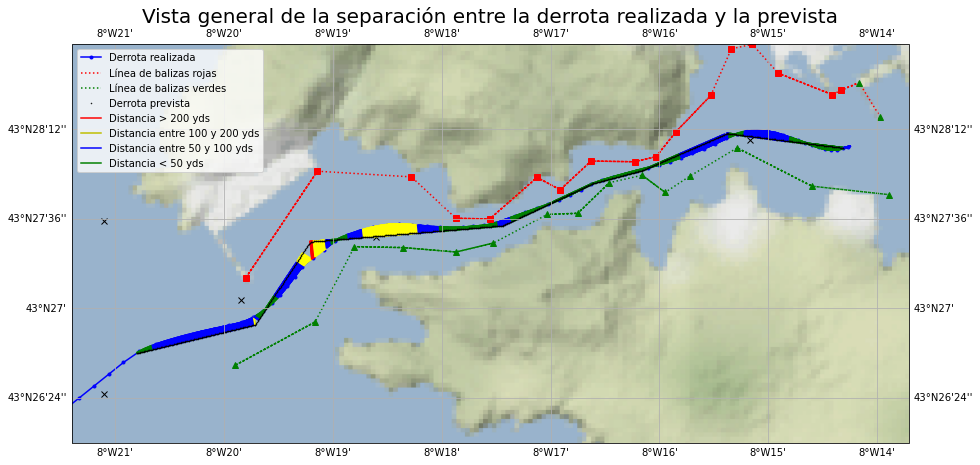

In [678]:
#Mostrar las distancias de los tramos evaluados al eje.
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(derrota_gen_df["Longitud"])-0.01, np.max(derrota_gen_df["Longitud"])+0.01, 
               np.min(derrota_gen_df["Latitud"])-0.01, np.max(derrota_gen_df["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)

plt.plot(track_gen_df_1["Longitud"], track_gen_df_1["Latitud"],"b.-", markersize=6, transform=ccrs.PlateCarree(),label="Derrota realizada")  
plt.plot(waypoints_df["Longitud"], waypoints_df["Latitud"],"kx",transform=ccrs.PlateCarree())

plt.title ("Vista general de la separación entre la derrota realizada y la prevista",fontsize=20)

for clave in track_tramos:
    if int(clave[1:]) not in tramos_no_evaluados:
        for i in range(len(track_tramos[clave])):
            colores=["green","blue", "yellow","red"]
            clr=""
            if track_tramos[clave]["Distancias"][i] > 200:
                clr=colores[3]
            elif 100 < track_tramos[clave]["Distancias"][i] <= 200:
                clr=colores[2]
            elif 50 < track_tramos[clave]["Distancias"][i] <= 100:
                clr=colores[1]
            else: clr=colores[0]

            plt.plot([track_tramos[clave]["Longitud"][i], track_tramos[clave]["x_p"][i]], 
                     [track_tramos[clave]["Latitud"][i], track_tramos[clave]["y_p"][i]],
                     color=clr, linestyle=("-"), linewidth=2, marker='', markersize=4,transform=ccrs.PlateCarree())
            
plt.plot(baliza_r_gen_df["Longitud"], baliza_r_gen_df["Latitud"],'r:',transform=ccrs.PlateCarree(),label="Línea de balizas rojas")
plt.plot(baliza_v_gen_df["Longitud"], baliza_v_gen_df["Latitud"],'g:',transform=ccrs.PlateCarree(),label="Línea de balizas verdes")

plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())

plt.plot(derrota_gen_df["Longitud"], derrota_gen_df["Latitud"],"k.", markersize=1,transform=ccrs.PlateCarree(),label="Derrota prevista")

plt.plot(0, 0,"r-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia > 200 yds")
plt.plot(0, 0,"y-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia entre 100 y 200 yds")
plt.plot(0, 0,"b-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia entre 50 y 100 yds")
plt.plot(0, 0,"g-", markersize=2,transform=ccrs.PlateCarree(),label="Distancia < 50 yds")

plt.legend(loc='best',fontsize=10) 

plt.show()

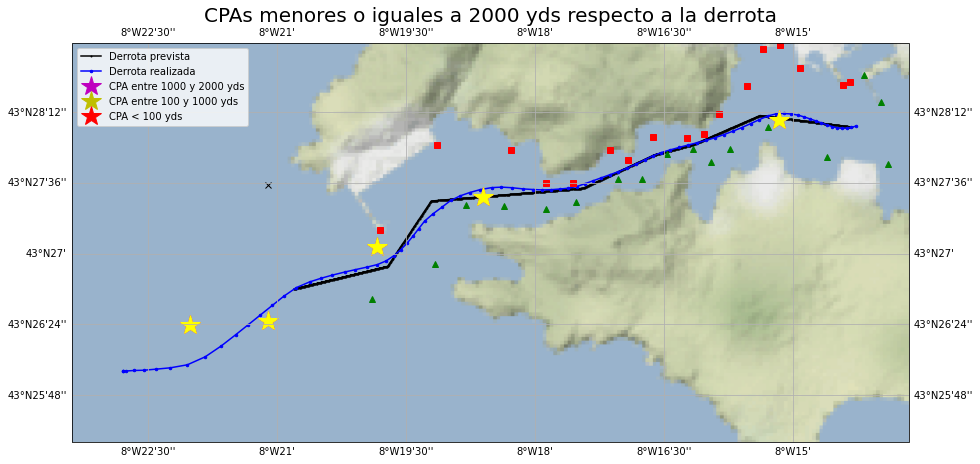

In [679]:
#NUEV
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)

plt.title ("CPAs menores o iguales a 2000 yds respecto a la derrota",fontsize=20)

plt.plot(derrota_gen_df["Longitud"], derrota_gen_df["Latitud"],"k.-", markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.plot(track_gen_df_1["Longitud"], track_gen_df_1["Latitud"],"b.-", markersize=5, transform=ccrs.PlateCarree(),label="Derrota realizada")
plt.plot(waypoints_df["Longitud"], waypoints_df["Latitud"],"kx",transform=ccrs.PlateCarree())
plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())

for i in range(0,len(cpa_df)):
    if cpa_df["CPA"][i]<=2000 and cpa_df["Indice"][i]>0:
        plt.plot(cpa_df["Longitud"][i], cpa_df["Latitud"][i], cpa_df["Latitud_barco"][i],
                color="m", linestyle=(""), linewidth=3, marker='*', markersize=20,transform=ccrs.PlateCarree())
        
for i in range(0,len(cpa_df)):
    if cpa_df["CPA"][i]<1000 and cpa_df["Indice"][i]>0:
        plt.plot(cpa_df["Longitud"][i], cpa_df["Latitud"][i], cpa_df["Latitud_barco"][i],
                color="yellow", linestyle=(""), linewidth=3, marker='*', markersize=20,transform=ccrs.PlateCarree())
        
for i in range(0,len(cpa_df)):
    if cpa_df["CPA"][i]<100 and cpa_df["Indice"][i]>0:
        plt.plot(cpa_df["Longitud"][i], cpa_df["Latitud"][i], cpa_df["Latitud_barco"][i],
                color="r", linestyle=(""), linewidth=3, marker='*', markersize=20,transform=ccrs.PlateCarree())

plt.plot(0, 0,'m*', markersize=20,transform=ccrs.PlateCarree(),label="CPA entre 1000 y 2000 yds")
plt.plot(0, 0,'y*', markersize=20,transform=ccrs.PlateCarree(),label="CPA entre 100 y 1000 yds")
plt.plot(0, 0,'r*', markersize=20,transform=ccrs.PlateCarree(),label="CPA < 100 yds")

plt.legend(loc='best',fontsize=10) 
plt.show()

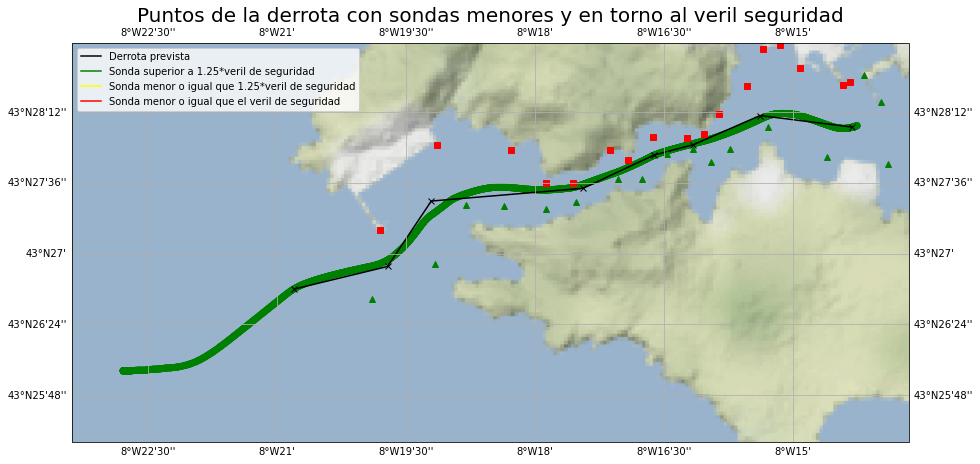

In [680]:
tiler = Stamen('terrain-background')
mercator = tiler.crs

fig = plt.figure(figsize=(15, 15))
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([np.min(datos_sim["Longitud"])-0.01, np.max(datos_sim["Longitud"])+0.01, 
               np.min(datos_sim["Latitud"])-0.01, np.max(datos_sim["Latitud"])+0.01])
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.add_feature(cf.OCEAN)
ax.add_image(tiler, 11)
plt.title ("Puntos de la derrota con sondas menores y en torno al veril seguridad",fontsize=20)


plt.scatter(sondas_df["Longitud"], sondas_df["Latitud"],c=sondas_df["color_veril"],transform=ccrs.PlateCarree())
plt.scatter(sondas_df["Longitud"], sondas_df["Latitud"],c=sondas_df["color_veril_25"],transform=ccrs.PlateCarree())

plt.plot(x_derrota, y_derrota,'kx-',transform=ccrs.PlateCarree())
plt.plot(rojas_df["Longitud"], rojas_df["Latitud"],'rs',transform=ccrs.PlateCarree())
plt.plot(verdes_df["Longitud"], verdes_df["Latitud"],'g^',transform=ccrs.PlateCarree())

plt.plot(0, 0,"k-", markersize=2,transform=ccrs.PlateCarree(),label="Derrota prevista")
plt.plot(0, 0,"g", markersize=2,transform=ccrs.PlateCarree(),label="Sonda superior a 1.25*veril de seguridad")
plt.plot(0, 0,"yellow", markersize=2,transform=ccrs.PlateCarree(),label="Sonda menor o igual que 1.25*veril de seguridad")
plt.plot(0, 0,"r", markersize=2,transform=ccrs.PlateCarree(),label="Sonda menor o igual que el veril de seguridad")
plt.legend(loc='best',fontsize=10) 

plt.show()